# Analysis of Global Compact COP reports

For this analysis we download from [here](https://www.unglobalcompact.org/participation/report/cop/create-and-submit/active) all COP reports submitted up to 2018. We only take into account the reports submitted in English.

Please specify below the focus year of this analysis. It will be consider as the end point of historical analyses, as well as the year for annual analyses.

In [1]:
focus_year = "2018"

Please select the focus language using one of the following values:
- en (English, default option)
- de (German)
- es (Spanish)
- fr (French)
- pt (Portuguese)

In [2]:
focus_language = 'en'

In [3]:
language_ref = { 'en' : { 'name' : 'English', 'min_coocurrence' : 10},
                 'de' : { 'name' : 'German', 'min_coocurrence' : 2},
                 'es' : { 'name' : 'Spanish', 'min_coocurrence' : 2},
                 'fr' : { 'name' : 'French', 'min_coocurrence' : 2},
                 'pt' : { 'name' : 'Portuguese', 'min_coocurrence' : 2},
               }

## 1. Gathering information about COP reports available from the UN Global Compact website
The [UN Global Compact website](https://www.unglobalcompact.org/participation/report/cop/create-and-submit/active) contains entries for each COP report, describing the sector of the company submitting the report, country and year, as well as the language in which the repoort was written in and a link to a PDF file with the full report.

**The results in this section give a general view of the available COPs, it's not yet restricted by the focus_year and focus_language.**

In [4]:
import requests
import re
from bs4 import BeautifulSoup

gc_url = "https://www.unglobalcompact.org/participation/report/cop/create-and-submit/active?page=1&per_page=10"
gc_base_url = "https://www.unglobalcompact.org"

gc_home = requests.get(gc_url)

soup = BeautifulSoup(gc_home.content, 'lxml')

header = soup.h2.string

total_num_cops = re.search(r'(?<=: )[0-9]+', header)[0]
print("Total number of COPs available: %s" % total_num_cops)

Total number of COPs available: 38663


In [7]:
full_gc_url = "https://www.unglobalcompact.org/participation/report/cop/create-and-submit/active?page=1&per_page=" + total_num_cops

print("Getting full list of reports ...")
gc_full_list = requests.get(full_gc_url)

gc_full_list_soup = BeautifulSoup(gc_full_list.content, 'lxml')

Getting full list of reports ...


In [8]:
def check_sdgs_3_13(profile): #checks in SDGs 3 and 13 are selected
    has_sdg3 = "no"
    has_sdg13 = "no"
    questions = profile.find_all("ul", class_='questionnaire')
    if len(questions) == 2:
        sdgs = questions[0].find_all("li")
        if len(sdgs) != 18:  # the correct SDG questionnaire has 17 questions + header
            temp_sdgs = questions[1].find_all("li")
            if len(temp_sdgs) == 18:
                sdgs = temp_sdgs
            else:
                sdgs = []
        if 'selected_question' in sdgs[3].get('class'):
            has_sdg3 = "yes"
        if 'selected_question' in sdgs[13].get('class'):
            has_sdg13 = "yes"
    return (has_sdg3, has_sdg13)

In [14]:
participants = gc_full_list_soup.tbody.find_all("tr")
pdfs = {}

num_pdfs = 0
num_nonpdfs = 0
num_noreport = 0

langregex = re.compile(r'(?<=\()[^\)\(]+(?=\)$)')

print("Getting details of each report ...")
for participant in participants:
    cells = participant.find_all('td')
    sector = cells[1].get_text(strip=True)
    country = cells[2].get_text(strip=True)
    year = cells[3].get_text(strip=True)

    participant_entry_url = gc_base_url + cells[0].a.get('href')
    try:
        participant_profile = requests.get(participant_entry_url)
        participant_profile_soup = BeautifulSoup(participant_profile.content, 'lxml')

        (participant_sdgs_3, participant_sdgs_13) = check_sdgs_3_13(participant_profile_soup)

        main_body = participant_profile_soup.find("section", class_='main-content-body')
        list_items = main_body.find_all("li")
        found_report = False

        for li in list_items:
            if li.a:
                link = li.a.get('href')
                if "/system/attachments/" in link:
                    if ".pdf" in link:
                        num_pdfs += 1
                        language = langregex.search(li.get_text(strip=True))[0]
                        pdfs[link] = { "sector" : sector, "country" : country, "year" : year, "language" : language, "sdgs3" : participant_sdgs_3, "sdgs13" : participant_sdgs_13}
                        print(".", end='')
                    else:
                        num_nonpdfs += 1
                        found_report = True                   
        if not found_report:
            num_noreport += 1
    
    except requests.exceptions.SysCallError:
        pass
        
print(" done.")
print("PDFs: %d, non-PDFs: %d, no-report: %d" % (num_pdfs, num_nonpdfs, num_noreport))

Getting details of each report ...
.....................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................................

**Saving index of reports so that it can be reused**

In [ ]:
import pandas as pd

reports_index_csv_filename = "../data/cops/reports_index_new.csv"

df_pdfs = pd.DataFrame.from_dict(pdfs, orient='index')
df_pdfs.to_csv(reports_index_csv_filename, sep='\t', encoding='utf-8')

---
**Possible starting point**: This can be used when an index file is available (has been saved previously). Only run this cell if starting from this point, otherwise skip it. 

In [5]:
import pandas as pd

reports_index_csv_filename = "../data/cops/reports_index_new.csv"

df_pdfs = pd.read_csv(reports_index_csv_filename, sep='\t', encoding='utf-8', index_col=0, dtype={'year': object})
pdfs = df_pdfs.to_dict(orient='index')

---

In [7]:
countries = {}
sectors = {}
years = {}
languages = {}
sdgs3 = 0
sdgs13 = 0
sdgs3_13 = 0

for pdf in pdfs.keys():
    language = pdfs[pdf]["language"]
    year = pdfs[pdf]["year"]
    country = pdfs[pdf]["country"]
    sector = pdfs[pdf]["sector"]
    sdg3 = pdfs[pdf]["sdgs3"]
    sdg13 = pdfs[pdf]["sdgs13"]

    sectors[sector] = sectors.get(sector,0) + 1
    countries[country] = countries.get(country,0) + 1
    years[year] = years.get(year,0) + 1
    languages[language] = languages.get(language,0) + 1    
    if sdg3 == "yes":
        sdgs3 += 1
    if sdg13 == "yes":
        sdgs13 += 1
    if sdg3 == "yes" and sdg13 == "yes":
        sdgs3_13 += 1

In [8]:
print("Number of reports that include SDG 3 or SDG 13 or both: %d, %d, %d respectively" % (sdgs3, sdgs13, sdgs3_13))

Number of reports that include SDG 3 or SDG 13 or both: 7224, 6643, 4805 respectively


In [9]:
df_languages = pd.DataFrame(sorted(languages.items(), key=lambda k: k[1], reverse=True), columns=["Language", "Number of reports"])
df_languages

,Language,Number of reports
0,English,18504
1,Spanish,9709
2,French,3738
3,Portuguese,1496
4,German,1091
5,Japanese,937
6,Korean,466
7,Chinese-Mandarin,374
8,Turkish,296
9,Italian,249


In [10]:
df_countries = pd.DataFrame(sorted(countries.items(), key=lambda k: k[1], reverse=True), columns=["Country", "Number of reports"])
df_countries

,Country,Number of reports
0,Spain,4963
1,France,4530
2,Brazil,1781
3,Japan,1734
4,Germany,1731
5,Denmark,1682
6,Mexico,1555
7,Colombia,1410
8,United State...,1297
9,Sweden,1093


In [11]:
df_sectors = pd.DataFrame(sorted(sectors.items(), key=lambda k: k[1], reverse=True), columns=["Sector", "Number of reports"])
df_sectors

,Sector,Number of reports
0,Support Services,5433
1,General Industrials,2863
2,Construction & Materials,2539
3,Financial Services,2416
4,Software & Computer Services,1771
5,Food Producers,1757
6,General Retailers,1318
7,Electronic & Electrical Equ...,1253
8,Media,1167
9,Travel & Leisure,998


In [12]:
df_years = pd.DataFrame(sorted(years.items(), reverse=True), columns=["Year", "Number of reports"])
df_years

,Year,Number of reports
0,2019,1134
1,2018,5490
2,2017,5602
3,2016,5299
4,2015,5182
5,2014,4582
6,2013,4561
7,2012,3811
8,2011,2564
9,2010,1


## 2. Selecting COP reports that match required criteria (up to focus_year, written in focus_language)


In [6]:
selected_sectors = {}
selected_countries = {}
selected_years = {}
selected_countries_years = {}

selected_pdfs = {}

for pdf in pdfs.keys():
    language = pdfs[pdf]["language"]
    year = pdfs[pdf]["year"]
    country = pdfs[pdf]["country"]
    sector = pdfs[pdf]["sector"]

    if language == language_ref[focus_language]['name'] and int(year) <= int(focus_year):
        selected_pdfs[pdf] = pdfs[pdf]
        
        selected_sectors[sector] = selected_sectors.get(sector,0) + 1
        selected_countries[country] = selected_countries.get(country,0) + 1
        selected_years[year] = selected_years.get(year,0) + 1
        if country in selected_countries_years.keys():
            selected_countries_years[country][year] = selected_countries_years[country].get(year,0) + 1
        else:
            selected_countries_years[country] = {year : 1}

In [14]:
print("There are %d reports up to %s written in %s" % (len(selected_pdfs.keys()), focus_year, language_ref[focus_language]['name']))

There are 17896 reports up to 2018 written in English


In [15]:
df_selected_countries = pd.DataFrame(sorted(selected_countries.items(), key=lambda k: k[1], reverse=True), columns=["Country", "Number of reports"])
df_selected_countries

,Country,Number of reports
0,Denmark,1360
1,United State...,1226
2,France,1057
3,United Kingdom,1031
4,Sweden,890
5,Germany,815
6,Japan,746
7,India,615
8,Australia,460
9,Netherlands,452


In [16]:
df_selected_sectors = pd.DataFrame(sorted(selected_sectors.items(), key=lambda k: k[1], reverse=True), columns=["Sector", "Number of reports"])
df_selected_sectors

,Sector,Number of reports
0,Support Services,1994
1,General Industrials,1397
2,Financial Services,1293
3,Construction & Materials,1058
4,Software & Computer Services,698
5,Food Producers,690
6,Electronic & Electrical Equ...,678
7,Technology Hardware & Equip...,580
8,General Retailers,570
9,Chemicals,570


In [17]:
df_selected_years = pd.DataFrame(sorted(selected_years.items(), reverse=True), columns=["Year", "Number of reports"])
df_selected_years

,Year,Number of reports
0,2018,2670
1,2017,2662
2,2016,2653
3,2015,2452
4,2014,2261
5,2013,2141
6,2012,1774
7,2011,1276
8,2010,1
9,2009,1


## 3. Downloading PDF file for each COP report that matches required criteria
At this time we've only considered reports written in the focus language and submitted up to end of the focus year.

A folder should be specified as the location where PDFs will be downloaded to ('pdfs_folder' variable below).

If this process has been run before and some files are already available in the specified folder, they won't be downloaded again.

In [7]:
pdfs_folder = "/Volumes/M/pdfs/"

In [8]:
filenameregex = re.compile(r'(?<=/)[^$/]+(?=$)')

In [10]:
import PyPDF2
import shutil
import nltk
import os
#import os.path

try:
    os.stat(pdfs_folder)
except:
    os.mkdir(pdfs_folder) 

for pdf in selected_pdfs.keys():
    filename = pdfs_folder + filenameregex.search(pdf)[0]

    if not os.path.isfile(filename):
        print("Saving %s" % (filename))
        file = requests.get(gc_base_url + pdf, stream=True)
        try:
            with open(filename, 'wb') as out_file:
                shutil.copyfileobj(file.raw, out_file)
            del file
        except:
            print("Could not save %s" % (filename))
            continue
    else:
        print("Skipping %s, PDF already available in folder" % (filename))

Skipping /Volumes/M/pdfs/BUTECH-_COMMUNICATION_ON_PROGRESS-2011.pdf?1303481463, PDF already available in folder
Skipping /Volumes/M/pdfs/UNGC_COP_2011.pdf?1303705875, PDF already available in folder
Skipping /Volumes/M/pdfs/ubeon_-_GLOBAL_COMPACT_COP_2011.pdf?1303799951, PDF already available in folder
Skipping /Volumes/M/pdfs/TEVA_UNGC_Second_CommunicationonProgress_April201__final.pdf?1303803422, PDF already available in folder
Skipping /Volumes/M/pdfs/CEO_s_Letter_to_UNGC.pdf?1303804488, PDF already available in folder
Skipping /Volumes/M/pdfs/UN_Global_Compact_-_Anti-Corruption.pdf?1303804488, PDF already available in folder
Skipping /Volumes/M/pdfs/UN_Global_Compact_-_Environment.pdf?1303804488, PDF already available in folder
Skipping /Volumes/M/pdfs/UN_Global_Compact_-_Human_Rights.pdf?1303804488, PDF already available in folder
Skipping /Volumes/M/pdfs/UN_Global_Compact_-_Labour.pdf?1303804488, PDF already available in folder
Skipping /Volumes/M/pdfs/Agility_Code_of_Ethics.pdf?

Skipping /Volumes/M/pdfs/UNGC_Communication_on_Progress_2011_-_Final.docx.pdf?1320235211, PDF already available in folder
Skipping /Volumes/M/pdfs/Global_Compact_CoP11.pdf?1320237006, PDF already available in folder
Skipping /Volumes/M/pdfs/UNGC_RED.pdf?1320247402, PDF already available in folder
Skipping /Volumes/M/pdfs/cop_PTC_2010-11.pdf?1320300149, PDF already available in folder
Skipping /Volumes/M/pdfs/CSR_COPReport_2011_02112011.pdf?1320301891, PDF already available in folder
Skipping /Volumes/M/pdfs/COP_2011.pdf?1320319145, PDF already available in folder
Skipping /Volumes/M/pdfs/CliffordChance_2011CRReport.pdf?1320328742, PDF already available in folder
Skipping /Volumes/M/pdfs/Enbridge-2011-CSR-Report.pdf?1320353867, PDF already available in folder
Skipping /Volumes/M/pdfs/Informe_BRUGAL_2011.pdf?1320357695, PDF already available in folder
Skipping /Volumes/M/pdfs/2011_KR_Sustainability_Report.pdf?1320366397, PDF already available in folder
Skipping /Volumes/M/pdfs/COP_2011_B

Skipping /Volumes/M/pdfs/anua_report_by_AFCOPB_Director.pdf?1330376088, PDF already available in folder
Skipping /Volumes/M/pdfs/Sustainability_CSR_Report_Dentsu_2011_en_.pdf?1330391829, PDF already available in folder
Skipping /Volumes/M/pdfs/MRCB_CSR_3105.pdf?1330394589, PDF already available in folder
Skipping /Volumes/M/pdfs/UN_GLOBALCOMPACT_2012.pdf?1330418658, PDF already available in folder
Skipping /Volumes/M/pdfs/Communication_on_Progress_2011_NIRAS.pdf?1330430784, PDF already available in folder
Skipping /Volumes/M/pdfs/Novartis_Argentina_-_Communication_on_progress_-_2011_final.pdf?1330440862, PDF already available in folder
Skipping /Volumes/M/pdfs/FirmenichSustainabilityReport2011.pdf?1330446641, PDF already available in folder
Skipping /Volumes/M/pdfs/Reaffirmation_of_FPPS.pdf?1330486473, PDF already available in folder
Skipping /Volumes/M/pdfs/FPPS_COP_2011.pdf?1330486473, PDF already available in folder
Skipping /Volumes/M/pdfs/Basic_COP_2012.pdf?1330514402, PDF already

Skipping /Volumes/M/pdfs/2011-2012_LGE_Sustainability_Report_English.pdf?1340092013, PDF already available in folder
Skipping /Volumes/M/pdfs/COP_2012_final.pdf?1340136750, PDF already available in folder
Skipping /Volumes/M/pdfs/Sustainability_Value_Report_2012.pdf?1340158446, PDF already available in folder
Skipping /Volumes/M/pdfs/FINAL_f2010_Report.pdf?1340163432, PDF already available in folder
Skipping /Volumes/M/pdfs/FY2010_UNGC_Index.pdf?1340163432, PDF already available in folder
Skipping /Volumes/M/pdfs/Annual_Report_2011.pdf?1340177526, PDF already available in folder
Skipping /Volumes/M/pdfs/COP_2011_Borima.pdf?1340179392, PDF already available in folder
Skipping /Volumes/M/pdfs/SNCB_CSR_report_2011.pdf?1340181463, PDF already available in folder
Skipping /Volumes/M/pdfs/RelContas11_ENG.pdf?1340186732, PDF already available in folder
Skipping /Volumes/M/pdfs/Memoria.CSR.TextiSantanderina.ing.2011.pdf?1340189088, PDF already available in folder
Skipping /Volumes/M/pdfs/2011E

Skipping /Volumes/M/pdfs/Communication-on-Progress.04.12.pdf?1354654407, PDF already available in folder
Skipping /Volumes/M/pdfs/COP_Update_Letter_2012.pdf?1354658678, PDF already available in folder
Skipping /Volumes/M/pdfs/GPC_COP_10_Principles_December_2012V2.pdf?1354658678, PDF already available in folder
Skipping /Volumes/M/pdfs/Sustainability_Report_2012.pdf?1354669045, PDF already available in folder
Skipping /Volumes/M/pdfs/Sustainability_Report_2012_final.pdf?1354675902, PDF already available in folder
Skipping /Volumes/M/pdfs/CCL_COP_Report_Final.pdf?1354684102, PDF already available in folder
Skipping /Volumes/M/pdfs/gec_cop_2011_031212.pdf?1354699045, PDF already available in folder
Skipping /Volumes/M/pdfs/Lectrus_UN_Global_Compact_COP_Oct_11-Sep_12.pdf?1354745736, PDF already available in folder
Skipping /Volumes/M/pdfs/annual_140.pdf?1354840232, PDF already available in folder
Skipping /Volumes/M/pdfs/30033_Independent_CSR_Report.pdf?1354840975, PDF already available in

Skipping /Volumes/M/pdfs/GMC_s_2012_COP_Report._Part_II_.pdf?1367840919, PDF already available in folder
Skipping /Volumes/M/pdfs/GMC_s_2012_COP_Report._Part_III_.pdf?1367841037, PDF already available in folder
Skipping /Volumes/M/pdfs/COP-Global.pdf?1367849839, PDF already available in folder
Skipping /Volumes/M/pdfs/COP-2.pdf?1367849839, PDF already available in folder
Skipping /Volumes/M/pdfs/COP_Report_-_May_2013.pdf?1367881688, PDF already available in folder
Skipping /Volumes/M/pdfs/CoP_BIID.pdf?1367883895, PDF already available in folder
Skipping /Volumes/M/pdfs/2013_UN_Global_Compact_Communication_on_Progress__COP_.pdf?1367898864, PDF already available in folder
Skipping /Volumes/M/pdfs/sustainability_report_2012_screenview.pdf?1367911903, PDF already available in folder
Skipping /Volumes/M/pdfs/UN_GLOBAL_COMPACT_COP_May_2013.pdf?1367914447, PDF already available in folder
Skipping /Volumes/M/pdfs/CSR_report.pdf?1367921408, PDF already available in folder
Skipping /Volumes/M/pd

Skipping /Volumes/M/pdfs/Communication%20on%20progress%202013%20Corio%20N.V..pdf?1376991254, PDF already available in folder
Skipping /Volumes/M/pdfs/Communication%20on%20Progress%202012%20-%20Komercijalna%20Banka%20AD%20Skopje.pdf?1376997079, PDF already available in folder
Skipping /Volumes/M/pdfs/CSR%20REPORT%202013.pdf?1377003103, PDF already available in folder
Skipping /Volumes/M/pdfs/UNGC%20Musgrave%20COP%202013%20FINAL%20200813.pdf?1377006117, PDF already available in folder
Skipping /Volumes/M/pdfs/UNGC_COP-reportNeosysLtd_2013.pdf?1377030944, PDF already available in folder
Skipping /Volumes/M/pdfs/Grupo%20Libra%20Annual%20and%20Sustainability%20Report%202012%20COP.pdf?1377030963, PDF already available in folder
Skipping /Volumes/M/pdfs/ClasOhlson_CSR_Report_2012_2013.pdf?1377066076, PDF already available in folder
Skipping /Volumes/M/pdfs/TSKB%20COP%20Report%202013.pdf?1377084971, PDF already available in folder
Skipping /Volumes/M/pdfs/COP%202013.pdf?1377093292, PDF already

Skipping /Volumes/M/pdfs/COP_Main_2014.pdf?1392138905, PDF already available in folder
Skipping /Volumes/M/pdfs/Impact_International_UNGC_COP_2013.pdf?1392158226, PDF already available in folder
Skipping /Volumes/M/pdfs/UN_GLOBAL_COMPACT_COP-1-1.pdf?1392202831, PDF already available in folder
Skipping /Volumes/M/pdfs/COP_2014.pdf?1392237685, PDF already available in folder
Skipping /Volumes/M/pdfs/SUSTAINABILITY_REPORT_2012_HiRes.pdf?1392275835, PDF already available in folder
Skipping /Volumes/M/pdfs/UN_COP_2013.pdf?1392294196, PDF already available in folder
Skipping /Volumes/M/pdfs/On_Our_shoulders_2013.pdf?1392299706, PDF already available in folder
Skipping /Volumes/M/pdfs/UN_Global_Compact__COP_for_2013.pdf?1392300435, PDF already available in folder
Skipping /Volumes/M/pdfs/Informe_de_Progreso_Telef%C3%B3nica_Nicaragua_2012.pdf?1392305506, PDF already available in folder
Skipping /Volumes/M/pdfs/RobecoSAM_GlobalCompact_CommunicationOnProgress2014_Complete.pdf?1392311470, PDF alr

Skipping /Volumes/M/pdfs/BCD_Travel_COP_2011.pdf?1298065940, PDF already available in folder
Skipping /Volumes/M/pdfs/2011_Communication_on_Progress.pdf?1298395257, PDF already available in folder
Skipping /Volumes/M/pdfs/COP1.pdf?1298451777, PDF already available in folder
Skipping /Volumes/M/pdfs/COP2.pdf?1298451899, PDF already available in folder
Skipping /Volumes/M/pdfs/COP1.pdf?1298452044, PDF already available in folder
Skipping /Volumes/M/pdfs/COP2.pdf?1298452044, PDF already available in folder
Skipping /Volumes/M/pdfs/COP3.pdf?1298452044, PDF already available in folder
Skipping /Volumes/M/pdfs/Energo_-_Izvjesce_o_drustveno_odgovornom_poslovanju_2008_god..pdf?1298548597, PDF already available in folder
Skipping /Volumes/M/pdfs/DSV_Progress_report_to_Global_Compact_2010.pdf?1298557140, PDF already available in folder
Skipping /Volumes/M/pdfs/CR_Report_2010_FINAL.pdf?1298566431, PDF already available in folder
Skipping /Volumes/M/pdfs/Ernst_Young_UNGC_COP_2010-11.pdf?1298571750

Could not save /Volumes/M/pdfs/Global_Compact_All_Languages-%E0%B8%9B%E0%B8%A3%E0%B8%B0%E0%B8%81%E0%B8%B2%E0%B8%A8%E0%B8%AA%E0%B8%99%E0%B8%B1%E0%B8%9A%E0%B8%AA%E0%B8%99%E0%B8%B8%E0%B8%99%E0%B8%AB%E0%B8%A5%E0%B8%B1%E0%B8%81%E0%B8%81%E0%B8%B2%E0%B8%A3%E0%B8%82%E0%B8%AD%E0%B8%87_Global_Compact-%E6%94%AF%E6%8C%81%E5%85%A8%E7%90%83%E5%A5%91%E7%BA%A6%E5%8E%9F%E5%88%99%E5%A3%B0%E6%98%8E_%282%29.pdf?1409180292
Skipping /Volumes/M/pdfs/0820_%E3%82%B7%E3%83%81%E3%82%BA%E3%83%B3%E6%A7%98_CSRReport2014%E8%A6%8B%E9%96%8B%E3%81%8D.pdf?1409208930, PDF already available in folder
Skipping /Volumes/M/pdfs/BSD_SustainabilityReport_2013.pdf?1409217197, PDF already available in folder
Skipping /Volumes/M/pdfs/2014.01.31_Annual_report_2013_12-27204.pdf?1409218264, PDF already available in folder
Skipping /Volumes/M/pdfs/August_2014_COP.pdf?1409218316, PDF already available in folder
Skipping /Volumes/M/pdfs/CSR-rapportUK_2014_ny.pdf?1409222459, PDF already available in folder
Skipping /Volumes/M/pdfs/APCO_

Skipping /Volumes/M/pdfs/UN_Global_Compact_Progress_1214.pdf?1418075412, PDF already available in folder
Skipping /Volumes/M/pdfs/GMHelicopters_COP_December-2014.pdf?1418110886, PDF already available in folder
Skipping /Volumes/M/pdfs/Report_on_corporate_social_responsibility_progress_2013.pdf?1418113932, PDF already available in folder
Skipping /Volumes/M/pdfs/Annual_Communication_on_Progress_-_2014.pdf?1418118015, PDF already available in folder
Skipping /Volumes/M/pdfs/Global_Compact__AART_architects_2014.pdf?1418119202, PDF already available in folder
Skipping /Volumes/M/pdfs/Hikma_Communication_on_Progress_2013.pdf?1418131085, PDF already available in folder
Skipping /Volumes/M/pdfs/Global_Compact_COP_2014.pdf?1418134330, PDF already available in folder
Skipping /Volumes/M/pdfs/NGA_HR-_UN_Compact_Communications_on_Progress_2014.pdf?1418140694, PDF already available in folder
Skipping /Volumes/M/pdfs/kikkoman2014_COP.pdf?1418171358, PDF already available in folder
Skipping /Volumes

Skipping /Volumes/M/pdfs/Caso_LABFARVE.pdf?1421343525, PDF already available in folder
Skipping /Volumes/M/pdfs/Global_compact_1.pdf?1421343525, PDF already available in folder
Skipping /Volumes/M/pdfs/Communication_on_Progress_2013.pdf?1421351848, PDF already available in folder
Skipping /Volumes/M/pdfs/AQ_Electric_Suzhou_-_COP_2014_with_Support_Letter.pdf?1421389882, PDF already available in folder
Skipping /Volumes/M/pdfs/mcs_K_R_COP_to_the_Global_Compact_-2015_-V_1.0.pdf?1421403263, PDF already available in folder
Skipping /Volumes/M/pdfs/Global__Compact_COP_2014.pdf?1421406642, PDF already available in folder
Skipping /Volumes/M/pdfs/Global__Compact_COP_2014.pdf?1421407596, PDF already available in folder
Skipping /Volumes/M/pdfs/Communication_on_Progress_2014.pdf?1421414670, PDF already available in folder
Skipping /Volumes/M/pdfs/LEM_Communication_on_Progress_2015.pdf?1421419722, PDF already available in folder
Skipping /Volumes/M/pdfs/Dan%C3%A6g_Presentation_UN2015.pdf?14214275

Skipping /Volumes/M/pdfs/2015_Intercultura_Costa_Rica_communication_on_progress.pdf?1428609811, PDF already available in folder
Skipping /Volumes/M/pdfs/SMEC_Holdings_Ltd_Sustainability_Report_2014-2015.pdf?1428629634, PDF already available in folder
Skipping /Volumes/M/pdfs/Meda_Annual_Report_incl._Sustainability_Report_2014.pdf?1428652549, PDF already available in folder
Skipping /Volumes/M/pdfs/Sustainability_Report_2014.pdf?1428654683, PDF already available in folder
Skipping /Volumes/M/pdfs/Sustainability_Report_2014.pdf?1428655025, PDF already available in folder
Skipping /Volumes/M/pdfs/shell_sr14.pdf?1428658579, PDF already available in folder
Skipping /Volumes/M/pdfs/COP_Statement_2015.pdf?1428663587, PDF already available in folder
Skipping /Volumes/M/pdfs/COP_Statement_2015.pdf?1428663786, PDF already available in folder
Skipping /Volumes/M/pdfs/2014_COP_pdf.pdf?1428665788, PDF already available in folder
Skipping /Volumes/M/pdfs/2014_report_and_accounts.pdf?1428665788, PDF 

Skipping /Volumes/M/pdfs/2014_COP.pdf?1432838280, PDF already available in folder
Skipping /Volumes/M/pdfs/3M_2015_Sustainability_Report.pdf?1432840131, PDF already available in folder
Skipping /Volumes/M/pdfs/CSR2014Final.pdf?1432844059, PDF already available in folder
Skipping /Volumes/M/pdfs/COP-Iknow_LLC-28May2015.pdf?1432854103, PDF already available in folder
Skipping /Volumes/M/pdfs/COP_2014-2015_JSL_CSR.pdf?1432867334, PDF already available in folder
Skipping /Volumes/M/pdfs/Sustainability_Report_2014.pdf?1432879918, PDF already available in folder
Skipping /Volumes/M/pdfs/2015_2016_Statement_of_continued_support_by_the_CEO.pdf?1432892546, PDF already available in folder
Skipping /Volumes/M/pdfs/2015_2016_Communication_on_Progress.pdf?1432892546, PDF already available in folder
Skipping /Volumes/M/pdfs/Communication_on_progress_2015.pdf?1432893479, PDF already available in folder
Skipping /Volumes/M/pdfs/CSR_Chaya_-_english_version.pdf?1432895543, PDF already available in folde

Skipping /Volumes/M/pdfs/2014_LSIS_SR_ENG_web.pdf?1437722757, PDF already available in folder
Skipping /Volumes/M/pdfs/LH-sustainability-report-2015.pdf?1437728130, PDF already available in folder
Skipping /Volumes/M/pdfs/Canon_EMEA_-_UNGC_COP_2014_FINAL.pdf?1437731538, PDF already available in folder
Skipping /Volumes/M/pdfs/Salini_Impregilo_Sustainability_Report_2014_def.pdf?1437731556, PDF already available in folder
Skipping /Volumes/M/pdfs/Salini_Impregilo_Sustainability_Report_2014_def.pdf?1437731696, PDF already available in folder
Skipping /Volumes/M/pdfs/Salini_Impregilo_Sustainability_Report_2014_def.pdf?1437731799, PDF already available in folder
Skipping /Volumes/M/pdfs/CSR_report_new_2015.pdf?1437747921, PDF already available in folder
Skipping /Volumes/M/pdfs/Global_Citizenship_Report_2014.pdf?1437760749, PDF already available in folder
Skipping /Volumes/M/pdfs/Communication_on_Progress_-_2015.pdf?1437797544, PDF already available in folder
Skipping /Volumes/M/pdfs/Inform

Saving /Volumes/M/pdfs/MemSos_Bio_2014_EN_%281%29.pdf?1441617686
Saving /Volumes/M/pdfs/COP_UN-GC_2014_english.pdf?1441619435
Saving /Volumes/M/pdfs/ICT-Alliance-UN-Global-Compact-COP-2015.pdf?1441627118
Saving /Volumes/M/pdfs/Hrvatski_Telekom_2014_Sustainability_Report.pdf?1441628335
Saving /Volumes/M/pdfs/COP_SEP15.pdf?1441631337
Saving /Volumes/M/pdfs/VUB_GC_2014_CSR_REPORT_EN.pdf?1441632624
Saving /Volumes/M/pdfs/Office_Depot_COP2014.pdf?1441636275
Saving /Volumes/M/pdfs/UNGC_Communication_on_Progress_2015.pdf?1441639507
Saving /Volumes/M/pdfs/cop_2014_solidny_partner.pdf?1441646634
Saving /Volumes/M/pdfs/Reporte_de_Sustentabilidad_2015_Ingl%C3%A9s.pdf?1441648181
Saving /Volumes/M/pdfs/Genoma-Lab-Politica-Ambiental-Ingl%C3%A9s.pdf?1441648182
Saving /Volumes/M/pdfs/Pol%C3%ADtica_Anticorrupci%C3%B3n_en_Ingl%C3%A9s.pdf?1441648182
Saving /Volumes/M/pdfs/CoP_BeterBedHolding_2014.pdf?1441648226
Saving /Volumes/M/pdfs/Communication_on_Progress_2015.pdf?1441696230
Saving /Volumes/M/pdfs/Go

Saving /Volumes/M/pdfs/International_SOS_UNGC_-__Cover_letter.pdf?1442985433
Saving /Volumes/M/pdfs/CSR_report_2015.pdf?1442987739
Saving /Volumes/M/pdfs/2015_Communication_on_Progress.pdf?1442990761
Saving /Volumes/M/pdfs/GRI-Report-2014-Atlantic.pdf?1442995625
Saving /Volumes/M/pdfs/2015_Communication_on_Progress.pdf?1443000808
Saving /Volumes/M/pdfs/Letter_of_Commitment-23-09-2015.pdf?1443000817
Saving /Volumes/M/pdfs/COP_for_Jewel_Collection_Manufacturing_Co-2015.pdf?1443004943
Saving /Volumes/M/pdfs/COP_2015.pdf?1443005535
Saving /Volumes/M/pdfs/UNDC_COP_2014_SNT%281%29.pdf?1443006639
Saving /Volumes/M/pdfs/ModonGroup_COP-UNGC.pdf?1443006776
Saving /Volumes/M/pdfs/2013_Comprehensive_solutions_for_global_needs..pdf?1443033852
Saving /Volumes/M/pdfs/Solaris_Paper_Pty_Ltd_UNGC_COP_23_September_2014_-_23_September_2015.pdf?1443054424
Saving /Volumes/M/pdfs/YR2015_Korean_Air_Sustainability_Report.pdf?1443058297
Saving /Volumes/M/pdfs/Mahindra_Sustainability_Review_2014-15.pdf?144306876

Saving /Volumes/M/pdfs/AnnualReport_2015_Sustainability_E.pdf?1444358562
Saving /Volumes/M/pdfs/COP_-_2014.pdf?1444365535
Saving /Volumes/M/pdfs/LIXIL_Annual_Report_2015.pdf?1444365694
Saving /Volumes/M/pdfs/CSR_Report_2015%28E%29.pdf?1444368922
Saving /Volumes/M/pdfs/Communication_On_Progress_2015.pdf?1444369062
Saving /Volumes/M/pdfs/EIZO_2015.pdf?1444381308
Saving /Volumes/M/pdfs/bpost_UNGC_COP_2015_vf.pdf?1444382614
Saving /Volumes/M/pdfs/MARTUR-COP-2014.pdf?1444390921
Saving /Volumes/M/pdfs/LM_Wind_Power_COP_2014.pdf?1444392503
Saving /Volumes/M/pdfs/Amathus_Corporation_COP_2015.pdf?1444398902
Saving /Volumes/M/pdfs/Cielo_RS2014_EN_.pdf?1444402142
Saving /Volumes/M/pdfs/ECOFACT_UNGC_CoP_2015.pdf?1444403428
Saving /Volumes/M/pdfs/lopal-cop.pdf?1444486873
Saving /Volumes/M/pdfs/CSR_report_2015.pdf?1444489331
Saving /Volumes/M/pdfs/UNGC-151011-CoP_2015-Kiroyan_Partners-FINAL.pdf?1444540213
Saving /Volumes/M/pdfs/Transurban_Sustainability_Highlights_2015.pdf?1444620368
Saving /Volumes

Saving /Volumes/M/pdfs/20151019_Business_committment_CEO.pdf?1445853952
Saving /Volumes/M/pdfs/2014-15_COP_V1.5.pdf?1445863823
Saving /Volumes/M/pdfs/ECI-Telecom_Sustainability_Report_2014.pdf?1445865733
Saving /Volumes/M/pdfs/SR14_Final_web_version.pdf?1445908182
Saving /Volumes/M/pdfs/C_S_R_Report_October_2015.pdf?1445936640
Saving /Volumes/M/pdfs/Communication_on_Progress.pdf?1445946686
Saving /Volumes/M/pdfs/UNGC_COP_271015.pdf?1445957727
Saving /Volumes/M/pdfs/COP_Aye_Nyein_Thi_Tar.pdf?1445965304
Saving /Volumes/M/pdfs/LSCo_Global_Compact_COP_2015_FINAL.pdf?1445987099
Saving /Volumes/M/pdfs/APRIL_Group_Letter_of_Recommitment__CoP.pdf?1446016253
Saving /Volumes/M/pdfs/JULIE_SANDLAU_VIETNAM_COP_2015.pdf?1446023438
Saving /Volumes/M/pdfs/IT_Synergy-COP-2015.pdf?1446051206
Saving /Volumes/M/pdfs/2015-10-29%E5%86%8D%E6%AC%A1%E7%94%B3%E8%AF%B7.pdf?1446087346
Saving /Volumes/M/pdfs/151028_100-EN-0615_2105_UNGC_CoP_Cover_Letter.pdf?1446117763
Saving /Volumes/M/pdfs/fy15-navigational-index

Saving /Volumes/M/pdfs/Alstom_sustainability_and_CSR_report_2014_15.pdf?1447744097
Saving /Volumes/M/pdfs/COPUniversal_2015.pdf?1447752980
Saving /Volumes/M/pdfs/Xpera_UN_Global_Compact_letter___COP_16_November_2015.pdf?1447772077
Saving /Volumes/M/pdfs/COP-_2015.pdf?1447818973
Saving /Volumes/M/pdfs/Biomass_Group_Limited_-_COP_-_2015.pdf?1447824977
Saving /Volumes/M/pdfs/Sustainability_Report_2015_Eng.pdf?1447828719
Saving /Volumes/M/pdfs/AIAYU_COP_November_2015.pdf?1447837386
Saving /Volumes/M/pdfs/Gilat_Satcom_COP_2015-2016.pdf?1447839103
Saving /Volumes/M/pdfs/COP_GC_2015EN.pdf?1447844797
Saving /Volumes/M/pdfs/Symsoft_CSR_COP_2013_2014.pdf?1447845637
Saving /Volumes/M/pdfs/Sustainability_Report_2014.pdf?1447852794
Saving /Volumes/M/pdfs/Code_of_Conduct.pdf?1447852794
Saving /Volumes/M/pdfs/970-Cargotec_Annual_report_2014.pdf?1447852794
Saving /Volumes/M/pdfs/NRW.BANK_Communication_on_Progress_2015.pdf?1447865470
Saving /Volumes/M/pdfs/COP_2015_EN.pdf?1447886723
Saving /Volumes/M/p

Saving /Volumes/M/pdfs/COP-2015.pdf?1449539359
Saving /Volumes/M/pdfs/AR_express_2014_Final_Complete_protected.pdf?1449557095
Saving /Volumes/M/pdfs/TML_SR_2014-15_21Nov.pdf?1449565754
Saving /Volumes/M/pdfs/HBPS_Annual_Communication_on_prograss_2015.pdf?1449568605
Saving /Volumes/M/pdfs/Sun-International-Limited-IAR-2015.pdf?1449570702
Saving /Volumes/M/pdfs/BMW_Brilliance_Sustainability_Report_2014_ENG.pdf?1449583969
Saving /Volumes/M/pdfs/Hikma_COP_2014.pdf?1449584615
Saving /Volumes/M/pdfs/UN_Global_Compact_-_Communication_on_Progress.pdf?1449617030
Saving /Volumes/M/pdfs/Sustainability_Report_2014_ENG_%281%29.pdf?1449645878
Saving /Volumes/M/pdfs/Communication_on_progress_2015.pdf?1449646325
Saving /Volumes/M/pdfs/Barloworld_UNGC_COP_GRI_Aligned_December_2015.pdf?1449679349
Saving /Volumes/M/pdfs/2015-responsibility-report.pdf?1449680401
Saving /Volumes/M/pdfs/gx-gr15-un-global-compact.pdf?1449683312
Saving /Volumes/M/pdfs/gx-gr15-main-final-nov-V2.pdf?1449683312
Saving /Volumes/M

Saving /Volumes/M/pdfs/2014_COP_royalarcticline.pdf?1451400227
Saving /Volumes/M/pdfs/2015_UNGC_COP_TaeKwang.pdf?1451417584
Saving /Volumes/M/pdfs/Dangote_Group_COP.pdf?1451459016
Saving /Volumes/M/pdfs/Ingleby_CSR_Report_2014-15.pdf?1451465380
Saving /Volumes/M/pdfs/KARL_STORZ_Global_Compact_Communication-on-progress-report-2015-E.pdf?1451480740
Saving /Volumes/M/pdfs/UNGC_Report_December_30__2015.pdf?1451509925
Saving /Volumes/M/pdfs/Hub_COP_%282015%29.pdf?1451549641
Saving /Volumes/M/pdfs/DuWun_Oil_Mill's_COP_to_the_UN_Global_Compact.pdf?1451550415
Saving /Volumes/M/pdfs/UN_Global_Compact__2016.pdf?1451552351
Saving /Volumes/M/pdfs/DKG_GROUP_COP___CSR_Report_2015.pdf?1451557249
Saving /Volumes/M/pdfs/ungc_polaris__2015_COP.pdf?1451558026
Saving /Volumes/M/pdfs/NATPET_-_Commitment_on_Progress_-_COP_-2015.pdf?1451559821
Saving /Volumes/M/pdfs/Communication_on_progress_report_Societe_Generale__2014.pdf?1451562865
Saving /Volumes/M/pdfs/Saybolt_COP_and_Commitment_Letter_2015.pdf?1451568

Saving /Volumes/M/pdfs/2015_16_COP_UN_Global_Compact_DAFA.pdf?1453117326
Saving /Volumes/M/pdfs/Corporate_responsibility_report_2015_-_final.pdf?1453125763
Saving /Volumes/M/pdfs/COP_Esplanade_2016.pdf?1453126141
Saving /Volumes/M/pdfs/Communication_on_Progress_2015.pdf?1453135072
Saving /Volumes/M/pdfs/COP_Report.pdf?1453179693
Saving /Volumes/M/pdfs/bunhoi.pdf?1453184234
Saving /Volumes/M/pdfs/Business_Commitment_Letter-aamra_networks_ltd.pdf?1453194634
Saving /Volumes/M/pdfs/CSR_amended.pdf?1453194634
Saving /Volumes/M/pdfs/COP15_WAA.pdf?1453194682
Saving /Volumes/M/pdfs/CoP_2015_EN_HAWE_Hydraulik.pdf?1453211067
Saving /Volumes/M/pdfs/COP_IPIRANGA_2015_EN.pdf?1453221457
Saving /Volumes/M/pdfs/COP_Humanscale_2015.pdf?1453241306
Saving /Volumes/M/pdfs/2016_Communication_on_Progress.pdf?1453260695
Saving /Volumes/M/pdfs/Nihon_Kohden_CSR_Report_2015.pdf?1453271864
Saving /Volumes/M/pdfs/CherkasyEN.pdf?1454076638
Saving /Volumes/M/pdfs/shaftesbury_2015_data_report.pdf?1453290285
Saving /

Saving /Volumes/M/pdfs/UN_Global_Compact_2-3-16.pdf?1454527463
Saving /Volumes/M/pdfs/Communication_on_Progress_%28COP%29_to_the_UN_Global_Compact_Ingemann_Food_Nicaragua_January_2016...pdf?1454539415
Saving /Volumes/M/pdfs/Commitment_Letter_Global_Compact_Ingemann_Food_Nicaragua_February_2016...pdf?1454539415
Saving /Volumes/M/pdfs/COP__2016.2.pdf?1454551918
Saving /Volumes/M/pdfs/Datascrip_COP_2015.pdf?1454569880
Saving /Volumes/M/pdfs/2015_COP_LUCOBIT_AG.pdf?1454577581
Saving /Volumes/M/pdfs/Communication_on_progress_2016.1.pdf?1454584459
Saving /Volumes/M/pdfs/COP2016.pdf?1454592732
Saving /Volumes/M/pdfs/STRIX_UNGC_COP_20_January_2016_flattened.pdf?1454592827
Saving /Volumes/M/pdfs/KENYA_BIXA_LIMITED_COMMUNICATION_ON_PROGRESS_2016.pdf?1454610223
Saving /Volumes/M/pdfs/UNGC_COP_2015_FINAL.pdf?1454644722
Saving /Volumes/M/pdfs/Greenstone_-_UNGC_Communication_on_Progress_2015-16.pdf?1454664642
Saving /Volumes/M/pdfs/UK_sustainabilityreport_15_online.pdf?1454668984
Saving /Volumes/M/p

Saving /Volumes/M/pdfs/INFORME_-_PACTO_2015.pdf?1455834753
Saving /Volumes/M/pdfs/COP_Hitran_2015-2016.pdf?1455838866
Saving /Volumes/M/pdfs/COP_OIL_Global_Compact_2015.pdf?1455878649
Saving /Volumes/M/pdfs/HCO_COP_2016.pdf?1455892192
Saving /Volumes/M/pdfs/Sustainability_section_2013.pdf?1455893352
Saving /Volumes/M/pdfs/Sustainability_section_2014.pdf?1455893352
Saving /Volumes/M/pdfs/Sistema_JSFC_Sustainability_Report_2014.pdf?1455893546
Saving /Volumes/M/pdfs/MeetGreen%28R%29_CommunicationofProgress_010516.pdf?1455898303
Saving /Volumes/M/pdfs/HP_Global_Citizenship_Report_2003.pdf?1455899236
Saving /Volumes/M/pdfs/HP_Global_Citizenship_Report_2004.pdf?1455899542
Saving /Volumes/M/pdfs/hp2006gcreport_tcm_245_1357662.pdf?1455899988
Saving /Volumes/M/pdfs/hp_fy06_gcr.pdf?1455900154
Saving /Volumes/M/pdfs/hp_fy07_gcr_tcm_245_1357667.pdf?1455900574
Saving /Volumes/M/pdfs/08gcreport.pdf?1455900676
Saving /Volumes/M/pdfs/fy09_brochure.pdf?1455900781
Saving /Volumes/M/pdfs/HP2010GCR.pdf?14

Saving /Volumes/M/pdfs/M_2.3_Organization_an_dcompetence140227%281%29.pdf?1457013485
Saving /Volumes/M/pdfs/M_6.1_procedure_for_dealing_with_non-conformity.pdf?1457013485
Saving /Volumes/M/pdfs/2015_UNGC_Communication_on_Progress.pdf?1457018581
Saving /Volumes/M/pdfs/Girteka_Logistics_Communication_on_Progress.pdf?1457019268
Saving /Volumes/M/pdfs/COP_UN_Global_Compact.pdf?1457025798
Saving /Volumes/M/pdfs/sustainability-sr-report-2014.pdf?1457025799
Saving /Volumes/M/pdfs/20160229_Blue_Moon_UNGC_COP.pdf?1457026443
Saving /Volumes/M/pdfs/Statement_of_continued_support_and_COP_160304.pdf?1457079243
Saving /Volumes/M/pdfs/Sinoteel_CSR_Report_20144.pdf?1457084105
Saving /Volumes/M/pdfs/Hartmann_COP_report_2015.pdf?1457086282
Saving /Volumes/M/pdfs/Baisy_Oryx_Tours__Travel___Safaris_Ltd_COP_2016.pdf?1457089832
Saving /Volumes/M/pdfs/CR_Report_2015.pdf?1457091517
Saving /Volumes/M/pdfs/KEYRUS_RSE_2016.pdf?1457107891
Saving /Volumes/M/pdfs/NSG_Sustainbility_Report_2015_proof_8_low-res.pdf?14

Saving /Volumes/M/pdfs/Columbus_CSR_Report_2015_FINAL.pdf?1458224946
Saving /Volumes/M/pdfs/Cimbria_East_Africa_COP_2015.pdf?1458231063
Saving /Volumes/M/pdfs/Ooredoo_UNGC_Report_2015.pdf?1458233020
Saving /Volumes/M/pdfs/Global_Compact_COP_2015.pdf?1458233479
Saving /Volumes/M/pdfs/FEMSA_SR_2015.pdf?1458249836
Saving /Volumes/M/pdfs/KANEKA_csr_2015_E_GC.pdf?1458263989
Saving /Volumes/M/pdfs/COMUNICATION_IN_PROGRESS_IPKON_2015-16_%281%29.pdf?1458265877
Saving /Volumes/M/pdfs/COP_2014-15_final.pdf?1458279360
Saving /Volumes/M/pdfs/Communication_On_Progress_BSTAR_2016.pdf?1458286741
Saving /Volumes/M/pdfs/Communication_On_Progress_BStarGroup_2016.pdf?1458287508
Saving /Volumes/M/pdfs/Global_Compact_Report_2014.pdf?1458291836
Saving /Volumes/M/pdfs/Rezidor_RBReport_2015_FINAL.pdf?1458310538
Saving /Volumes/M/pdfs/Georg_Jensen_COP_REPORT_2nd_final_signed.pdf?1458311288
Saving /Volumes/M/pdfs/COP_CEB_2015_v1.pdf?1458311646
Saving /Volumes/M/pdfs/COP_March_2016.pdf?1458317005
Saving /Volumes

Saving /Volumes/M/pdfs/KSB_GB15_EN_gesamt_web.pdf?1459406495
Saving /Volumes/M/pdfs/Communication_on_Progress_for_2015.pdf?1459407059
Saving /Volumes/M/pdfs/Statement_of_Support_2015.pdf?1459407059
Saving /Volumes/M/pdfs/Annual_Report2015%28English%29.pdf?1459407855
Saving /Volumes/M/pdfs/ASSA_ABLOY_Sustainability_Report_2015.pdf?1459410406
Saving /Volumes/M/pdfs/ITG_Global_Compact_COP_2015_%2831March2016%29.pdf?1459413102
Saving /Volumes/M/pdfs/Konzern-CR-Bericht_2015_Engl.pdf?1459422621
Saving /Volumes/M/pdfs/CEO_Statement_Report_2015.pdf?1459422621
Saving /Volumes/M/pdfs/COP_overview_Report_2015.pdf?1459422621
Saving /Volumes/M/pdfs/GIV_2015_SustainabilityReport_%281%29.pdf?1459425083
Saving /Volumes/M/pdfs/Nordic_Social_Responsibility_Report_2015.pdf?1459427283
Saving /Volumes/M/pdfs/Business_Principles_Progress_Report_2015.pdf?1459430283
Saving /Volumes/M/pdfs/Sustainability_report_2015.pdf?1459430283
Saving /Volumes/M/pdfs/IPF_How_We_Implement_The_Global_Principles_Feb13.pdf?1459

Saving /Volumes/M/pdfs/Policy_1.1_Code_of_Conduct.pdf?1460704751
Saving /Volumes/M/pdfs/SN_Power_Group_Financial_Statements_2015_SIGNED.pdf?1460704751
Saving /Volumes/M/pdfs/SNP_Anti-corruption_brochure_sept-2014.pdf?1460704752
Saving /Volumes/M/pdfs/Berendsen_UNGC_Communication_on_Progress_2016.pdf?1460705724
Saving /Volumes/M/pdfs/COP_rap_2015.pdf?1460726930
Saving /Volumes/M/pdfs/BMW_SVR_2015_RZ_EN.pdf?1460727419
Saving /Volumes/M/pdfs/MEMORIA_DE_SOSTENIBILIDAD_EPMAPS_2015_EN_BAJA.pdf?1460727867
Saving /Volumes/M/pdfs/UNGC_COP_2015_Final_Highres_WOCM.pdf?1460730343
Saving /Volumes/M/pdfs/G4S_CSR_Report_2015.pdf?1460731537
Saving /Volumes/M/pdfs/UNGC_COP_2016_for_PPL.pdf?1460731722
Saving /Volumes/M/pdfs/UNIBAIL-RODAMCO_2015_RA_DD_DDR_UK_.pdf?1460732053
Saving /Volumes/M/pdfs/CEO_executive_statement_UN_Global_Compact_2015.pdf?1460732053
Saving /Volumes/M/pdfs/LV_UN_Global_Compact_2016.pdf?1460734449
Saving /Volumes/M/pdfs/Memoria_Global_compact_2015.pdf?1460751555
Saving /Volumes/M/p

Saving /Volumes/M/pdfs/COP_report_2016_Tofuture.pdf?1461917166
Saving /Volumes/M/pdfs/Merck_CR_Report_-_Update_2015.pdf?1461926824
Saving /Volumes/M/pdfs/2015_registration_document.pdf?1461928494
Saving /Volumes/M/pdfs/CoP_GLOBAL_COMPACT__2015_-2016_-_ACTE_International.pdf?1461931724
Saving /Volumes/M/pdfs/AUR_NB15_eng_final.pdf?1461938137
Saving /Volumes/M/pdfs/BELRON_Communication_on_Progress_April_2016.pdf?1461938514
Saving /Volumes/M/pdfs/HusqvarnaGroup_Sustainability_Report_2015.pdf?1461946237
Saving /Volumes/M/pdfs/COP_2015__-_OC_-_EN.pdf?1461949917
Saving /Volumes/M/pdfs/Informe_Anual_de_Sustentabilidad_Grupo_Financiero_Santander_M%C3%A9xico_2015.pdf?1461975185
Saving /Volumes/M/pdfs/COP_2016_brainbits_GmbH.pdf?1462014134
Saving /Volumes/M/pdfs/MOL-Group_Annual_Report_2015_EN.pdf?1462016405
Saving /Volumes/M/pdfs/annual_report_2015.pdf?1462040313
Saving /Volumes/M/pdfs/Sustainability_Report_2015.pdf?1462086380
Saving /Volumes/M/pdfs/Euromonitor_International_UN_Global_Compact_C

Saving /Volumes/M/pdfs/2015_UNGC_Communication_On_Progress_%28COP%29.pdf?1463368834
Saving /Volumes/M/pdfs/BIONAS_COP_Report_2015-2016.pdf?1463376544
Saving /Volumes/M/pdfs/Posti_Group_Sustainability_Report_2015.pdf?1463380767
Saving /Volumes/M/pdfs/Communication_on_Progress_EEC_2016.pdf?1463404341
Saving /Volumes/M/pdfs/2016-_UN_Global_Compact_Communication_On_Progress_2015-2016_v3.pdf?1463406862
Saving /Volumes/M/pdfs/2015_Registration_Document_Essilor.pdf?1463414119
Saving /Volumes/M/pdfs/alu_2015_sustainability_report.pdf?1463416888
Saving /Volumes/M/pdfs/COP_2016_BCD_Travel.pdf?1463421318
Saving /Volumes/M/pdfs/Letter_from_President.pdf?1463430865
Saving /Volumes/M/pdfs/Timberland_announces_2020_targets.pdf?1463430865
Saving /Volumes/M/pdfs/Communication_on_progress.pdf?1463450434
Saving /Volumes/M/pdfs/cop16.pdf?1463473472
Saving /Volumes/M/pdfs/Global_Compact_COP_2016_05_17.pdf?1463476780
Saving /Volumes/M/pdfs/UN_Global_Compact_-_COP_-_Elixim_2016.pdf?1463482492
Saving /Volumes

Saving /Volumes/M/pdfs/mcscopGCActiveApplicationUNGC.pdf?1464413333
Saving /Volumes/M/pdfs/Communication_on_Progress_-_Shwe_Taung_Group_-_January_-_December_2015.pdf?1464431715
Saving /Volumes/M/pdfs/Informe_Pacto_Global_2015_-_Centro_M%C3%A9dico_Paitilla.pdf?1464484287
Saving /Volumes/M/pdfs/Raya_COP_2015.pdf?1464524084
Saving /Volumes/M/pdfs/UN_Global_Compact_COP_Report_MS29052016.pdf?1464525296
Saving /Volumes/M/pdfs/Sustainability_Report_2015__EN.pdf?1464575527
Saving /Volumes/M/pdfs/COP_2015__Wenzel.pdf?1464589160
Saving /Volumes/M/pdfs/2015COP.pdf?1464599242
Saving /Volumes/M/pdfs/John_Keells_Holdings_PLC_Annual_Report_2015_16.pdf?1464613038
Saving /Volumes/M/pdfs/John_Keells_Holdings_PLC_-_DMA_section_AR_2015_16.pdf?1464613039
Saving /Volumes/M/pdfs/Cemig_2015_Annual_Report.pdf?1464621247
Saving /Volumes/M/pdfs/160513_UN_Global_Compact_Fortschrittsbericht_LGT_2015_EN_final.pdf?1464624644
Saving /Volumes/M/pdfs/Annual_Report_2015_Brasilprev.pdf?1464631124
Saving /Volumes/M/pdfs/I

Saving /Volumes/M/pdfs/ST_Sustainability_Report_2015.pdf?1465909733
Saving /Volumes/M/pdfs/Relat%C3%B3rio_de_Responsabilidade_Socioambiental_Neoenergia_Celpe_2015.pdf?1465932944
Saving /Volumes/M/pdfs/FMC-4813_2015_Sustainability_Report_Pages-HighRes.pdf?1465936964
Saving /Volumes/M/pdfs/Annual_Report_BM_FBOVESPA_2015.pdf?1465938098
Saving /Volumes/M/pdfs/Declaration_of_Support_fot_the_Global_Compact.pdf?1465937751
Saving /Volumes/M/pdfs/KRO_CSRB_2015_e_web_GS.pdf?1465973854
Saving /Volumes/M/pdfs/Sustainability_and_Global_Compact_2016.pdf?1465979159
Saving /Volumes/M/pdfs/Xylem_2015_Sustainability_report.pdf?1465981899
Saving /Volumes/M/pdfs/Philip_Morris_International_Communication_on_Progress_2015.pdf?1466005977
Saving /Volumes/M/pdfs/RelatorioFibria2015_EN.pdf?1466022125
Saving /Volumes/M/pdfs/Info2015_Clientes_EN.pdf?1466022125
Saving /Volumes/M/pdfs/Info2015_Comunidades_EN.pdf?1466022126
Saving /Volumes/M/pdfs/Info2015_Geral_EN.pdf?1466022126
Saving /Volumes/M/pdfs/Embraer_Annual

Saving /Volumes/M/pdfs/Athens_International_Airport_Corporate_Responsibility_Report_2015.pdf?1467214578
Saving /Volumes/M/pdfs/UN_COP_Letter_-_2016.pdf?1467214736
Saving /Volumes/M/pdfs/Communication_on_progress_report_2016.pdf?1467217436
Saving /Volumes/M/pdfs/181_49R_e.pdf?1467265719
Saving /Volumes/M/pdfs/PLASKE_Report_2015_EN.pdf?1467273218
Saving /Volumes/M/pdfs/PLH_Arkitekter_COP2016.pdf?1467273437
Saving /Volumes/M/pdfs/NOS_UNGlobalCompact_COP215_v2.0.pdf?1467277283
Saving /Volumes/M/pdfs/Statement_of_continued_support_by_the_CEO_2016_v2.0.pdf?1467277284
Saving /Volumes/M/pdfs/UN_Global_Compact_-_Burberry_Communication_on_Progress.pdf?1467280025
Saving /Volumes/M/pdfs/2016_Sustainability_Report.pdf?1467280494
Saving /Volumes/M/pdfs/Akfen_Holding_UN_Global_Compact_Report_2015.pdf?1467285666
Saving /Volumes/M/pdfs/OKQ8_Scandinavia_Sustainability_Report_2015-16_ENG.pdf?1467297714
Saving /Volumes/M/pdfs/Arabesque_UNGC_COP_2016_Final.pdf?1467302541
Saving /Volumes/M/pdfs/Cabot-Corpor

Saving /Volumes/M/pdfs/2016_UN_COP.pdf?1468427451
Saving /Volumes/M/pdfs/Kosmos_Energy_2015_Corporate_Responsibility_Report.pdf?1468431920
Saving /Volumes/M/pdfs/COP_16.pdf?1468438911
Saving /Volumes/M/pdfs/CoP_2016.pdf?1468447259
Saving /Volumes/M/pdfs/UN_Global_Compact_COP_for_Miyamoto_International-2016.pdf?1468450013
Saving /Volumes/M/pdfs/FY2015_%EC%A7%80%EC%86%8D%EA%B0%80%EB%8A%A5%EA%B2%BD%EC%98%81%EB%B3%B4%EA%B3%A0%EC%84%9C%28%EC%98%81%EB%AC%B8%29-Full.pdf?1468458954
Saving /Volumes/M/pdfs/SD-report-15-v.pdf?1468475983
Saving /Volumes/M/pdfs/2015_Sustainability_Report.pdf?1468481429
Saving /Volumes/M/pdfs/RZB_Group_Sustainability_Report_2015.pdf?1468490192
Saving /Volumes/M/pdfs/2015_csrreport.pdf?1468491089
Saving /Volumes/M/pdfs/Team_Relocations_United_Nations_Global_Compact_Communication_on_Progress_2016.pdf?1468505728
Saving /Volumes/M/pdfs/carta_readmision.pdf?1468508142
Saving /Volumes/M/pdfs/SRR_2015_Dalekovod_jsc.pdf?1468510186
Saving /Volumes/M/pdfs/Royal_Auping-Communi

Saving /Volumes/M/pdfs/Ekornes_COP_2016.pdf?1470033422
Saving /Volumes/M/pdfs/30_000_634_D_-_CSR_report_2015.pdf?1470034879
Saving /Volumes/M/pdfs/UNGC_Communication_on_Progress_from_ProData_Consult_2015-2016.pdf?1470043490
Saving /Volumes/M/pdfs/DS_Smith_Sustainability_Review_2016.pdf?1471598387
Saving /Volumes/M/pdfs/Baxx_Promotion_COP_report_2016.pdf?1470054876
Saving /Volumes/M/pdfs/Sustainability_Report_TIM_2015.pdf?1470076329
Saving /Volumes/M/pdfs/Framework_LLC_UNGC_COP_August_1_2016.pdf?1470085418
Saving /Volumes/M/pdfs/AVANCES_Y_RETOS_GRIMORUM_PACTO_GLOBAL_2015.pdf?1470086413
Saving /Volumes/M/pdfs/CSR2015_Final.pdf?1470092059
Saving /Volumes/M/pdfs/S-OIL_Sustainability_Report_2015_%EC%A0%80%EC%9A%A9%EB%9F%89.pdf?1470099736
Saving /Volumes/M/pdfs/UN_GC_Fortschrittsbericht_2016_en_Final.pdf?1470120325
Saving /Volumes/M/pdfs/Natra_-_Progress_Report_2015.pdf?1470122051
Saving /Volumes/M/pdfs/AASG'S_COP_2016.pdf?1470127090
Saving /Volumes/M/pdfs/UN_Report_2016.pdf?1470138993
Savin

Saving /Volumes/M/pdfs/Switch_Group_COP_AUGUST_2016.pdf?1472061602
Saving /Volumes/M/pdfs/Statement_of_continued_support_the_Global_Compact.pdf.pdf?1472075138
Saving /Volumes/M/pdfs/csr-e_report_2016.pdf?1472090824
Saving /Volumes/M/pdfs/2015_Sustainability_Report_EN_EDM_3%EA%B8%89_v0.2.pdf?1472091441
Saving /Volumes/M/pdfs/Indigo_-_2016_COP.pdf?1472099759
Saving /Volumes/M/pdfs/SustainabilityReport2015.pdf?1472117017
Saving /Volumes/M/pdfs/3508_001.pdf?1472123608
Saving /Volumes/M/pdfs/UNGC_COP_07032016-R1.pdf?1472123609
Saving /Volumes/M/pdfs/Banque_Libano-Fran%C3%A7aise_Letter_of_Commitment.pdf?1472135089
Saving /Volumes/M/pdfs/Banque_Libano-Fran%C3%A7aise_CSR_Report_2012-2013.pdf?1472135089
Saving /Volumes/M/pdfs/Communication_on_Progress_2016_creatrade_Holding.pdf?1472144634
Saving /Volumes/M/pdfs/ECI-Telecom-Sustainability-Report-2015.pdf?1472148817
Saving /Volumes/M/pdfs/COP_2016_final.pdf?1472153738
Saving /Volumes/M/pdfs/declara%C3%A7%C3%A3o_de_apoio_continuado.pdf?1472153739


Saving /Volumes/M/pdfs/CSRReport2016_EN.pdf?1473405743
Saving /Volumes/M/pdfs/CSRReport2016_EN_Databook.pdf?1473405743
Saving /Volumes/M/pdfs/Nimbus_COP_2016.pdf?1473405732
Saving /Volumes/M/pdfs/Communication_on_Progress_UNGC_2016.pdf?1473410025
Saving /Volumes/M/pdfs/UNGC_2016.pdf?1473410438
Saving /Volumes/M/pdfs/webcor_official_COP_2016.pdf?1473422517
Saving /Volumes/M/pdfs/COP_-_16.doc.pdf?1473479491
Saving /Volumes/M/pdfs/Continued_Support__-_16.pdf?1473479492
Saving /Volumes/M/pdfs/CSR_Details_-_16.pdf?1473479492
Saving /Volumes/M/pdfs/MDH_UNGC_COP_2015.pdf?1473496131
Saving /Volumes/M/pdfs/AR_Packaging_Sustainability_Report_2015.pdf?1473675193
Saving /Volumes/M/pdfs/Sustainability_Report_2015.pdf?1473679219
Saving /Volumes/M/pdfs/LindabSustainabilityReport2015.pdf?1473681137
Saving /Volumes/M/pdfs/2016_Communication_on_Progress_COPEL.pdf?1473687435
Saving /Volumes/M/pdfs/Renault_Trucks_COP_2015_EN.pdf?1473693021
Saving /Volumes/M/pdfs/2016_COP_cover_letter.pdf?1473714534
Saving

Saving /Volumes/M/pdfs/SUSTAINABILITY_REPORT_2015_NEINVER.pdf?1474626458
Saving /Volumes/M/pdfs/COP_2016_Bioelektra_Group.pdf?1474630042
Saving /Volumes/M/pdfs/sustainability_report_2015_burgbad.pdf?1474631798
Saving /Volumes/M/pdfs/relatorio-sustentabilidade-2015-ingles.pdf?1474634713
Saving /Volumes/M/pdfs/sabanciSR_eng.pdf?1474637014
Saving /Volumes/M/pdfs/SUSTAINABILITY_REPORT_NEPTUNE_LINES.pdf?1474644572
Saving /Volumes/M/pdfs/COP_Presentation_2016-FNL.pdf?1474654825
Saving /Volumes/M/pdfs/CSR2016_en_YOKOHAMA.pdf?1474709606
Saving /Volumes/M/pdfs/COP_2016.pdf?1474798029
Saving /Volumes/M/pdfs/Agrokor_Sustainability_Report_2014_15_ENG_web.pdf?1474828178
Saving /Volumes/M/pdfs/DESCENTE_CSR_REPORT_2016_eng.pdf?1474873163
Saving /Volumes/M/pdfs/JLL-Global_Sustainability_Report_2015_FINAL_DC.pdf?1474885520
Saving /Volumes/M/pdfs/CSR_report_on_2015_progress.pdf?1474886582
Saving /Volumes/M/pdfs/COP_for_Jewel_Collection_Manufacturing_Co_2016.pdf?1474888462
Saving /Volumes/M/pdfs/Sasini-2

Saving /Volumes/M/pdfs/MIP_Communication_on_Progress_2014.pdf?1475844120
Saving /Volumes/M/pdfs/COP_-_2015.pdf?1475904063
Saving /Volumes/M/pdfs/2015-16_Annual_Report_Final.pdf?1475921989
Saving /Volumes/M/pdfs/Gilat_Satcom_COP_2017.pdf?1476007067
Saving /Volumes/M/pdfs/Crescent_Enterprises_Sustainability_Report_2015.pdf?1476018865
Saving /Volumes/M/pdfs/ICDAS_2015_Sustainability_Report_ENG_2015.pdf?1476023541
Saving /Volumes/M/pdfs/ECOFACT_UNGC_CoP_2016.pdf?1476036191
Saving /Volumes/M/pdfs/YOMA_COP_2016.pdf?1476077538
Saving /Volumes/M/pdfs/SPA_COP_2016.pdf?1476078040
Saving /Volumes/M/pdfs/FMI_COP_2016.pdf?1476078458
Saving /Volumes/M/pdfs/Communication_on_Progress_-_Access_Oct_2016.pdf?1476086035
Saving /Volumes/M/pdfs/2015_CCI_SR_051016.pdf?1476086476
Saving /Volumes/M/pdfs/GSS_Sustainability_Report_2015.pdf?1476086776
Saving /Volumes/M/pdfs/Bertling_UNGC_COP_2016.pdf?1476087272
Saving /Volumes/M/pdfs/Liscombe_COP_Document_2016.pdf?1476088967
Saving /Volumes/M/pdfs/LOPAL-COP%E2%80

Saving /Volumes/M/pdfs/UNGC_COP_2016.pdf?1477469245
Saving /Volumes/M/pdfs/UN_COP_-_2016_%281%29.pdf?1477478777
Saving /Volumes/M/pdfs/Leumi_Report-English.pdf?1477480162
Saving /Volumes/M/pdfs/GEODIS_2015-2016_Communication_on_Progress_for_the_UN_Global_Compact_-_OCT2016.pdf?1477491039
Saving /Volumes/M/pdfs/UNGC_COP_FINAL.pdf?1477492170
Saving /Volumes/M/pdfs/LSCo_Global_Compact_COP_2016_FINAL.pdf?1477498391
Saving /Volumes/M/pdfs/Mahindra_Report_2015-16....pdf?1477554634
Saving /Volumes/M/pdfs/ChrHansenSustainabilityReport_COP2015-2016.pdf?1477558548
Saving /Volumes/M/pdfs/SkyPower_Global_Citizenship_Report_August2016_r.pdf?1477582965
Saving /Volumes/M/pdfs/Landmark_COP_2016.pdf?1477583820
Saving /Volumes/M/pdfs/infinera-sustainability-report-2015.pdf?1477589764
Saving /Volumes/M/pdfs/Letter_and_COP_2016.pdf?1477619984
Saving /Volumes/M/pdfs/JULIE_SANDLAU_VIETNAM_COP_2016.pdf?1477622398
Saving /Volumes/M/pdfs/2016_KR_SR_eng.pdf?1477629296
Saving /Volumes/M/pdfs/JAL_REPORT_2016.pdf?1

Saving /Volumes/M/pdfs/161109_Pyroll_Global_Compact_COP.pdf?1478709904
Saving /Volumes/M/pdfs/IFF_GRI_Report_053116_Final.pdf?1478728333
Saving /Volumes/M/pdfs/FE_Report_2016.pdf?1478752340
Saving /Volumes/M/pdfs/Tata_Motors_Sustainability_Report_2015-16-_Final.pdf?1478775714
Saving /Volumes/M/pdfs/AK-K%C4%B0M_2014-_2015_SUSTAINABILITY_REPORT.pdf?1478784491
Saving /Volumes/M/pdfs/Web_TA_NHB15_16_engl.pdf?1478785138
Saving /Volumes/M/pdfs/AP_Services_2016_COP.pdf?1478786948
Saving /Volumes/M/pdfs/Agrium_UNGC_2015_Progress_report_final_signed.pdf?1478806574
Saving /Volumes/M/pdfs/2014-15_Sust_Rpt_online.pdf?1478806575
Saving /Volumes/M/pdfs/UN_Global_Compact_Reaffirm_Support_Letter.pdf?1478817791
Saving /Volumes/M/pdfs/SR16_E_All.pdf?1478836228
Saving /Volumes/M/pdfs/20161111_082747.pdf?1478850379
Saving /Volumes/M/pdfs/COP_Hagemeyer_Deutschland_2016.pdf?1478853215
Saving /Volumes/M/pdfs/MemoriaOSSA_RSC_2015ingles.pdf?1478857865
Saving /Volumes/M/pdfs/2016_UN_Global_compact.pdf?147885883

Saving /Volumes/M/pdfs/sr2016_all.pdf?1480495197
Saving /Volumes/M/pdfs/2016_FKG_SCR_Annual_Report.pdf?1480472309
Saving /Volumes/M/pdfs/Statement_by_CEO.pdf?1480484113
Saving /Volumes/M/pdfs/BASE_Technologies_COP_2016_UN_GLOBAL_COMPACT.pdf?1480484113
Saving /Volumes/M/pdfs/DC_CSR_Rapport_2015_16_spreads.pdf?1480498563
Saving /Volumes/M/pdfs/CoP_for_GC_2016.pdf?1480498621
Saving /Volumes/M/pdfs/BSC_UNGC_COP_2016.pdf?1480504179
Saving /Volumes/M/pdfs/COP_2016.pdf?1480507075
Saving /Volumes/M/pdfs/4C_Strategies_Communication_on_Progress_2015.pdf?1480516944
Saving /Volumes/M/pdfs/4C_Strategies_Communication_on_Progress_2016.pdf?1480517068
Saving /Volumes/M/pdfs/BAM_Letter_of_Committment_and_COP__Nov_2016_v1.pdf?1480528390
Saving /Volumes/M/pdfs/RA_Klabin_2015_eng.pdf?1480534662
Saving /Volumes/M/pdfs/Ushio_Sustainability_report_2016.pdf?1480573092
Saving /Volumes/M/pdfs/GC_2016_en.pdf?1480578548
Saving /Volumes/M/pdfs/UN_Global_Compact_COP_December_2016.pdf?1480580223
Saving /Volumes/M/pd

Saving /Volumes/M/pdfs/Akko%CC%88k_Holding_UNGC_COP_2015.pdf?1481875520
Saving /Volumes/M/pdfs/%E8%81%94%E5%90%88%E5%9B%BD%E5%85%A8%E7%90%83%E5%A5%91%E7%BA%A6_2016%E5%B9%B4%E5%BA%A6%E8%BF%9B%E5%B1%95%E6%B1%87%E6%8A%A5_COP.pdf?1481875836
Saving /Volumes/M/pdfs/LuxairGroup_letter_of_commitment_2015.pdf?1481879459
Saving /Volumes/M/pdfs/Communication_of_Progress_Findel_Education_2016_Final.pdf?1481896619
Saving /Volumes/M/pdfs/UNGC_Annual_COP_December_2016.pdf?1481897188
Saving /Volumes/M/pdfs/CSR_Report_2016_12-12-2016v2.pdf?1481922012
Saving /Volumes/M/pdfs/COP_GlobalCompact_TrustWorks_Global_2016.pdf?1481923436
Saving /Volumes/M/pdfs/Anixter_International_2016_Communication_on_Progress.pdf?1481927118
Saving /Volumes/M/pdfs/161215_UNGC_Annual_Report.pdf?1481992285
Saving /Volumes/M/pdfs/UN_Global_Compact_18.12.2016.pdf?1482080589
Saving /Volumes/M/pdfs/2016_-_COP_TIRU_2.pdf?1482098200
Saving /Volumes/M/pdfs/entire_metrogroup_cr_report_2015_16_en.pdf?1482140737
Saving /Volumes/M/pdfs/ERM

Saving /Volumes/M/pdfs/Lubrication___Solvent_Report__2016.pdf?1483697949
Saving /Volumes/M/pdfs/Job_Application_Form.pdf?1483697949
Saving /Volumes/M/pdfs/Employee_Gender_Report_2016.pdf?1483697949
Saving /Volumes/M/pdfs/ERYS_Group_COP_2016.pdf?1483699351
Saving /Volumes/M/pdfs/2015-16_Vodafone_Turkey_Sustainability_Report.pdf?1483730523
Saving /Volumes/M/pdfs/UNGC_Letter_signed.pdf?1483730666
Saving /Volumes/M/pdfs/COP_2016.pdf?1483741350
Saving /Volumes/M/pdfs/UNGC_polaris__2016_COP_f.pdf?1483861298
Saving /Volumes/M/pdfs/COP_2017_for_Scandi_Logistics_Danmark_A.pdf?1483864834
Saving /Volumes/M/pdfs/Sterling_Compliance_Report_-_Integrity_Matters_2016.pdf?1483954706
Saving /Volumes/M/pdfs/Dowlis_Communication_On_Progress_January_2017.pdf?1483956385
Saving /Volumes/M/pdfs/UN_global_compact_COP_Consorzio_Casalasco_del_pomodoro_2016.pdf?1483959593
Saving /Volumes/M/pdfs/Progress_report_on_social_responsibility_and_corporate_sustainability_of_OJSC_BSW_management_company_of_BMC_holding_2015

Saving /Volumes/M/pdfs/ebara_csr_e16.pdf?1485314234
Saving /Volumes/M/pdfs/COP.pdf?1485323549
Saving /Volumes/M/pdfs/NNIT_COP2016.pdf?1485333237
Saving /Volumes/M/pdfs/2016_COP_Report_Lainisalo_Oy.pdf?1485341440
Saving /Volumes/M/pdfs/Communication_on_Progress_2017_support_letter.pdf?1485355504
Saving /Volumes/M/pdfs/COP_CIRLAN_16.pdf?1485359086
Saving /Volumes/M/pdfs/UNGC2017.pdf?1485362718
Saving /Volumes/M/pdfs/KMG_2015_SD_REPORT.pdf?1485402654
Saving /Volumes/M/pdfs/16en.pdf?1485407068
Saving /Volumes/M/pdfs/Communication_on_Progress_%28CCI%2926017.pdf?1485417784
Saving /Volumes/M/pdfs/Brdr-M%C3%B8ller-CSR-rapport-2015-UK.pdf?1485432804
Saving /Volumes/M/pdfs/Infineon_CSR16_E_29.11.16_FINAL.pdf?1485433938
Saving /Volumes/M/pdfs/ElifSustainabilityReport20152016_vUNGC.pdf?1485436173
Saving /Volumes/M/pdfs/COP_Olympic_Shipping_AS_2016.pdf?1485437318
Saving /Volumes/M/pdfs/Communication_on_Progress_of_Index_Power___Energy_Ltd.pdf?1485440809
Saving /Volumes/M/pdfs/Shoosmiths_LLP_COP_Jan

Saving /Volumes/M/pdfs/IKEA_Group_UNGC_statement_of_support_2017.pdf?1486975175
Saving /Volumes/M/pdfs/LARIAK_COP_2017.pdf?1486991800
Saving /Volumes/M/pdfs/COP_2017.pdf?1486993690
Saving /Volumes/M/pdfs/COP_2017.pdf?1486998293
Saving /Volumes/M/pdfs/Global_Compact_Letter_of_Commitment.pdf?1487029651
Saving /Volumes/M/pdfs/Communication_on_Progress.pdf?1487029651
Saving /Volumes/M/pdfs/COP_2017_JUTLANDIA_Terminal_AS.pdf?1487056217
Saving /Volumes/M/pdfs/COP_-Diamond-_2017-2018pdf.pdf?1487059218
Saving /Volumes/M/pdfs/2017-02-14SIVECO_COP_UNGC_EN.pdf?1487070805
Saving /Volumes/M/pdfs/COP_2016.pdf?1487071323
Saving /Volumes/M/pdfs/Implats_SD_2016.pdf?1487077423
Saving /Volumes/M/pdfs/ExCeL_London_-_UN_Global_Compact_2016_communication_on_progress.pdf?1487086000
Saving /Volumes/M/pdfs/Landell%E2%80%99s_2016_COP_-_Final.pdf?1487124407
Saving /Volumes/M/pdfs/First_Bahrain_-_UN_COP_2016.pdf?1487153099
Saving /Volumes/M/pdfs/CSOB_UN_Global_Compact_2017.pdf?1487153825
Saving /Volumes/M/pdfs/NK

Saving /Volumes/M/pdfs/Global_Compact_COP_SEMIKRON_2016.pdf?1488381510
Saving /Volumes/M/pdfs/CB_UNGC_COP_Report.pdf?1488414241
Saving /Volumes/M/pdfs/csr2016e.pdf?1488417943
Saving /Volumes/M/pdfs/Santa_Fe_Group_Communication_on_Progress_2016.pdf?1488445110
Saving /Volumes/M/pdfs/COWI_COP_REPORT_2016.pdf?1488445837
Saving /Volumes/M/pdfs/Edited_COP-Report-C_K-02032017.pdf?1488450312
Saving /Volumes/M/pdfs/ArlaCSR2016_UK_0223a.pdf?1488452300
Saving /Volumes/M/pdfs/2016_Ipsen_UN_Global_Compact_Communication_on_Progress.pdf?1488453401
Saving /Volumes/M/pdfs/Sustainability_Report_2015-2016_.pdf?1488455601
Saving /Volumes/M/pdfs/ARCADIS_Communication_on_Progress_2017.pdf?1488456529
Saving /Volumes/M/pdfs/Arcadis_NV_Annual_Report_2016.pdf?1488456529
Saving /Volumes/M/pdfs/Marel_Annual_Report_and_COP_2016.pdf?1488458785
Saving /Volumes/M/pdfs/Statement_of_continued_support_and_COP_170302.pdf?1488468848
Saving /Volumes/M/pdfs/UNGC_COP_LRN_2016_Final.pdf?1488470862
Saving /Volumes/M/pdfs/Zenit

Saving /Volumes/M/pdfs/UN_Global_Compact_2016_AART.pdf?1489691452
Saving /Volumes/M/pdfs/2016_Annual_Report_-_Panama_Canal_Authority.pdf?1489707927
Saving /Volumes/M/pdfs/Sustainability_Report_2016%28E%29.pdf?1489737847
Saving /Volumes/M/pdfs/KMD_2017_Annual_COP_for_UN_Global_Compact.pdf?1489738265
Saving /Volumes/M/pdfs/2016_CSR_REPORT.pdf?1489739800
Saving /Volumes/M/pdfs/GMC's_COP_REPORT__2016.pdf?1489739800
Saving /Volumes/M/pdfs/csr_2016_e.pdf?1489740603
Saving /Volumes/M/pdfs/Rezidor_RB_Report_2016.pdf?1489741949
Saving /Volumes/M/pdfs/Skanska_Sustainability_review_extracted_from_%C3%85R_2016.pdf?1489742692
Saving /Volumes/M/pdfs/COP_March_2017.pdf?1489743262
Saving /Volumes/M/pdfs/Skanska-annual-report--2016.pdf?1489743363
Saving /Volumes/M/pdfs/Ooredoo_UNGC_Report_2016.pdf?1489748342
Saving /Volumes/M/pdfs/Global_Compact_Letter_2015.pdf?1489759492
Saving /Volumes/M/pdfs/Global_Compact_Report_2015.pdf?1489759492
Saving /Volumes/M/pdfs/VELUX-CSR-Report-2016.pdf?1489764981
Saving 

Saving /Volumes/M/pdfs/LDC_SR_2015.pdf?1490886672
Saving /Volumes/M/pdfs/Mazars-UNGC-2016-2017-20170330.pdf?1490896086
Saving /Volumes/M/pdfs/Mazars-UNGC-support.pdf?1490896086
Saving /Volumes/M/pdfs/Mazars_Group_Yearbook_2016_ENG_1page.pdf?1490896086
Saving /Volumes/M/pdfs/KSB_GB16_EN_WEB_Gesamt.pdf?1490900219
Saving /Volumes/M/pdfs/ar2016_en.pdf?1490919700
Saving /Volumes/M/pdfs/2016_LH_Sustainability_Report%28English%29.pdf?1490939721
Saving /Volumes/M/pdfs/UN_Global_Compact__COP_2015-16.pdf?1490943420
Saving /Volumes/M/pdfs/TEVA_2015_Communication_on_Progress.pdf?1490944624
Saving /Volumes/M/pdfs/Axis_Annual_and_sustainability_report_2016.pdf?1490945367
Saving /Volumes/M/pdfs/DATAPOINT_-_COP_Fy16_31-03-2017.pdf?1490947895
Saving /Volumes/M/pdfs/UNGC_report_2015_-_Societe_Generale_Srbija.pdf?1490950328
Saving /Volumes/M/pdfs/Jotun-Group-2016.pdf?1490951354
Saving /Volumes/M/pdfs/DOWA_CSR_2016_Eng.pdf?1490951406
Saving /Volumes/M/pdfs/thomson-reuters-cri-report-2016.pdf?1490953504
Sa

Saving /Volumes/M/pdfs/Credit_Suisse_CRR16_UNGC_COP.pdf?1492014745
Saving /Volumes/M/pdfs/CoP_2016_-2017.pdf?1492014849
Saving /Volumes/M/pdfs/2016_CSR___Sustainability_Report_-_April_12__2017_-_FINAL.pdf?1492025371
Saving /Volumes/M/pdfs/ABAC-brochure.pdf?1492026674
Saving /Volumes/M/pdfs/OilSearch_-_2016_Social_Responsibility_Report.pdf?1492043421
Saving /Volumes/M/pdfs/OilSearch_-_Social_Responsibility_Website_Copy.pdf?1492043421
Saving /Volumes/M/pdfs/16434D_UN_Global_Compact_2017_6.pdf?1492062755
Saving /Volumes/M/pdfs/G_D_ProgressReport_2016.pdf?1492078292
Saving /Volumes/M/pdfs/COP_2017_ENG.pdf?1492084037
Saving /Volumes/M/pdfs/UN_Global_Compact_Report_2016_EN.pdf?1492087288
Saving /Volumes/M/pdfs/G4S022_Online_170413.pdf?1492088477
Saving /Volumes/M/pdfs/COP_2017-2018.pdf?1492094294
Saving /Volumes/M/pdfs/Mekonomen_%E2%80%93_Annual_Report_2016.pdf?1492099289
Saving /Volumes/M/pdfs/2017.04_-_UN_Global_Compact_COP.pdf?1492153557
Saving /Volumes/M/pdfs/COP_2017_-_ENG.pdf?149216079

Saving /Volumes/M/pdfs/LindtSprungli_SustainabilityReport_2016_EN.pdf?1493215054
Saving /Volumes/M/pdfs/ABInBev_2016BWR.pdf?1493233487
Saving /Volumes/M/pdfs/COP_FY2016_Belimo.pdf?1493272940
Saving /Volumes/M/pdfs/KMD_Holding_ApS_-_Annual_Report_2016_CSR.pdf?1493275429
Saving /Volumes/M/pdfs/UN_Global_Compact_-_COP_-_Flexim_2017.pdf?1493276421
Saving /Volumes/M/pdfs/UN_Global_Compact_-_COP_-_Flexim_2017.pdf?1493276799
Saving /Volumes/M/pdfs/bp-sustainability-report-2016.pdf?1493285043
Saving /Volumes/M/pdfs/UNGC_BP_CEO_letter_2016_COP.pdf?1493285043
Saving /Volumes/M/pdfs/COP_2017.pdf?1493292858
Saving /Volumes/M/pdfs/COP_2016.pdf?1493293323
Saving /Volumes/M/pdfs/HSPPartners_-_Communication_on_Progress_2016.pdf?1493293506
Saving /Volumes/M/pdfs/CoP_2016-17_BalmerLawrie.pdf?1493293812
Saving /Volumes/M/pdfs/Communication_on_progress_2017.pdf?1493306230
Saving /Volumes/M/pdfs/SWEROAD_COP_2016.pdf?1493308606
Saving /Volumes/M/pdfs/FMSA_2016_CSR_Report.pdf?1493316827
Saving /Volumes/M/pdf

Saving /Volumes/M/pdfs/2016_Communication_on_Progress_English.pdf?1494421942
Saving /Volumes/M/pdfs/COP_2016.pdf?1494437839
Saving /Volumes/M/pdfs/BBVA_Colombia_Management_Report_2016.pdf?1494446763
Saving /Volumes/M/pdfs/Mersen_Statement_of_support_to_the_UN_Global_Compact.pdf?1494455322
Saving /Volumes/M/pdfs/Akka_Technologies_UN_Global_Compact_Commitment_2017.pdf?1494486370
Saving /Volumes/M/pdfs/Akka_Technologies_CSR_report_2016.pdf?1494486370
Saving /Volumes/M/pdfs/Majid_Al_Futtaim_UNGC_submission_2017.pdf?1494489281
Saving /Volumes/M/pdfs/NehmehUNGCCOP2017.pdf?1494490544
Saving /Volumes/M/pdfs/COP_-_UNGC_-_Glomacs.pdf?1494499804
Saving /Volumes/M/pdfs/4K_Media_COP.pdf?1494503016
Saving /Volumes/M/pdfs/COP_-_EuroMaTech.pdf?1494504438
Saving /Volumes/M/pdfs/2016_Greif_Sustainablility_Report_Final.pdf?1494509010
Saving /Volumes/M/pdfs/CoP_2016-.pdf?1494511985
Saving /Volumes/M/pdfs/Letter_of_Commitment_001.pdf?1494513123
Saving /Volumes/M/pdfs/May_2017-COP_Orakel_for_Global_Compact.

Saving /Volumes/M/pdfs/Communication_on_Progress_2016.pdf?1495517836
Saving /Volumes/M/pdfs/Growrite_Substrates_%28Pvt%29_Ltd_-_COP_2016-2017.pdf?1495523647
Saving /Volumes/M/pdfs/Communication_on_Progress_18_May_2017_Vs2.pdf?1495528604
Saving /Volumes/M/pdfs/Danoffice_COP_2016_FINAL.pdf?1495528811
Saving /Volumes/M/pdfs/sustainability-report-2016.pdf?1495533219
Saving /Volumes/M/pdfs/2017_UNGC_COP.pdf?1495533499
Saving /Volumes/M/pdfs/raport_CSR_NSG_EN_2014-2015.pdf?1495540640
Saving /Volumes/M/pdfs/L_E_Lundbergforetagen_COP_2017.pdf?1495545445
Saving /Volumes/M/pdfs/RA_WS-ENG-final-web.pdf?1495561641
Saving /Volumes/M/pdfs/Annual_Report_2016_K_plus_S.pdf?1495608700
Saving /Volumes/M/pdfs/NSE_2016_Annual_Report.pdf?1495609100
Saving /Volumes/M/pdfs/Letter_of_Continued_Support.pdf?1495609100
Saving /Volumes/M/pdfs/COP.pdf?1495609138
Saving /Volumes/M/pdfs/COP_2017-ENG.pdf?1495615647
Saving /Volumes/M/pdfs/Getinge_Annual_Report_2016.pdf?1495618080
Saving /Volumes/M/pdfs/2016_Schibsted_A

Saving /Volumes/M/pdfs/President_Letter_2017.pdf?1496426015
Saving /Volumes/M/pdfs/Newsletter.pdf?1496426015
Saving /Volumes/M/pdfs/GHD_SUST_REPORT_2016.pdf?1496431849
Saving /Volumes/M/pdfs/John_Keells_Holdings_PLC_Annual_Report_2016_17.pdf?1496601425
Saving /Volumes/M/pdfs/UNGC_COP_Lotus_Holdings_July_2017.pdf?1496639608
Saving /Volumes/M/pdfs/Metsa-Group-Sustainability-Report-2016.pdf?1496642100
Saving /Volumes/M/pdfs/27126_BT_PurposeReport_UN.pdf?1496664107
Saving /Volumes/M/pdfs/Alcoa_2016_Global_Compact_COP.pdf?1496683031
Saving /Volumes/M/pdfs/Elementia-Sustainability_Report_2015_%28july_2016%29.pdf?1496685838
Saving /Volumes/M/pdfs/Informe_de_Sustentabilidad_Elementia_2016_-INGL%C3%89S.pdf?1496686104
Saving /Volumes/M/pdfs/CSR_Final.pdf?1496695220
Saving /Volumes/M/pdfs/UN_Communication_on_Progress_2017.pdf?1496736629
Saving /Volumes/M/pdfs/Communication_on_Progress_GC_Rieber_June_2017.pdf?1496738232
Saving /Volumes/M/pdfs/UN_Global_ok.pdf?1496751406
Saving /Volumes/M/pdfs/BRAN

Saving /Volumes/M/pdfs/COP_-_SoftSKills%281%29.pdf?1497882857
Saving /Volumes/M/pdfs/AFM_-_COP_-_JUNE_2017.pdf?1497885883
Saving /Volumes/M/pdfs/Vesta_Informe_en_Ingles.pdf?1497887926
Saving /Volumes/M/pdfs/Statement_of_continued_support_by_the_CEO_2017_vf.pdf?1497889678
Saving /Volumes/M/pdfs/NOS_UNGlobalCompact_COP2016_-_v0.5.pdf?1497889678
Saving /Volumes/M/pdfs/PrintFleet_Communication_on_Progress_2017.pdf?1497897939
Saving /Volumes/M/pdfs/DHI-Corporate-Social-Responsibility-Report-2016.pdf?1497903003
Saving /Volumes/M/pdfs/Corporate_Responsibility_Report_2016_FINAL.pdf?1497907657
Saving /Volumes/M/pdfs/Empire_-_UNGC_COP_2017.pdf?1497915590
Saving /Volumes/M/pdfs/2017.06.19_Communication_on_Progress_Final_rev_1.pdf?1497945464
Saving /Volumes/M/pdfs/granges-annual-report-2016.pdf?1497946319
Saving /Volumes/M/pdfs/Communication_On_Progress_2016-_English.pdf?1497958752
Saving /Volumes/M/pdfs/sustainability-report_2016_CFA.pdf?1497960164
Saving /Volumes/M/pdfs/COP_2017.pdf?1497964743
S

Saving /Volumes/M/pdfs/Yasar_2016_Sustainability_Report.pdf?1498858652
Saving /Volumes/M/pdfs/2016_UNGC_COP_FNL.pdf?1498859539
Saving /Volumes/M/pdfs/2016_UNGC_Statement_of_Continued_Support_Letter_from_UNFCU_CEO_Final.pdf?1498859539
Saving /Volumes/M/pdfs/Von_Bundit_cop_submitted.pdf?1498911172
Saving /Volumes/M/pdfs/UN_Global_Compact_COP_2017.pdf?1498921667
Saving /Volumes/M/pdfs/MOH_2016_Sustainability_Report_ENG.pdf?1499067519
Saving /Volumes/M/pdfs/memoria-RSC-Fuerte_Group_Hotels-2016_en.pdf?1499074595
Saving /Volumes/M/pdfs/UNGC_Report.pdf?1499077420
Saving /Volumes/M/pdfs/Cop_Rapport2016.pdf?1499079638
Saving /Volumes/M/pdfs/COP_signed_2017-7-03.pdf?1499081549
Saving /Volumes/M/pdfs/CEO's-comment-2016.pdf?1499083979
Saving /Volumes/M/pdfs/Wihlborgs-annual-report-2016.pdf?1499083979
Saving /Volumes/M/pdfs/Wihlborgs-gri-appendix-2016.pdf?1499083979
Saving /Volumes/M/pdfs/report.pdf?1499088565
Saving /Volumes/M/pdfs/report.pdf?1499090618
Saving /Volumes/M/pdfs/UNITED_NATIONS_GLOBAL

Saving /Volumes/M/pdfs/susdevelop_report_2016_en.pdf?1500284403
Saving /Volumes/M/pdfs/RELAT%C3%93RIO_DE_SUSTENTABILIDADE_2017_Publi_17_de_Julho_Int.pdf?1500301214
Saving /Volumes/M/pdfs/brenntag_sustainability_report_fy2016_en.pdf?1500303505
Saving /Volumes/M/pdfs/GlobalCompact_COP_2017.pdf?1500306226
Saving /Volumes/M/pdfs/Reporte_de_sostenibilidad_INTESIS_2016.pdf?1500311429
Saving /Volumes/M/pdfs/Grindeks_COP_2016.pdf?1500368580
Saving /Volumes/M/pdfs/Goby_-_2017_Communication_of_Progress.pdf?1500391798
Saving /Volumes/M/pdfs/Datwyler_Cabling_Solutions_SR2016_GC_COP_GRI_content_index_EN.pdf?1500396221
Saving /Volumes/M/pdfs/2017_Communication_on_Progress_MEC_final.pdf?1500397207
Saving /Volumes/M/pdfs/Statement_of_Continued_Support-_2017.pdf?1500397946
Saving /Volumes/M/pdfs/UNGC_COP_Empanda_20170718.pdf?1500416949
Saving /Volumes/M/pdfs/Communication_on_Progress_Hoff_Ent..pdf?1500419934
Saving /Volumes/M/pdfs/KL_2016SR_eng_web.pdf?1500446920
Saving /Volumes/M/pdfs/SMART_-_AR_2016.

Saving /Volumes/M/pdfs/Esquel-Sustainability-Report-2014.pdf?1501658835
Saving /Volumes/M/pdfs/Fung_Group_UNGC_2016_%28final%29.pdf?1501659685
Saving /Volumes/M/pdfs/AENA-Informe-2016_EN.pdf?1501660944
Saving /Volumes/M/pdfs/Communication_on_Progress_2017.pdf?1501661635
Saving /Volumes/M/pdfs/Global_Compact_20170629_v2.pdf?1501662413
Saving /Volumes/M/pdfs/Ansaldo_SRS_-_BS16_-_Relazione_revisione_eng_2017-07-31.pdf?1501667704
Saving /Volumes/M/pdfs/AnsaldoSTS_Sost_2016_ENG.pdf?1501667704
Saving /Volumes/M/pdfs/COP_2016_WISeKey.pdf?1501670919
Saving /Volumes/M/pdfs/GRI-2016_UNGC_Final_en.pdf?1501678179
Saving /Volumes/M/pdfs/Liscombe_COP_Document_2017.pdf?1501681051
Saving /Volumes/M/pdfs/PRCI_COP_upd.pdf?1501687668
Saving /Volumes/M/pdfs/Sustainability_Report_2016.pdf?1501693681
Saving /Volumes/M/pdfs/2016_Communication_on_Progress.pdf.pdf?1501705050
Saving /Volumes/M/pdfs/2017_UN_Global_Compact_CEO_Statement_of_Continued_Support.pdf?1501709489
Saving /Volumes/M/pdfs/GRI_Report_Commerz

Saving /Volumes/M/pdfs/GSC_2016_SR%28EN%29_EDM_3%EA%B8%89_v0.2.pdf?1503274883
Saving /Volumes/M/pdfs/Integrated_report_2017.pdf?1503298215
Saving /Volumes/M/pdfs/Signed_letter_re_COP.pdf?1503304955
Saving /Volumes/M/pdfs/2016_responsibility_report.pdf?1503304955
Saving /Volumes/M/pdfs/LETT_DLA_Piper_Denmark_UN_Global_Compact_Report_2017.pdf?1503309088
Saving /Volumes/M/pdfs/CSR_Chaya_-_english_version_2017.pdf?1503310790
Saving /Volumes/M/pdfs/KCB_Sustainability_Report_2014-2016_Final.pdf?1503318148
Saving /Volumes/M/pdfs/Informe_RSC_2016_DF_english.pdf?1503327172
Saving /Volumes/M/pdfs/hyundai_steel_2016.pdf?1503369215
Saving /Volumes/M/pdfs/hyundai_steel_2017.pdf?1503370292
Saving /Volumes/M/pdfs/FINAL_Sustainability_Report_2015_FL_HR.pdf?1503371203
Saving /Volumes/M/pdfs/Kogas_SR_2017__EN__170731-V01.pdf?1503378436
Saving /Volumes/M/pdfs/Technibond_COP_2017.pdf?1503394388
Saving /Volumes/M/pdfs/UBI_Banca_2016_Sustainability_Report.pdf?1503397189
Saving /Volumes/M/pdfs/UBI_Banca.Summ

Saving /Volumes/M/pdfs/cop_2016_solidny_partner.pdf?1504827525
Saving /Volumes/M/pdfs/Updated_UN_Global_Compact_2017.pdf?1504855200
Saving /Volumes/M/pdfs/Wilmar_SR_2016_-_Final_-_low-res.pdf?1504855466
Saving /Volumes/M/pdfs/WHL_Good_Business_Journey_Report_2017.pdf?1504858186
Saving /Volumes/M/pdfs/CoP_MVOplossingen_2016.pdf?1504861078
Saving /Volumes/M/pdfs/2017_KDS_COP_report.pdf?1504864491
Saving /Volumes/M/pdfs/ALSTOM_CEO-commitment_Global_Compact_May2017.pdf?1504867588
Saving /Volumes/M/pdfs/ALSTOM_Registration_document_2016-17_UK_.pdf?1504867588
Saving /Volumes/M/pdfs/ALSTOM_CodeOfEthics_GB_2017-Interactif.pdf?1504867588
Saving /Volumes/M/pdfs/ALSTOM_Reg_Doc_Section_6_2016-17.pdf?1504867588
Saving /Volumes/M/pdfs/COP-2016-17.pdf?1505110038
Saving /Volumes/M/pdfs/COP_-_17.doc.pdf?1505111582
Saving /Volumes/M/pdfs/Continued_Support__-_17.pdf?1505111582
Saving /Volumes/M/pdfs/CSR_OCT-16_to_Mar_-17.pdf?1505111582
Saving /Volumes/M/pdfs/cop_ETS_2017.pdf?1505119038
Saving /Volumes/M/

Saving /Volumes/M/pdfs/Melbourne_Water_Annual_Report_2016-17_%28Web%29.pdf?1506493810
Saving /Volumes/M/pdfs/UN_report_2017.pdf?1506500498
Saving /Volumes/M/pdfs/Sustainability_Report_2016_%28update_for_the_2015_report%29.pdf?1506521121
Saving /Volumes/M/pdfs/Munich_Re_CR_report-2016-2017_UNGC_COP_final-en.pdf?1506522305
Saving /Volumes/M/pdfs/ReporteSustentabilidad2016.pdf?1506546544
Saving /Volumes/M/pdfs/en_sustainability_2017-i.pdf?1506561456
Saving /Volumes/M/pdfs/Communication_on_Progress_2017_-_Currie_Communications.pdf?1506566819
Saving /Volumes/M/pdfs/Currie_Sustainability_brochure_17_%28Landscape%29_LR.pdf?1506566819
Saving /Volumes/M/pdfs/COP.pdf?1506569434
Saving /Volumes/M/pdfs/csr-report2017_en.pdf?1506577498
Saving /Volumes/M/pdfs/MB_COP_2017.pdf?1506586640
Saving /Volumes/M/pdfs/Verisec_UN_Global_Compact_COP_1709_MC.pdf?1506587501
Saving /Volumes/M/pdfs/EG_UN_Global_Compact_2017.pdf?1506587530
Saving /Volumes/M/pdfs/UNGC_CoP%28Korea_National_Oil_Corp.%29.pdf?1506589705


Saving /Volumes/M/pdfs/UNGC_-_Intercity_Communication_on_Progress_2017.pdf?1507728142
Saving /Volumes/M/pdfs/Kordsa_Sustainability_Report_2016.pdf?1507729381
Saving /Volumes/M/pdfs/FirmenichSustainabilityReport2017.pdf?1507733333
Saving /Volumes/M/pdfs/GCC_SUSTAINABILITY_REPORT_-_72_dpi.pdf?1507750309
Saving /Volumes/M/pdfs/The_Abraaj_Group_UNGC_COP_2017.pdf?1507818277
Saving /Volumes/M/pdfs/aak_sustainability_report_2016_2017_ebook.pdf?1507819717
Saving /Volumes/M/pdfs/Nota_Bene_United_Nations_Communication_on_Progress.pdf?1507826975
Saving /Volumes/M/pdfs/FINALWEUNGlobalCompact2017.pdf?1507835675
Saving /Volumes/M/pdfs/2017AR_en.pdf?1507858037
Saving /Volumes/M/pdfs/2017_Corporate_Responsibility_Report.pdf?1507869901
Saving /Volumes/M/pdfs/Giving_More_2016-17.pdf?1507873410
Saving /Volumes/M/pdfs/DC_COP_2017-18.pdf?1507880783
Saving /Volumes/M/pdfs/CEO_Letter_2017.pdf?1507880783
Saving /Volumes/M/pdfs/CEO-Statement-support-to-UNGC-2016_TerangaGold.pdf?1507904477
Saving /Volumes/M/pdf

Saving /Volumes/M/pdfs/Communication_on_Progress_Report_-_SPA_2017.pdf?1509431980
Saving /Volumes/M/pdfs/Communication_on_Progress_Report_-_FMI_2017.pdf?1509432258
Saving /Volumes/M/pdfs/jp.ik_Communication_on_Progress_Out17.pdf?1509441720
Saving /Volumes/M/pdfs/Kedrion_SpA-CoP2017_vers.English.pdf?1509441846
Saving /Volumes/M/pdfs/TA_NHB16_17_eng.pdf?1509444074
Saving /Volumes/M/pdfs/Sustainalytics_Sustainable_Momentum_2016_small.pdf?1509454169
Saving /Volumes/M/pdfs/Teleplan_UNGC_COP_2017_FINAL.pdf?1509454178
Saving /Volumes/M/pdfs/Global_Compact_Letter_of_Commitment-17.pdf?1509462212
Saving /Volumes/M/pdfs/Little_helps_plan_Online.pdf?1509538197
Saving /Volumes/M/pdfs/Microsoft_UN_COP_103117.pdf?1509560147
Saving /Volumes/M/pdfs/CSR-report-2017-e.pdf?1509597680
Saving /Volumes/M/pdfs/UN_Global_Compact_COP_report_2016_2017.pdf?1509604031
Saving /Volumes/M/pdfs/UNGC_ROP_2017_11_02.pdf?1509612702
Saving /Volumes/M/pdfs/UNGC-COP-MSDIT-2017.pdf?1509612959
Saving /Volumes/M/pdfs/Aspen-201

Saving /Volumes/M/pdfs/Communication_on_Progress_Nov__2017.pdf?1511248397
Saving /Volumes/M/pdfs/STAYING_CONNECTED_TO_SUSTAINABILITY._SHARING_OUR_PERFORMANCE-WEB.pdf?1511253709
Saving /Volumes/M/pdfs/TRISTAR_Group_Sustainability_Report.pdf?1511265105
Saving /Volumes/M/pdfs/Wir_%C3%BCber_uns.pdf?1511275027
Saving /Volumes/M/pdfs/IIL_COP_2016-17.pdf?1511279348
Saving /Volumes/M/pdfs/FINAL_MSD.RESPONSIBILITY_20162017.pdf?1511297590
Saving /Volumes/M/pdfs/COP_Aconcagua_Energ%C3%ADa_Noviembre_2017.pdf?1511316083
Saving /Volumes/M/pdfs/Virtusa_Corp._Sustainability_Report_2016-17.pdf?1511336074
Saving /Volumes/M/pdfs/2016-sustainable-development-report.pdf?1511338589
Saving /Volumes/M/pdfs/Annec_1_HFO_016A_-_SPS___XINKE_TANNERY_REPORT_OF_COP_2017_%E5%85%A8%E7%90%83%E5%A5%91%E7%BA%A6%E5%B9%B4%E5%BA%A6%E8%BF%9B%E5%B1%95%E6%8A%A5%E5%91%8A.pdf?1511341009
Saving /Volumes/M/pdfs/ProcreditBank_COP-2017.pdf?1511341579
Saving /Volumes/M/pdfs/Communication_on_Progress_2017.pdf?1511347180
Saving /Volume

Saving /Volumes/M/pdfs/___DRUM_ROLL__PLEASE_...__Our_UNITED_WAY_results_are_in!__.pdf?1512662459
Saving /Volumes/M/pdfs/LM_Wind_Power_COP_2016.pdf?1512663764
Saving /Volumes/M/pdfs/Anti_Corruption_Policy.pdf?1512676699
Saving /Volumes/M/pdfs/WSP-UNGC-COP-2017.pdf?1512680302
Saving /Volumes/M/pdfs/Pact_Sustainability_Report_2017_V11_FINAL.pdf?1512688032
Saving /Volumes/M/pdfs/nomura_report_all.pdf?1512698411
Saving /Volumes/M/pdfs/Brambles_UNGC_COP_FY17_-_FY18.pdf?1512699956
Saving /Volumes/M/pdfs/UN_COMMUNICATION_2017.pdf?1512716615
Saving /Volumes/M/pdfs/UN_PRINCIPLES_2017.pdf?1512716615
Saving /Volumes/M/pdfs/COP_-_Plastibell_%28EN%29.pdf?1512719079
Saving /Volumes/M/pdfs/COP_ARI-Armaturen_2017.pdf?1512729613
Saving /Volumes/M/pdfs/Communication_on_progress_2016-2017.pdf?1512730159
Saving /Volumes/M/pdfs/HORN_-_UN_GLOBAL_COMPACT_-_2017_COMMUNICATION_ON_PROGRESS_-_final.pdf?1512733843
Saving /Volumes/M/pdfs/CoP_ChDahlinger_2017_en.pdf?1512745339
Saving /Volumes/M/pdfs/dustin_hallbarhe

Saving /Volumes/M/pdfs/2016_SK_innovation_Sustainability_Report.pdf?1513907112
Saving /Volumes/M/pdfs/Permobil_Global_Compact_COP_Dec_22.pdf?1513940113
Saving /Volumes/M/pdfs/Diam_COP_2016_-_POSTED_VERSION.pdf?1513940743
Saving /Volumes/M/pdfs/UNGC.pdf?1513940942
Saving /Volumes/M/pdfs/CSR_Presentation_-2017.pdf?1513940942
Saving /Volumes/M/pdfs/BLOM_COP_Report_2017.pdf?1513944476
Saving /Volumes/M/pdfs/COP_RINA.pdf?1513958731
Saving /Volumes/M/pdfs/FCMB_UNGC_COP_2017.pdf?1513960363
Saving /Volumes/M/pdfs/UNGC_CEO_Commitment_Letter_2017.pdf?1513960363
Saving /Volumes/M/pdfs/Alfa_COP_2016.pdf?1513961934
Saving /Volumes/M/pdfs/UNGC.pdf?1513999574
Saving /Volumes/M/pdfs/CSR_Report_2014-2017.pdf?1513999575
Saving /Volumes/M/pdfs/COP_2017.pdf?1513999856
Saving /Volumes/M/pdfs/CSR_Report_2014-2017.pdf?1513999856
Saving /Volumes/M/pdfs/COP_2017.pdf?1514000070
Saving /Volumes/M/pdfs/CSR_Report_2014-2017.pdf?1514000070
Saving /Volumes/M/pdfs/COP_2017.pdf?1514000440
Saving /Volumes/M/pdfs/CSR_Re

Saving /Volumes/M/pdfs/DISEN%CC%83O_RSE_5_12_17.pdf?1515693152
Saving /Volumes/M/pdfs/cws-boco-cr-report-2017-gesamt-en.pdf?1515694431
Saving /Volumes/M/pdfs/COPreport2017_GreenNetwork_final.pdf?1515710058
Saving /Volumes/M/pdfs/2018_COP.pdf?1515724014
Saving /Volumes/M/pdfs/CASIO_SUSTAINABILITY_REPORT_2017%28English%29.pdf?1515738914
Saving /Volumes/M/pdfs/Communication_On_Progress__YTCI_2017-2018.pdf?1515739683
Saving /Volumes/M/pdfs/e-Qual_CSR_COP_V6_120118_English.pdf?1515766243
Saving /Volumes/M/pdfs/COP_2017.pdf?1515771977
Saving /Volumes/M/pdfs/Baker_McKenzie_UNGC_COP_2018_FINAL.pdf?1515777140
Saving /Volumes/M/pdfs/Harman_Sustainability_Report_2016.pdf?1515783973
Saving /Volumes/M/pdfs/COP_SBK_2017.pdf?1515786366
Saving /Volumes/M/pdfs/COP_2018.pdf?1515798333
Saving /Volumes/M/pdfs/2018_COP_LETTER.pdf?1515798333
Saving /Volumes/M/pdfs/trafigura_ungc_communication_on_progress_2017.pdf?1515834923
Saving /Volumes/M/pdfs/Profiler_Communication_on_Progress_2018.pdf?1515841117
Saving

Saving /Volumes/M/pdfs/20180201_Sustainability_Report_2017.pdf?1517489598
Saving /Volumes/M/pdfs/UNITED_NATIONS_GLOBAL_COMPACT_2017-2018.pdf?1517491420
Saving /Volumes/M/pdfs/EY-ukraine-sustainability-report-2015-2016-eng.pdf?1517492127
Saving /Volumes/M/pdfs/Communication_on_Progress_2017.pdf?1517492600
Saving /Volumes/M/pdfs/CR_Report_2017.pdf?1517557818
Saving /Volumes/M/pdfs/UNGC_COP_2017%283rd_draft%29_-_final_with_signature.pdf?1517562070
Saving /Volumes/M/pdfs/TDC_Group_CSR_Report_2017.pdf?1517572372
Saving /Volumes/M/pdfs/UN_Global_Compact_2018.pdf?1517580974
Saving /Volumes/M/pdfs/UN_Global_Compact_-_COP_2017_Ximedes.pdf?1517581077
Saving /Volumes/M/pdfs/Communication_on_Progress_2018.pdf?1517582122
Saving /Volumes/M/pdfs/KARL_STORZ_Global_Compact_Communication-on-progress-report-2017.pdf?1517585695
Saving /Volumes/M/pdfs/CSR_Report_17FINALsm.pdf?1517589022
Saving /Volumes/M/pdfs/GC11968_UNGC_Communication_on_Progress_update_Final_PAGES.pdf?1517602954
Saving /Volumes/M/pdfs/Da

Saving /Volumes/M/pdfs/Corporate_SustainabilityReport_2016.pdf?1519098891
Saving /Volumes/M/pdfs/20180220_COP_ONU_ICA.pdf?1519104148
Saving /Volumes/M/pdfs/Mekoprint_CSR_report_2018.pdf?1519130254
Saving /Volumes/M/pdfs/Communication_on_Progress_2017_NIRAS.pdf?1519130561
Saving /Volumes/M/pdfs/COP_Infiniti_Research_2018.pdf?1519132525
Saving /Volumes/M/pdfs/FY2016_Sodexo_OSS_BT2025_Corporate_Responsibility_Report_BRAZIL.pdf?1519138669
Saving /Volumes/M/pdfs/UN_Nations_Global_Compact_UK_2017.pdf?1519139614
Saving /Volumes/M/pdfs/AEON_Report_2017.pdf?1519191993
Saving /Volumes/M/pdfs/Kapa_Sustainability_Report_-_2017-2018_Final.pdf?1519199180
Saving /Volumes/M/pdfs/EFG_Hermes_COP_2017.pdf?1519201477
Saving /Volumes/M/pdfs/final_COP_GLOBAL_COMPACT.pdf?1519204573
Saving /Volumes/M/pdfs/Pressalit_Communication_On_Progress_Report_2017.pdf?1519206346
Saving /Volumes/M/pdfs/Outsource_Technique_Ltd_Communication_on_Progress_2017.pdf?1519220158
Saving /Volumes/M/pdfs/COP_2018_Cavagna_Group_SpA.p

Saving /Volumes/M/pdfs/SECURICO_Declaration_of_Continued_Commitment_-_2017.pdf?1520334739
Saving /Volumes/M/pdfs/DDNS_Security_Operations_-_Global_Compact_Communication_on_Progress_-_COP.pdf?1520334739
Saving /Volumes/M/pdfs/Communication_on_progress_2017.pdf?1520338937
Saving /Volumes/M/pdfs/NORDEN_CSR_2017_web.pdf?1520339428
Saving /Volumes/M/pdfs/UNGlobalCompact_COP_0306.pdf?1520344015
Saving /Volumes/M/pdfs/Innovation_Group_UK_UNGC_Communiction_on_Progress_%282017%29.pdf?1520356021
Saving /Volumes/M/pdfs/GTXO_2018_UNGCCOP_3.6.2018.pdf?1520360205
Saving /Volumes/M/pdfs/ZHEJIANG_HUATE_NEW_MATERIAL_CO.__LTD..pdf?1520404385
Skipping /Volumes/M/pdfs/ZHEJIANG_HUATE_NEW_MATERIAL_CO.__LTD..pdf?1520404385, PDF already available in folder
Saving /Volumes/M/pdfs/PMG_UNGC_COP_2018.pdf?1520407269
Saving /Volumes/M/pdfs/Skyward_International_Trade_Limited_UNGC_COP_2018.pdf?1520407759
Saving /Volumes/M/pdfs/MT_COP_Report_2018_R1_0.pdf?1520418442
Saving /Volumes/M/pdfs/Relato%CC%81rio_ONU.pdf?1520

Saving /Volumes/M/pdfs/TW_COP_Report_2018_20180320_v1.3.pdf?1521680290
Saving /Volumes/M/pdfs/SMEC_Sustainability_Report_0318.pdf?1521684398
Saving /Volumes/M/pdfs/CADER_COP_2018_-_final.pdf?1521701401
Saving /Volumes/M/pdfs/SkanTech_Code_of_conduct.pdf?1521704160
Saving /Volumes/M/pdfs/Valmet_Annual_Review_2017.pdf?1521706837
Saving /Volumes/M/pdfs/Valmet_GRI_Supplement_2017.pdf?1521706837
Saving /Volumes/M/pdfs/Valmet_Financial_Statements_2017.pdf?1521706837
Saving /Volumes/M/pdfs/Valmet_Corporate_Governance_Statement_2017.pdf?1521706837
Saving /Volumes/M/pdfs/Valmet_Remuneration_Statement_2017.pdf?1521706837
Saving /Volumes/M/pdfs/valmet_CEO_letter_for_COP_2018.pdf?1521706837
Saving /Volumes/M/pdfs/Keolis_CommunicationOnProgress_2017_VF_ENG.pdf?1521709345
Saving /Volumes/M/pdfs/NORMA_CR17_FINAL_EN.pdf?1521718640
Saving /Volumes/M/pdfs/UNGC_COP_March2018.pdf?1521721281
Saving /Volumes/M/pdfs/GIV_SR17_180315-final.pdf?1521721281
Saving /Volumes/M/pdfs/GIV_2017_AnnualReport.pdf?1521721

Saving /Volumes/M/pdfs/FUIB_COP_2017_en.pdf?1522656523
Saving /Volumes/M/pdfs/BTH_SR2017.pdf?1522663027
Saving /Volumes/M/pdfs/UN_Global_Compact_-_Communication_on_Progress__Represent_Communications__2018.pdf?1522681834
Saving /Volumes/M/pdfs/Final_Sustainability_Report_2018.pdf?1522727550
Saving /Volumes/M/pdfs/COP_ETOJ_2017.pdf?1522729622
Saving /Volumes/M/pdfs/E.R._Schiffahrt_CoP_2018.pdf?1522736834
Saving /Volumes/M/pdfs/BMW-Group-SustainableValueReport-2016--EN.pdf?1522738785
Saving /Volumes/M/pdfs/Hilti_GB_2017_en_S._60-61.pdf?1522740000
Saving /Volumes/M/pdfs/Communication_on_Progress_Investor_AB_2017.pdf?1522740716
Saving /Volumes/M/pdfs/Wartsila_AR_2017_Annual_report.pdf?1522745096
Saving /Volumes/M/pdfs/CSR_report_2017.pdf?1522747327
Saving /Volumes/M/pdfs/Lesmar_Ltd_UNGP_Communication_on_Progress_%28COP%29_2018.pdf?1522748312
Saving /Volumes/M/pdfs/HSPpartners_COP2017.pdf?1522755142
Saving /Volumes/M/pdfs/AR2017_Non_financial_Report_en.pdf?1522759469
Saving /Volumes/M/pdfs/2

Saving /Volumes/M/pdfs/RWE_AG_-_CR-Report_2017.pdf?1524059789
Saving /Volumes/M/pdfs/Serneke_COP_2017.pdf?1524060162
Saving /Volumes/M/pdfs/Progress_Report_2015_17.pdf?1524061672
Saving /Volumes/M/pdfs/UN_Global_Compact_-_DWF_2nd_Communicating_on_progress.pdf?1524064705
Saving /Volumes/M/pdfs/G_D_ProgressReport_2017.pdf?1524065034
Saving /Volumes/M/pdfs/AGA_-_Sustainable_Development_Report_2017.pdf?1524067623
Saving /Volumes/M/pdfs/COMMUNICATION_OF_PROGRESS_2017_2018.pdf?1524100494
Saving /Volumes/M/pdfs/Global_Compact_Report_2015-_2017LWCU_in_pdf.pdf?1524110130
Saving /Volumes/M/pdfs/EON_Sustainability_Report_2017_en.pdf?1524125708
Saving /Volumes/M/pdfs/Alimak_Group_Sustainability_Report_2017_ENG.pdf?1524127515
Saving /Volumes/M/pdfs/CEO_statement_of_continued_support_Alimak_Group_April_2018.pdf?1524127735
Saving /Volumes/M/pdfs/Lifco_Annual_Report_2017.pdf?1524128479
Saving /Volumes/M/pdfs/tesa_SE_-_Communication_on_Progress_2017.pdf?1524134818
Saving /Volumes/M/pdfs/gri_report_clar

Saving /Volumes/M/pdfs/FMSA_2017CRReport.pdf?1525292030
Saving /Volumes/M/pdfs/UNGC_-_COP_-_Glomacs.pdf?1525331199
Saving /Volumes/M/pdfs/UN_COP_of_PASHA_Incurance_2018.pdf?1525331479
Saving /Volumes/M/pdfs/UN_CEOstatement_2018.pdf?1525332970
Saving /Volumes/M/pdfs/ING_Group_COP_2018_DEF.pdf?1525332970
Saving /Volumes/M/pdfs/outotec_sr_2017_final_23032018.pdf?1525333966
Saving /Volumes/M/pdfs/CR_2018_02_22_final.pdf?1525335450
Saving /Volumes/M/pdfs/Europa_Prefabri_COP_2018.pdf?1525336990
Saving /Volumes/M/pdfs/Nefab_-_Communication_on_Progress_2016_spreads_Final.pdf?1525337336
Saving /Volumes/M/pdfs/CCO_COP_2018.pdf?1525338143
Saving /Volumes/M/pdfs/communication_on_progress_2017-signed.pdf?1525342441
Saving /Volumes/M/pdfs/LBG_UNGC_Report_2017.pdf?1525345960
Saving /Volumes/M/pdfs/Fibria-2017-Report-IN.pdf?1525349044
Saving /Volumes/M/pdfs/Fibria-2017-infoOurBusiness.pdf?1525349044
Saving /Volumes/M/pdfs/Fibria-2017-infoValueCreationModel.pdf?1525349044
Saving /Volumes/M/pdfs/CCB_RS2

Saving /Volumes/M/pdfs/Raya_COP_2017_Final.pdf?1526479352
Saving /Volumes/M/pdfs/COP_13_%282017-2018%29_Versi%C3%B3n_final.pdf?1526495447
Saving /Volumes/M/pdfs/Carta_APB.pdf?1526495447
Saving /Volumes/M/pdfs/Hyflux_SR_2016.pdf?1526527250
Saving /Volumes/M/pdfs/ThinkPlace_UN_COP_Report.pdf?1526529082
Saving /Volumes/M/pdfs/Martela_sustainability_report_2017.pdf?1526538313
Saving /Volumes/M/pdfs/Recipharm_Sustainability_report_2017.pdf?1526541697
Saving /Volumes/M/pdfs/COP_Specialfastigheter_2017.pdf?1526545349
Saving /Volumes/M/pdfs/HI_TU_SD_REPORT2017_EN.pdf?1526545492
Saving /Volumes/M/pdfs/Fraport_Compact-2017_E.pdf?1526548647
Saving /Volumes/M/pdfs/Fraport_GRI_Report_2017_E.pdf?1526548647
Saving /Volumes/M/pdfs/COP_2017.pdf?1526549015
Saving /Volumes/M/pdfs/SIDPEC_2017_Sustainability_Report.pdf?1526549973
Saving /Volumes/M/pdfs/GAIL_Sustainability_Report_FY_16-17.pdf?1526550077
Saving /Volumes/M/pdfs/Integrated_Report_2017_%28Year_ended_31st_March__2017%29_in_English.pdf?1526556208

Saving /Volumes/M/pdfs/COP_2018.pdf?1527590262
Saving /Volumes/M/pdfs/Global_Compact.pdf?1527597586
Saving /Volumes/M/pdfs/COP_EVN_Croatia_Plin_d.o.o._2017.pdf?1527598145
Saving /Volumes/M/pdfs/Cop_2018.pdf?1527598879
Saving /Volumes/M/pdfs/CoP_2018.pdf?1527602714
Saving /Volumes/M/pdfs/UK_COP_2017_Revised.pdf?1527604793
Saving /Volumes/M/pdfs/3M_2018_Sustainability_Report.pdf?1527612490
Saving /Volumes/M/pdfs/2017_Ipsen_Registration_Document_2018-5-24_English.pdf?1527618276
Saving /Volumes/M/pdfs/AR_Rotoplas_2017_05.pdf?1527635756
Saving /Volumes/M/pdfs/Statement_of_continued_support_to_Global_Compact.pdf?1527660665
Saving /Volumes/M/pdfs/COP_of_Mitr_Phol_Group_2017.pdf?1527662218
Saving /Volumes/M/pdfs/Communication_on_Progress_2017_-_Shwe_Taung_Group.pdf?1527662768
Saving /Volumes/M/pdfs/2018_06_01_INFORME_DE_PROGRESO_2017_HELADOS_ESTIU.pdf?1527666152
Saving /Volumes/M/pdfs/Dios_Annual_report_2017.pdf?1527670323
Saving /Volumes/M/pdfs/Di%C3%B6s_CEO_continued_support_2018.pdf?1527670

Saving /Volumes/M/pdfs/FFHH_2017_EN_%281%29.pdf?1528875107
Saving /Volumes/M/pdfs/Eczacibasi_Group_Sustainability_Report_2017.pdf?1528877861
Saving /Volumes/M/pdfs/2018_Communication_on_Progress_ASR_Nederland_N.V..pdf?1528878277
Saving /Volumes/M/pdfs/20180612_ASR_Nederland_COP_letter_CEO.pdf?1528878277
Saving /Volumes/M/pdfs/LXS_GB2017_E_web.pdf?1528878377
Saving /Volumes/M/pdfs/COP_rap_2017.pdf?1528880703
Saving /Volumes/M/pdfs/Saarioinen_COP_2017.pdf?1528896394
Saving /Volumes/M/pdfs/EFICO_Group_-_Communication-On-Progress_-_Year_2017.pdf?1528905688
Saving /Volumes/M/pdfs/Communication_on_Progress_2018.pdf?1528906386
Saving /Volumes/M/pdfs/xylem_2017_sustainability_report.pdf?1528917471
Saving /Volumes/M/pdfs/COP_2017___RS_Neoenergia_2017.pdf?1528919639
Saving /Volumes/M/pdfs/%E6%88%91%E4%BB%AC%E7%9A%84%E8%B4%A3%E4%BB%BB%E8%A7%82FA.pdf?1528945975
Saving /Volumes/M/pdfs/TAMRON_CSR_REPORT_2018_All_Page.pdf?1528954829
Saving /Volumes/M/pdfs/UN_COP_FOR_Baldha_Group_2018_2.pdf?1528966516

Saving /Volumes/M/pdfs/KEGOC_Sustainability_Report_2017.pdf?1530250290
Saving /Volumes/M/pdfs/2017-2018_LSIS_CSR_Report.pdf?1530250768
Saving /Volumes/M/pdfs/Communication_on_progress_report_2018.pdf?1530251874
Saving /Volumes/M/pdfs/Sustainability_Report_2017_-_FINAL.pdf?1530257495
Saving /Volumes/M/pdfs/Financial_report_1Y_2017_audited-consolidated-separate_signed.pdf?1530264077
Saving /Volumes/M/pdfs/TUI_Group_Better_Holidays_Better_World_Report_2017-compressed_%282%29.pdf?1530264416
Saving /Volumes/M/pdfs/SustainabilityreportMTU2017.pdf?1530270051
Saving /Volumes/M/pdfs/Printec_UNGC_COP_2017.pdf?1530271979
Saving /Volumes/M/pdfs/COP_Kazpost_2017.pdf?1530272569
Saving /Volumes/M/pdfs/hem_COP.pdf?1530276770
Saving /Volumes/M/pdfs/United_Nations_Global_Compact_Statement_of_Support_2018.pdf?1530279495
Saving /Volumes/M/pdfs/OKQ8_Scandinavia_Sustainability_Report_2017_18_EN.pdf?1530280757
Saving /Volumes/M/pdfs/Sustainable_Developmen_Report_E.CF_2017_2018.pdf?1530282015
Saving /Volumes/

Saving /Volumes/M/pdfs/HMC_2018SR_Eng_Interactive_Final.pdf?1531369188
Saving /Volumes/M/pdfs/COP.pdf?1531372169
Saving /Volumes/M/pdfs/Fiduga_Ltd_Corporate_Sustainability_Report_2018.pdf?1531380540
Saving /Volumes/M/pdfs/Koc-Group-Sustainability-Report-2016-2017.pdf?1531381063
Saving /Volumes/M/pdfs/Loacker_COP_ENG_DEF.pdf?1531384810
Saving /Volumes/M/pdfs/COP_MH.pdf?1531392445
Saving /Volumes/M/pdfs/SODIC_UNGC_COP_2017-2018.pdf?1531394339
Saving /Volumes/M/pdfs/CSR_Report_2017.pdf?1531394822
Saving /Volumes/M/pdfs/Technicolor_2017_Sustainability_Communication_WEB.pdf?1531417232
Saving /Volumes/M/pdfs/Kosmos_Energy_2017_Corporate_Responsibility_Report.pdf?1531464006
Saving /Volumes/M/pdfs/2017-2018_Hyundai_Elevator_AR-eng.pdf?1531470453
Saving /Volumes/M/pdfs/ZF_2017_SReport_final.pdf?1531470714
Saving /Volumes/M/pdfs/Enea_Group_Corporate_Social_Responsibilty_Report_2017.pdf?1531481217
Saving /Volumes/M/pdfs/Cornelius_COP_16-07-18.pdf?1531493065
Saving /Volumes/M/pdfs/LMG_rapport_RSE_

Saving /Volumes/M/pdfs/Communication_on_Progress_2018.pdf?1532599836
Saving /Volumes/M/pdfs/Lonrho's_UN_Compact_Report_2018.pdf?1532601034
Saving /Volumes/M/pdfs/SustainabilityReport_2018_Finalv210.pdf?1532606676
Saving /Volumes/M/pdfs/Un_Global_Compact_%2812%29.pdf?1532611811
Saving /Volumes/M/pdfs/mcs_K_R_COPs_2018-V1.0.pdf?1532612862
Saving /Volumes/M/pdfs/UNGC_Report_2017.pdf?1532613652
Saving /Volumes/M/pdfs/COP_CMC_2018.pdf?1532626594
Saving /Volumes/M/pdfs/HMC_2018SR_Eng_Interactive_FIN.pdf?1532668366
Saving /Volumes/M/pdfs/Sulzer_COP_2018_final.pdf?1532675074
Saving /Volumes/M/pdfs/2017_KBFG_Sustainabiltiy_Report_Eng.pdf?1532675672
Saving /Volumes/M/pdfs/Renault_Trucks_COP_2017_EN.pdf?1532682811
Saving /Volumes/M/pdfs/Nachhaltigkeit_2017_Fortschrittsbericht.pdf?1532682959
Saving /Volumes/M/pdfs/COP_BLC_Bank_2018.pdf?1532689922
Saving /Volumes/M/pdfs/CSR_report_2017.pdf?1532698568
Saving /Volumes/M/pdfs/2017_Annual_report.pdf?1532702463
Saving /Volumes/M/pdfs/OC_Sustainability_R

Saving /Volumes/M/pdfs/Exxaro-full-supplementary-report-2017.pdf?1534360058
Saving /Volumes/M/pdfs/071718_Omnicom_Layout_Final.pdf?1534366092
Saving /Volumes/M/pdfs/SP_COP_2018rev3.pdf?1534372909
Saving /Volumes/M/pdfs/%EF%BC%88%E8%8B%B1%E6%96%87%E7%89%88%EF%BC%89%E3%80%8A%E4%B8%AD%E5%9B%BD%E6%9C%BA%E6%A2%B0%E5%B7%A5%E4%B8%9A%E9%9B%86%E5%9B%A2%E6%9C%89%E9%99%90%E5%85%AC%E5%8F%B82017%E5%B9%B4%E7%A4%BE%E4%BC%9A%E8%B4%A3%E4%BB%BB%E6%8A%A5%E5%91%8A%E3%80%8B%EF%BC%88%E6%8C%82%E7%BD%91%E7%89%88%EF%BC%89.pdf?1534389436
Could not save /Volumes/M/pdfs/%EF%BC%88%E8%8B%B1%E6%96%87%E7%89%88%EF%BC%89%E3%80%8A%E4%B8%AD%E5%9B%BD%E6%9C%BA%E6%A2%B0%E5%B7%A5%E4%B8%9A%E9%9B%86%E5%9B%A2%E6%9C%89%E9%99%90%E5%85%AC%E5%8F%B82017%E5%B9%B4%E7%A4%BE%E4%BC%9A%E8%B4%A3%E4%BB%BB%E6%8A%A5%E5%91%8A%E3%80%8B%EF%BC%88%E6%8C%82%E7%BD%91%E7%89%88%EF%BC%89.pdf?1534389436
Saving /Volumes/M/pdfs/FREUNDReport_fy201802_eng.pdf?1534394461
Saving /Volumes/M/pdfs/Global_Sustainability_Commitment_-_United_Nations_Submission.pdf?

Saving /Volumes/M/pdfs/IntegratedReport2017.pdf?1535614872
Saving /Volumes/M/pdfs/informe_sostenibilitat_lafarga2017_ENG_20180622.pdf?1535625592
Saving /Volumes/M/pdfs/farga_resum_2017_online_ENG.pdf?1535625592
Saving /Volumes/M/pdfs/Medi_Myanmar_COP_2018_UNGC.pdf?1535630619
Saving /Volumes/M/pdfs/HGF_Sustainability_report_2018.pdf?1535633309
Saving /Volumes/M/pdfs/Kontrapunkt_COP_2018_09_01.pdf?1535637271
Saving /Volumes/M/pdfs/SE173_CSR-Bericht-2017_R1_06_RZ.pdf?1535644983
Saving /Volumes/M/pdfs/UNFCU_Sustainability_Report_2017.pdf?1535653978
Saving /Volumes/M/pdfs/2018_UN_Global_Compact_Statement_of_Continued_Support_from_UNFCU_CEO.pdf?1535653978
Saving /Volumes/M/pdfs/2018-08-31_Best_Industrial_COP.pdf?1535691443
Saving /Volumes/M/pdfs/0910.1_CS-Report_18_EN.pdf?1535698850
Saving /Volumes/M/pdfs/Sustainable-Development-report-2017-Shaping-the-Sustainable-Future.pdf?1535698991
Saving /Volumes/M/pdfs/cop2018_20180831.pdf?1535700574
Saving /Volumes/M/pdfs/Code_of_Conduct___Promeco_Gro

Saving /Volumes/M/pdfs/Borch_COP_2017-2018.pdf?1537112668
Saving /Volumes/M/pdfs/COMMUNICATION_ON_PROGRESS.pdf?1537158501
Saving /Volumes/M/pdfs/MARTUR-S%C3%9CNGER-VE-KOLTUK-TES%C4%B0SLER%C4%B0-A.%C5%9E.-PROGRESS-REPORT-2018.pdf?1537167264
Saving /Volumes/M/pdfs/Rexelwebsite_correlationtable.pdf?1537176207
Saving /Volumes/M/pdfs/AH_CSR-Report-2017_web_EN.pdf?1537196540
Saving /Volumes/M/pdfs/Egis_Activity_Report_2017_RSE_EN_BD_DEF.pdf?1537202068
Saving /Volumes/M/pdfs/RelatorioAnual201_enUS.pdf?1537208039
Saving /Volumes/M/pdfs/2018_all_English.pdf?1537233032
Saving /Volumes/M/pdfs/ORIX_AR2018E.pdf?1537233359
Saving /Volumes/M/pdfs/Hoffmann_COP_2017-2018.pdf?1537251650
Saving /Volumes/M/pdfs/COMMUNICATION_ON_PROGRESS-_v4.pdf?1537257848
Saving /Volumes/M/pdfs/COP_TOBAM_-_June_2018.pdf?1537266337
Saving /Volumes/M/pdfs/RBS_2018_COP.pdf?1537272130
Saving /Volumes/M/pdfs/New_Communication_on_Progress_UPDATED_on_13.09.18.pdf?1537273093
Saving /Volumes/M/pdfs/Avanade_COP_for_UNGC.pdf?1537314

Saving /Volumes/M/pdfs/Tetra_Pak_Sustainability_Report_2018.pdf?1538326079
Saving /Volumes/M/pdfs/OMRON_Integrated_Report_2018.pdf?1538359328
Saving /Volumes/M/pdfs/uccsr2018_all_English.pdf?1538372357
Saving /Volumes/M/pdfs/COP_2018.pdf?1538378630
Saving /Volumes/M/pdfs/Investec_corporate_responsibility_report_2018_FINAL.pdf?1538379735
Saving /Volumes/M/pdfs/2018_Sustainability_Report_Summary.pdf?1538381106
Saving /Volumes/M/pdfs/GC_COP_2018.pdf?1538397464
Saving /Volumes/M/pdfs/UNGC-Communication_on_Progress.pdf?1538409881
Saving /Volumes/M/pdfs/Teranga_Gold_2017_Responsibility_Report_ENGLISH.pdf?1538409881
Saving /Volumes/M/pdfs/RN_SR2018_eng_web_1.pdf?1538418483
Saving /Volumes/M/pdfs/REPORTE_COP.pdf?1538435714
Saving /Volumes/M/pdfs/OG_UNGC_COP_2018_Final.pdf?1538439485
Saving /Volumes/M/pdfs/OC633_Corp_Gov_Statement_2018_FINAL.pdf?1538439485
Saving /Volumes/M/pdfs/18.09.14_Orora_Annual_Report_2018_Interactive.pdf?1538439485
Saving /Volumes/M/pdfs/code_of_conduct_and_ethics_summar

Saving /Volumes/M/pdfs/Communication_on_Progress_-_YSH_2018.pdf?1539680810
Saving /Volumes/M/pdfs/2017_Communication_on_Progress_COPEL.pdf?1539687975
Saving /Volumes/M/pdfs/Communication_on_Progress_2017-18.pdf?1539688363
Saving /Volumes/M/pdfs/Ratos_COP_2017.pdf?1539690585
Saving /Volumes/M/pdfs/CEO_Letter_2018.pdf?1539691078
Saving /Volumes/M/pdfs/COP_2018-19_.pdf?1539691078
Saving /Volumes/M/pdfs/Punto_Sur-__COP-_2017-_2018.pdf?1539701109
Saving /Volumes/M/pdfs/Clorox_2018_Integrated_Report_Full_Final3.pdf?1539713129
Saving /Volumes/M/pdfs/%E5%B9%B4%E5%BA%A6%E8%BF%9B%E5%B1%95%E6%8A%A5%E5%91%8A.pdf?1539755060
Saving /Volumes/M/pdfs/SMARTER_GRID_INTERNATIONAL_LIMITED_COMMUNICATION_ON_PROGRESS_2018.pdf?1539788504
Saving /Volumes/M/pdfs/COP_Casa_Cientifica_2018.pdf?1539797546
Saving /Volumes/M/pdfs/2018_COP_BraunAbility.pdf?1539798029
Saving /Volumes/M/pdfs/UNGC__RiTS_COP_Sep_._2018.pdf?1539814194
Saving /Volumes/M/pdfs/CSR2018E.pdf?1539826238
Saving /Volumes/M/pdfs/UNGC_Report_2017_201

Saving /Volumes/M/pdfs/Esquel-Sustainability-Report-2014.pdf?1541384603
Saving /Volumes/M/pdfs/webCSR%E5%A0%B1%E5%91%8A%E6%9B%B82018_%E8%8B%B1%E8%AA%9E_%E8%A9%B3%E7%B4%B0%E7%89%88.pdf?1541397471
Saving /Volumes/M/pdfs/COP_2018_FARAM_1957_SPA.pdf?1541410058
Saving /Volumes/M/pdfs/2018_COP_Eiffage_Eng.pdf?1541414046
Saving /Volumes/M/pdfs/FUNO2017-eng_spread_FINAL.pdf?1541440942
Saving /Volumes/M/pdfs/ir_integration_report_e_02.pdf?1541461181
Saving /Volumes/M/pdfs/UN_Global_compact__season_2017_-_18_Offical_Report.pdf?1541486388
Saving /Volumes/M/pdfs/Sustainability_Report_Telekom_Romania_2017_secure.pdf?1541490719
Saving /Volumes/M/pdfs/GGI_Report_%286.11.32018%29R1.pdf?1541493568
Saving /Volumes/M/pdfs/BSP_CoP_2017.pdf?1541497988
Saving /Volumes/M/pdfs/img008.pdf?1541497988
Saving /Volumes/M/pdfs/Hemofarm_Sustainable_Development_Report_2017_FINAL_oct_2018.pdf?1541500794
Saving /Volumes/M/pdfs/KRIBHCO.pdf?1541501595
Saving /Volumes/M/pdfs/Letter_of_continuous_support_2018.pdf?154151200

Saving /Volumes/M/pdfs/United_Nations_COP_OdontoPrev_2017November.pdf?1542828723
Saving /Volumes/M/pdfs/Air_New_Zealand_UNGC_COP.pdf?1542862900
Saving /Volumes/M/pdfs/2018-Sustainability-Report.pdf?1542862900
Saving /Volumes/M/pdfs/MinebeaMitsumi_Group_CSR_REPORT_2018.pdf?1542880402
Saving /Volumes/M/pdfs/CKL_Communication_On_Progress_Nov_2018.pdf?1542902193
Saving /Volumes/M/pdfs/CSR_rapport_2018_ver.3.0_high.pdf?1542960796
Saving /Volumes/M/pdfs/Informe_Progr_Mundial2017_IBMM_07.pdf?1542969099
Saving /Volumes/M/pdfs/Memoria_de_Sostenibilidad_CONTAZARA_2017.pdf?1542974279
Saving /Volumes/M/pdfs/UN_Global_Compact_COP_2018_23_11_2018.pdf?1542984690
Saving /Volumes/M/pdfs/COP_GlobalCompact_GV_2017.pdf?1542993933
Saving /Volumes/M/pdfs/2018_MTB_COP.pdf?1543210957
Saving /Volumes/M/pdfs/SWEROAD_COP_2017.pdf?1543221938
Saving /Volumes/M/pdfs/The_United_Nations_Global_Compact__COP-_Nov'18.pdf?1543228878
Saving /Volumes/M/pdfs/lotos_ZRR_2018-08-17_web.pdf?1543238411
Saving /Volumes/M/pdfs/201

Saving /Volumes/M/pdfs/Dentsu_Integrated_Report2018_en.pdf?1544431695
Saving /Volumes/M/pdfs/Polpharma-CoP_Global_Compact_ENGLISH.pdf?1544435018
Saving /Volumes/M/pdfs/Communication_On_Progress_2018.pdf?1544444832
Saving /Volumes/M/pdfs/UN_Global_Compact_IFP_-16.17_..2-_Egypt_.pdf?1544453478
Saving /Volumes/M/pdfs/2018_UNGC_Commitment_renewal.pdf?1544457929
Saving /Volumes/M/pdfs/Gefco_RSE2017_EN_003.pdf?1544457929
Saving /Volumes/M/pdfs/UN-Global-Compact-COP-Report_Final.pdf?1544459951
Saving /Volumes/M/pdfs/GLOBAL_COMPACT_2018_EN_06_12_2018.pdf?1544460781
Saving /Volumes/M/pdfs/Sustainability_Report_Biesterfeld_Group_2017.pdf?1544469126
Saving /Volumes/M/pdfs/201811159953-1.pdf?1544476515
Saving /Volumes/M/pdfs/csr2018_detail-en.pdf?1544491014
Saving /Volumes/M/pdfs/FNI_COP%282018-19%29Update.pdf?1544499261
Saving /Volumes/M/pdfs/UN_Global_Compact_COP%282018%29.pdf?1544502409
Saving /Volumes/M/pdfs/IMS26008_Nextgen_Clearing_Communication_on_Progress_1.1.docx.pdf?1544516478
Saving /Vo

Saving /Volumes/M/pdfs/Bavarian_Auto_Group_2018_COP.pdf?1545569757
Saving /Volumes/M/pdfs/Al_Sheraa_Group_2018-cop.pdf?1545570083
Saving /Volumes/M/pdfs/UNGC_Communication_on_Progress_2018.pdf?1545572252
Saving /Volumes/M/pdfs/MARGA_CSR_Report_2018.pdf?1545572252
Saving /Volumes/M/pdfs/UNGC_Communication_on_Progress_2018.pdf?1545572532
Saving /Volumes/M/pdfs/MARGA_CSR_Report_2018.pdf?1545572532
Saving /Volumes/M/pdfs/UNGC_Communication_on_Progress_2018.pdf?1545572768
Saving /Volumes/M/pdfs/MARGA_CSR_Report_2018.pdf?1545572768
Saving /Volumes/M/pdfs/UNGC_Communication_on_Progress_2018.pdf?1545573046
Saving /Volumes/M/pdfs/MARGA_CSR_Report_2018.pdf?1545573046
Saving /Volumes/M/pdfs/annual_report_2018.pdf?1545605932
Saving /Volumes/M/pdfs/2018_COP-LOPAL.pdf?1545619053
Saving /Volumes/M/pdfs/COP_2017_2018_PF_Italia_srl.pdf?1545662977
Saving /Volumes/M/pdfs/REPORT_UN_COP_2018-dec.pdf?1545744004
Saving /Volumes/M/pdfs/SNF_Rudong_COP_report_2018.pdf?1545881375
Saving /Volumes/M/pdfs/APO-0060R

Saving /Volumes/M/pdfs/MHI_REPORT2018.pdf?1547604513
Saving /Volumes/M/pdfs/MUC_COP_2017.pdf?1547613519
Saving /Volumes/M/pdfs/Letter_to_UN_Secretary-General.pdf?1547616423
Saving /Volumes/M/pdfs/Boundary_Noise_Monitoring_report_2017.pdf?1547616423
Saving /Volumes/M/pdfs/Electricity_Bill_2018.pdf?1547616423
Saving /Volumes/M/pdfs/Employment_Status.pdf?1547616423
Saving /Volumes/M/pdfs/Group_Insurance_2019.pdf?1547616423
Saving /Volumes/M/pdfs/QEP-0720-01-06R0_New_Staff_Orientation_Checklist.pdf?1547616423
Saving /Volumes/M/pdfs/Workforce_ManhourOT_MC.pdf?1547616423
Saving /Volumes/M/pdfs/Grievance_Complaint_Lodge_Form.pdf?1547616423
Saving /Volumes/M/pdfs/Settlement_of_Grievance_Control_Chart.pdf?1547616423
Saving /Volumes/M/pdfs/Arbitration_Agreement_Form.pdf?1547616423
Saving /Volumes/M/pdfs/ISO14001-2015_Certificate_%285thJun2017__15thMay2020%29.pdf?1547616423
Saving /Volumes/M/pdfs/Lubrication___Solvent_Report_2018.pdf?1547616423
Saving /Volumes/M/pdfs/Global_Compact_2018.pdf?15476

Saving /Volumes/M/pdfs/DLG_CSR_Report_2018.pdf?1549007942
Saving /Volumes/M/pdfs/Linklaters_UNGC_COP_2019.pdf?1549010740
Saving /Volumes/M/pdfs/Communication_on_Progress_2019.pdf?1549021119
Saving /Volumes/M/pdfs/mcb_ltd__annual_report_2018_tcm55-36551.pdf?1549021119
Saving /Volumes/M/pdfs/REC_Communication_on_Progress_for_FY_2017-18.pdf?1549023171
Saving /Volumes/M/pdfs/CEO_Commitment_Statement.pdf?1549023171
Saving /Volumes/M/pdfs/DEM_Sustainability_Report_2018.pdf?1549029526
Saving /Volumes/M/pdfs/COP_2018_GRIS_DECOUPAGE_GB.pdf?1549031095
Saving /Volumes/M/pdfs/ROTRA_LOGISTICS_COP_feb-2019.pdf?1549033486
Saving /Volumes/M/pdfs/Nordic_Tankers_CSR_report_2018.pdf?1549036025
Saving /Volumes/M/pdfs/UN_Global_Rapport_2018_CJN_01November_2018.pdf?1549039587
Saving /Volumes/M/pdfs/sr2017eng.pdf?1549046244
Saving /Volumes/M/pdfs/COP_20190201_GC.pdf?1549055019
Saving /Volumes/M/pdfs/EY_Paraguay_Comunicacion_de_Progreso_2018.pdf?1549143985
Saving /Volumes/M/pdfs/BBSF_UN_COP_Report__2019.pdf?1

Saving /Volumes/M/pdfs/Virtusa_Corp._Sustainability_Report_2017-18.pdf?1550654541
Saving /Volumes/M/pdfs/Cargotec_annual_review_2018.pdf?1550655256
Saving /Volumes/M/pdfs/Cargotec_gri_index_2018.pdf?1550655256
Saving /Volumes/M/pdfs/MaterCOP_rapport2019.pdf?1550656128
Saving /Volumes/M/pdfs/MUE_Group_-_COP_2019.pdf?1550656644
Saving /Volumes/M/pdfs/COP_Infiniti_Research_2019.pdf?1550657119
Saving /Volumes/M/pdfs/Mekoprint_COP_2018-19.pdf?1550664038
Saving /Volumes/M/pdfs/Communication_on_Progress_2018.pdf?1550668497
Saving /Volumes/M/pdfs/COP_2019_INGEMANN.pdf?1550674497
Saving /Volumes/M/pdfs/Saga-Furs-Global-Compact-COE-2019.pdf?1550674866
Saving /Volumes/M/pdfs/castellum_annual_report_2018.pdf?1550675396
Saving /Volumes/M/pdfs/Danske_Bank_CR_rapport_2018.pdf?1550675797
Saving /Volumes/M/pdfs/UN_Global_Compact_COP_2018_E.pdf?1550678281
Saving /Volumes/M/pdfs/DT_GC_COP_Submission.pdf?1550696365
Saving /Volumes/M/pdfs/COP_2019_Cavagna_Group_SpA_firmato.pdf?1550730337
Saving /Volumes/M/

Saving /Volumes/M/pdfs/Valmet_GRI_Supplement_2018.pdf?1551789894
Saving /Volumes/M/pdfs/Valmet_Remuneration_Statement_2018.pdf?1551789894
Saving /Volumes/M/pdfs/Valmet_CEO_letter_2019.pdf?1551789894
Saving /Volumes/M/pdfs/CPH_UK_annual_report_2018.pdf?1551794186
Saving /Volumes/M/pdfs/Jason_Sustainability_Report_FY2018.pdf?1551853008
Saving /Volumes/M/pdfs/NORDEN_CSR_Report_2018_print.pdf?1551856371
Saving /Volumes/M/pdfs/KPC_SR_2017.pdf?1551857349
Saving /Volumes/M/pdfs/ht_prijelom_izvjesca_o_odrzivosti_A4_ENG_fin_compressed.pdf?1551859000
Saving /Volumes/M/pdfs/wolters-kluwer_2018_sustainability_data.pdf?1551876803
Saving /Volumes/M/pdfs/wolters-kluwer_2018_annual_report.pdf?1551877205
Saving /Volumes/M/pdfs/190306_ArlaCSR2018_UK_low.pdf?1551882847
Saving /Volumes/M/pdfs/20180820_CSR%E8%8B%B1%E6%96%87%E6%9C%80%E7%BB%88%E7%89%88.pdf?1551883393
Saving /Volumes/M/pdfs/Cameron_Hume_Limited_Global_Compact_COP_1.0.pdf?1551891831
Saving /Volumes/M/pdfs/COP_REPORT_2018.pdf?1551940179
Saving 

Saving /Volumes/M/pdfs/UN_Global_Compact_Sj-_2019.pdf?1552940475
Saving /Volumes/M/pdfs/COP%282019%29.pdf?1552976879
Saving /Volumes/M/pdfs/Statement_GlobalCompact_190315.pdf?1552980161
Saving /Volumes/M/pdfs/SWIFT_UNGC_2018report.pdf?1552980869
Saving /Volumes/M/pdfs/NN_Annual_Review_2018.pdf?1552985940
Saving /Volumes/M/pdfs/NN_Group_GRI_Index_2018.pdf?1552985940
Saving /Volumes/M/pdfs/PARCO_Communication_on_Progress_2019.pdf?1552993795
Saving /Volumes/M/pdfs/LX_SR_2018_EN.pdf?1552995150
Saving /Volumes/M/pdfs/united-nations-global-compact-2018_de.pdf?1552999898
Saving /Volumes/M/pdfs/DBG-annual-report-2018.pdf?1552999898
Saving /Volumes/M/pdfs/Communication_on_Progress_18.pdf?1553008093
Saving /Volumes/M/pdfs/COP_2018_final.pdf?1553073207
Saving /Volumes/M/pdfs/Kinnevik_AB_Communication_on_progress_March_2019.pdf?1553075741
Saving /Volumes/M/pdfs/NORMAGroup_CorporateResponsibility-Report-2018_EN.pdf?1553077173
Saving /Volumes/M/pdfs/SSAB_Annual_Report_2018_EN.pdf?1553079778
Saving /

## 4. Extracting text from the PDF file of each report

A folder should be specified as the location where text files will be saved at ('txts_folder' variable below).

This process may fail to extract the text from some PDF files.

If this process has been run before and some text files are already available in the specified folder, they won't be processed again.

In [9]:
#txts_folder = "/Volumes/M/txts/"
txts_folder = "../data/cops/txts/"

In [12]:
try:
    os.stat(txts_folder)
except:
    os.mkdir(txts_folder) 

for pdf in selected_pdfs.keys():
    filename = pdfs_folder + filenameregex.search(pdf)[0]
    filenametxt = txts_folder + filenameregex.search(pdf)[0] + ".txt"
    if not os.path.isfile(filenametxt):
        print("Loading %s" % (filename))
        try:
            pdfFileObj = open(filename, 'rb')
            txtFileObj = open(filenametxt, 'w')
            pdfReader = PyPDF2.PdfFileReader(pdfFileObj)
            num_pages = pdfReader.numPages
        except:
            print("Couldn't load %s" % (filename))
            continue
    
        print("Extracting text from %s" % (filename))
        for num_page in range(0,num_pages):
            try:
                pageObj = pdfReader.getPage(num_page)
                txtFileObj.write(pageObj.extractText())
            except:
                print("Couldn't extract txt %s, page %d" % (filename, num_page))
                continue
        pdfFileObj.close()
        txtFileObj.close()
    else:
        print("Skipping %s, TXT already available in folder" % (filename))        

Skipping /Volumes/M/pdfs/BUTECH-_COMMUNICATION_ON_PROGRESS-2011.pdf?1303481463, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGC_COP_2011.pdf?1303705875, TXT already available in folder
Skipping /Volumes/M/pdfs/ubeon_-_GLOBAL_COMPACT_COP_2011.pdf?1303799951, TXT already available in folder
Skipping /Volumes/M/pdfs/TEVA_UNGC_Second_CommunicationonProgress_April201__final.pdf?1303803422, TXT already available in folder
Skipping /Volumes/M/pdfs/CEO_s_Letter_to_UNGC.pdf?1303804488, TXT already available in folder
Skipping /Volumes/M/pdfs/UN_Global_Compact_-_Anti-Corruption.pdf?1303804488, TXT already available in folder
Skipping /Volumes/M/pdfs/UN_Global_Compact_-_Environment.pdf?1303804488, TXT already available in folder
Skipping /Volumes/M/pdfs/UN_Global_Compact_-_Human_Rights.pdf?1303804488, TXT already available in folder
Skipping /Volumes/M/pdfs/UN_Global_Compact_-_Labour.pdf?1303804488, TXT already available in folder
Skipping /Volumes/M/pdfs/Agility_Code_of_Ethics.pdf?

Skipping /Volumes/M/pdfs/UNGC0910w.pdf?1305802408, TXT already available in folder
Skipping /Volumes/M/pdfs/Communication_of_Progress_2011.pdf?1305806103, TXT already available in folder
Skipping /Volumes/M/pdfs/Wienerberger_NB2010_englisch_gesamt.pdf?1305806103, TXT already available in folder
Skipping /Volumes/M/pdfs/KPN_CSRreport_ENG_2010.pdf?1305807005, TXT already available in folder
Skipping /Volumes/M/pdfs/KPN_CSR_GRI_ENG_2010.pdf?1305807005, TXT already available in folder
Skipping /Volumes/M/pdfs/Ernst_and_Young_Ukraine_Corporate_Responsibility_Report_2010_ENG.pdf?1305814265, TXT already available in folder
Skipping /Volumes/M/pdfs/Piraeus_Bank_Corporate_Responsibility_Report_2010.pdf?1305815776, TXT already available in folder
Skipping /Volumes/M/pdfs/UN_GLOBAL_COMPACT.pdf?1305878889, TXT already available in folder
Skipping /Volumes/M/pdfs/Deutsche_Post_DHL___UNGC_COP_CR_Report_2010.pdf?1305884622, TXT already available in folder
Skipping /Volumes/M/pdfs/CR_Report_2011_eng.p

Skipping /Volumes/M/pdfs/2011_SD_report.pdf?1308918761, TXT already available in folder
Skipping /Volumes/M/pdfs/2010_SR_by_way_of_COP_KB_Kookmin_Bank.pdf?1309222540, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2011.pdf?1309244034, TXT already available in folder
Skipping /Volumes/M/pdfs/China_Minmetals_Corproation_Sustainability_Report_2010.pdf?1309246745, TXT already available in folder
Skipping /Volumes/M/pdfs/BLCR11-Full-Data-Report_1_.pdf?1309256682, TXT already available in folder
Skipping /Volumes/M/pdfs/Koncar_CORPORATE_SOCIAL_RESPONSIBILITY_REPORT_2010.pdf?1309267001, TXT already available in folder
Skipping /Volumes/M/pdfs/PFA_CSR_RAPPORT_UK_APPENDIX_EMPLOYEE_REPORTING_2_.pdf?1309274629, TXT already available in folder
Skipping /Volumes/M/pdfs/PFA_CSR_RAPPORT_UK_APPENDIX_ENVIRONMENTAL_REPORTING_K3_3_.pdf?1309274682, TXT already available in folder
Skipping /Volumes/M/pdfs/Sustainability_Report_Danone_2010.pdf?1309276570, TXT already available in folder
Skippi

Skipping /Volumes/M/pdfs/EVEREADY_-_COP_2011.pdf?1311585299, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGC_COP_Submission_2011.pdf?1311621392, TXT already available in folder
Skipping /Volumes/M/pdfs/CCE_CRS_2010-11.pdf?1311670362, TXT already available in folder
Skipping /Volumes/M/pdfs/Sustainable_Report-2010.pdf?1311673844, TXT already available in folder
Skipping /Volumes/M/pdfs/ELPE_Social_-_EN_-_Page_by_Page.pdf?1311679086, TXT already available in folder
Skipping /Volumes/M/pdfs/2nd_UN_Global_Compact_Report_2011.pdf?1311682302, TXT already available in folder
Skipping /Volumes/M/pdfs/Corporate_responsibility_report_2009.pdf?1311686833, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2010_EN.pdf?1311693812, TXT already available in folder
Skipping /Volumes/M/pdfs/VFUKSCD_UN_Global_Compact_COP.pdf?1311694066, TXT already available in folder
Skipping /Volumes/M/pdfs/1.2_BMS_Environmental_Policy_r5.pdf?1311694066, TXT already available in folder
Skipping

Skipping /Volumes/M/pdfs/Statement_of_Continuing_Support.pdf?1313818299, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGC_COP_2010-11.pdf?1313818299, TXT already available in folder
Skipping /Volumes/M/pdfs/COP-2011.pdf?1313820412, TXT already available in folder
Skipping /Volumes/M/pdfs/COPGigaByteLtdEn2011.pdf?1313891573, TXT already available in folder
Skipping /Volumes/M/pdfs/2010_Pulmuone_SR_Eng_0818.pdf?1313988303, TXT already available in folder
Skipping /Volumes/M/pdfs/Microsoft_Word_-_GLOBAL_COMPACT_COP_19Aug2011.pdf?1313998132, TXT already available in folder
Skipping /Volumes/M/pdfs/AFKLM_CSR_report_2010-11.pdf?1314010212, TXT already available in folder
Skipping /Volumes/M/pdfs/MCI_2010_sustainability_Report_-_final.pdf?1314023604, TXT already available in folder
Skipping /Volumes/M/pdfs/IMI_Annual_Report_2010.pdf?1314028779, TXT already available in folder
Skipping /Volumes/M/pdfs/RMA__UNGlobalCompact_Define_COP.pdf?1314031844, TXT already available in folder


Skipping /Volumes/M/pdfs/medium_SUSTAINABILITY_REPORT_TAM_V21.pdf?1317087117, TXT already available in folder
Skipping /Volumes/M/pdfs/Our_Approach_to_Sustainability_COP_Updated_2011.pdf?1317087903, TXT already available in folder
Skipping /Volumes/M/pdfs/MRMCOP2011.pdf?1317106064, TXT already available in folder
Skipping /Volumes/M/pdfs/JCI_COP_2011.pdf?1317135989, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGC_COP_2010_SAP.pdf?1317164155, TXT already available in folder
Skipping /Volumes/M/pdfs/ar_en.pdf?1317180759, TXT already available in folder
Skipping /Volumes/M/pdfs/UN_Global_Compact_Communication_on_Progress_2010.pdf?1317184693, TXT already available in folder
Skipping /Volumes/M/pdfs/Corporate_Sustainable_Development_Report_2009.pdf?1317184694, TXT already available in folder
Skipping /Volumes/M/pdfs/TSPDL_COP_-_2011.pdf?1317192990, TXT already available in folder
Skipping /Volumes/M/pdfs/The_United_Nations_Global_Compact-_eng201109.pdf?1317198005, TXT already 

Skipping /Volumes/M/pdfs/UNGC_Communication_on_Progress_FY_2010-2011.pdf?1320654107, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGC_Communication_on_Progress_FY_2010-2011.pdf?1320662527, TXT already available in folder
Skipping /Volumes/M/pdfs/Sonae_Sustainability_Report_2010.pdf?1320706262, TXT already available in folder
Skipping /Volumes/M/pdfs/Cyberville_COP_2011.pdf?1320735124, TXT already available in folder
Skipping /Volumes/M/pdfs/CHRcsrreport1011_1_.pdf?1320738952, TXT already available in folder
Skipping /Volumes/M/pdfs/United_Nations_Global_Compact_South_Africa_-_SA_COP.pdf?1320745192, TXT already available in folder
Skipping /Volumes/M/pdfs/Sustainability_Report_FY11.pdf?1320745990, TXT already available in folder
Skipping /Volumes/M/pdfs/ARCartonsustainabilityreport2010-1.pdf?1320757105, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGC_COP_2011.pdf?1320773808, TXT already available in folder
Skipping /Volumes/M/pdfs/Sustainability_Report_du.pdf?

Skipping /Volumes/M/pdfs/NIBC_UNGlobal_Compact_COP_2011.pdf?1323436852, TXT already available in folder
Skipping /Volumes/M/pdfs/newsletter_12_10_11.pdf?1323557034, TXT already available in folder
Skipping /Volumes/M/pdfs/csr2011e.pdf?1323654123, TXT already available in folder
Skipping /Volumes/M/pdfs/M_M_CSR_10-11_Full_Report.pdf?1323684136, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2011.pdf?1323686772, TXT already available in folder
Skipping /Volumes/M/pdfs/BAW_UNGC_COP_GRI_aligned._12_December_2011.pdf?1323704317, TXT already available in folder
Skipping /Volumes/M/pdfs/carta_apoyo_continuo_Toks_Pacto_Mundial_2011.pdf?1323714675, TXT already available in folder
Skipping /Volumes/M/pdfs/VIP_Packaging_UNGC_COP_2011_FINAL.pdf?1323753554, TXT already available in folder
Skipping /Volumes/M/pdfs/csr_report2011_default.pdf?1323769319, TXT already available in folder
Skipping /Volumes/M/pdfs/Global_Compact_3.pdf?1323776427, TXT already available in folder
Skipping /Vol

Skipping /Volumes/M/pdfs/metso_annual_report_2011_english.pdf?1331738095, TXT already available in folder
Skipping /Volumes/M/pdfs/Report_UN_GC.pdf?1331752082, TXT already available in folder
Skipping /Volumes/M/pdfs/tesa_SE_Communication_on_Progress_2011.pdf?1331800328, TXT already available in folder
Skipping /Volumes/M/pdfs/COP2011.pdf?1331800338, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2012.pdf?1331806586, TXT already available in folder
Skipping /Volumes/M/pdfs/Global_Compact_COP_2012.pdf?1331813720, TXT already available in folder
Skipping /Volumes/M/pdfs/Schibsted_COP_2011_Letter_from_CEO.pdf?1331818927, TXT already available in folder
Skipping /Volumes/M/pdfs/Schibsted_COP_2011.pdf?1331818927, TXT already available in folder
Skipping /Volumes/M/pdfs/Wolters_Kluwer_-_Sustainability_Report_2011.pdf?1331831064, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_Humanscale_Jan_2010_to_Jan_2012.pdf?1331838162, TXT already available in folder
Skipping /

Skipping /Volumes/M/pdfs/IOCL_GCN_COP_and_Sust_Report_2010-11.pdf?1335942920, TXT already available in folder
Skipping /Volumes/M/pdfs/SBAB_Bank_Sustainability_Report_2011.pdf?1335948073, TXT already available in folder
Skipping /Volumes/M/pdfs/Communication_on_Progress_2012.pdf?1335949296, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGCtilCOP2012.pdf?1335951468, TXT already available in folder
Skipping /Volumes/M/pdfs/20120502_COP_2011_EN.pdf?1335954724, TXT already available in folder
Skipping /Volumes/M/pdfs/CoP_2011-12_BalmerLawrie.pdf?1335966834, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_Thal_Engineering.pdf?1336018080, TXT already available in folder
Skipping /Volumes/M/pdfs/IDLC_Finance_Limited_Annual_Sustainability_Report_2011.pdf?1336028030, TXT already available in folder
Skipping /Volumes/M/pdfs/Kongsberg_Gruppen_ASA_-_COP_2012.pdf?1336043850, TXT already available in folder
Skipping /Volumes/M/pdfs/Communication_on_progress.pdf?1336046020, T

Skipping /Volumes/M/pdfs/Nuqul_Group_Sustainability_Report_2011.pdf?1341653099, TXT already available in folder
Skipping /Volumes/M/pdfs/Aspirations_COP_2012.pdf?1341658444, TXT already available in folder
Skipping /Volumes/M/pdfs/Sawaf_Medical_Institute_for_Imaging_COP_2012.pdf?1341741119, TXT already available in folder
Skipping /Volumes/M/pdfs/Technicolor_UNGC_2011_COP.pdf?1341777669, TXT already available in folder
Skipping /Volumes/M/pdfs/CDL_CSR_220612_FINAL.pdf?1341804239, TXT already available in folder
Skipping /Volumes/M/pdfs/COP-2012.pdf?1341813118, TXT already available in folder
Skipping /Volumes/M/pdfs/GPIC_Sustainability_Report.pdf?1341813497, TXT already available in folder
Skipping /Volumes/M/pdfs/Global_Compact_2011_Year.pdf?1341815016, TXT already available in folder
Skipping /Volumes/M/pdfs/NOK1_008_Sustainability_Report_Final.pdf?1341816932, TXT already available in folder
Skipping /Volumes/M/pdfs/AAIB_-_COP_2012.pdf?1341822118, TXT already available in folder
Skip

Skipping /Volumes/M/pdfs/Letter_CEO_M._Levy_Communication_On_Progress_2011-2012.pdf?1348059096, TXT already available in folder
Skipping /Volumes/M/pdfs/PubGpe_2011CSR-Report.pdf?1348059096, TXT already available in folder
Skipping /Volumes/M/pdfs/Europcar_RA_GB_Final.pdf?1348059438, TXT already available in folder
Skipping /Volumes/M/pdfs/Lettre_RK.pdf?1348059438, TXT already available in folder
Skipping /Volumes/M/pdfs/Declaration_Social_Rights.pdf?1348059438, TXT already available in folder
Skipping /Volumes/M/pdfs/Green_Charter_Link_.pdf?1348059438, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_ITSyn_Report_1.0.pdf?1348063023, TXT already available in folder
Skipping /Volumes/M/pdfs/aeon_eng_all_0919.pdf?1348110363, TXT already available in folder
Skipping /Volumes/M/pdfs/Sept-2012_Communication_on_Progress.pdf?1348117858, TXT already available in folder
Skipping /Volumes/M/pdfs/AMEC_SR2011_interactive1.pdf?1348131921, TXT already available in folder
Skipping /Volume

Skipping /Volumes/M/pdfs/Signed_COP_2012.pdf?1354623331, TXT already available in folder
Skipping /Volumes/M/pdfs/KGH_COP_2012.pdf?1354623331, TXT already available in folder
Skipping /Volumes/M/pdfs/Memoria_PRISA_2012_ENG.pdf?1354640177, TXT already available in folder
Skipping /Volumes/M/pdfs/2012_Communication_on_Progress_BMS.pdf?1354651631, TXT already available in folder
Skipping /Volumes/M/pdfs/Communication-on-Progress.04.12.pdf?1354654407, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_Update_Letter_2012.pdf?1354658678, TXT already available in folder
Skipping /Volumes/M/pdfs/GPC_COP_10_Principles_December_2012V2.pdf?1354658678, TXT already available in folder
Skipping /Volumes/M/pdfs/Sustainability_Report_2012.pdf?1354669045, TXT already available in folder
Skipping /Volumes/M/pdfs/Sustainability_Report_2012_final.pdf?1354675902, TXT already available in folder
Skipping /Volumes/M/pdfs/CCL_COP_Report_Final.pdf?1354684102, TXT already available in folder
Skipping 

Skipping /Volumes/M/pdfs/IKEA_Group_UNGC_statement_of_support.pdf?1362392041, TXT already available in folder
Skipping /Volumes/M/pdfs/COP2013_UNGC.pdf?1362394938, TXT already available in folder
Skipping /Volumes/M/pdfs/Letter_from_CEO_Schibsted_Media_Group.pdf?1362401313, TXT already available in folder
Skipping /Volumes/M/pdfs/Schibsted_Media_Group_COP.pdf?1362401313, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGC_March_2013.pdf?1362459519, TXT already available in folder
Skipping /Volumes/M/pdfs/RelacomCSR_ENG_final.pdf?1362469977, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_report.pdf?1362476038, TXT already available in folder
Skipping /Volumes/M/pdfs/AMS_UNGC_5MAR2013.pdf?1362485483, TXT already available in folder
Skipping /Volumes/M/pdfs/2011_Reporte_Sustentabilidad_AquaChile.pdf?1362494661, TXT already available in folder
Skipping /Volumes/M/pdfs/Driconeq_COP_2013.pdf?1362509865, TXT already available in folder
Skipping /Volumes/M/pdfs/6.i.1.Su

Skipping /Volumes/M/pdfs/Standard_Chartered_Sustainability_Review_2012_Highlights_english.pdf?1367254132, TXT already available in folder
Skipping /Volumes/M/pdfs/Fibria_2012_Sustainability_Report.pdf?1367266549, TXT already available in folder
Skipping /Volumes/M/pdfs/2013_Letter_of_comitment.pdf?1367271914, TXT already available in folder
Skipping /Volumes/M/pdfs/Communication_on_Progress_COP_2012.pdf?1367298995, TXT already available in folder
Skipping /Volumes/M/pdfs/2012_Sustainability_Report_IDLC.pdf?1367300036, TXT already available in folder
Skipping /Volumes/M/pdfs/Global_Compact_2012_Report.pdf?1367303192, TXT already available in folder
Skipping /Volumes/M/pdfs/COP.pdf?1367303192, TXT already available in folder
Skipping /Volumes/M/pdfs/uncop-2013.pdf?1367304946, TXT already available in folder
Skipping /Volumes/M/pdfs/ASSA_ABLOY_Sustainability_Report_2012.pdf?1367312454, TXT already available in folder
Skipping /Volumes/M/pdfs/KBC_and_Social_Responsibility_in_2012_The_Repor

Skipping /Volumes/M/pdfs/Koncar_CORPORATE_SOCIAL_RESPONSIBILITY_REPORT_2012.pdf?1370428031, TXT already available in folder
Skipping /Volumes/M/pdfs/Aker_Solutions_Corporate_responsibility_report2012.pdf?1370429633, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGP_CoP_report_2013_PDF.pdf?1370430294, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2013_VF.pdf?1370433298, TXT already available in folder
Skipping /Volumes/M/pdfs/MTICOP2013.pdf?1370445718, TXT already available in folder
Skipping /Volumes/M/pdfs/Anadolu_Efes_Sustainability_Report_2011_2012.pdf?1370470077, TXT already available in folder
Skipping /Volumes/M/pdfs/Euro_Mec_Communication_on_Progress_2013.pdf?1370508651, TXT already available in folder
Skipping /Volumes/M/pdfs/International_Personal_Finance12.pdf?1370510484, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2013.pdf?1370511767, TXT already available in folder
Skipping /Volumes/M/pdfs/Communication_on_Progress_2013.pdf?137052

Skipping /Volumes/M/pdfs/%28JDC%29%20UNGC%20COP.pdf?1376026743, TXT already available in folder
Skipping /Volumes/M/pdfs/Outotec_Sustainability_Report_2012_web.pdf?1376028221, TXT already available in folder
Skipping /Volumes/M/pdfs/UN%20Global%20Compact%20Fortschrittsbericht%202013_en.pdf?1376030892, TXT already available in folder
Skipping /Volumes/M/pdfs/COP%202013%20Fiducial%20Office%20Solutions.pdf?1376034959, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGC%20report%202012-13%20final%202..pdf?1376044106, TXT already available in folder
Skipping /Volumes/M/pdfs/NAC-cop-2011.pdf?1376072379, TXT already available in folder
Skipping /Volumes/M/pdfs/Global%20Compact%202011-2013.pdf?1376089775, TXT already available in folder
Skipping /Volumes/M/pdfs/Noratel%20AS%20Communication%20on%20Progress_2013%20%E2%80%93%20Prepared%20by%20Per%20Forsell%20Q.pdf?1376131161, TXT already available in folder
Skipping /Volumes/M/pdfs/Andre%20Maggi%20Group.RS2012.pdf?1376256926, TXT alread

Skipping /Volumes/M/pdfs/COP_12-13.pdf?1386436985, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_12-13.2.pdf?1386436985, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2013_2013_DYM.pdf?1386464717, TXT already available in folder
Skipping /Volumes/M/pdfs/Comverse_COP_FINAL-NOV-2013.pdf?1386521462, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_-_EuroCode_-_December_2013_-_COP.pdf?1386544973, TXT already available in folder
Skipping /Volumes/M/pdfs/Kikkoman_COP2013.pdf?1386547930, TXT already available in folder
Skipping /Volumes/M/pdfs/annual_141.pdf?1386548310, TXT already available in folder
Skipping /Volumes/M/pdfs/anuario_adelca_2012.pdf?1386570687, TXT already available in folder
Skipping /Volumes/M/pdfs/Letter_2012.pdf?1386570687, TXT already available in folder
Skipping /Volumes/M/pdfs/MS_AD_csr_report2013_default.pdf?1386572846, TXT already available in folder
Skipping /Volumes/M/pdfs/GMHelicopters_Communication-on-Progress_December-20

Skipping /Volumes/M/pdfs/COP_2014_JUTLANDIA_Terminal_AS.pdf?1392892216, TXT already available in folder
Skipping /Volumes/M/pdfs/Driconeq_UN_COP_2014.pdf?1392901177, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGC_2013_EY.pdf?1392911287, TXT already available in folder
Skipping /Volumes/M/pdfs/Informe_Sostenibilidad_ORCO_S.A._2013.pdf?1392934113, TXT already available in folder
Skipping /Volumes/M/pdfs/CoP_Rab_template.pdf?1392963751, TXT already available in folder
Skipping /Volumes/M/pdfs/Dan%C3%A6g_Presentation_UN2014.pdf?1392965492, TXT already available in folder
Skipping /Volumes/M/pdfs/tesa_SE_Communication_on_Progress_2013.pdf?1392970162, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_report_2013_Hans_F%C3%B8lsgaard_AS.pdf?1392970722, TXT already available in folder
Skipping /Volumes/M/pdfs/2014-COP_%28Feb_2014%29.pdf?1392977166, TXT already available in folder
Skipping /Volumes/M/pdfs/Randstad_annual_report2013.pdf?1392977166, TXT already available 

Skipping /Volumes/M/pdfs/DB_CR_Report2013.pdf?1398835111, TXT already available in folder
Skipping /Volumes/M/pdfs/mol-group-annual-report_2013.pdf?1398842798, TXT already available in folder
Skipping /Volumes/M/pdfs/Husqvarna_Group_SusRep_2013.pdf?1398844511, TXT already available in folder
Skipping /Volumes/M/pdfs/cop_mangubhai_keshav_lal.pdf?1398849728, TXT already available in folder
Skipping /Volumes/M/pdfs/Global_Compact_Join_Letter_9165.pdf?1398849728, TXT already available in folder
Skipping /Volumes/M/pdfs/CSR_2013_ENG.pdf?1398859103, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2013_%28Global_Compact%29.pdf?1398863108, TXT already available in folder
Skipping /Volumes/M/pdfs/Group_report_Jotun_2013.pdf?1398865560, TXT already available in folder
Skipping /Volumes/M/pdfs/COPS__2012-2013.pdf?1398868354, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_CITELUZ_2013_VF.pdf?1398887540, TXT already available in folder
Skipping /Volumes/M/pdfs/UN_GC_Commu

Skipping /Volumes/M/pdfs/DN_Inves-COP_report.pdf?1400636515, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGC_CoP_April_2014.pdf?1400637123, TXT already available in folder
Skipping /Volumes/M/pdfs/UN_Global_Compact_Communications_of_Progress_2014_final.pdf?1400642373, TXT already available in folder
Skipping /Volumes/M/pdfs/OSF_Global_Ukraine___COP_2014.pdf?1400657957, TXT already available in folder
Skipping /Volumes/M/pdfs/Hamon_RA2013_UK.pdf?1400659716, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGC_Letter_-_2013.pdf?1400663756, TXT already available in folder
Skipping /Volumes/M/pdfs/2013_UNGC_COP_Report_for_Exxaro_Resources_%28final%29.pdf?1400667913, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2013_NZ.pdf?1400669700, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2012_2013.pdf?1400672095, TXT already available in folder
Skipping /Volumes/M/pdfs/PFA_corporate_responsibility_priorities_and_results_2013.pdf?1400675093, TXT 

Skipping /Volumes/M/pdfs/06-MGS101756-SR_GRI_Tabel_2009_Engels.pdf?1296466763, TXT already available in folder
Skipping /Volumes/M/pdfs/csrreport_2010.pdf?1296522869, TXT already available in folder
Skipping /Volumes/M/pdfs/RASTGAR_Eng_COP_2011.pdf?1296554408, TXT already available in folder
Skipping /Volumes/M/pdfs/Pfizer_Austria_COP_2009.pdf?1296564785, TXT already available in folder
Skipping /Volumes/M/pdfs/CoP2011.pdf?1296570560, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2011.pdf?1296573741, TXT already available in folder
Skipping /Volumes/M/pdfs/Cop_2010_-_English_Version.pdf?1296579991, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGlobalCompactPledge-JonChait.pdf?1296587839, TXT already available in folder
Skipping /Volumes/M/pdfs/UN_Global_Compact_COP-January2011.pdf?1296587961, TXT already available in folder
Skipping /Volumes/M/pdfs/Landell_Consulting_-_Communication_on_Progress_2011.pdf?1296612142, TXT already available in folder
Skipping /V

Skipping /Volumes/M/pdfs/CoP_2013_2014.pdf?1407919677, TXT already available in folder
Skipping /Volumes/M/pdfs/SR_eng_2014_Full.pdf?1407921408, TXT already available in folder
Skipping /Volumes/M/pdfs/SR_eng_2014_Full.pdf?1407921686, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_Hartmann_Croatia_2013.pdf?1407931784, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2013_14.pdf?1407934898, TXT already available in folder
Skipping /Volumes/M/pdfs/Telstra_Bigger_Picture_2014_Sustainability_Report.pdf?1407983569, TXT already available in folder
Skipping /Volumes/M/pdfs/Bigger_Picture_2014_Sustainability_Report_-_GRI_UNGC_Index.pdf?1407983569, TXT already available in folder
Skipping /Volumes/M/pdfs/AMOREPACIFIC_SR_EN.pdf?1408008152, TXT already available in folder
Skipping /Volumes/M/pdfs/KRIBHCO_CoP_2014.pdf?1408016199, TXT already available in folder
Skipping /Volumes/M/pdfs/durdanshospital.pdf?1408016421, TXT already available in folder
Skipping /Volumes/M/pdf

Skipping /Volumes/M/pdfs/RoerbaekMoeller_COP_2014.pdf?1417697864, TXT already available in folder
Skipping /Volumes/M/pdfs/schmidthammelassenarchitects_GlobalCompac_COP2014.pdf?1417698100, TXT already available in folder
Skipping /Volumes/M/pdfs/ENEA_Capital_Group_Corporate_Social_Responsibility_Report_2013.pdf?1417704932, TXT already available in folder
Skipping /Volumes/M/pdfs/PCH_SustainabilityReport.pdf?1417713680, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_Update_Letter_2014.pdf?1417732268, TXT already available in folder
Skipping /Volumes/M/pdfs/GPC_COP_10_Principles_December_2014.pdf?1417732268, TXT already available in folder
Skipping /Volumes/M/pdfs/sustainable_2014_e.pdf?1417741158, TXT already available in folder
Skipping /Volumes/M/pdfs/Communication_on_Progress.pdf?1417742501, TXT already available in folder
Skipping /Volumes/M/pdfs/COP2013.pdf?1417781146, TXT already available in folder
Skipping /Volumes/M/pdfs/20141205_COP_2014_eng.pdf?1417791669, TXT a

Skipping /Volumes/M/pdfs/PDO_Sustainability_Report_lr.pdf?1420615920, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2014.pdf?1420620705, TXT already available in folder
Skipping /Volumes/M/pdfs/dialog_sustainability_2013.pdf?1420631112, TXT already available in folder
Skipping /Volumes/M/pdfs/BDS_COP_Letter_UNGC.pdf?1420638227, TXT already available in folder
Skipping /Volumes/M/pdfs/2015_UN_corporate_social_responsibility.pdf?1420641700, TXT already available in folder
Skipping /Volumes/M/pdfs/An-El_Ilerleme_Bildirimi_2014_English.pdf?1420642660, TXT already available in folder
Skipping /Volumes/M/pdfs/COP2014_GB.pdf?1420645507, TXT already available in folder
Skipping /Volumes/M/pdfs/CPO_IMC_2014.pdf?1420647943, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGlobalstakeholders__COP.pdf?1420678768, TXT already available in folder
Skipping /Volumes/M/pdfs/2013_SK_Innovation_SR_eng.pdf?1420700965, TXT already available in folder
Skipping /Volumes/M/pdfs/Riseab

Skipping /Volumes/M/pdfs/FINAL_Rezidor_RB_Report_2014.pdf?1426671513, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_March_2015.pdf?1426672485, TXT already available in folder
Skipping /Volumes/M/pdfs/TeliaSonera_Annual_and_Sustainability_Report_2014_eng.pdf?1426685443, TXT already available in folder
Skipping /Volumes/M/pdfs/2015_03_17_UN_global_ENG.pdf?1426688938, TXT already available in folder
Skipping /Volumes/M/pdfs/COP-2015NEW.pdf?1426689110, TXT already available in folder
Skipping /Volumes/M/pdfs/TeliaSonera_Annual_and_Sustainability_Report_2014_eng.pdf?1426708580, TXT already available in folder
Skipping /Volumes/M/pdfs/TeliaSonera_Annual_and_Sustainability_Report_2014_eng.pdf?1426708798, TXT already available in folder
Skipping /Volumes/M/pdfs/TeliaSonera_Annual_and_Sustainability_Report_2014_eng.pdf?1426708939, TXT already available in folder
Skipping /Volumes/M/pdfs/TeliaSonera_Annual_and_Sustainability_Report_2014_eng.pdf?1426709109, TXT already available in

Skipping /Volumes/M/pdfs/2015_Tvilum_COP_r1.pdf?1430915152, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_Report_2015_%283%29.pdf?1430921477, TXT already available in folder
Skipping /Volumes/M/pdfs/AQG_COP-_2014.pdf?1430926826, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGC-14-15-SCOR-CommunicationOnProgress__Report.pdf?1430984170, TXT already available in folder
Skipping /Volumes/M/pdfs/DAIFUKU_CSR_REPORT_2014.pdf?1430986173, TXT already available in folder
Skipping /Volumes/M/pdfs/sb-annual-report-2014.pdf?1430994242, TXT already available in folder
Skipping /Volumes/M/pdfs/Sustainability_Report_2015.pdf?1431006182, TXT already available in folder
Skipping /Volumes/M/pdfs/mticop2015.pdf?1431010817, TXT already available in folder
Skipping /Volumes/M/pdfs/2014_COP__UNGC_Lonza_Group.pdf?1431016775, TXT already available in folder
Skipping /Volumes/M/pdfs/Annual_and_sustainability_report_2014.pdf?1431017535, TXT already available in folder
Skipping /Volume

Skipping /Volumes/M/pdfs/Palsgaard_CSR_report_2014_-_low_res_-_FINAL_PRINT.pdf?1435245631, TXT already available in folder
Skipping /Volumes/M/pdfs/CSR_2015_UK_2506_final.pdf?1435248286, TXT already available in folder
Skipping /Volumes/M/pdfs/ASOS_UNGC_COP_2014-15.pdf?1435255924, TXT already available in folder
Skipping /Volumes/M/pdfs/Commnunication_on_Progress_Final_2015.pdf?1435279970, TXT already available in folder
Skipping /Volumes/M/pdfs/Hager_SE_CommunicationOnProgress_2015.pdf?1435299398, TXT already available in folder
Skipping /Volumes/M/pdfs/MOTOR_OIL_Sustainability_Report_2014.pdf?1435306400, TXT already available in folder
Skipping /Volumes/M/pdfs/cop2015.pdf?1435308779, TXT already available in folder
Skipping /Volumes/M/pdfs/SMI_COP_2014.pdf?1435309008, TXT already available in folder
Skipping /Volumes/M/pdfs/Transcom_AnnuaL_Report_2014.pdf?1435328110, TXT already available in folder
Skipping /Volumes/M/pdfs/WEBHELP_COP_2014.pdf?1435333333, TXT already available in fol

Skipping /Volumes/M/pdfs/CEO_letter_of_continued_support_03092015.pdf?1441302639, TXT already available in folder
Skipping /Volumes/M/pdfs/R%C3%A9ttur's_COP_Report_03092015.pdf?1441302640, TXT already available in folder
Skipping /Volumes/M/pdfs/Annual_report_CPFL_2014.pdf?1441305949, TXT already available in folder
Skipping /Volumes/M/pdfs/DGB_Financial_Group_2014-2015_Integrated_Sustainability_Report.pdf?1441343175, TXT already available in folder
Skipping /Volumes/M/pdfs/City_Clock_COP_2015.pdf?1441348533, TXT already available in folder
Skipping /Volumes/M/pdfs/ACCSR030915_1.pdf?1441351440, TXT already available in folder
Skipping /Volumes/M/pdfs/FINAL_-_LS_COP_2014-2015.pdf?1441357471, TXT already available in folder
Skipping /Volumes/M/pdfs/United_Nations_COP_-_Paul_Greening___Associates.pdf?1441358048, TXT already available in folder
Skipping /Volumes/M/pdfs/Droit_de_l'Homme_et_lutte_contre_la_corruption_A2Consulting.pdf?1441374691, TXT already available in folder
Skipping /Volu

Skipping /Volumes/M/pdfs/UNDC_COP_2014_SNT%281%29.pdf?1443006639, TXT already available in folder
Skipping /Volumes/M/pdfs/ModonGroup_COP-UNGC.pdf?1443006776, TXT already available in folder
Skipping /Volumes/M/pdfs/2013_Comprehensive_solutions_for_global_needs..pdf?1443033852, TXT already available in folder
Skipping /Volumes/M/pdfs/Solaris_Paper_Pty_Ltd_UNGC_COP_23_September_2014_-_23_September_2015.pdf?1443054424, TXT already available in folder
Skipping /Volumes/M/pdfs/YR2015_Korean_Air_Sustainability_Report.pdf?1443058297, TXT already available in folder
Skipping /Volumes/M/pdfs/Mahindra_Sustainability_Review_2014-15.pdf?1443068769, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_Kailow_2015.pdf?1443077126, TXT already available in folder
Skipping /Volumes/M/pdfs/Sustainability_Report_2014_2015.09.23.pdf?1443082210, TXT already available in folder
Skipping /Volumes/M/pdfs/New_reporting_standards_at_PKN_ORLEN.pdf?1443106426, TXT already available in folder
Skipping /Vo

Skipping /Volumes/M/pdfs/TEXPREGO_UN_Global_Report_2015.pdf?1447069863, TXT already available in folder
Skipping /Volumes/M/pdfs/151109_Pyroll_Global_Compact_COP.pdf?1447097944, TXT already available in folder
Skipping /Volumes/M/pdfs/Fuji_Electric_report2015.pdf?1447113954, TXT already available in folder
Skipping /Volumes/M/pdfs/MGTD_2015_COP.pdf?1447148628, TXT already available in folder
Skipping /Volumes/M/pdfs/Obolon_AnnualReport-2015_Eng.pdf?1447153976, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2015_TEMP-TEAM_Finland_Oy.pdf?1447159676, TXT already available in folder
Skipping /Volumes/M/pdfs/GML_COP.pdf?1447214706, TXT already available in folder
Skipping /Volumes/M/pdfs/HCL_Sustainability_Report_-_2015.pdf?1447225467, TXT already available in folder
Skipping /Volumes/M/pdfs/EBCO_%28BITAR%29_COP_2014-2015.pdf?1447229418, TXT already available in folder
Skipping /Volumes/M/pdfs/GRIINGLESweb.pdf?1447242729, TXT already available in folder
Skipping /Volumes/M/pdf

Skipping /Volumes/M/pdfs/COP_2015.pdf?1453792794, TXT already available in folder
Skipping /Volumes/M/pdfs/Cerealto_Annual_Report_2014.pdf?1453801803, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2015.pdf?1453822097, TXT already available in folder
Skipping /Volumes/M/pdfs/DFGE_COP2016_v1.1.pdf?1453822115, TXT already available in folder
Skipping /Volumes/M/pdfs/IGP_UNGC_COP_Jan_2016.pdf?1453882079, TXT already available in folder
Skipping /Volumes/M/pdfs/IPPAG_Global_Promotions_Corporate_Social_Responsibility_Code_of_Conduct.pdf?1453882079, TXT already available in folder
Skipping /Volumes/M/pdfs/Communication_on_Progres_2015.pdf?1453882807, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_for_2015_English.pdf?1453900745, TXT already available in folder
Skipping /Volumes/M/pdfs/Newrest_CSR_report_2016.pdf?1453968262, TXT already available in folder
Skipping /Volumes/M/pdfs/IM_COP_2015-2016.pdf?1453970729, TXT already available in folder
Skipping /Volumes/M/

Skipping /Volumes/M/pdfs/Communication_on_Progress_2015.pdf?1456474821, TXT already available in folder
Skipping /Volumes/M/pdfs/2016_Communication_on_Progress.pdf?1456482547, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_EY_Ukraine_2015_signed.pdf?1456502276, TXT already available in folder
Skipping /Volumes/M/pdfs/Global_Compact_for_Submission_2015_SAITA.pdf?1456508719, TXT already available in folder
Skipping /Volumes/M/pdfs/COP-UNCG_2016.pdf?1456518363, TXT already available in folder
Skipping /Volumes/M/pdfs/Ossur_CSR_Report_2015_without_GP.pdf?1456522409, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_GDC_2016.pdf?1456533577, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_Paageorgi_Limite1.pdf?1456534913, TXT already available in folder
Skipping /Volumes/M/pdfs/B_S_UNGC_COP_Feb2016.pdf?1456570181, TXT already available in folder
Skipping /Volumes/M/pdfs/GBAuto_COP_15.pdf?1456667890, TXT already available in folder
Skipping /Volumes/M/pdf

Skipping /Volumes/M/pdfs/COP_Submission_2016_UNGC.pdf?1464772746, TXT already available in folder
Skipping /Volumes/M/pdfs/K_S_Annual_Report_2015_COP_en.pdf?1464784507, TXT already available in folder
Skipping /Volumes/M/pdfs/monsanto-2015-sustainability-report.pdf?1464791175, TXT already available in folder
Skipping /Volumes/M/pdfs/Plastic_Omnium_2015_Sustainable_Development_Report.pdf?1464793158, TXT already available in folder
Skipping /Volumes/M/pdfs/Attestation_L.BURELLE_UNGC_commitment_01.06.2016.pdf?1464793159, TXT already available in folder
Skipping /Volumes/M/pdfs/Siteimprove-CSR-Report-2015-2016.pdf?1464797269, TXT already available in folder
Skipping /Volumes/M/pdfs/MOLSON_COORS_-_COP2016.pdf?1464797333, TXT already available in folder
Skipping /Volumes/M/pdfs/2015_COP_BB_ELECTRONICS_AS.pdf?1464839592, TXT already available in folder
Skipping /Volumes/M/pdfs/YKKO_2016_Communication_on_Progress_Report.pdf?1464847356, TXT already available in folder
Skipping /Volumes/M/pdfs/S

Skipping /Volumes/M/pdfs/INFORME_DE_GESTION_Y_SOSTENIBILIDAD_2015.pdf?1469814922, TXT already available in folder
Skipping /Volumes/M/pdfs/Communication_On_Progress_-_OIS.pdf?1469876178, TXT already available in folder
Skipping /Volumes/M/pdfs/GPT_UNGC_COP_2016_FINAL.pdf?1470012223, TXT already available in folder
Skipping /Volumes/M/pdfs/2015_KB_csr_eng.pdf?1470015064, TXT already available in folder
Skipping /Volumes/M/pdfs/2016_EVN_CSR_COP15_EN.pdf?1470028091, TXT already available in folder
Skipping /Volumes/M/pdfs/2016__TSPCI_Communication__on_Progress.pdf?1470033128, TXT already available in folder
Skipping /Volumes/M/pdfs/ATG_--_UN_global_compact_--_Annual_report_2016_--_19-07-16.pdf?1470033178, TXT already available in folder
Skipping /Volumes/M/pdfs/Ekornes_COP_2016.pdf?1470033422, TXT already available in folder
Skipping /Volumes/M/pdfs/30_000_634_D_-_CSR_report_2015.pdf?1470034879, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGC_Communication_on_Progress_from_P

Skipping /Volumes/M/pdfs/2015%EB%85%84_CSR_%EB%B3%B4%EA%B3%A0%EC%84%9C_EN_%EB%91%90%EC%82%B0%EA%B1%B4%EC%84%A4_%EA%B2%8C%EC%8B%9C%EC%9A%A9.pdf?1474519460, TXT already available in folder
Skipping /Volumes/M/pdfs/RRKL-UNGC-COP2016.pdf?1474520388, TXT already available in folder
Skipping /Volumes/M/pdfs/2016_Our_Statement.pdf?1474525298, TXT already available in folder
Skipping /Volumes/M/pdfs/2016_Annex_A.pdf?1474525298, TXT already available in folder
Skipping /Volumes/M/pdfs/Stockland_FY16_Sustainability_Reporting_UNGC_COP.pdf?1474526723, TXT already available in folder
Skipping /Volumes/M/pdfs/CSR_Report_2016-EN.pdf?1474531922, TXT already available in folder
Skipping /Volumes/M/pdfs/Communication_on_Progress_2016.pdf?1474534888, TXT already available in folder
Skipping /Volumes/M/pdfs/WHL-Good-Business-Journey-Report-2016.pdf?1474535828, TXT already available in folder
Skipping /Volumes/M/pdfs/WHL-Sustainable-Development-Alignment-Goals-2016.pdf?1474535828, TXT already available in 

Skipping /Volumes/M/pdfs/UN_Global_Compact_-_COP_Nov_2016.pdf?1479809529, TXT already available in folder
Skipping /Volumes/M/pdfs/TOBAM_COP_REPORT_GLOBAL_COMPACT_2016.pdf?1479811507, TXT already available in folder
Skipping /Volumes/M/pdfs/AFGS_2016_UNGC_Communication_on_Progress_%28COP%29.pdf?1479818882, TXT already available in folder
Skipping /Volumes/M/pdfs/Basic_COP_EN1.1.pdf?1479819770, TXT already available in folder
Skipping /Volumes/M/pdfs/JCDecaux_COP_2016.pdf?1479825816, TXT already available in folder
Skipping /Volumes/M/pdfs/Corporate_Responsibility_Update_Nov_2016_FINAL.pdf?1479827140, TXT already available in folder
Skipping /Volumes/M/pdfs/Global_Compact_2016.pdf?1479835961, TXT already available in folder
Skipping /Volumes/M/pdfs/APP-China_sustainability_report_2015.pdf?1479888940, TXT already available in folder
Skipping /Volumes/M/pdfs/Virtusa_Corp._Sustainability_Report_2015-16.pdf?1479889749, TXT already available in folder
Skipping /Volumes/M/pdfs/annual_report_r

Skipping /Volumes/M/pdfs/FAME_COP_during_2016_on_UNGC_principles.pdf?1486002153, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_PLAZA_FORWARDING_2017.pdf?1486022894, TXT already available in folder
Skipping /Volumes/M/pdfs/FY2016_GC_Annual_Report.pdf?1486024720, TXT already available in folder
Skipping /Volumes/M/pdfs/COP2017_UNGlobalCompact_dt_engl.pdf?1486028876, TXT already available in folder
Skipping /Volumes/M/pdfs/Integrated_Report_Sacyr_2015_v1.pdf?1486029613, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2016.pdf?1486032750, TXT already available in folder
Skipping /Volumes/M/pdfs/Danske_Bank_Communication_on_Progress_2016.pdf?1486037522, TXT already available in folder
Skipping /Volumes/M/pdfs/Online_Safety_Solutions_Ltd_Communication_on_Progress.pdf?1486039758, TXT already available in folder
Skipping /Volumes/M/pdfs/Global_kompakt_2016_godina_izvestaj_novo.pdf?1486040464, TXT already available in folder
Skipping /Volumes/M/pdfs/Linklaters_UNGC_2

Skipping /Volumes/M/pdfs/Multiceras_2016_Annual_Sustainability_Report.pdf?1491575855, TXT already available in folder
Skipping /Volumes/M/pdfs/170407_Pentland_CR_Review_2016_SPREADS_with_Covers_FOR_ONLINE.pdf?1491581975, TXT already available in folder
Skipping /Volumes/M/pdfs/20170407_AMG_United_Nations_Global_Compact_COP_FINAL.pdf?1491597334, TXT already available in folder
Skipping /Volumes/M/pdfs/Communication_on_Progress_2015.pdf?1491636853, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGCR-2017.pdf?1491797433, TXT already available in folder
Skipping /Volumes/M/pdfs/https___www_kbc_com_en_reporting-0.pdf?1491809158, TXT already available in folder
Skipping /Volumes/M/pdfs/https___www_kbc_com_en_policies.pdf?1491809158, TXT already available in folder
Skipping /Volumes/M/pdfs/https___www_kbc_com_en_our-own-environmental-footprint.pdf?1491809158, TXT already available in folder
Skipping /Volumes/M/pdfs/https___www_kbc_com_en_our-employees_tab.pdf?1491809158, TXT alread

Skipping /Volumes/M/pdfs/nolato-sustainability-report-2016.pdf?1493399779, TXT already available in folder
Skipping /Volumes/M/pdfs/2016_AstraZeneca_Sustainability_Update_Our_Sustainability_Journey.pdf?1493490401, TXT already available in folder
Skipping /Volumes/M/pdfs/Mipro_Group_Ltd_Oy_Communication_on_progress__2016.pdf?1493492363, TXT already available in folder
Skipping /Volumes/M/pdfs/PLASKE_report_2016_en.pdf?1493534399, TXT already available in folder
Skipping /Volumes/M/pdfs/arsredovisning_2016_eng.pdf?1493560077, TXT already available in folder
Skipping /Volumes/M/pdfs/Sustainability_Report_2016.pdf?1493620117, TXT already available in folder
Skipping /Volumes/M/pdfs/un_global_compact_2016.pdf?1493623310, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_rapport_2015-2016__DK___UK_pdf.pdf?1493632817, TXT already available in folder
Skipping /Volumes/M/pdfs/Euromonitor_International_United_Nations_Global_Compact_Communication_on....pdf?1493635724, TXT already avail

Skipping /Volumes/M/pdfs/2016_CCR_Annual_and_Sustainability_Report_.pdf?1497875358, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_-_SoftSKills%281%29.pdf?1497882857, TXT already available in folder
Skipping /Volumes/M/pdfs/AFM_-_COP_-_JUNE_2017.pdf?1497885883, TXT already available in folder
Skipping /Volumes/M/pdfs/Vesta_Informe_en_Ingles.pdf?1497887926, TXT already available in folder
Skipping /Volumes/M/pdfs/Statement_of_continued_support_by_the_CEO_2017_vf.pdf?1497889678, TXT already available in folder
Skipping /Volumes/M/pdfs/NOS_UNGlobalCompact_COP2016_-_v0.5.pdf?1497889678, TXT already available in folder
Skipping /Volumes/M/pdfs/PrintFleet_Communication_on_Progress_2017.pdf?1497897939, TXT already available in folder
Skipping /Volumes/M/pdfs/DHI-Corporate-Social-Responsibility-Report-2016.pdf?1497903003, TXT already available in folder
Skipping /Volumes/M/pdfs/Corporate_Responsibility_Report_2016_FINAL.pdf?1497907657, TXT already available in folder
Skipping /Vo

Skipping /Volumes/M/pdfs/Communication_on_Progress_2017.pdf?1507542306, TXT already available in folder
Skipping /Volumes/M/pdfs/%C4%B0%C3%87DA%C5%9E_Sustainability_Report_2016_English.pdf?1507544585, TXT already available in folder
Skipping /Volumes/M/pdfs/Informe_de_Progreso_2016.pdf?1507549155, TXT already available in folder
Skipping /Volumes/M/pdfs/INFORME_DE_PROGRESO_PACTO_MUNDIAL_MABE_SAT.pdf?1507552712, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_HAVAS_2017_EN_DEF.pdf?1507556438, TXT already available in folder
Skipping /Volumes/M/pdfs/PubGpe_COP2016-2017_CEO_Letter_A._Sadoun_Oct2017.pdf?1507556992, TXT already available in folder
Skipping /Volumes/M/pdfs/ECOFACT_UNGC_CoP_2017.pdf?1507559120, TXT already available in folder
Skipping /Volumes/M/pdfs/Oi_RS2016_miolo_EN_interativo_v3.pdf?1507581048, TXT already available in folder
Skipping /Volumes/M/pdfs/170912_100_GO_0300__UNGC_2017_COP.pdf?1507602707, TXT already available in folder
Skipping /Volumes/M/pdfs/fy2

Skipping /Volumes/M/pdfs/IIB_Annual_Report_2016.pdf?1513680211, TXT already available in folder
Skipping /Volumes/M/pdfs/Hosri_COP.pdf?1513680472, TXT already available in folder
Skipping /Volumes/M/pdfs/Gazit_Globe_Corporate_Responsibility_Report_2015-2016.pdf?1513686841, TXT already available in folder
Skipping /Volumes/M/pdfs/Global_Compact_-_Gazit_Globe_CEO_November_2017.pdf?1513686841, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_Farmesa.pdf?1513692928, TXT already available in folder
Skipping /Volumes/M/pdfs/web_GB_AVRIL_radd_170x240_BAT.pdf?1513706327, TXT already available in folder
Skipping /Volumes/M/pdfs/%C5%9EEKERBANK'S_STATEMENT.pdf?1513708186, TXT already available in folder
Skipping /Volumes/M/pdfs/Corporate_COP___Social_Responsibility_Report_2017.pdf?1513741348, TXT already available in folder
Skipping /Volumes/M/pdfs/SojitzCorporation2017.pdf?1513752019, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2017-HRA_PHARMA.pdf?1513756107, TXT alr

Skipping /Volumes/M/pdfs/UNITED_NATIONS_GLOBAL_COMPACT_2017-2018.pdf?1517491420, TXT already available in folder
Skipping /Volumes/M/pdfs/EY-ukraine-sustainability-report-2015-2016-eng.pdf?1517492127, TXT already available in folder
Skipping /Volumes/M/pdfs/Communication_on_Progress_2017.pdf?1517492600, TXT already available in folder
Skipping /Volumes/M/pdfs/CR_Report_2017.pdf?1517557818, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGC_COP_2017%283rd_draft%29_-_final_with_signature.pdf?1517562070, TXT already available in folder
Skipping /Volumes/M/pdfs/TDC_Group_CSR_Report_2017.pdf?1517572372, TXT already available in folder
Skipping /Volumes/M/pdfs/UN_Global_Compact_2018.pdf?1517580974, TXT already available in folder
Skipping /Volumes/M/pdfs/UN_Global_Compact_-_COP_2017_Ximedes.pdf?1517581077, TXT already available in folder
Skipping /Volumes/M/pdfs/Communication_on_Progress_2018.pdf?1517582122, TXT already available in folder
Skipping /Volumes/M/pdfs/KARL_STORZ_Globa

Skipping /Volumes/M/pdfs/valmet_CEO_letter_for_COP_2018.pdf?1521706837, TXT already available in folder
Skipping /Volumes/M/pdfs/Keolis_CommunicationOnProgress_2017_VF_ENG.pdf?1521709345, TXT already available in folder
Skipping /Volumes/M/pdfs/NORMA_CR17_FINAL_EN.pdf?1521718640, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGC_COP_March2018.pdf?1521721281, TXT already available in folder
Skipping /Volumes/M/pdfs/GIV_SR17_180315-final.pdf?1521721281, TXT already available in folder
Skipping /Volumes/M/pdfs/GIV_2017_AnnualReport.pdf?1521721281, TXT already available in folder
Skipping /Volumes/M/pdfs/Kinnevik_AB_Communication_on_progress_March_2018.pdf?1521724682, TXT already available in folder
Skipping /Volumes/M/pdfs/UN_Global_Compact_report_2017.pdf?1521726293, TXT already available in folder
Skipping /Volumes/M/pdfs/Statement_of_supprt_2017.pdf?1521726293, TXT already available in folder
Skipping /Volumes/M/pdfs/Cop_-_Hartmanns_2017_final.pdf?1521732229, TXT already av

Skipping /Volumes/M/pdfs/AP_ESG_Brochure_20180201_%28Final%29_-_high_res.pdf?1527587347, TXT already available in folder
Skipping /Volumes/M/pdfs/2018.05.25_HufGroup-CrReport2017_DE.pdf?1527588712, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_2018.pdf?1527590262, TXT already available in folder
Skipping /Volumes/M/pdfs/Global_Compact.pdf?1527597586, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_EVN_Croatia_Plin_d.o.o._2017.pdf?1527598145, TXT already available in folder
Skipping /Volumes/M/pdfs/Cop_2018.pdf?1527598879, TXT already available in folder
Skipping /Volumes/M/pdfs/CoP_2018.pdf?1527602714, TXT already available in folder
Skipping /Volumes/M/pdfs/UK_COP_2017_Revised.pdf?1527604793, TXT already available in folder
Skipping /Volumes/M/pdfs/3M_2018_Sustainability_Report.pdf?1527612490, TXT already available in folder
Skipping /Volumes/M/pdfs/2017_Ipsen_Registration_Document_2018-5-24_English.pdf?1527618276, TXT already available in folder
Skipping /

Skipping /Volumes/M/pdfs/SustainabilityReport_2018_Finalv210.pdf?1532606676, TXT already available in folder
Skipping /Volumes/M/pdfs/Un_Global_Compact_%2812%29.pdf?1532611811, TXT already available in folder
Skipping /Volumes/M/pdfs/mcs_K_R_COPs_2018-V1.0.pdf?1532612862, TXT already available in folder
Skipping /Volumes/M/pdfs/UNGC_Report_2017.pdf?1532613652, TXT already available in folder
Skipping /Volumes/M/pdfs/COP_CMC_2018.pdf?1532626594, TXT already available in folder
Skipping /Volumes/M/pdfs/HMC_2018SR_Eng_Interactive_FIN.pdf?1532668366, TXT already available in folder
Skipping /Volumes/M/pdfs/Sulzer_COP_2018_final.pdf?1532675074, TXT already available in folder
Skipping /Volumes/M/pdfs/2017_KBFG_Sustainabiltiy_Report_Eng.pdf?1532675672, TXT already available in folder
Skipping /Volumes/M/pdfs/Renault_Trucks_COP_2017_EN.pdf?1532682811, TXT already available in folder
Skipping /Volumes/M/pdfs/Nachhaltigkeit_2017_Fortschrittsbericht.pdf?1532682959, TXT already available in folde

Skipping /Volumes/M/pdfs/2017_Annual_Report_on_Biodiversity_Protection-yili.pdf?1538236525, TXT already available in folder
Skipping /Volumes/M/pdfs/2017_Yili_CSR_report.pdf?1538236525, TXT already available in folder
Skipping /Volumes/M/pdfs/Green_Development_Consult_COP_2018.pdf?1538279224, TXT already available in folder
Skipping /Volumes/M/pdfs/csr-reprt2018_en.pdf?1538292896, TXT already available in folder
Skipping /Volumes/M/pdfs/Shanghai_Vico_COP_2018.pdf?1538293136, TXT already available in folder
Skipping /Volumes/M/pdfs/FHH_Sustainability_Report_2017_Final.pdf?1538311049, TXT already available in folder
Skipping /Volumes/M/pdfs/CBMI_SOCIAL_RESPONSIBILITY_REPORT-2017.pdf?1538317765, TXT already available in folder
Skipping /Volumes/M/pdfs/Tetra_Pak_Sustainability_Report_2018.pdf?1538326079, TXT already available in folder
Skipping /Volumes/M/pdfs/OMRON_Integrated_Report_2018.pdf?1538359328, TXT already available in folder
Skipping /Volumes/M/pdfs/uccsr2018_all_English.pdf?153

Extracting text from /Volumes/M/pdfs/Nota_ratificacion_PG_Noviembre_2018.pdf?1542739591
Loading /Volumes/M/pdfs/2018_UNGlobalCompact_MD_CEO_letter_Australia_Post.pdf?1542770975
Extracting text from /Volumes/M/pdfs/2018_UNGlobalCompact_MD_CEO_letter_Australia_Post.pdf?1542770975
Loading /Volumes/M/pdfs/Australia_Post_Annual_Report_2018.pdf?1542770975
Extracting text from /Volumes/M/pdfs/Australia_Post_Annual_Report_2018.pdf?1542770975
Loading /Volumes/M/pdfs/COP_Report_2018.pdf?1542782883
Extracting text from /Volumes/M/pdfs/COP_Report_2018.pdf?1542782883
Loading /Volumes/M/pdfs/KonicaMinolta_CSR_2018_EN.pdf?1542783200
Extracting text from /Volumes/M/pdfs/KonicaMinolta_CSR_2018_EN.pdf?1542783200


Loading /Volumes/M/pdfs/TeijinIntegratedReport2018.pdf?1542783248
Extracting text from /Volumes/M/pdfs/TeijinIntegratedReport2018.pdf?1542783248
Loading /Volumes/M/pdfs/CSR_Annual_Report_2017_Grupo_Aldesa.pdf?1542786557
Extracting text from /Volumes/M/pdfs/CSR_Annual_Report_2017_Grupo_Aldesa.pdf?1542786557
Loading /Volumes/M/pdfs/2018_Communication_on_Progress.pdf?1542787435
Extracting text from /Volumes/M/pdfs/2018_Communication_on_Progress.pdf?1542787435
Loading /Volumes/M/pdfs/Letter_of_Commitment-21-11-2018.pdf?1542787435
Extracting text from /Volumes/M/pdfs/Letter_of_Commitment-21-11-2018.pdf?1542787435
Loading /Volumes/M/pdfs/2018_Communication_on_Progress.pdf?1542787534
Extracting text from /Volumes/M/pdfs/2018_Communication_on_Progress.pdf?1542787534
Loading /Volumes/M/pdfs/Letter_of_Commitment-21-11-2018.pdf?1542787534
Extracting text from /Volumes/M/pdfs/Letter_of_Commitment-21-11-2018.pdf?1542787534
Loading /Volumes/M/pdfs/Global_Compact_Report_Equity_2018.pdf?1542814312
Ext

Loading /Volumes/M/pdfs/csr2018_all_en.pdf?1543536552
Extracting text from /Volumes/M/pdfs/csr2018_all_en.pdf?1543536552
Couldn't extract txt /Volumes/M/pdfs/csr2018_all_en.pdf?1543536552, page 162
Loading /Volumes/M/pdfs/Integrated_Report_Eisai_2018_en.pdf?1543540733
Couldn't load /Volumes/M/pdfs/Integrated_Report_Eisai_2018_en.pdf?1543540733
Loading /Volumes/M/pdfs/Environmental_Peport_Eisai_2018_en.pdf?1543540733
Couldn't load /Volumes/M/pdfs/Environmental_Peport_Eisai_2018_en.pdf?1543540733
Loading /Volumes/M/pdfs/ushioreport_2018_e.pdf?1543545321
Extracting text from /Volumes/M/pdfs/ushioreport_2018_e.pdf?1543545321
Loading /Volumes/M/pdfs/ushioreport_2018_e.pdf?1543545526
Extracting text from /Volumes/M/pdfs/ushioreport_2018_e.pdf?1543545526
Loading /Volumes/M/pdfs/2017_SK%EC%9D%B4%EB%85%B8%EB%B2%A0%EC%9D%B4%EC%85%98_%EC%98%81%EB%AC%B8_%EC%B5%9C%EC%A2%85.pdf?1543553867
Extracting text from /Volumes/M/pdfs/2017_SK%EC%9D%B4%EB%85%B8%EB%B2%A0%EC%9D%B4%EC%85%98_%EC%98%81%EB%AC%B8_%EC

Loading /Volumes/M/pdfs/GPC_COP_10_Principles_December_2018.pdf?1543800595
Extracting text from /Volumes/M/pdfs/GPC_COP_10_Principles_December_2018.pdf?1543800595
Loading /Volumes/M/pdfs/COP_Update_Letter_2018.pdf?1543800595
Extracting text from /Volumes/M/pdfs/COP_Update_Letter_2018.pdf?1543800595
Loading /Volumes/M/pdfs/OKI_ar2018e.pdf?1543812498
Couldn't load /Volumes/M/pdfs/OKI_ar2018e.pdf?1543812498
Loading /Volumes/M/pdfs/OKI_eco2018_el.pdf?1543812498
Extracting text from /Volumes/M/pdfs/OKI_eco2018_el.pdf?1543812498
Loading /Volumes/M/pdfs/Communication_on_progress.pdf?1543824427
Extracting text from /Volumes/M/pdfs/Communication_on_progress.pdf?1543824427
Loading /Volumes/M/pdfs/UN_GLOBAL_COMPACT_-_2018_Communication.pdf?1543830399
Extracting text from /Volumes/M/pdfs/UN_GLOBAL_COMPACT_-_2018_Communication.pdf?1543830399
Loading /Volumes/M/pdfs/KNEWROW_RESOURCES_COP_2018.pdf?1543834576
Extracting text from /Volumes/M/pdfs/KNEWROW_RESOURCES_COP_2018.pdf?1543834576
Loading /Volum

Loading /Volumes/M/pdfs/Polpharma-CoP_Global_Compact_ENGLISH.pdf?1544435018
Extracting text from /Volumes/M/pdfs/Polpharma-CoP_Global_Compact_ENGLISH.pdf?1544435018
Loading /Volumes/M/pdfs/Communication_On_Progress_2018.pdf?1544444832
Extracting text from /Volumes/M/pdfs/Communication_On_Progress_2018.pdf?1544444832
Loading /Volumes/M/pdfs/UN_Global_Compact_IFP_-16.17_..2-_Egypt_.pdf?1544453478
Extracting text from /Volumes/M/pdfs/UN_Global_Compact_IFP_-16.17_..2-_Egypt_.pdf?1544453478
Loading /Volumes/M/pdfs/2018_UNGC_Commitment_renewal.pdf?1544457929
Extracting text from /Volumes/M/pdfs/2018_UNGC_Commitment_renewal.pdf?1544457929
Loading /Volumes/M/pdfs/Gefco_RSE2017_EN_003.pdf?1544457929
Extracting text from /Volumes/M/pdfs/Gefco_RSE2017_EN_003.pdf?1544457929
Loading /Volumes/M/pdfs/UN-Global-Compact-COP-Report_Final.pdf?1544459951
Extracting text from /Volumes/M/pdfs/UN-Global-Compact-COP-Report_Final.pdf?1544459951
Loading /Volumes/M/pdfs/GLOBAL_COMPACT_2018_EN_06_12_2018.pdf?1544

Loading /Volumes/M/pdfs/CTICC_Integrated_Annual_Report_2018_FINAL.pdf?1544539382
Extracting text from /Volumes/M/pdfs/CTICC_Integrated_Annual_Report_2018_FINAL.pdf?1544539382
Loading /Volumes/M/pdfs/CTICC_King_IV_Report.pdf?1544539382
Extracting text from /Volumes/M/pdfs/CTICC_King_IV_Report.pdf?1544539382
Loading /Volumes/M/pdfs/LIXIL_CR2018_en.pdf?1544574462
Extracting text from /Volumes/M/pdfs/LIXIL_CR2018_en.pdf?1544574462
Loading /Volumes/M/pdfs/npg_csrr2018_e_all.pdf?1544589519
Extracting text from /Volumes/M/pdfs/npg_csrr2018_e_all.pdf?1544589519
Loading /Volumes/M/pdfs/value_report_2017_en.pdf?1544594934
Couldn't load /Volumes/M/pdfs/value_report_2017_en.pdf?1544594934
Loading /Volumes/M/pdfs/COP_2018_R1.pdf?1544612872
Extracting text from /Volumes/M/pdfs/COP_2018_R1.pdf?1544612872
Loading /Volumes/M/pdfs/COP2018.pdf?1544615005
Extracting text from /Volumes/M/pdfs/COP2018.pdf?1544615005
Loading /Volumes/M/pdfs/UN_Global_Compact__2018_%28ID_186883%29.pdf?1544616740
Extracting te

Loading /Volumes/M/pdfs/UN.pdf?1545120826
Extracting text from /Volumes/M/pdfs/UN.pdf?1545120826
Loading /Volumes/M/pdfs/COP_AAW_2018.pdf?1545124667
Extracting text from /Volumes/M/pdfs/COP_AAW_2018.pdf?1545124667
Loading /Volumes/M/pdfs/2018-COP-H1_%28Dec2018%29.pdf?1545124976
Extracting text from /Volumes/M/pdfs/2018-COP-H1_%28Dec2018%29.pdf?1545124976
Loading /Volumes/M/pdfs/CompactDEC2018.pdf?1545133810
Extracting text from /Volumes/M/pdfs/CompactDEC2018.pdf?1545133810
Loading /Volumes/M/pdfs/COP_December_2018_Fideres_LLP.pdf?1545141394
Extracting text from /Volumes/M/pdfs/COP_December_2018_Fideres_LLP.pdf?1545141394
Loading /Volumes/M/pdfs/BELGICAST_COP_2018.pdf?1545143344
Extracting text from /Volumes/M/pdfs/BELGICAST_COP_2018.pdf?1545143344
Loading /Volumes/M/pdfs/2018_UN-Global-Compact-Communication-on-Progress.pdf?1545144706
Extracting text from /Volumes/M/pdfs/2018_UN-Global-Compact-Communication-on-Progress.pdf?1545144706
Loading /Volumes/M/pdfs/Nathan_COP_December_2018.pdf?

Loading /Volumes/M/pdfs/Futerra_Global_Compact_Annual_Communication_Dec_2018.pdf?1545330824
Extracting text from /Volumes/M/pdfs/Futerra_Global_Compact_Annual_Communication_Dec_2018.pdf?1545330824
Loading /Volumes/M/pdfs/Communication_on_Progress_2018.pdf?1545331555
Extracting text from /Volumes/M/pdfs/Communication_on_Progress_2018.pdf?1545331555
Loading /Volumes/M/pdfs/COP__20181.pdf?1545345020
Extracting text from /Volumes/M/pdfs/COP__20181.pdf?1545345020
Loading /Volumes/M/pdfs/COP_Ozz_2018.pdf?1545361908
Extracting text from /Volumes/M/pdfs/COP_Ozz_2018.pdf?1545361908
Loading /Volumes/M/pdfs/COP_UN_Global_Compact_2017.pdf?1545381686
Extracting text from /Volumes/M/pdfs/COP_UN_Global_Compact_2017.pdf?1545381686
Loading /Volumes/M/pdfs/Letter_of_commitment__UN_GC_principles_CEO_statement_2017.pdf?1545381686
Extracting text from /Volumes/M/pdfs/Letter_of_commitment__UN_GC_principles_CEO_statement_2017.pdf?1545381686
Loading /Volumes/M/pdfs/Eltel_Code_of_Conduct.pdf?1545381686
Extract

Loading /Volumes/M/pdfs/APO-0060R_V01_Statement_of_Continued_Support_%E6%8C%81%E7%BB%AD%E6%94%AF%E6%8C%81%E7%94%B3%E6%98%8E.pdf?1545881375
Extracting text from /Volumes/M/pdfs/APO-0060R_V01_Statement_of_Continued_Support_%E6%8C%81%E7%BB%AD%E6%94%AF%E6%8C%81%E7%94%B3%E6%98%8E.pdf?1545881375
Loading /Volumes/M/pdfs/OG-1023R_V01_Charter_on_Suppliers%E2%80%99_Ethics_%E4%BE%9B%E5%BA%94%E5%95%86%E9%81%93%E5%BE%B7%E5%AE%AA%E7%AB%A0.pdf?1545881375
Extracting text from /Volumes/M/pdfs/OG-1023R_V01_Charter_on_Suppliers%E2%80%99_Ethics_%E4%BE%9B%E5%BA%94%E5%95%86%E9%81%93%E5%BE%B7%E5%AE%AA%E7%AB%A0.pdf?1545881375
Loading /Volumes/M/pdfs/%E5%85%A8%E7%90%83%E5%A5%91%E7%BA%A6%E4%B8%BB%E8%A6%81%E8%A1%8C%E5%8A%A8.pdf?1545881375
Extracting text from /Volumes/M/pdfs/%E5%85%A8%E7%90%83%E5%A5%91%E7%BA%A6%E4%B8%BB%E8%A6%81%E8%A1%8C%E5%8A%A8.pdf?1545881375
Loading /Volumes/M/pdfs/2018-_COP_%2827.12.2018%29.pdf?1545885307
Extracting text from /Volumes/M/pdfs/2018-_COP_%2827.12.2018%29.pdf?1545885307
Loading 

Loading /Volumes/M/pdfs/COP_2018.pdf?1546613823
Extracting text from /Volumes/M/pdfs/COP_2018.pdf?1546613823
Loading /Volumes/M/pdfs/UNGC_Progress_2018.pdf?1546617286
Extracting text from /Volumes/M/pdfs/UNGC_Progress_2018.pdf?1546617286
Loading /Volumes/M/pdfs/Tropicoir_Lanka_%28Pvt%29_Ltd_-_COP_2017-2018.pdf?1546695028
Extracting text from /Volumes/M/pdfs/Tropicoir_Lanka_%28Pvt%29_Ltd_-_COP_2017-2018.pdf?1546695028
Loading /Volumes/M/pdfs/ENVICCOL-Informe_COP-2018.pdf?1546730617
Extracting text from /Volumes/M/pdfs/ENVICCOL-Informe_COP-2018.pdf?1546730617
Loading /Volumes/M/pdfs/MC_Integrated_Report_2018_%28English%29.pdf?1546823687
Couldn't load /Volumes/M/pdfs/MC_Integrated_Report_2018_%28English%29.pdf?1546823687
Loading /Volumes/M/pdfs/Communication_on_Progress_2019.pdf?1546856880
Extracting text from /Volumes/M/pdfs/Communication_on_Progress_2019.pdf?1546856880
Loading /Volumes/M/pdfs/4C_Strategies_Communication_on_Progress_2018.pdf?1546873256
Extracting text from /Volumes/M/pdf

Loading /Volumes/M/pdfs/UN_Global_Compact_2019.pdf?1547467917
Extracting text from /Volumes/M/pdfs/UN_Global_Compact_2019.pdf?1547467917
Loading /Volumes/M/pdfs/2019_COP_COVER__LETTER.pdf?1547478705
Extracting text from /Volumes/M/pdfs/2019_COP_COVER__LETTER.pdf?1547478705
Loading /Volumes/M/pdfs/2019_COP_ATTACHMENT.pdf?1547478705
Extracting text from /Volumes/M/pdfs/2019_COP_ATTACHMENT.pdf?1547478705
Loading /Volumes/M/pdfs/2019_COP_-__Statement_of_Support_by_CEO_%28January_2019%29_.pdf?1547489874
Extracting text from /Volumes/M/pdfs/2019_COP_-__Statement_of_Support_by_CEO_%28January_2019%29_.pdf?1547489874
Loading /Volumes/M/pdfs/FY18_Citizenship_Report_Act_With_Certainty.pdf?1547489874
Extracting text from /Volumes/M/pdfs/FY18_Citizenship_Report_Act_With_Certainty.pdf?1547489874
Loading /Volumes/M/pdfs/2018_Eng_all.pdf?1547521684
Couldn't load /Volumes/M/pdfs/2018_Eng_all.pdf?1547521684
Loading /Volumes/M/pdfs/e-Zest_UN_Global_Compact_COP_2018-19.pdf?1547535004
Extracting text from 

Loading /Volumes/M/pdfs/disccovery-sustainability-reporting-assurance-report-audit-opinion.pdf?1548158532
Extracting text from /Volumes/M/pdfs/disccovery-sustainability-reporting-assurance-report-audit-opinion.pdf?1548158532
Loading /Volumes/M/pdfs/Discovery-sustainability-high_level_summary_report_2018.pdf?1548158532
Extracting text from /Volumes/M/pdfs/Discovery-sustainability-high_level_summary_report_2018.pdf?1548158532
Loading /Volumes/M/pdfs/Communication_on_Progress_2018_-_HS_Orka.pdf?1548160955
Extracting text from /Volumes/M/pdfs/Communication_on_Progress_2018_-_HS_Orka.pdf?1548160955
Loading /Volumes/M/pdfs/DNV_GL_Annual_Report_2017_04_May.pdf?1548163698
Extracting text from /Volumes/M/pdfs/DNV_GL_Annual_Report_2017_04_May.pdf?1548163698
Loading /Volumes/M/pdfs/UNGC_report_2019_.pdf?1548173698
Extracting text from /Volumes/M/pdfs/UNGC_report_2019_.pdf?1548173698
Loading /Volumes/M/pdfs/InformeProgreso2018_THIRSA.pdf?1548175488
Extracting text from /Volumes/M/pdfs/InformeProgr

Loading /Volumes/M/pdfs/Dantrafo_COP_report_2018.pdf?1548231596
Extracting text from /Volumes/M/pdfs/Dantrafo_COP_report_2018.pdf?1548231596
Loading /Volumes/M/pdfs/2018_United_Nations_Global_Compact_Vindija_ENG.pdf?1548236235
Extracting text from /Volumes/M/pdfs/2018_United_Nations_Global_Compact_Vindija_ENG.pdf?1548236235
Loading /Volumes/M/pdfs/Statement_Global_Compact_2018.pdf?1548236235
Extracting text from /Volumes/M/pdfs/Statement_Global_Compact_2018.pdf?1548236235
Loading /Volumes/M/pdfs/Code_of_Conduct_MCPL_2019_0001.pdf?1548237099
Extracting text from /Volumes/M/pdfs/Code_of_Conduct_MCPL_2019_0001.pdf?1548237099
Loading /Volumes/M/pdfs/EHS_Policy.pdf?1548237099
Extracting text from /Volumes/M/pdfs/EHS_Policy.pdf?1548237099
Loading /Volumes/M/pdfs/Sexual_harassment_Policy_2019_0001.pdf?1548237099
Extracting text from /Volumes/M/pdfs/Sexual_harassment_Policy_2019_0001.pdf?1548237099
Loading /Volumes/M/pdfs/Code_of_Conduct_MCPL_2019_0001.pdf?1548237547
Extracting text from /Volu

Loading /Volumes/M/pdfs/Communication_on_Progress_2019.pdf?1548408397
Extracting text from /Volumes/M/pdfs/Communication_on_Progress_2019.pdf?1548408397
Loading /Volumes/M/pdfs/UNGC_Communication_on_Progress_2018_Final.pdf?1548409133
Extracting text from /Volumes/M/pdfs/UNGC_Communication_on_Progress_2018_Final.pdf?1548409133
Loading /Volumes/M/pdfs/COP_SOMMAIRE__2018_.pdf?1548410050
Extracting text from /Volumes/M/pdfs/COP_SOMMAIRE__2018_.pdf?1548410050
Loading /Volumes/M/pdfs/Zenith_Global_-_UN_Global_Compact_Statement_2018.pdf?1548411057
Extracting text from /Volumes/M/pdfs/Zenith_Global_-_UN_Global_Compact_Statement_2018.pdf?1548411057
Loading /Volumes/M/pdfs/Statement_by_the_CEO_-_Jan_2019.pdf?1548413235
Extracting text from /Volumes/M/pdfs/Statement_by_the_CEO_-_Jan_2019.pdf?1548413235
Loading /Volumes/M/pdfs/Communication_on_Progress_2019_vf.pdf?1548423028
Extracting text from /Volumes/M/pdfs/Communication_on_Progress_2019_vf.pdf?1548423028
Loading /Volumes/M/pdfs/Walkgrove_Comm

Loading /Volumes/M/pdfs/COP_2019.pdf?1548691262
Extracting text from /Volumes/M/pdfs/COP_2019.pdf?1548691262
Loading /Volumes/M/pdfs/Manufact_Correa_EN_pdf.pdf?1548691262
Extracting text from /Volumes/M/pdfs/Manufact_Correa_EN_pdf.pdf?1548691262
Loading /Volumes/M/pdfs/Nachhaltigkeitsbericht_COP_BDC-2017.pdf?1548708891
Extracting text from /Volumes/M/pdfs/Nachhaltigkeitsbericht_COP_BDC-2017.pdf?1548708891
Loading /Volumes/M/pdfs/csr_all.pdf?1548719274
Extracting text from /Volumes/M/pdfs/csr_all.pdf?1548719274
Loading /Volumes/M/pdfs/Mazda_Sustainability_Report_2018_English.pdf?1548741308
Extracting text from /Volumes/M/pdfs/Mazda_Sustainability_Report_2018_English.pdf?1548741308
Loading /Volumes/M/pdfs/2018_Korea_Racing_Authority_COP.pdf?1548742270
Extracting text from /Volumes/M/pdfs/2018_Korea_Racing_Authority_COP.pdf?1548742270
Loading /Volumes/M/pdfs/CSR_report_2018.pdf?1548747446
Extracting text from /Volumes/M/pdfs/CSR_report_2018.pdf?1548747446


Loading /Volumes/M/pdfs/CSR_report_2017en.pdf?1548747446
Couldn't load /Volumes/M/pdfs/CSR_report_2017en.pdf?1548747446
Loading /Volumes/M/pdfs/snr_1.0_en.pdf?1548747446
Extracting text from /Volumes/M/pdfs/snr_1.0_en.pdf?1548747446
Loading /Volumes/M/pdfs/Dowlis_Communication_On_Progress_Jan_2019.pdf?1548754402
Extracting text from /Volumes/M/pdfs/Dowlis_Communication_On_Progress_Jan_2019.pdf?1548754402
Loading /Volumes/M/pdfs/DAI_Global_UNGC_COP_Final.pdf?1548772536
Extracting text from /Volumes/M/pdfs/DAI_Global_UNGC_COP_Final.pdf?1548772536
Loading /Volumes/M/pdfs/MAKEEN-Energy_Communication-on-Progress-for-2018.pdf?1548793231
Extracting text from /Volumes/M/pdfs/MAKEEN-Energy_Communication-on-Progress-for-2018.pdf?1548793231
Loading /Volumes/M/pdfs/CSR-Report-2018.pdf?1548801029
Extracting text from /Volumes/M/pdfs/CSR-Report-2018.pdf?1548801029
Loading /Volumes/M/pdfs/2018_daewooenc_SR_kr.pdf?1548814572
Extracting text from /Volumes/M/pdfs/2018_daewooenc_SR_kr.pdf?1548814572
Load

Loading /Volumes/M/pdfs/CEO_Commitment_Statement.pdf?1549023171
Extracting text from /Volumes/M/pdfs/CEO_Commitment_Statement.pdf?1549023171
Loading /Volumes/M/pdfs/DEM_Sustainability_Report_2018.pdf?1549029526
Extracting text from /Volumes/M/pdfs/DEM_Sustainability_Report_2018.pdf?1549029526
Loading /Volumes/M/pdfs/COP_2018_GRIS_DECOUPAGE_GB.pdf?1549031095
Extracting text from /Volumes/M/pdfs/COP_2018_GRIS_DECOUPAGE_GB.pdf?1549031095
Loading /Volumes/M/pdfs/ROTRA_LOGISTICS_COP_feb-2019.pdf?1549033486
Extracting text from /Volumes/M/pdfs/ROTRA_LOGISTICS_COP_feb-2019.pdf?1549033486
Loading /Volumes/M/pdfs/Nordic_Tankers_CSR_report_2018.pdf?1549036025
Extracting text from /Volumes/M/pdfs/Nordic_Tankers_CSR_report_2018.pdf?1549036025
Loading /Volumes/M/pdfs/UN_Global_Rapport_2018_CJN_01November_2018.pdf?1549039587
Extracting text from /Volumes/M/pdfs/UN_Global_Rapport_2018_CJN_01November_2018.pdf?1549039587
Loading /Volumes/M/pdfs/sr2017eng.pdf?1549046244
Extracting text from /Volumes/M/p

Loading /Volumes/M/pdfs/South_East_Water_-_UNGC_CoP_Report.pdf?1549598047
Extracting text from /Volumes/M/pdfs/South_East_Water_-_UNGC_CoP_Report.pdf?1549598047
Loading /Volumes/M/pdfs/CEO_Statement.pdf?1549602315
Extracting text from /Volumes/M/pdfs/CEO_Statement.pdf?1549602315
Loading /Volumes/M/pdfs/Communication_On_Progress.pdf?1549602315
Extracting text from /Volumes/M/pdfs/Communication_On_Progress.pdf?1549602315
Loading /Volumes/M/pdfs/SUSTAINABILITY_REPORT_2017.pdf?1549616251
Extracting text from /Volumes/M/pdfs/SUSTAINABILITY_REPORT_2017.pdf?1549616251
Loading /Volumes/M/pdfs/Communications_on_Progress_web_070219.pdf?1549620846
Extracting text from /Volumes/M/pdfs/Communications_on_Progress_web_070219.pdf?1549620846
Loading /Volumes/M/pdfs/Declaration_2019.pdf?1549629078
Extracting text from /Volumes/M/pdfs/Declaration_2019.pdf?1549629078
Loading /Volumes/M/pdfs/10_principles.pdf?1549629078
Extracting text from /Volumes/M/pdfs/10_principles.pdf?1549629078
Loading /Volumes/M/pd

Loading /Volumes/M/pdfs/AEON_Report_2018.pdf?1550481500
Couldn't load /Volumes/M/pdfs/AEON_Report_2018.pdf?1550481500
Loading /Volumes/M/pdfs/20182230_-_CSR_report.pdf?1550487277
Extracting text from /Volumes/M/pdfs/20182230_-_CSR_report.pdf?1550487277
Loading /Volumes/M/pdfs/AQ_Group_Communication_on_Progress_and_Sustainability_report_2018.pdf?1550494591
Extracting text from /Volumes/M/pdfs/AQ_Group_Communication_on_Progress_and_Sustainability_report_2018.pdf?1550494591
Loading /Volumes/M/pdfs/Legal___General_Corporate_Responsibility_Report_2017.pdf?1550495038
Extracting text from /Volumes/M/pdfs/Legal___General_Corporate_Responsibility_Report_2017.pdf?1550495038
Loading /Volumes/M/pdfs/CSR_report_-_Grant_Thornton_2019.pdf?1550495857
Extracting text from /Volumes/M/pdfs/CSR_report_-_Grant_Thornton_2019.pdf?1550495857
Loading /Volumes/M/pdfs/Danish_Agro_CSR_2018_English_version.pdf?1550499963
Extracting text from /Volumes/M/pdfs/Danish_Agro_CSR_2018_English_version.pdf?1550499963
Loadi

Loading /Volumes/M/pdfs/Fiskars_Group_Sustainability_Report_2018.pdf?1551081177
Extracting text from /Volumes/M/pdfs/Fiskars_Group_Sustainability_Report_2018.pdf?1551081177
Loading /Volumes/M/pdfs/Fiskars_Group_2018.pdf?1551081177
Extracting text from /Volumes/M/pdfs/Fiskars_Group_2018.pdf?1551081177
Loading /Volumes/M/pdfs/finnair-sustainability-report-2018-data.pdf?1551086691
Extracting text from /Volumes/M/pdfs/finnair-sustainability-report-2018-data.pdf?1551086691
Loading /Volumes/M/pdfs/fina-2018-en.pdf?1551086691
Extracting text from /Volumes/M/pdfs/fina-2018-en.pdf?1551086691
Loading /Volumes/M/pdfs/BWZ_-_UN_Global_Compact_2017.pdf?1551086966
Extracting text from /Volumes/M/pdfs/BWZ_-_UN_Global_Compact_2017.pdf?1551086966
Loading /Volumes/M/pdfs/BWZ_-_UN_Global_Compact_2018.pdf?1551087164
Extracting text from /Volumes/M/pdfs/BWZ_-_UN_Global_Compact_2018.pdf?1551087164
Loading /Volumes/M/pdfs/Baker_McKenzie_Communication_on_Progress_2019.pdf?1551090057
Couldn't load /Volumes/M/pd

Loading /Volumes/M/pdfs/DSK_Sustainability_Report_2018_UK_online.pdf?1551436407
Extracting text from /Volumes/M/pdfs/DSK_Sustainability_Report_2018_UK_online.pdf?1551436407
Loading /Volumes/M/pdfs/dsb-annual-report-2018.pdf?1551444235
Extracting text from /Volumes/M/pdfs/dsb-annual-report-2018.pdf?1551444235
Loading /Volumes/M/pdfs/Konecranes-Sustainability-Report-2018.pdf?1551446095
Extracting text from /Volumes/M/pdfs/Konecranes-Sustainability-Report-2018.pdf?1551446095
Loading /Volumes/M/pdfs/Konecranes_UNGC_continuous_commitment.pdf?1551446095
Extracting text from /Volumes/M/pdfs/Konecranes_UNGC_continuous_commitment.pdf?1551446095
Loading /Volumes/M/pdfs/NKT_Sustainability_Report_2018_A3.pdf?1551447607
Extracting text from /Volumes/M/pdfs/NKT_Sustainability_Report_2018_A3.pdf?1551447607
Loading /Volumes/M/pdfs/COP_%282019%29.pdf?1551460363
Extracting text from /Volumes/M/pdfs/COP_%282019%29.pdf?1551460363
Loading /Volumes/M/pdfs/COP_Garbarino_2019.pdf?1551464962
Extracting text fr

Loading /Volumes/M/pdfs/Integrated_Report_2018___Sustainability_Book_2018_%28Year_ended_31st_March__2018%29_in_English.pdf?1552021439
Couldn't load /Volumes/M/pdfs/Integrated_Report_2018___Sustainability_Book_2018_%28Year_ended_31st_March__2018%29_in_English.pdf?1552021439
Loading /Volumes/M/pdfs/Neste_Annual_Report_2018.pdf?1552030110
Couldn't load /Volumes/M/pdfs/Neste_Annual_Report_2018.pdf?1552030110
Loading /Volumes/M/pdfs/STORAENSO_Annual_Report_2018.pdf?1552034381
Extracting text from /Volumes/M/pdfs/STORAENSO_Annual_Report_2018.pdf?1552034381
Loading /Volumes/M/pdfs/NSL_COP_18.pdf?1552036557
Extracting text from /Volumes/M/pdfs/NSL_COP_18.pdf?1552036557
Loading /Volumes/M/pdfs/2018_UNGC_Communication_on_Progress.pdf?1552037581
Extracting text from /Volumes/M/pdfs/2018_UNGC_Communication_on_Progress.pdf?1552037581
Loading /Volumes/M/pdfs/Calvert_UN_GC-WM_2018.pdf?1552045208
Extracting text from /Volumes/M/pdfs/Calvert_UN_GC-WM_2018.pdf?1552045208
Loading /Volumes/M/pdfs/TCM_Grou

Loading /Volumes/M/pdfs/Campbell's_2019_Corporate_Responsibility_Report_FINAL.pdf?1552521959
Extracting text from /Volumes/M/pdfs/Campbell's_2019_Corporate_Responsibility_Report_FINAL.pdf?1552521959
Loading /Volumes/M/pdfs/Scope_Global_UN_Communication_on_Progress_2018.pdf?1552533194
Extracting text from /Volumes/M/pdfs/Scope_Global_UN_Communication_on_Progress_2018.pdf?1552533194
Loading /Volumes/M/pdfs/UNGC_report_-_2018.pdf?1552537448
Extracting text from /Volumes/M/pdfs/UNGC_report_-_2018.pdf?1552537448
Loading /Volumes/M/pdfs/GRI_3_Report_2018.pdf?1552549323
Extracting text from /Volumes/M/pdfs/GRI_3_Report_2018.pdf?1552549323
Loading /Volumes/M/pdfs/Corporate_Responsibility_Report_2018.pdf?1552562817
Extracting text from /Volumes/M/pdfs/Corporate_Responsibility_Report_2018.pdf?1552562817
Loading /Volumes/M/pdfs/CEO-statement_Nykredit.pdf?1552562817
Extracting text from /Volumes/M/pdfs/CEO-statement_Nykredit.pdf?1552562817
Loading /Volumes/M/pdfs/AKKOK_COP_2017.pdf?1552563703
Extr

Loading /Volumes/M/pdfs/Global_Compact_Movestic_Statement_of_continued_support_2019.pdf?1553095608
Extracting text from /Volumes/M/pdfs/Global_Compact_Movestic_Statement_of_continued_support_2019.pdf?1553095608
Loading /Volumes/M/pdfs/Movecstic_Livf%C3%B6rs%C3%A4kring_AB_COP_2019.pdf?1553095608
Extracting text from /Volumes/M/pdfs/Movecstic_Livf%C3%B6rs%C3%A4kring_AB_COP_2019.pdf?1553095608
Loading /Volumes/M/pdfs/Movestic_H%C3%A5llbarhetsredovisning_2018.pdf?1553095608
Extracting text from /Volumes/M/pdfs/Movestic_H%C3%A5llbarhetsredovisning_2018.pdf?1553095608
Loading /Volumes/M/pdfs/Pacto_global_2018.pdf?1553104410
Extracting text from /Volumes/M/pdfs/Pacto_global_2018.pdf?1553104410
Loading /Volumes/M/pdfs/PACTO_GLOBAL_2019.pdf?1553114168
Extracting text from /Volumes/M/pdfs/PACTO_GLOBAL_2019.pdf?1553114168
Loading /Volumes/M/pdfs/CADER_COP_2019.pdf?1553148953
Extracting text from /Volumes/M/pdfs/CADER_COP_2019.pdf?1553148953
Loading /Volumes/M/pdfs/cop_ungc_2018_en.pdf?1553151850


## 5. Analysing the text of reports: searching for health and climate mentions

### Keywords

In [10]:
import json
import os
import re

keywords_file = os.path.join("..", "keywords", focus_language + ".json")

climate_dict = []
health_dict = []
compound_terms = []

def normalise_keywords(dictionary): #lowercases and handles compounds
    for i in range(0, len(dictionary)):
        keyword = dictionary[i].lower()
        compound = keyword.replace(' ','_')
        if compound != keyword:
            keyword = compound
            words = tuple(compound.split('_'))
            compound_terms.append(words)
        dictionary[i] = keyword
    return dictionary

def generate_hashtags(dictionary):
    hashtags_dict = []
    for keyword in dictionary:
        hashtags_dict.append("#" + keyword.replace('_',''))
    return hashtags_dict

with open(keywords_file) as f:
    data = json.load(f)

climate_dict = normalise_keywords(data['climate'])
health_dict = normalise_keywords(data['health'])

climate_hashtag_dict = generate_hashtags(climate_dict)
health_hashtag_dict = generate_hashtags(health_dict)

In [11]:
health_dict

['malaria',
 'diarrhoea',
 'infection',
 'disease',
 'sars',
 'measles',
 'pneumonia',
 'epidemic',
 'pandemic',
 'public_health',
 'healthcare',
 'epidemiology',
 'health_care',
 'health',
 'mortality',
 'morbidity',
 'nutrition',
 'illness',
 'infectious',
 'ncd',
 'non-communicable_disease',
 'noncommunicable_disease',
 'communicable_disease',
 'air_pollution',
 'nutrition',
 'malnutrition',
 'mental_disorder',
 'stunting']

In [12]:
climate_dict

['climate_change',
 'global_warming',
 'green_house',
 'temperature',
 'extreme_weather',
 'global_environmental_change',
 'climate_variability',
 'greenhouse',
 'low_carbon',
 'ghge',
 'renewable_energy',
 'carbon_emission',
 'co2_emission',
 'climate_pollutant']

In [13]:
who_regions = {}

who_regions["Africa"] = ["Algeria", "Angola", "Benin", "Botswana", "British Indian Ocean Territory", 
                         "Burkina Faso", "Burundi", "Cabo Verde", "Cameroon", "Central African Republic", 
                         "Chad", "Comoros", "Congo, Democratic Republic of the", "Cote d'Ivoire", 
                         "Democratic Republic of the Congo", "Congo, Republic of the", 
                         "Equatorial Guinea", "Eritrea", "Ethiopia", "French Southern Territories", "Gabon", 
                         "Gambia", "Ghana", "Guinea", "Guinea-Bissau", "Kenya", "Lesotho", "Liberia", 
                         "Madagascar", "Malawi", "Mali", "Mauritania", "Mauritius", "Mayotte", "Mozambique", 
                         "Namibia", "Niger", "Nigeria", "Rwanda", "Réunion", "Saint Helena", 
                         "Sao Tome And Principe", "Senegal", "Seychelles", "Sierra Leone", "South Africa", 
                         "South Sudan", "Swaziland", "Togo", "Uganda", "Tanzania, United Republic of", 
                         "Western Sahara", "Zambia", "Zimbabwe"]

who_regions["Eastern Mediterranean"] = ["Afghanistan", "Bahrain", "Djibouti", "Egypt", 
                                        "Iran, Islamic Republic of", "Iraq", "Jordan", "Kuwait", "Lebanon", 
                                        "Libya", "Morocco", "Oman", "Pakistan", "Qatar", "Saudi Arabia", 
                                        "Somalia", "Palestine, State of", "Sudan", "Syrian Arab Republic", 
                                        "Tunisia", "United Arab Emirates", "Yemen"]

who_regions["Europe"] = ["Albania", "Andorra", "Armenia", "Austria", "Azerbaijan", "Belarus", "Belgium", 
                         "Bosnia-Herzegovina", "Bulgaria", "Croatia", "Cyprus", "Czechia", "Denmark", 
                         "Estonia", "Faroe Islands", "Finland", "France", "Georgia", "Germany", "Gibraltar", 
                         "Greece", "Guernsey", "Holy See", "Hungary", "Iceland", "Ireland", "Isle of Man", 
                         "Israel", "Italy", "Jersey", "Kazakhstan", "Kyrgyzstan", "Latvia", "Liechtenstein", 
                         "Lithuania", "Luxembourg", "Malta", "Monaco", "Montenegro", "Netherlands", "North Macedonia", "Norway", 
                         "Poland", "Portugal", "Moldova, Republic of", "Romania", "Russian Federation", 
                         "San Marino", "Sark", "Serbia", "Slovakia", "Slovenia", "Spain", 
                         "Svalbard and Jan Mayen Islands", "Sweden", "Switzerland", "Tajikistan", 
                         "Macedonia, The former Yugoslav Republic of", "Turkey", "Turkmenistan", "Ukraine", 
                         "United Kingdom", "Uzbekistan", 
                         "Åland Islands"]

who_regions["Latin America and the Caribbean"] = ["Anguilla", "Antigua and Barbuda", "Argentina", "Aruba", 
                                                  "Bahamas", "Barbados", "Belize", "Bolivia", "Bonaire", 
                                                  "Bouvet Island", "Brazil", "British Virgin Islands", 
                                                  "Cayman Islands", "Chile", "Colombia", "Costa Rica", "Cuba", 
                                                  "Curaçao", "Dominica", "Dominican Republic", "Ecuador", 
                                                  "El Salvador", "Falkland Islands (Malvinas)", "French Guiana", 
                                                  "Grenada", "Guadeloupe", "Guatemala", "Guyana", "Haiti", 
                                                  "Honduras", "Jamaica", "Martinique", "Mexico", "Montserrat", 
                                                  "Nicaragua", "Panama", "Paraguay", "Peru", "Puerto Rico", 
                                                  "Saint Barthթlemy", "Saint Kitts and Nevis", "Saint Lucia", 
                                                  "Saint Martin", "Saint Vincent and the Grenadines", 
                                                  "Sint Maarten", "South Georgia and the South Sandwich Islands", 
                                                  "Suriname", "Trinidad And Tobago", "Turks and Caicos Islands", 
                                                  "Virgin Islands", "Uruguay", "Venezuela"]

who_regions["North America"] = ["Bermuda", "Canada", "Greenland", "Saint Pierre and Miquelon", 
                                "United States of America"]

who_regions["South-East Asia"] = ["Bangladesh", "Bhutan", "Democratic People's Republic of Korea", "India", 
                                  "Indonesia", "Maldives", "Myanmar", "Nepal", "Sri Lanka", "Thailand", 
                                  "Timor-Leste"]

who_regions["Western Pacific"] = ["American Samoa", "Australia", "Brunei", "Cambodia", "China", 
                                  "Hong Kong", "Macao", "Taiwan", "Christmas Island", "Cocos (Keeling) Islands", 
                                  "Cook Islands", "Fiji", "French Polynesia", "Guam", 
                                  "Heard Island and McDonald Islands", "Japan", "Kiribati", 
                                  "Laos", "Malaysia", "Marshall Islands", "Micronesia", "Mongolia", "Nauru", 
                                  "New Caledonia", "New Zealand", "Niue", "Norfolk Island", 
                                  "Northern Mariana Islands", "Palau", "Papua New Guinea", "Philippines", 
                                  "Pitcairn", "Korea, Republic of", "Samoa", "Singapore", "Solomon Islands", 
                                  "Tokelau", "Tonga", "Tuvalu", "Minor Outlying Islands", "Vanuatu", 
                                  "Viet Nam", "Wallis and Futuna Islands"]

def get_who_region(country):
    for region in who_regions:
        if country in who_regions[region]:
            return region
    if "..." in country:
        abrev_country_name = re.search(r'(?<=^)[^\.]+', country)[0]
        for region in who_regions:
            for c in who_regions[region]:
                if re.match(abrev_country_name, c):
                    return region
    print("Country not found among WHO regions: %s" % country)
    return False

selected_regions_years = {}
for region in who_regions.keys():
    selected_regions_years[region] = {}
for country in selected_countries_years.keys():
    region = get_who_region(country)
    if region:
        for year in selected_countries_years[country].keys():
            selected_regions_years[region][year] = selected_regions_years[region].get(year, 0) + selected_countries_years[country][year]

In [14]:
from nltk.tokenize import MWETokenizer

def get_context(index, wordlist):
    lowest_index = max(0, index-25)
    highest_index = min(index+1+25, len(wordlist))
    return wordlist[lowest_index:index] + wordlist[index+1:highest_index]

tokenizer = MWETokenizer(compound_terms)
regex = re.compile(r'^.{1,3}$') # words with 3 or less chars

types_count = {}
tokens_count = 0

per_sector = {}
average_per_sector = {}
proportion_per_sector = {}
per_country = {}
per_country_focusyear = {}
average_per_country_focusyear = {}
proportion_per_country_focusyear = {}
per_year = {}
average_per_year = {}
proportion_per_year = {}
per_region = {}
per_region_year_intersection = {}
average_per_region_year_intersection = {}
proportion_per_region_year_intersection = {}
histogram_number_of_mentions = {}
histogram_tokens_count = []

global_count_health_keywords = {}
global_health_contexts = []
global_count_climate_keywords = {}
global_climate_contexts = []
global_intersection_contexts = []

cooccurrence_matrix = {}

for termset in ["health", "climate", "intersection"]:
    per_sector[termset] = {}
    average_per_sector[termset] = {}
    proportion_per_sector[termset] = {}
    per_country[termset] = {}
    per_country_focusyear[termset] = {}
    average_per_country_focusyear[termset] = {}
    proportion_per_country_focusyear[termset] = {}
    per_year[termset] = {}
    average_per_year[termset] = {}
    proportion_per_year[termset] = {}
    per_region[termset] = {}
    histogram_number_of_mentions[termset] = {}
    
for region in who_regions.keys():
    per_region_year_intersection[region] = {}
    average_per_region_year_intersection[region] = {}
    proportion_per_region_year_intersection[region] = {}

for pdf in selected_pdfs.keys():
    filenametxt = txts_folder + filenameregex.search(pdf)[0] + ".txt"
    print("Loading %s" % (filenametxt))

    try:
        txtFileObj = open(filenametxt, 'r')
    except:
        print("Could not open {}".format(filenametxt))
        continue

    wordlist = re.split(r'[\W0-9]+', txtFileObj.read().lower())
    tokens_count += len(wordlist)
    histogram_tokens_count.append(len(wordlist))
    
    for word in wordlist:
        types_count[word] = types_count.get(word, 0) + 1
    
    compounds_wordlist = tokenizer.tokenize(wordlist)
    filtered_compounds_wordlist = [w for w in compounds_wordlist if (len(w) > 3)]

    health_contexts = []
    climate_contexts = []
    health_words = []
    
    for i in range(0,len(filtered_compounds_wordlist)):
        word = filtered_compounds_wordlist[i]
        if word in health_dict:
            context = get_context(i, filtered_compounds_wordlist)
            health_contexts.append(context)
            health_words.append(word)            
            global_count_health_keywords[word] = global_count_health_keywords.get(word, 0) + 1
            global_health_contexts.extend(context)
            
        if word in climate_dict:
            context = get_context(i, filtered_compounds_wordlist)
            climate_contexts.append(context)
            global_count_climate_keywords[word] = global_count_climate_keywords.get(word, 0) + 1
            global_climate_contexts.extend(context)

    total_health_mentions = len(health_contexts)
    
    total_climate_mentions = len(climate_contexts)
        
    total_intersection_mentions = 0
    for i in range(0, len(health_contexts)):
        mention = health_contexts[i]
        hword = health_words[i]
        if hword not in cooccurrence_matrix.keys():
            cooccurrence_matrix[hword] = {}        
        for cword in climate_dict:
            if cword in mention:
                total_intersection_mentions += 1
                global_intersection_contexts.extend(mention)
                cooccurrence_matrix[hword][cword] = cooccurrence_matrix[hword].get(cword, 0) + 1                
        
    language = selected_pdfs[pdf]["language"]
    year = selected_pdfs[pdf]["year"]
    country = selected_pdfs[pdf]["country"]
    sector = selected_pdfs[pdf]["sector"]
    region = get_who_region(country)
    
    histogram_number_of_mentions["health"][total_health_mentions] = histogram_number_of_mentions["health"].get(total_health_mentions, 0) + 1
    histogram_number_of_mentions["climate"][total_climate_mentions] = histogram_number_of_mentions["climate"].get(total_climate_mentions, 0) + 1
    histogram_number_of_mentions["intersection"][total_intersection_mentions] = histogram_number_of_mentions["intersection"].get(total_intersection_mentions, 0) + 1
    
    per_sector["health"][sector] = per_sector["health"].get(sector,0) + total_health_mentions
    per_sector["climate"][sector] = per_sector["climate"].get(sector,0) + total_climate_mentions
    per_sector["intersection"][sector] = per_sector["intersection"].get(sector,0) + total_intersection_mentions
    
    per_country["health"][country] = per_country["health"].get(country,0) + total_health_mentions
    per_country["climate"][country] = per_country["climate"].get(country,0) + total_climate_mentions
    per_country["intersection"][country] = per_country["intersection"].get(country,0) + total_intersection_mentions

    if year == focus_year:
        per_country_focusyear["health"][country] = per_country_focusyear["health"].get(country,0) + total_health_mentions
        per_country_focusyear["climate"][country] = per_country_focusyear["climate"].get(country,0) + total_climate_mentions
        per_country_focusyear["intersection"][country] = per_country_focusyear["intersection"].get(country,0) + total_intersection_mentions

    if region != False:
        per_region["health"][region] = per_region["health"].get(region,0) + total_health_mentions
        per_region["climate"][region] = per_region["climate"].get(region,0) + total_climate_mentions
        per_region["intersection"][region] = per_region["intersection"].get(region,0) + total_intersection_mentions
        per_region_year_intersection[region][year] = per_region_year_intersection[region].get(year,0) + total_intersection_mentions

    per_year["health"][year] = per_year["health"].get(year,0) + total_health_mentions
    per_year["climate"][year] = per_year["climate"].get(year,0) + total_climate_mentions
    per_year["intersection"][year] = per_year["intersection"].get(year,0) + total_intersection_mentions

    if total_health_mentions > 0:
        proportion_per_year["health"][year] = proportion_per_year["health"].get(year,0) + 1
        proportion_per_sector["health"][sector] = proportion_per_sector["health"].get(sector,0) + 1
        if year == focus_year:
            proportion_per_country_focusyear["health"][country] = proportion_per_country_focusyear["health"].get(country,0) + 1

    if total_climate_mentions > 0:
        proportion_per_year["climate"][year] = proportion_per_year["climate"].get(year,0) + 1
        proportion_per_sector["climate"][sector] = proportion_per_sector["climate"].get(sector,0) + 1
        if year == focus_year:
            proportion_per_country_focusyear["climate"][country] = proportion_per_country_focusyear["climate"].get(country,0) + 1
    
    if total_intersection_mentions > 0:
        proportion_per_year["intersection"][year] = proportion_per_year["intersection"].get(year,0) + 1        
        proportion_per_sector["intersection"][sector] = proportion_per_sector["intersection"].get(sector,0) + 1        
        if year == focus_year:
            proportion_per_country_focusyear["intersection"][country] = proportion_per_country_focusyear["intersection"].get(country,0) + 1
        proportion_per_region_year_intersection[region][year] = proportion_per_region_year_intersection[region].get(year,0) + 1

for year in selected_years.keys():
    average_per_year["health"][year] = per_year["health"][year]/selected_years[year]
    average_per_year["climate"][year] = per_year["climate"][year]/selected_years[year]
    average_per_year["intersection"][year] = per_year["intersection"][year]/selected_years[year]

    proportion_per_year["health"][year] = proportion_per_year["health"].get(year,0)/selected_years[year] * 100
    proportion_per_year["climate"][year] = proportion_per_year["climate"].get(year,0)/selected_years[year] * 100
    proportion_per_year["intersection"][year] = proportion_per_year["intersection"].get(year,0)/selected_years[year] * 100
    
for country in selected_countries_years.keys():
    if focus_year in selected_countries_years[country].keys():
        average_per_country_focusyear["health"][country] = per_country_focusyear["health"].get(country, 0)/selected_countries_years[country][focus_year]
        average_per_country_focusyear["climate"][country] = per_country_focusyear["climate"].get(country, 0)/selected_countries_years[country][focus_year]
        average_per_country_focusyear["intersection"][country] = per_country_focusyear["intersection"].get(country, 0)/selected_countries_years[country][focus_year]

        proportion_per_country_focusyear["health"][country] = proportion_per_country_focusyear["health"].get(country,0)/selected_countries_years[country][focus_year] * 100
        proportion_per_country_focusyear["climate"][country] = proportion_per_country_focusyear["climate"].get(country,0)/selected_countries_years[country][focus_year] * 100
        proportion_per_country_focusyear["intersection"][country] = proportion_per_country_focusyear["intersection"].get(country,0)/selected_countries_years[country][focus_year] * 100

for region in selected_regions_years.keys():
    for year in selected_regions_years[region].keys():
        average_per_region_year_intersection[region][year] = per_region_year_intersection[region].get(year,0)/selected_regions_years[region][year]
        proportion_per_region_year_intersection[region][year] = proportion_per_region_year_intersection[region].get(year,0)/selected_regions_years[region][year] * 100        
        
for sector in selected_sectors.keys():
    average_per_sector["health"][sector] = per_sector["health"][sector]/selected_sectors[sector]
    average_per_sector["climate"][sector] = per_sector["climate"][sector]/selected_sectors[sector]
    average_per_sector["intersection"][sector] = per_sector["intersection"][sector]/selected_sectors[sector]

    proportion_per_sector["health"][sector] = proportion_per_sector["health"].get(sector,0)/selected_sectors[sector] * 100
    proportion_per_sector["climate"][sector] = proportion_per_sector["climate"].get(sector,0)/selected_sectors[sector] * 100
    proportion_per_sector["intersection"][sector] = proportion_per_sector["intersection"].get(sector,0)/selected_sectors[sector] * 100


Loading ../data/cops/txts/BUTECH-_COMMUNICATION_ON_PROGRESS-2011.pdf?1303481463.txt
Loading ../data/cops/txts/UNGC_COP_2011.pdf?1303705875.txt
Loading ../data/cops/txts/ubeon_-_GLOBAL_COMPACT_COP_2011.pdf?1303799951.txt
Loading ../data/cops/txts/TEVA_UNGC_Second_CommunicationonProgress_April201__final.pdf?1303803422.txt
Loading ../data/cops/txts/CEO_s_Letter_to_UNGC.pdf?1303804488.txt
Loading ../data/cops/txts/UN_Global_Compact_-_Anti-Corruption.pdf?1303804488.txt
Loading ../data/cops/txts/UN_Global_Compact_-_Environment.pdf?1303804488.txt
Loading ../data/cops/txts/UN_Global_Compact_-_Human_Rights.pdf?1303804488.txt
Loading ../data/cops/txts/UN_Global_Compact_-_Labour.pdf?1303804488.txt
Loading ../data/cops/txts/Agility_Code_of_Ethics.pdf?1303804488.txt
Loading ../data/cops/txts/Agility_Competition_Compliance_Policy.pdf?1303804488.txt
Loading ../data/cops/txts/Ness_Techologies_UNGC_COP_2011_final.pdf?1303806381.txt
Loading ../data/cops/txts/AR_2010CARGOLUX.pdf?1303808746.txt
Loading ..

Loading ../data/cops/txts/UN_Global_Compact_COP_2011.pdf?1305772581.txt
Loading ../data/cops/txts/MN_MARCH_2011_EPS_M10_Hovercraft_Layouts-1.pdf?1305772581.txt
Loading ../data/cops/txts/CSR.Engelsk_udgave.UK.pdf?1305790306.txt
Loading ../data/cops/txts/UN_GLOBAL_COMPACT_COP_2010_completed_on_09_May_2011.pdf?1305797302.txt
Loading ../data/cops/txts/UNGC0910w.pdf?1305802408.txt
Loading ../data/cops/txts/Communication_of_Progress_2011.pdf?1305806103.txt
Loading ../data/cops/txts/Wienerberger_NB2010_englisch_gesamt.pdf?1305806103.txt
Loading ../data/cops/txts/KPN_CSRreport_ENG_2010.pdf?1305807005.txt
Loading ../data/cops/txts/KPN_CSR_GRI_ENG_2010.pdf?1305807005.txt
Loading ../data/cops/txts/Ernst_and_Young_Ukraine_Corporate_Responsibility_Report_2010_ENG.pdf?1305814265.txt
Loading ../data/cops/txts/Piraeus_Bank_Corporate_Responsibility_Report_2010.pdf?1305815776.txt
Loading ../data/cops/txts/UN_GLOBAL_COMPACT.pdf?1305878889.txt
Loading ../data/cops/txts/Deutsche_Post_DHL___UNGC_COP_CR_Repo

Loading ../data/cops/txts/CoP_2010-11_R_my_Cointreau.pdf?1308151565.txt
Loading ../data/cops/txts/SR2010_Eng.pdf?1308172090.txt
Loading ../data/cops/txts/Global_Compact_COP2011_English_.pdf?1308193721.txt
Loading ../data/cops/txts/ELARD_COP-10_principles_June_2011.pdf?1308225730.txt
Loading ../data/cops/txts/LGE_2010SR_english.pdf?1308273473.txt
Loading ../data/cops/txts/Bene_Nachhaltigkeitsbericht_EN.pdf?1308290340.txt
Loading ../data/cops/txts/KORAIL_COP.pdf?1308296693.txt
Loading ../data/cops/txts/BDO_s_Report_on_Corporate_Social_Responsibility_2011.pdf?1308311879.txt
Loading ../data/cops/txts/Reed_Elsevier_COP_2010_11.pdf?1308319887.txt
Loading ../data/cops/txts/sr10-section-ungc.pdf?1308333792.txt
Loading ../data/cops/txts/RAS2010_ingles.pdf?1308336009.txt
Loading ../data/cops/txts/Bech-Bruun_Denmark_-_COP_2011.pdf?1308341140.txt
Loading ../data/cops/txts/evonik-industries-corporate-responsibility-2010.pdf?1308556260.txt
Loading ../data/cops/txts/Old_Mutual_UNGC_COP_2010.pdf?13085

Loading ../data/cops/txts/www.nokia.com-corporate-responsibility-reporting-united-nations-global-compact.pdf?1310540647.txt
Loading ../data/cops/txts/www.nokia.com-corporate-responsibility-reporting.pdf?1310540647.txt
Loading ../data/cops/txts/COP_2011_final.pdf?1310554847.txt
Loading ../data/cops/txts/COP_Rhenus_Air_2011.pdf?1310561579.txt
Loading ../data/cops/txts/Vipnet_-_Sustainability_report_2009-2010.pdf?1310563059.txt
Loading ../data/cops/txts/2011_Communication_on_Progress.pdf?1310567174.txt
Loading ../data/cops/txts/COP_2011_FINAL_GABRIEL_RESOURCES.pdf?1310627394.txt
Loading ../data/cops/txts/SCI_2011_Communication_on_Progress.pdf?1310640099.txt
Loading ../data/cops/txts/UNGC_Report_2010-11Tata_Chemicals_CoP__14.7.11_Final.pdf?1310649433.txt
Loading ../data/cops/txts/Global_Compact2010.pdf.pdf?1310650617.txt
Loading ../data/cops/txts/Carta_Ekt.pdf?1310667813.txt
Loading ../data/cops/txts/Elektro_RA2010_DFsPORT_v5.pdf?1310667813.txt
Loading ../data/cops/txts/Danish_Architecture

Loading ../data/cops/txts/Shipyard_Famagusta_Ltd_COP_2011.pdf?1313402297.txt
Loading ../data/cops/txts/RELAT_RIO_DE_SUSTENTABILIDADE_INGL_S.pdf?1313409749.txt
Loading ../data/cops/txts/Comunicaci_n_de_Progreso_Grupo_SID_2011.pdf?1313438064.txt
Loading ../data/cops/txts/Comunicaci_n_de_Progreso_Grupo_SID_2011.pdf?1313440618.txt
Loading ../data/cops/txts/COP_Trayton__2011.pdf?1313461930.txt
Loading ../data/cops/txts/GlobalCompact-LH.pdf?1313480098.txt
Loading ../data/cops/txts/CSR_Report_Datamatics-Aug._2011.pdf?1313574494.txt
Loading ../data/cops/txts/GSM_Kazakhstan_OJSC_Kazakhtelecom_LLP_COMMUNICATION_ON_PROGRESS.pdf?1313577978.txt
Loading ../data/cops/txts/Doc1_ammeneded_2_ceo_wllcom_letter_amended.pdf?1313578673.txt
Loading ../data/cops/txts/final_cop.pdf?1313578673.txt
Loading ../data/cops/txts/kirin_group_sustainability_report_2011.pdf?1313579408.txt
Loading ../data/cops/txts/Crowne_Plaza_Copenhagen_Towers_UNGC_COP_2011.pdf?1313586502.txt
Loading ../data/cops/txts/Comunication_On_P

Loading ../data/cops/txts/2011_08_Groupe_Grimaud_commitment_to_the_United_Nation_Global_Compact_-_versionWeb_-_Anglais.pdf?1315494446.txt
Loading ../data/cops/txts/GLOBAL_COMPACT_sept2011.pdf?1315495643.txt
Loading ../data/cops/txts/IEWC_Global_Compact_Communication_on_Progress_-_Sep_2011.pdf?1315503710.txt
Loading ../data/cops/txts/UN_COP_08Sept2011.pdf?1315559644.txt
Loading ../data/cops/txts/UNgloval2.pdf?1315567740.txt
Loading ../data/cops/txts/COP_UNIVERSAL_K_MYA.pdf?1315568325.txt
Loading ../data/cops/txts/FEB_COP_2011.pdf?1315569009.txt
Loading ../data/cops/txts/Statement_from_Dr.pdf?1315571123.txt
Loading ../data/cops/txts/COP_2011.pdf?1315744498.txt
Loading ../data/cops/txts/AccessBank_CSR_Report_-_2010.pdf?1315817815.txt
Loading ../data/cops/txts/ARM_Corporate_Responsibility_Report_2010.pdf?1315821741.txt
Loading ../data/cops/txts/Embraco_ING3108_navok.pdf?1315834742.txt
Loading ../data/cops/txts/csr_report2011_e.pdf?1315876819.txt
Loading ../data/cops/txts/Y2Ad_COP.pdf?13159

Loading ../data/cops/txts/Livret_pacte_mondial-Version_anglaise-BD.pdf?1317903438.txt
Loading ../data/cops/txts/GRI_table_of_identification_GC_principles_2010.pdf?1317910685.txt
Loading ../data/cops/txts/Sustainability_report_2010.pdf?1317910685.txt
Loading ../data/cops/txts/Banca_Intesa_Beograd_-_COP_2010.pdf?1317912819.txt
Loading ../data/cops/txts/Banca_Intesa_Beograd_-_COP_2010.pdf?1317912843.txt
Loading ../data/cops/txts/Maplecroft_UNGC_CoP_Oct_2011_FINAL.pdf?1317921757.txt
Loading ../data/cops/txts/2011_The_Korea_Teachers_Pension_Sustainability_Report_Eng_.pdf?1317946913.txt
Loading ../data/cops/txts/UDC_COP_2010-2011.pdf?1317978631.txt
Loading ../data/cops/txts/2011_COP_UN_Global_Compact_Maxibit.pdf?1317995236.txt
Loading ../data/cops/txts/2010_.pdf?1318036813.txt
Loading ../data/cops/txts/CIMBRIA_EAST_AFRICA_Ltd._2011_COP.pdf?1318079493.txt
Loading ../data/cops/txts/RRKL_COP_2011.pdf?1318229365.txt
Loading ../data/cops/txts/Ahold_CR2010.pdf?1318232543.txt
Loading ../data/cops/t

Loading ../data/cops/txts/Sustainability_Report_du.pdf?1320822536.txt
Loading ../data/cops/txts/11fulle-all.pdf?1320834980.txt
Loading ../data/cops/txts/COP_2011_KEDRION_SpA__Vers.English_.pdf?1320836379.txt
Loading ../data/cops/txts/UNGC_COP_7_November_2011.pdf?1320852786.txt
Loading ../data/cops/txts/Communication_on_Progress_November_2011.pdf?1320856143.txt
Loading ../data/cops/txts/COP_-_TICO_Digital_Grouop.pdf?1320912980.txt
Loading ../data/cops/txts/SanLucar_CorporateResponsibilityReport.pdf?1320918472.txt
Loading ../data/cops/txts/informe_Prointec_SA.pdf?1320919190.txt
Loading ../data/cops/txts/Salini_SR_2010.pdf?1320925863.txt
Loading ../data/cops/txts/Salini_group_SR_2010.pdf?1320926854.txt
Loading ../data/cops/txts/UN_GLOBAL_COMPACT_PROGRESS_REPORT.pdf?1320936238.txt
Loading ../data/cops/txts/ALI_UN-COP.pdf?1320965152.txt
Loading ../data/cops/txts/A_Green_Agenda_COP_2011.pdf?1321008622.txt
Loading ../data/cops/txts/An-El_Communication_on_Progress_2011.pdf?1321011302.txt
Loadi

Loading ../data/cops/txts/csr2011e.pdf?1323654123.txt
Loading ../data/cops/txts/M_M_CSR_10-11_Full_Report.pdf?1323684136.txt
Loading ../data/cops/txts/COP_2011.pdf?1323686772.txt
Loading ../data/cops/txts/BAW_UNGC_COP_GRI_aligned._12_December_2011.pdf?1323704317.txt
Loading ../data/cops/txts/carta_apoyo_continuo_Toks_Pacto_Mundial_2011.pdf?1323714675.txt
Loading ../data/cops/txts/VIP_Packaging_UNGC_COP_2011_FINAL.pdf?1323753554.txt
Loading ../data/cops/txts/csr_report2011_default.pdf?1323769319.txt
Loading ../data/cops/txts/Global_Compact_3.pdf?1323776427.txt
Loading ../data/cops/txts/COP.pdf?1323784985.txt
Loading ../data/cops/txts/Whirlpool_Latin_America_Sustainability_Report_english.pdf?1323801014.txt
Loading ../data/cops/txts/En_Masse_UNGC_COP_17_Dec_2011.pdf?1323812976.txt
Loading ../data/cops/txts/Hikma_COP_2010.pdf?1323849710.txt
Loading ../data/cops/txts/Sustainability_Report_2010_published.pdf?1323852909.txt
Loading ../data/cops/txts/Freshfields_2011_CR_report.pdf?1323867051.t

Loading ../data/cops/txts/Edita_Vastra_Aros_COP_2011_UN_Global_Compact.pdf?1327335966.txt
Loading ../data/cops/txts/EPOS_UNGC_CoP_2011.pdf?1327373352.txt
Loading ../data/cops/txts/CSR_Report2011_en.pdf?1327383200.txt
Loading ../data/cops/txts/Minebea_Group_Code_of_Conduct.pdf?1327383200.txt
Loading ../data/cops/txts/UNGC_COP_2011.pdf?1327390440.txt
Loading ../data/cops/txts/HL_Display_Corporate_report_10.pdf?1327418167.txt
Loading ../data/cops/txts/Communication_on_Progress-_SQ_Celsius_Limited.pdf?1327563648.txt
Loading ../data/cops/txts/Statement.pdf?1327563648.txt
Loading ../data/cops/txts/110224_MaerskLine_Sustainability_Progress_Report_2010.pdf?1327617496.txt
Loading ../data/cops/txts/ebara_csr_e11-00.pdf?1327621027.txt
Loading ../data/cops/txts/GC_Rieber_CSR_report_2011.pdf?1327666061.txt
Loading ../data/cops/txts/COP_for_2011_English.pdf?1327667042.txt
Loading ../data/cops/txts/CR_ReportBertelsmannEnglischWeb.pdf?1327668046.txt
Loading ../data/cops/txts/Georg_Jensen_COP_2010_fina

Loading ../data/cops/txts/SEVEN_EN_DEF_pp_31-64.pdf?1330593982.txt
Loading ../data/cops/txts/COP_2011_engelsk.pdf?1330595566.txt
Loading ../data/cops/txts/vocalink_csr_report_2011.pdf?1330598968.txt
Loading ../data/cops/txts/SIVECO_Romania_COP_2012_new.pdf?1330602363.txt
Loading ../data/cops/txts/sustainability_report_FY11.pdf?1330679674.txt
Loading ../data/cops/txts/group_approach_sustainability_FY11.pdf?1330679674.txt
Loading ../data/cops/txts/Communication_on_Progress_-_Carlsberg_Group_2011.pdf?1330680235.txt
Loading ../data/cops/txts/Konecranes_Annual_Report_2011.pdf?1330686536.txt
Loading ../data/cops/txts/MUE_Group_-_COP_2012.pdf?1330686592.txt
Loading ../data/cops/txts/LD_Annual_Report_2010_Corporate_Responsibility.pdf?1330688258.txt
Loading ../data/cops/txts/PARCO_UNGC_COP-2_2012.pdf?1330691935.txt
Loading ../data/cops/txts/2012_Communication_on_Progress.pdf?1330694102.txt
Loading ../data/cops/txts/ALECTIA_COP.pdf?1330702618.txt
Loading ../data/cops/txts/ISS_Corporate_Responsib

Loading ../data/cops/txts/Maersk_Line_Sustainability_Progress_report_2011.pdf?1332428857.txt
Loading ../data/cops/txts/2012_03_22_ENG.pdf?1332429644.txt
Loading ../data/cops/txts/2010_COP_final.pdf?1332432892.txt
Loading ../data/cops/txts/Efico_Group_-_COP_YEAR_2011.pdf?1332436446.txt
Loading ../data/cops/txts/sustainability2010.pdf?1332446605.txt
Loading ../data/cops/txts/GRI_3_ReportStakeholders.pdf?1332488809.txt
Loading ../data/cops/txts/2012_CSD_Report.pdf?1332491325.txt
Loading ../data/cops/txts/COP_2012.pdf?1332494396.txt
Loading ../data/cops/txts/UN_Global_Compact_COP_2012_-_FINAL.pdf?1332497082.txt
Loading ../data/cops/txts/CSR_Highlights_2011.pdf?1332511637.txt
Loading ../data/cops/txts/dtt_CR_2011_Corporate_Responsibility_Report.pdf?1332511674.txt
Loading ../data/cops/txts/Communication_on_Progress_12-2011.pdf?1332513704.txt
Loading ../data/cops/txts/2012_UN_COP_Petro-Canada_Palmyra_B.V_.pdf?1332540787.txt
Loading ../data/cops/txts/UNGC_2010-11.pdf?1332578289.txt
Loading ../

Loading ../data/cops/txts/UN_Global_Compact_Lantm_nnen_CoP.pdf?1334344499.txt
Loading ../data/cops/txts/Global_Compact_Index_2011_Lantm_nnen.pdf?1334344499.txt
Loading ../data/cops/txts/BDP_International_Inc_Communication_on_Progress_2011-2012.pdf?1334349619.txt
Loading ../data/cops/txts/COP2011-12.pdf?1334418024.txt
Loading ../data/cops/txts/BTH_SR_2011.pdf?1334544864.txt
Loading ../data/cops/txts/UNGC_letter_G_Andrier_April_2012.pdf?1334561103.txt
Loading ../data/cops/txts/wwl_esr_2011_hires.pdf?1334561484.txt
Loading ../data/cops/txts/BELLA_CENTER_UN_GLOBAL_COMPACT-REPORT2012.pdf?1334573263.txt
Loading ../data/cops/txts/Yuksel_Riseability_Report.pdf?1334584617.txt
Loading ../data/cops/txts/Cerrejon_Sustainability_Report_2010_1_.pdf?1334596170.txt
Loading ../data/cops/txts/2012_COP.pdf?1334647774.txt
Loading ../data/cops/txts/Annual_Sustainability_Report_2011-f.pdf?1334677183.txt
Loading ../data/cops/txts/LSC_S_2010_SR_ENG.pdf?1334709786.txt
Loading ../data/cops/txts/CEO_s_Commitment

Loading ../data/cops/txts/VIYELLATEX_Communication_on_Progress_Report_2012.pdf?1336631462.txt
Loading ../data/cops/txts/lodam_CSR_report_10_may_2012.pdf?1336639133.txt
Loading ../data/cops/txts/Communication_on_Progress-2011-12.pdf?1336642776.txt
Loading ../data/cops/txts/Geolog_COP_2012.pdf?1336648877.txt
Loading ../data/cops/txts/COP_CDI_Dental_-_2012-05-10.pdf?1336655476.txt
Loading ../data/cops/txts/COP_2012.pdf?1336659143.txt
Loading ../data/cops/txts/UN_Global_Compact_COP_FY12.pdf?1336673565.txt
Loading ../data/cops/txts/goals-progress-report-2011.pdf?1336673565.txt
Loading ../data/cops/txts/Annual_Communication_on_Progress_May2012_Genpact_1_.pdf?1336722330.txt
Loading ../data/cops/txts/UNGC-11-12-SCOR-CommunicationOnProgress.pdf?1336723838.txt
Loading ../data/cops/txts/CSR_report_2011_UK_final.pdf?1336724356.txt
Loading ../data/cops/txts/AMS_GlobalCitizenshipReport_2011.pdf?1336724880.txt
Loading ../data/cops/txts/csr_report_2011_eng.pdf?1336725450.txt
Loading ../data/cops/txts/

Loading ../data/cops/txts/Communication_on_progress_2011.pdf?1338361299.txt
Loading ../data/cops/txts/United_Nation_Global_Compact_2012_rev_2_2_.pdf?1338370930.txt
Loading ../data/cops/txts/Annual-Report-2011_Endelig.pdf?1338379293.txt
Loading ../data/cops/txts/2011_CSR_EN.pdf?1338386513.txt
Loading ../data/cops/txts/Iten_Industries_COP_052912.pdf?1338398932.txt
Loading ../data/cops/txts/ANZ_Banking_Group_UNGC_CoP_2011-12_Final.pdf?1338424910.txt
Loading ../data/cops/txts/Norwex_China_CSR_Report_2011-en.pdf?1338435453.txt
Loading ../data/cops/txts/120531_Dalberg_UNGC_COP_2012.pdf?1338447178.txt
Loading ../data/cops/txts/COP_2012.pdf?1338464205.txt
Loading ../data/cops/txts/Attica_Group_CSR_Report_2011.pdf?1338469885.txt
Loading ../data/cops/txts/2012_Communication_on_Progress.pdf?1338477163.txt
Loading ../data/cops/txts/Salterbaxter_UNGC_COP_31_May_2012.pdf?1338479944.txt
Loading ../data/cops/txts/CSR-Report-2011.pdf?1338495468.txt
Loading ../data/cops/txts/UN_Global_Compact_2012-05311

Loading ../data/cops/txts/Memoria.CSR.TextiSantanderina.ing.2011.pdf?1340189088.txt
Loading ../data/cops/txts/2011EczacibasiGroupsustainabilityreport.pdf?1340201706.txt
Loading ../data/cops/txts/Sustainability_Report_2010_2011.pdf?1340201731.txt
Loading ../data/cops/txts/MOLSON_COORS_-_COP2012.pdf?1340248243.txt
Loading ../data/cops/txts/Sustainability_Report_2011-12.pdf?1340275993.txt
Loading ../data/cops/txts/ABM_2011_Corporate_Sustainability_Report.pdf?1340300946.txt
Loading ../data/cops/txts/Global_Compact_by_BoConcept_2012.pdf?1340346242.txt
Loading ../data/cops/txts/red_2011_ENG_svyturio_soc_ataskaita.pdf?1340348697.txt
Loading ../data/cops/txts/GRI-Tabelle_2011_en.pdf?1340358031.txt
Loading ../data/cops/txts/Carrefour_Group_Sustainability_Report_2011.pdf?1340365330.txt
Loading ../data/cops/txts/Iceland_Post_COP_2012.pdf?1340376808.txt
Loading ../data/cops/txts/ren_sustainability.pdf?1340377191.txt
Loading ../data/cops/txts/ren_sustainability.pdf?1340377263.txt
Loading ../data/co

Loading ../data/cops/txts/atos_corporate_responsibility_report_2011.pdf?1341493172.txt
Loading ../data/cops/txts/hp_fy11_gcr.pdf?1341521769.txt
Loading ../data/cops/txts/PAM_UNGC_COP_Report_2012.pdf?1341526968.txt
Loading ../data/cops/txts/COP_2012_Eng.pdf?1341530211.txt
Loading ../data/cops/txts/SD_REPORT_2012-Final.pdf?1341552294.txt
Loading ../data/cops/txts/Vip_mobile_UN_Global_Compact_Communication_on_progress_2011.pdf?1341561621.txt
Loading ../data/cops/txts/COP_2012.pdf?1341566052.txt
Loading ../data/cops/txts/Communication_on_Progress.pdf?1341574567.txt
Loading ../data/cops/txts/FINAL_COP_2012_-_TI_Media_Group_2.pdf?1341583220.txt
Loading ../data/cops/txts/Yasar_2011_Sustainability_Report.pdf?1341587598.txt
Loading ../data/cops/txts/sabesp_rs_2011_english.pdf?1341609901.txt
Loading ../data/cops/txts/REPORTE_GLOBAL_JULIO_2012.pdf?1341629510.txt
Loading ../data/cops/txts/Nuqul_Group_Sustainability_Report_2011.pdf?1341653099.txt
Loading ../data/cops/txts/Aspirations_COP_2012.pdf?1

Loading ../data/cops/txts/Teleperformance_Communication_on_Progress-Report-2012.pdf?1343740823.txt
Loading ../data/cops/txts/OSRAM_Sustainability_Report_2011.pdf?1343751668.txt
Loading ../data/cops/txts/EFFIXIO_BASIC_COP_2012.pdf?1343756819.txt
Loading ../data/cops/txts/Corio_COP_2012_def.pdf?1343771734.txt
Loading ../data/cops/txts/2011SR-SKChemicals.pdf?1343778890.txt
Loading ../data/cops/txts/COP2012.pdf?1343814001.txt
Loading ../data/cops/txts/COP_TS_Consult_2011-2012.pdf?1343815371.txt
Loading ../data/cops/txts/COP_2012_UN_GLOBAL_COMPACT.pdf?1343820778.txt
Loading ../data/cops/txts/Global_Compact_Annual_Communication_2011ENDEF.pdf?1343826085.txt
Loading ../data/cops/txts/COP_July_2012.pdf?1343834909.txt
Loading ../data/cops/txts/COP_Pay_it_Forward_2011_12.pdf?1343880599.txt
Loading ../data/cops/txts/Communication_on_Progress_2011..pdf?1343881339.txt
Loading ../data/cops/txts/UN_Global_Report_Communication_on_Progress_Grindeks_2011.pdf?1343886292.txt
Loading ../data/cops/txts/csr_c

Loading ../data/cops/txts/IMI_Way_EN_web_2012.pdf?1345629960.txt
Loading ../data/cops/txts/TSKB_-_2012_COP_Report.pdf?1345635548.txt
Loading ../data/cops/txts/ANASOFT__COP_2012.pdf?1345642829.txt
Loading ../data/cops/txts/2011_KOGAS_ENG_FINAL.pdf?1345683950.txt
Loading ../data/cops/txts/RMA_UN_Global_Compact_Define_COP_2012.pdf?1345693171.txt
Loading ../data/cops/txts/AE12.pdf?1345695994.txt
Loading ../data/cops/txts/Communication_on_Progress_August_2012_Eng.pdf?1345709357.txt
Loading ../data/cops/txts/all.pdf?1345780618.txt
Loading ../data/cops/txts/2012_en_sr.pdf?1345784918.txt
Loading ../data/cops/txts/S-OIL_Sustainability_Report_2011.pdf?1345791563.txt
Loading ../data/cops/txts/TCS_Corporate_Sustainability_Report_2011_2012.pdf?1345792730.txt
Loading ../data/cops/txts/INA_Group_Sustainability_Report_2011.pdf?1345808649.txt
Loading ../data/cops/txts/FC_COP_2012.pdf?1345810708.txt
Loading ../data/cops/txts/UNGC1112.pdf?1345812946.txt
Loading ../data/cops/txts/UNGC_Musgrave_COP_2012_re

Loading ../data/cops/txts/VUB_CSR_report_GC.pdf?1347447200.txt
Loading ../data/cops/txts/COP.pdf?1347452807.txt
Loading ../data/cops/txts/TCCL_COP2012final.pdf?1347459503.txt
Loading ../data/cops/txts/Communication_on_Progress_2012.pdf?1347460307.txt
Loading ../data/cops/txts/csr_report2012_e.pdf?1347509879.txt
Loading ../data/cops/txts/Allianz_Group_UN_Global_Compact_CoP_2011.pdf?1347520881.txt
Loading ../data/cops/txts/FINAL_English_SR_KPC_2010_complete.pdf?1347523503.txt
Loading ../data/cops/txts/AkzoNobel_ICI_AR201_Sustainability_tcm182-73436.pdf?1347536257.txt
Loading ../data/cops/txts/AkzoNobel_Code_of_Conduct_tcm9-3675.pdf?1347536257.txt
Loading ../data/cops/txts/Global_Compact._Narodnaya_Initsiativa_Fountation_COP.pdf?1347546117.txt
Loading ../data/cops/txts/COP_Siemens_doo_2012.pdf?1347601927.txt
Loading ../data/cops/txts/AkerSolutions_COP_2011.pdf?1347620530.txt
Loading ../data/cops/txts/Global_Compact_FINAL2012.pdf?1347632094.txt
Loading ../data/cops/txts/Whirlpool_Sustainab

Loading ../data/cops/txts/2012_Communication_on_Progress.pdf?1349430617.txt
Loading ../data/cops/txts/Sustainability_Report_2011_Generali_Group.pdf?1349435114.txt
Loading ../data/cops/txts/Mets_Group_Sustainability_Report_2011.pdf?1349438468.txt
Loading ../data/cops/txts/Annual_Report_2011.pdf?1349440743.txt
Loading ../data/cops/txts/rapportONUoct2012.pdf?1349454719.txt
Loading ../data/cops/txts/CSR_2012_Troldtekt.pdf?1349457786.txt
Loading ../data/cops/txts/PUMAAnnualReport2011_ENG.pdf?1349465454.txt
Loading ../data/cops/txts/Statement_Franz_Koch.pdf?1349465454.txt
Loading ../data/cops/txts/Huntsman_UNGC_Reaffirmation_Letter_-_2012_COP.pdf?1349487940.txt
Loading ../data/cops/txts/New_Communication_on_Progress.pdf?1349487940.txt
Loading ../data/cops/txts/CEO.pdf?1349487940.txt
Loading ../data/cops/txts/UNGC.pdf?1349487940.txt
Loading ../data/cops/txts/2011_Sustainability_Report_Final.pdf?1349487940.txt
Loading ../data/cops/txts/COP-2012-13.pdf?1349611974.txt
Loading ../data/cops/txts/A

Loading ../data/cops/txts/31-10-2012_COP_BB_ELECTRONICS_AS.pdf?1351758732.txt
Loading ../data/cops/txts/COPDEWAN.pdf?1351777937.txt
Loading ../data/cops/txts/United_nations_statement_121102.pdf?1351832166.txt
Loading ../data/cops/txts/COP_121101.pdf?1351832166.txt
Loading ../data/cops/txts/COP-_2012.pdf?1351844332.txt
Loading ../data/cops/txts/chrcsr201112.pdf?1351844779.txt
Loading ../data/cops/txts/COP_2011-12.pdf?1351853154.txt
Loading ../data/cops/txts/CTICCSustainabilityReport2012final.pdf?1351853735.txt
Loading ../data/cops/txts/Bosch-COP-2011.pdf?1351863938.txt
Loading ../data/cops/txts/COP_2012_MENTOR_.pdf?1351928437.txt
Loading ../data/cops/txts/COP_Year_2012_.pdf?1351991819.txt
Loading ../data/cops/txts/MCI_sustainability_report_2011_AdditionalDisclosures.pdf?1352136429.txt
Loading ../data/cops/txts/MCI_Sustainability_Report_2011_creatingvalue.pdf?1352136429.txt
Loading ../data/cops/txts/KNOC_2012_Sustainability_Report.pdf?1352180156.txt
Loading ../data/cops/txts/Statement_of

Loading ../data/cops/txts/Microsoft_Word_-_COP_2012.pdf?1353664436.txt
Loading ../data/cops/txts/Wessex_Water_Global_Compact_COP_2012.pdf?1353666584.txt
Loading ../data/cops/txts/2630_Indicators_web_booklet_2012_web_final_.pdf?1353666584.txt
Loading ../data/cops/txts/Annual_review_2012.pdf?1353666584.txt
Loading ../data/cops/txts/Alvimedica2012_COP.pdf?1353838697.txt
Loading ../data/cops/txts/UN_Global_Compact_COP_Report_2012.pdf?1353905774.txt
Loading ../data/cops/txts/COP_sav_prod_2012.pdf?1353942748.txt
Loading ../data/cops/txts/Comverse_COP_FINAL-26-NOV-2012.pdf?1353965714.txt
Loading ../data/cops/txts/dic_csr_annual2012.pdf?1353982962.txt
Loading ../data/cops/txts/Sustainability_Report_2011_12v2.pdf?1354005998.txt
Loading ../data/cops/txts/Statement_of_commitment_UNGC.pdf?1354005998.txt
Loading ../data/cops/txts/lotos-integrated-annual-report-2011.pdf?1354022154.txt
Loading ../data/cops/txts/COP_2012_final.pdf?1354033468.txt
Loading ../data/cops/txts/YAMAHA_csrr2012_en.pdf?1354060

Loading ../data/cops/txts/2012-12_ASR_Nederland_UN_Global_Compact_COP_2012.pdf?1355846545.txt
Loading ../data/cops/txts/2012_Communication_on_Progress.pdf?1355847730.txt
Loading ../data/cops/txts/UNGC_Report_2012.pdf?1355850055.txt
Loading ../data/cops/txts/UN_Communication_on_Progress_2012.pdf?1355850097.txt
Loading ../data/cops/txts/2012_Annual_Report.pdf?1355883313.txt
Loading ../data/cops/txts/2012_en_all_1_.pdf?1355905888.txt
Loading ../data/cops/txts/UNGC_-_Dietsmann_Communication_on_Progress_2012.pdf?1355928571.txt
Loading ../data/cops/txts/TIDA_ACTIVITIES_2011-2012_ENGLISH_doc.pdf?1355940323.txt
Loading ../data/cops/txts/COP_2012_ELKA.pdf?1355948994.txt
Loading ../data/cops/txts/2012_SFC_CSR_Report.pdf?1355968309.txt
Loading ../data/cops/txts/sustainable_2012_e.pdf?1355972540.txt
Loading ../data/cops/txts/Hakuhodo_2011_Annual_Report.pdf?1355980091.txt
Loading ../data/cops/txts/C_BROSCH_RE_GLOBAL_COMPACT_5412.pdf?1355989466.txt
Loading ../data/cops/txts/COP_CMD_20-12-2012.pdf?13

Loading ../data/cops/txts/2012_Global_Compact_COP.pdf?1358522775.txt
Loading ../data/cops/txts/Global_Compact_2012.pdf?1358523220.txt
Loading ../data/cops/txts/DTTL_2012GlobalReport.pdf?1358543453.txt
Loading ../data/cops/txts/DTTL_2012GlobalReport_UNGlobalCompactIndex.pdf?1358543453.txt
Loading ../data/cops/txts/DTTL_2012GlobalReport_GRIIndex.pdf?1358543453.txt
Loading ../data/cops/txts/Human_Rights_COPS.pdf?1358544587.txt
Loading ../data/cops/txts/Anti-Corruption_COPS.pdf?1358544587.txt
Loading ../data/cops/txts/Environment_COPS.pdf?1358544587.txt
Loading ../data/cops/txts/Labour_COPS.pdf?1358544587.txt
Loading ../data/cops/txts/DAW_UNGC_CoP_en_20130117.pdf?1358753469.txt
Loading ../data/cops/txts/complast_industries_cop_2012.pdf?1358775084.txt
Loading ../data/cops/txts/Edita_Vastra_Aros_COP_2012_UN_Global_Compact.pdf?1358775314.txt
Loading ../data/cops/txts/indra-informe-anual-eng_2011.pdf?1358789764.txt
Loading ../data/cops/txts/MCHC_KAITEKI_Report2012.pdf?1358843083.txt
Loading ..

Loading ../data/cops/txts/ICHC_2012_COP.pdf?1360493593.txt
Loading ../data/cops/txts/Communication_on_Progres_Report_2011.pdf?1360514031.txt
Loading ../data/cops/txts/BrownFlynn_2012_Sustainability_Report_final_COP.pdf?1360516179.txt
Loading ../data/cops/txts/COP_-_Global_Compact_IPPAG_.pdf?1360526286.txt
Loading ../data/cops/txts/IPPAG_Global_Promotions_Corporate_Social_Responsibility_Code_of_Conduct_2_.pdf?1360526286.txt
Loading ../data/cops/txts/GlobalCompact2012-2013.pdf?1360558875.txt
Loading ../data/cops/txts/Communication_On_Progress_-_KR.pdf?1360560894.txt
Loading ../data/cops/txts/YES_BANK_COP_2013.pdf?1360569659.txt
Loading ../data/cops/txts/UNGC_2013_COP.pdf?1360598204.txt
Loading ../data/cops/txts/Tridonic_NZ_2012-13_Corporate_Social_Responsibility.pdf?1360620408.txt
Loading ../data/cops/txts/UNGC_2012_Impact_International_.pdf?1360673633.txt
Loading ../data/cops/txts/Dentsu_CSR_Report_2012_en_.pdf?1360719402.txt
Loading ../data/cops/txts/CASAG_CSR11_en_web.pdf?1360762577.t

Loading ../data/cops/txts/2011_Reporte_Sustentabilidad_AquaChile.pdf?1362494661.txt
Loading ../data/cops/txts/Driconeq_COP_2013.pdf?1362509865.txt
Loading ../data/cops/txts/6.i.1.Sustainability_Report_2010-11.pdf?1362549468.txt
Loading ../data/cops/txts/UN_Global_Compact_COP_2013.pdf?1362549652.txt
Loading ../data/cops/txts/UN_Global_Compact_Cert_2013.pdf?1362549652.txt
Loading ../data/cops/txts/Communication_on_Progress_2012.pdf?1362555425.txt
Loading ../data/cops/txts/NORDEN_CSR_2012_WEB_FINAL_72.pdf?1362561366.txt
Loading ../data/cops/txts/CR_report_final.pdf?1362570799.txt
Loading ../data/cops/txts/BSW_ENG_report-2011.pdf?1362573812.txt
Loading ../data/cops/txts/GLOBAL_COMPACT_2013_Final.pdf?1362582056.txt
Loading ../data/cops/txts/Shangri-La_Hotels_and_Resorts_2012_COP.pdf?1362626111.txt
Loading ../data/cops/txts/COP_2012.pdf?1362630111.txt
Loading ../data/cops/txts/GDD2013V2.pdf?1362649437.txt
Loading ../data/cops/txts/NSG_Group_Sustainability_Report_2012.pdf?1362663479.txt
Loadi

Loading ../data/cops/txts/Communication_on_Progress_2013.pdf?1364280680.txt
Loading ../data/cops/txts/Financial_Statement_2013.pdf?1364280680.txt
Loading ../data/cops/txts/SCA-Sustainability-Report-2012.pdf?1364284834.txt
Loading ../data/cops/txts/ASD_COP_2013.pdf?1364285226.txt
Loading ../data/cops/txts/Basic_COP_DE_neu_EN.pdf?1364302246.txt
Loading ../data/cops/txts/_2012_.pdf?1364346606.txt
Loading ../data/cops/txts/report_2011_english.pdf?1364372807.txt
Loading ../data/cops/txts/Investment_AB_Kinnevik_Communication_On_Progress_March_2013.pdf?1364392896.txt
Loading ../data/cops/txts/2012_UN_Global_Compact_COP.pdf?1364405467.txt
Loading ../data/cops/txts/UNGC_COP_2012.pdf?1364410669.txt
Loading ../data/cops/txts/Our_Approach_to_Sustainability_COP_2012_final.pdf?1364455161.txt
Loading ../data/cops/txts/UN_Global_Compact_-_Communication_on_Progress_2013.pdf?1364456889.txt
Loading ../data/cops/txts/Statement_of_Continued_Support_2013.pdf?1364456889.txt
Loading ../data/cops/txts/sustaina

Loading ../data/cops/txts/20130411_AMG_United_Nations_Global_Compact_COP.pdf?1365701617.txt
Loading ../data/cops/txts/SMEC_Holdings_Ltd_Sustainability_Report_2012-2013.pdf?1365749294.txt
Loading ../data/cops/txts/PCH_International_-_CSR_Report_for_UNCOP.pdf?1365752889.txt
Loading ../data/cops/txts/Annual_Report_2012.pdf?1365753267.txt
Loading ../data/cops/txts/Appendix_-_Sustainability-Related_Indicators_2012.pdf?1365753267.txt
Loading ../data/cops/txts/Mets_Group_Sustainability_Report_2012.pdf?1365754566.txt
Loading ../data/cops/txts/C.F._Moller_COP_Financial_Year_2012.pdf?1365754996.txt
Loading ../data/cops/txts/LM_Wind_Power_UNGC_Communication_on_Progress_2011.pdf?1365761670.txt
Loading ../data/cops/txts/Givaudan---Sustainability-Report-2012.pdf?1365774328.txt
Loading ../data/cops/txts/CEO_letter_UN_GC_April_2013.pdf?1365774328.txt
Loading ../data/cops/txts/COP_Report_SMART_-_Apr_2013_final.pdf?1365827883.txt
Loading ../data/cops/txts/2012_COP_United_Nations_Global_Compact.pdf?13658

Loading ../data/cops/txts/Lonrho_plc_COP_30_April_2013pdf.pdf?1367352846.txt
Loading ../data/cops/txts/2012_OSL_Sustainability_Report_FINAL.pdf?1367360090.txt
Loading ../data/cops/txts/AMS_Global_Citizenship_Report_2012.pdf?1367384643.txt
Loading ../data/cops/txts/EKF_CSR_Report_2012.pdf?1367395078.txt
Loading ../data/cops/txts/EKF_CSR_Factbook_2012.pdf?1367395078.txt
Loading ../data/cops/txts/2013_Global_Compact_COP.pdf?1367401110.txt
Loading ../data/cops/txts/MurabahaCa_final_pitalCOP_-_2012.pdf?1367405166.txt
Loading ../data/cops/txts/2012_GCR.pdf?1367410553.txt
Loading ../data/cops/txts/BELRON_Communication_on_Progress_May_2013.pdf?1367425830.txt
Loading ../data/cops/txts/2012_COP_Overgas_for_submission_Eng1.pdf?1367433178.txt
Loading ../data/cops/txts/Melitron_COP_Report_-_2013.pdf?1367435175.txt
Loading ../data/cops/txts/FirstRand_Request_for_Change_of_COP_date_to_15_November.pdf?1367482108.txt
Loading ../data/cops/txts/United_Nations_Compact_Communication_on_Progress_2013.pdf?13

Loading ../data/cops/txts/Advancing_the_Conversation.pdf?1368473187.txt
Loading ../data/cops/txts/BiS_-_IZVESTAJ_O_NAPRETKU_2012.pdf?1368513162.txt
Loading ../data/cops/txts/IFU_COP_2012_-_150.pdf?1368523637.txt
Loading ../data/cops/txts/IFU_COP_2012_-_150.pdf?1368523979.txt
Loading ../data/cops/txts/UNGlobalCompact2013_doublespread.pdf?1368527089.txt
Loading ../data/cops/txts/Communication_on_progress_Goodpoint_2013.pdf?1368602462.txt
Loading ../data/cops/txts/Capgemini_Group_CR_Sustainability_Report_2011.pdf?1368606726.txt
Loading ../data/cops/txts/S_B_UK_samlet.pdf?1368611718.txt
Loading ../data/cops/txts/Merck_Corporate_Responsibility_Report_2012_.pdf?1368614703.txt
Loading ../data/cops/txts/UN_COMPACT_Comunication_on_Progress_K-One_2013.pdf?1368615966.txt
Loading ../data/cops/txts/CONSUKORRA_-_COP_report_-_English.pdf?1368616036.txt
Loading ../data/cops/txts/SBAB_Sustainability_report_2012_ENG_indexerad.pdf?1368616686.txt
Loading ../data/cops/txts/ZED_Report_2012.pdf?1368619813.tx

Loading ../data/cops/txts/Sto_2012_foreword.pdf?1369834478.txt
Loading ../data/cops/txts/Sto_2012_corporate_governance.pdf?1369834478.txt
Loading ../data/cops/txts/Sto_2012_sustainability_and_CSR.pdf?1369834478.txt
Loading ../data/cops/txts/sr12_en.pdf?1369836644.txt
Loading ../data/cops/txts/Final_Report.pdf?1369838417.txt
Loading ../data/cops/txts/Photo_Gallery.pdf?1369838417.txt
Loading ../data/cops/txts/BGGroup_2012-Sustainanility-Report2.pdf?1369855415.txt
Loading ../data/cops/txts/COP_2013.pdf?1369891040.txt
Loading ../data/cops/txts/COP_-_Strandbygaard_Grafisk_DK.pdf?1369898158.txt
Loading ../data/cops/txts/GUANGXI_PENSHIBAO_CO._LTD_CSR_2012_.pdf?1369900136.txt
Loading ../data/cops/txts/Kontrapunkt_COP_2013_05_31_v1_final.pdf?1369901308.txt
Loading ../data/cops/txts/Kontrapunkt_COP_2013_05_31_v1_final.pdf?1369901558.txt
Loading ../data/cops/txts/wwl_esr_report_2012_WEB.pdf?1369920513.txt
Loading ../data/cops/txts/Ence_Sustainability_Report.pdf?1369920761.txt
Loading ../data/cops

Loading ../data/cops/txts/SWEDFUND_HR_AR_2012_ENG_FINAL.pdf?1370940598.txt
Loading ../data/cops/txts/hallbarhetsredovisning2012_2012-03-25.pdf?1370943274.txt
Loading ../data/cops/txts/Bech-Bruun_COP_2012.pdf?1370945854.txt
Loading ../data/cops/txts/BBSF_UN_COP_Report.pdf?1370949373.txt
Loading ../data/cops/txts/GCSA_Global_Compact_2012.pdf?1370963374.txt
Loading ../data/cops/txts/bl_full_data_report_2013.pdf?1370964105.txt
Loading ../data/cops/txts/progress-on-un-global-comp.pdf?1370964105.txt
Loading ../data/cops/txts/CIF_2011-12_CommunicationOnProgress_FINAL.pdf?1370973589.txt
Loading ../data/cops/txts/Communication_on_Progress_-_2013_-_TMA_Egypt.pdf?1370977482.txt
Loading ../data/cops/txts/GRIindex_and_UNGCcop__Life_Technologies.pdf?1370978175.txt
Loading ../data/cops/txts/CO27706-Sustainability_Brochure_Corp_-Final-V10web.pdf?1370978175.txt
Loading ../data/cops/txts/Raya_Communication_on_Progress_-_2012-2013.pdf?1370988993.txt
Loading ../data/cops/txts/CoP_MBTO_2012-2013.pdf?137099

Loading ../data/cops/txts/Communication_on_Progress_Rioforte_2013.pdf?1372344247.txt
Loading ../data/cops/txts/EPZ_jaarverslag_2012.pdf?1372345366.txt
Loading ../data/cops/txts/COP_Summary_2013.pdf?1372346829.txt
Loading ../data/cops/txts/atos-registration-document-2012.pdf?1372346829.txt
Loading ../data/cops/txts/atos-corporate-responsibility-report-2012.pdf?1372346829.txt
Loading ../data/cops/txts/HESS_CSR2012_f02.pdf?1372347837.txt
Loading ../data/cops/txts/SLA_Global_Compact_2013.pdf?1372352914.txt
Loading ../data/cops/txts/OTE-COSMOTE_CORPORATE_RESPONSIBILITY_REPORT_2012.pdf?1372413863.txt
Loading ../data/cops/txts/Enigma_UN_Global_Compact_2013.pdf?1372416088.txt
Loading ../data/cops/txts/Tongaat_Hulett_AR_2013.pdf?1372418701.txt
Loading ../data/cops/txts/TH_Sustainability_2013.pdf?1372418701.txt
Loading ../data/cops/txts/Global_Compact_Statement_2013.pdf?1372420027.txt
Loading ../data/cops/txts/Hellmann_Worldwide_Logistics_UNGC_COP.pdf?1372422718.txt
Loading ../data/cops/txts/CSP

Loading ../data/cops/txts/ELARD%20COP-10%20principles%202013.06.05%20RS%20%5BCompatibility%20Mode%5D.pdf?1373975261.txt
Loading ../data/cops/txts/H%C3%85R_2012_Eng.pdf?1373978667.txt
Loading ../data/cops/txts/pfizer_Annual%20Report%202012.pdf?1373992720.txt
Loading ../data/cops/txts/Report%20on%20SR%20and%20Sustainable%20Business%20of%20Delta%20Holding.pdf?1374049509.txt
Loading ../data/cops/txts/COP%202013%20ENGLISHpdf.pdf?1374072954.txt
Loading ../data/cops/txts/COP%202013.pdf?1374074040.txt
Loading ../data/cops/txts/UN%20Global%20Commitment%20July%202012.pdf?1374087534.txt
Loading ../data/cops/txts/CH2MHILL_Sustainability-Report_2013.pdf?1374092098.txt
Loading ../data/cops/txts/Pulmuone%20Sustainability%20Report.pdf?1374120781.txt
Loading ../data/cops/txts/Ahold-Full-RR-2012.pdf?1374132721.txt
Loading ../data/cops/txts/Draft%20Sustainability%20Report%202012%20Rev%205%2016072013.pdf?1374147242.txt
Loading ../data/cops/txts/20131807_Zurich_UN_Global_Compact_Final.pdf?1374151666.txt
Lo

Loading ../data/cops/txts/CSRreport2011-E.pdf?1375886169.txt
Loading ../data/cops/txts/COMMUNICATION%20ON%20PROGRESS%202011-%20FINAL.pdf?1375886507.txt
Loading ../data/cops/txts/UNGC%20COMMUNICATION%20ON%20PROGRESS%20REPORT%20FOR%202012.pdf?1375886903.txt
Loading ../data/cops/txts/Merck_Corporate_Responsibility_Highlights_2012.pdf?1375897263.txt
Loading ../data/cops/txts/cop.pdf?1375949071.txt
Loading ../data/cops/txts/Durdans%20Hospital%20Annual%20Report%202012-13.pdf?1375949071.txt
Loading ../data/cops/txts/130710-Letter-Transnet%20SOC%20LTD-communications%20on%20Progress%202013.pdf?1375950917.txt
Loading ../data/cops/txts/SR%202013.pdf?1375950917.txt
Loading ../data/cops/txts/UNGC_COP_2013_LetterCEO.pdf?1375957301.txt
Loading ../data/cops/txts/UNGC_COP_2013_Index.pdf?1375957301.txt
Loading ../data/cops/txts/UNGC_COP_2013_Content.pdf?1375957301.txt
Loading ../data/cops/txts/IAI%202012%20VidaCaixa%20Ingl%C3%A9s.pdf?1375959867.txt
Loading ../data/cops/txts/UNGC%20Report_Genpact.pdf?137

Loading ../data/cops/txts/Jeronimo%20Martins_COP2013.pdf?1377595275.txt
Loading ../data/cops/txts/COP%202013%20KRIBHCO.pdf?1377596802.txt
Loading ../data/cops/txts/Skandia_CR-2012_webb.pdf?1377601623.txt
Loading ../data/cops/txts/LID_COP_2012_2013.pdf?1377604772.txt
Loading ../data/cops/txts/Sustainability%20report%202012_final.pdf?1377608439.txt
Loading ../data/cops/txts/PTS-PSU%202012progress%20revisi%20agustus2013.pdf?1377662569.txt
Loading ../data/cops/txts/Sustainability%20Report.pdf?1377674563.txt
Loading ../data/cops/txts/CEO%20statement.pdf?1377674563.txt
Loading ../data/cops/txts/Anti-corruption.pdf?1377674563.txt
Loading ../data/cops/txts/UN%20Global%20Compact%202012-13%20-%2028Aug13.pdf?1377683774.txt
Loading ../data/cops/txts/COP%202013.pdf?1377684878.txt
Loading ../data/cops/txts/Sacyr%20IA%20en%202012.pdf?1377688556.txt
Loading ../data/cops/txts/RBPLat%202013%20UNGC%20CoP%20-%20Final%2020August2013_rh.pdf?1377696828.txt
Loading ../data/cops/txts/Communication%20On%20Progr

Loading ../data/cops/txts/COP%202013-Marc%20J.%20Lane%20&%20Company.pdf?1379350275.txt
Loading ../data/cops/txts/COP%202013-Marc%20J.%20Lane%20Investment%20Management,%20Inc..pdf?1379350370.txt
Loading ../data/cops/txts/COP%202013-The%20Law%20Offices%20of%20Marc%20J%20%20Lane.pdf?1379350543.txt
Loading ../data/cops/txts/COP%202013-Marc%20J.%20Lane%20Investment%20Management,%20Inc..pdf?1379350605.txt
Loading ../data/cops/txts/COP%202013-Marc%20J.%20Lane%20&%20Company.pdf?1379350671.txt
Loading ../data/cops/txts/Annual%20Report%20BBVA%20Foundation%202012.pdf?1379377311.txt
Loading ../data/cops/txts/United%20Nation%20Global%20Compact%202013%20_2_.pdf?1379404877.txt
Loading ../data/cops/txts/Global%20Compact%202013%20A%20.pdf?1379409155.txt
Loading ../data/cops/txts/Global%20Compact%202013%20A%20.pdf?1379409618.txt
Loading ../data/cops/txts/Keppel%20Land%20Sustainability%20Report%202012.pdf?1379412398.txt
Loading ../data/cops/txts/sustainabilityreport2013.pdf?1379468915.txt
Loading ../data

Loading ../data/cops/txts/2013_Communication_on_Progress.pdf?1381132087.txt
Loading ../data/cops/txts/contribution_2012_eng.pdf?1381134841.txt
Loading ../data/cops/txts/Corporate%20Social%20Responsability%20Report%202012.pdf?1381149828.txt
Loading ../data/cops/txts/HERACLES%20SUSTAINABILITY%20REPORT%202012.pdf?1381162017.txt
Loading ../data/cops/txts/COP-2013-14.pdf?1381208544.txt
Loading ../data/cops/txts/declaration.pdf?1381212793.txt
Loading ../data/cops/txts/KNOC_AR_eng.pdf?1381214386.txt
Loading ../data/cops/txts/RRKL_COP_2013.pdf?1381216836.txt
Loading ../data/cops/txts/COMMUNICATION%20ON%20PROGRESS%202013.pdf?1381219515.txt
Loading ../data/cops/txts/COP%20Kluntz%202013.pdf?1381232676.txt
Loading ../data/cops/txts/COP%208%20October%202013.pdf?1381237032.txt
Loading ../data/cops/txts/Corporate_Responsibility_Report_2012-2013_Eng_.pdf?1381243286.txt
Loading ../data/cops/txts/COP.pdf?1381245805.txt
Loading ../data/cops/txts/CoP%20MVOplossingen%202012.pdf?1381245952.txt
Loading ../da

Loading ../data/cops/txts/INFORME%20DE%20PROGRESO%202012%20DAEMA.pdf?1382967824.txt
Loading ../data/cops/txts/MHG_2012_Annual_Report_.pdf?1382996012.txt
Loading ../data/cops/txts/Global_Compact.pdf?1382996012.txt
Loading ../data/cops/txts/E_ushio_csr_1010.pdf?1383013156.txt
Loading ../data/cops/txts/Sustainable%20Development%20Report%202012.pdf?1383022249.txt
Loading ../data/cops/txts/DACSA%20Social%20Responsibility%20Report%202012.pdf?1383035444.txt
Loading ../data/cops/txts/Sustainability%20Report%202012-13.pdf?1383043159.txt
Loading ../data/cops/txts/Investec%20Group%20-%20Communication%20on%20Progress.pdf?1383047918.txt
Loading ../data/cops/txts/E-Anritsu2013all.pdf?1383073508.txt
Loading ../data/cops/txts/COP-GLOBAL%20COMPACT.pdf?1383099043.txt
Loading ../data/cops/txts/FINAL%202012%20ARSR.pdf?1383104330.txt
Loading ../data/cops/txts/Sri_Lanka_Annual_Review_2012.pdf?1383106973.txt
Loading ../data/cops/txts/Kcell%20JSC%20COMMUNICATION%20ON%20PROGRESS.pdf?1383114127.txt
Loading ../d

Loading ../data/cops/txts/Environment%20data%20for%20overseas%20plants%202.pdf?1384858687.txt
Loading ../data/cops/txts/i2a%20UNGC%20COP%202013_311013.pdf?1384863230.txt
Loading ../data/cops/txts/Texprego_%20Anual%20COP'%202013.pdf?1384863608.txt
Loading ../data/cops/txts/UN%20Letter'%202013.pdf?1384863608.txt
Loading ../data/cops/txts/Supreme%20Group%20-%20Communication%20on%20Progress%20-%20UN%20Global%20Compact%20-%20November%202013.pdf?1384864760.txt
Loading ../data/cops/txts/Lectrus%20UN%20Global%20Compact%20COP_Oct%2012-Sep%2013%20CLEAN.pdf?1384873647.txt
Loading ../data/cops/txts/Yuhan-Kimberly-Sustainability%20Report%20_2013_en.pdf?1384906737.txt
Loading ../data/cops/txts/14Nov13%20BDA%20CoP.pdf?1384914064.txt
Loading ../data/cops/txts/Barangaroo%20Delivery%20Authority%20Nov%202013%20UN%20Global%20Compact%20CoP%202013.pdf?1384914064.txt
Loading ../data/cops/txts/Koc%20Group%20CSR%20Report%202012_GRI%20approved.pdf?1384917048.txt
Loading ../data/cops/txts/UN_Global_Compact_COP_2

Loading ../data/cops/txts/COP_12-13.pdf?1386436985.txt
Loading ../data/cops/txts/COP_12-13.2.pdf?1386436985.txt
Loading ../data/cops/txts/COP_2013_2013_DYM.pdf?1386464717.txt
Loading ../data/cops/txts/Comverse_COP_FINAL-NOV-2013.pdf?1386521462.txt
Loading ../data/cops/txts/COP_-_EuroCode_-_December_2013_-_COP.pdf?1386544973.txt
Loading ../data/cops/txts/Kikkoman_COP2013.pdf?1386547930.txt
Loading ../data/cops/txts/annual_141.pdf?1386548310.txt
Loading ../data/cops/txts/anuario_adelca_2012.pdf?1386570687.txt
Loading ../data/cops/txts/Letter_2012.pdf?1386570687.txt
Loading ../data/cops/txts/MS_AD_csr_report2013_default.pdf?1386572846.txt
Loading ../data/cops/txts/GMHelicopters_Communication-on-Progress_December-2013.pdf?1386586224.txt
Loading ../data/cops/txts/Global_Compact_COP_2013.pdf?1386588850.txt
Loading ../data/cops/txts/OKI_CSR2013e.pdf?1386644419.txt
Loading ../data/cops/txts/www_unglobalcompact_org-admin-dashboard.pdf?1386655594.txt
Loading ../data/cops/txts/Mi-Me_COP_2013.pdf?

Loading ../data/cops/txts/131227_APP_COP_2013_TK.pdf?1388140018.txt
Loading ../data/cops/txts/131227_APP_COP_2013_PD.pdf?1388140255.txt
Loading ../data/cops/txts/131227_APP_COP_2013_IKPP.pdf?1388140512.txt
Loading ../data/cops/txts/Calvert_Investments_UNGC_COP_2013.pdf?1388260126.txt
Loading ../data/cops/txts/un_compact.pdf?1388325501.txt
Loading ../data/cops/txts/final_report_2014_Path.pdf?1388331021.txt
Loading ../data/cops/txts/COP_by_Qingdao_Double_Butterfly_Group_Co_Ltd_Dec_30_2013.pdf?1388368305.txt
Loading ../data/cops/txts/131227_APP_COP_2013_EMF.pdf?1388373082.txt
Loading ../data/cops/txts/2013-12-25_Best_Industrial_COP.pdf?1388377272.txt
Loading ../data/cops/txts/HotMar.pdf?1388397225.txt
Loading ../data/cops/txts/Saybolt_COP_and_Commitment_Letter_2013.pdf?1388410804.txt
Loading ../data/cops/txts/KARL_STORZ_Global_Compact_Communication-on-progress-report-2013.pdf?1388421720.txt
Loading ../data/cops/txts/20131231_Sustainability_Report_2013.pdf?1388479661.txt
Loading ../data/co

Loading ../data/cops/txts/UNGC_Communication_on_progress_2014.pdf?1390296037.txt
Loading ../data/cops/txts/MUFG_CSR_Report.pdf?1390296977.txt
Loading ../data/cops/txts/VEB_KSO_2012_eng_20_01_2014_fin_iNet.pdf?1390304544.txt
Loading ../data/cops/txts/COP_2013.pdf?1390306402.txt
Loading ../data/cops/txts/MDM_Values___Code_of_Conduct.pdf?1390325771.txt
Loading ../data/cops/txts/csrreport2013_all.pdf?1390363029.txt
Loading ../data/cops/txts/COP_Balslev2013_UK.pdf?1390378544.txt
Loading ../data/cops/txts/20140122_110730_1_.pdf?1390386007.txt
Loading ../data/cops/txts/%C3%85redovisning_signerad_unibrands_130430.pdf?1390386007.txt
Loading ../data/cops/txts/KENYA_POWER_ANNUAL_REPORT_20122013_FA_127_128.pdf?1390394350.txt
Loading ../data/cops/txts/COP_Report__2013.pdf?1390394753.txt
Loading ../data/cops/txts/CR-Report_2013_EN_online.pdf?1390406103.txt
Loading ../data/cops/txts/Global_Compact__COP_VNHAM_2013_-_FINAL.pdf?1390412531.txt
Loading ../data/cops/txts/Politica_de_RSE_2011_%281%29.pdf?13

Loading ../data/cops/txts/COP.pdf?1392807756.txt
Loading ../data/cops/txts/COP_2014.pdf?1392808854.txt
Loading ../data/cops/txts/Second_Annual_COP-AML-2013.pdf?1392811481.txt
Loading ../data/cops/txts/COP_2013.pdf?1392815183.txt
Loading ../data/cops/txts/Sustainability_Report_FY13_FINAL.pdf?1392815705.txt
Loading ../data/cops/txts/IKEA_Group_CEO_statement_of_support_FY13.pdf?1392815705.txt
Loading ../data/cops/txts/Communication_on_Progress_Team-2013-Metalor.pdf?1392828257.txt
Loading ../data/cops/txts/FLS_CSR_REPORT_2013_Final_LOW.pdf?1392837850.txt
Loading ../data/cops/txts/Baran_Group_2012_Sustainability_Report_final.pdf?1392846760.txt
Loading ../data/cops/txts/Steel_Technologies_LLC_Communication_on_Progress_2013_Final.pdf?1392848495.txt
Loading ../data/cops/txts/COP2014_UNGlobalCompact_dt_engl.pdf?1392883322.txt
Loading ../data/cops/txts/COP_2014_JUTLANDIA_Terminal_AS.pdf?1392892216.txt
Loading ../data/cops/txts/Driconeq_UN_COP_2014.pdf?1392901177.txt
Loading ../data/cops/txts/UNG

Loading ../data/cops/txts/COP_2013.pdf?1394175582.txt
Loading ../data/cops/txts/CSR-rapport-2013-UK-web.pdf?1394178016.txt
Loading ../data/cops/txts/Progress_Report_for_the_UN_Global_Compact.pdf?1394178436.txt
Loading ../data/cops/txts/sustainability_report_13_en.pdf?1394182956.txt
Loading ../data/cops/txts/Bertelsmann_UNGC_Communication_on_Progress_2013.pdf?1394186750.txt
Loading ../data/cops/txts/2013_Communication_on_Progress_KJAER_GROUP.pdf?1394195506.txt
Loading ../data/cops/txts/2013_Communication_on_Progress_KJAER_GROUP.pdf?1394195969.txt
Loading ../data/cops/txts/2013_Communication_on_Progress_KJAER_GROUP.pdf?1394196053.txt
Loading ../data/cops/txts/GC-COP_OTAVA_EN-140307.pdf?1394196307.txt
Loading ../data/cops/txts/2013_Communication_on_Progress_KJAER_GROUP.pdf?1394199501.txt
Loading ../data/cops/txts/2013_Communication_on_Progress_KJAER_GROUP.pdf?1394199972.txt
Loading ../data/cops/txts/CR_Report_2013.pdf?1394201834.txt
Loading ../data/cops/txts/CoP_ABCDisplays_2013_-_2014.pd

Loading ../data/cops/txts/COP_IGCN_2014.pdf?1395742363.txt
Loading ../data/cops/txts/Syngenta_Enablers-extended_OAR2013.pdf?1395743144.txt
Loading ../data/cops/txts/syngenta_Assured_CR_Performance_Indicators_OAR2013.pdf?1395743144.txt
Loading ../data/cops/txts/Syngenta_AnnualReview_2013.pdf?1395743144.txt
Loading ../data/cops/txts/VA-RSE_Report-21Mars.pdf?1395746811.txt
Loading ../data/cops/txts/Banca_Intesa_-_Sustainability_Report_2012.pdf?1395753296.txt
Loading ../data/cops/txts/IPF_How_We_Implement_The_Global_Principles_Mar_14.pdf?1395766878.txt
Loading ../data/cops/txts/IPF_Environmental_Report_March_14_%284%29.pdf?1395766878.txt
Loading ../data/cops/txts/2013Report.pdf?1395808107.txt
Loading ../data/cops/txts/Sustainability_2013.pdf?1395822336.txt
Loading ../data/cops/txts/Financial_statement_2013_Meconet_Oy.pdf?1395826979.txt
Loading ../data/cops/txts/Cargills_Annual_Report_2013.pdf?1395830848.txt
Loading ../data/cops/txts/COP_Gurelan_2013.pdf?1395840999.txt
Loading ../data/cops/

Loading ../data/cops/txts/COP_I-2013.pdf?1397148001.txt
Loading ../data/cops/txts/COP_II_-2013.pdf?1397148418.txt
Loading ../data/cops/txts/COP_III_-_2013.pdf?1397148991.txt
Loading ../data/cops/txts/105.00.039_Global_Progress_Report_2013_3.pdf?1397199061.txt
Loading ../data/cops/txts/Annual_Report_with_Sustainability_Report_2013.pdf?1397200119.txt
Loading ../data/cops/txts/Appendix_-_Sustainability-Related_Indicators_2013.pdf?1397200119.txt
Loading ../data/cops/txts/Annual_Review_2013.pdf?1397200119.txt
Loading ../data/cops/txts/Annual_Report_2013_NIBC_Bank_N.V.pdf?1397202359.txt
Loading ../data/cops/txts/Global_Compact_COP_2013.pdf?1397203301.txt
Loading ../data/cops/txts/COP_2014_Albatros_Travel_April.pdf?1397209221.txt
Loading ../data/cops/txts/SP_Moulding_-_COP_2013_-_08_04_2014.pdf?1397221745.txt
Loading ../data/cops/txts/2013_-_2014_COP_SF.pdf?1397230719.txt
Loading ../data/cops/txts/Microchip_2012_Sustainability_Report.pdf?1397250881.txt
Loading ../data/cops/txts/Suez_Cement-_C

Loading ../data/cops/txts/Alexander_Mann_Solutions_Global_Citizenship_Report_2013.pdf?1398683878.txt
Loading ../data/cops/txts/DSB_CSR_report_2013.pdf?1398684731.txt
Loading ../data/cops/txts/Farstad_Shipping_Communication_on_Progress_2013.pdf?1398685158.txt
Loading ../data/cops/txts/DC24210412.pdf?1398691404.txt
Loading ../data/cops/txts/fresnilloar13.pdf?1398726452.txt
Loading ../data/cops/txts/DiGi_AR_13.pdf?1398735106.txt
Loading ../data/cops/txts/COP_2013_%28Kantech%29_.pdf?1398735420.txt
Loading ../data/cops/txts/CoP_2013-14_BalmerLawrie.pdf?1398763748.txt
Loading ../data/cops/txts/UN_Global_Compact_2014.pdf?1398767096.txt
Loading ../data/cops/txts/Communication_on_progress_Scania.pdf?1398776592.txt
Loading ../data/cops/txts/COP_2014_SIROTA_CONSULTING.pdf?1398788230.txt
Loading ../data/cops/txts/140330_ENG_version_3_endelig.pdf?1398789813.txt
Loading ../data/cops/txts/GC_COP_report_2013.pdf?1398797567.txt
Loading ../data/cops/txts/Sustainability_2013_eng.pdf?1398823594.txt
Loadin

Loading ../data/cops/txts/SD_CSR_report_Sopra_2013_EN.pdf?1400084788.txt
Loading ../data/cops/txts/Garanti_Bank_UN_Global_Compact_Progress_Report_2014.pdf?1400096477.txt
Loading ../data/cops/txts/COP_2012-13.pdf?1400132953.txt
Loading ../data/cops/txts/UN_COMPACT_Comunication_on_Progress_K-One_2014_.pdf?1400139225.txt
Loading ../data/cops/txts/Cop_2014_%28derni%C3%A8re_version%29.pdf?1400139941.txt
Loading ../data/cops/txts/ZED_Report_2013.pdf?1400142561.txt
Loading ../data/cops/txts/Yesim_Global_Compact_2013-14_EN.pdf?1400151532.txt
Loading ../data/cops/txts/Integrated_Annual_Report_VidaCaixa_2013.pdf?1400152335.txt
Loading ../data/cops/txts/310716042810_0001.pdf?1400159384.txt
Loading ../data/cops/txts/Metalite_Mfg.%E2%80%942014_UNGC_Comm._of_Progg.pdf?1400172928.txt
Loading ../data/cops/txts/Steppen_Cop_2013_EN.pdf?1400178286.txt
Loading ../data/cops/txts/UNACEM_2013_Sustainability_Report.pdf?1400179881.txt
Loading ../data/cops/txts/Eurotech_COP_2013.pdf?1400186499.txt
Loading ../da

Loading ../data/cops/txts/CSR_report__Accessible_version.pdf?1401456123.txt
Loading ../data/cops/txts/WWL_ESR_2013_folder.pdf?1401460074.txt
Loading ../data/cops/txts/ISBANK_COP_2013.pdf?1401460822.txt
Loading ../data/cops/txts/un_global_compact_CEO_statement_and_COP_for_ETIKET.pdf?1401465616.txt
Loading ../data/cops/txts/Salterbaxter_UNGC-COP_30_May_2014.pdf?1401466652.txt
Loading ../data/cops/txts/BBRA13.pdf?1401473510.txt
Loading ../data/cops/txts/COP_KARIWALA.pdf?1401519798.txt
Loading ../data/cops/txts/MESA_COP_.pdf?1401565567.txt
Loading ../data/cops/txts/Report_2012-2013_UN_Global_Compact_TVN_Media.pdf?1401596859.txt
Loading ../data/cops/txts/LH_2014E.pdf?1401670160.txt
Loading ../data/cops/txts/CSR_Report_2013.pdf?1401671469.txt
Loading ../data/cops/txts/COP_2013.pdf?1401696769.txt
Loading ../data/cops/txts/00.ASUR_Annual_Sustainability_Report_2013.pdf?1401718743.txt
Loading ../data/cops/txts/2014_Communication_on_Progress_final_%28signed%29.pdf?1401719709.txt
Loading ../data/c

Loading ../data/cops/txts/ESCATEC_UNGC_COP_2014_report.pdf?1402642535.txt
Loading ../data/cops/txts/FINAL_sus_data_2013_Doub_Pages_GFS__iPaper__DATA_ART02_CM.pdf?1402643565.txt
Loading ../data/cops/txts/AnnualReport2013.pdf?1402643565.txt
Loading ../data/cops/txts/Deloitte_Croatia_GC_report_2014.pdf?1402648715.txt
Loading ../data/cops/txts/10053_Rynkeby_CSR_2013_ENG_3K.pdf?1402658369.txt
Loading ../data/cops/txts/COP_BOC_Kenya_Limited-_June_2014.pdf?1402664132.txt
Loading ../data/cops/txts/HBC_2013_CSRREPORT.pdf?1402666838.txt
Loading ../data/cops/txts/Saarioinen_COP_2013.pdf?1402667837.txt
Loading ../data/cops/txts/GPIC_COP_-GRI_SR_2012-2013_'Building_a_greener_future'.pdf?1402736297.txt
Loading ../data/cops/txts/President_letter_of_commitment.pdf?1402736297.txt
Loading ../data/cops/txts/GPIC_AR_2013_English.pdf?1402736297.txt
Loading ../data/cops/txts/KHALEEJIA_V3_English_DEC_2013.pdf?1402736297.txt
Loading ../data/cops/txts/Danimex_COP_2014_final.pdf?1402781570.txt
Loading ../data/c

Loading ../data/cops/txts/COP_EcoTourism_Karen_Blixen_Camp_2010.pdf?1297936402.txt
Loading ../data/cops/txts/Letter_of_Commitment_to_UN_GC_2010.pdf?1297936402.txt
Loading ../data/cops/txts/Eco_Tourism_Karen_Blixen_Camp_low.pdf?1297936402.txt
Loading ../data/cops/txts/GC_COP_-_Responsible_Jewellery_Council_-_15_January_2011.pdf?1297959531.txt
Loading ../data/cops/txts/bhpBillitonSustainabilityReport2010.pdf?1297990747.txt
Loading ../data/cops/txts/sustainabilitySupplementaryInformation2010.pdf?1297990747.txt
Loading ../data/cops/txts/Cop_of_Phoenix_Contact_Aisa-Pacific.pdf?1298018173.txt
Loading ../data/cops/txts/Cop_of_Phoenix_Contact_Aisa-Pacific.pdf?1298018173.txt
Loading ../data/cops/txts/Novartis_Argentina_-_Communication_on_progress_-_2010.pdf?1298062149.txt
Loading ../data/cops/txts/BCD_Travel_COP_2011.pdf?1298065940.txt
Loading ../data/cops/txts/2011_Communication_on_Progress.pdf?1298395257.txt
Loading ../data/cops/txts/COP1.pdf?1298451777.txt
Loading ../data/cops/txts/COP2.pdf?

Loading ../data/cops/txts/2010_FirstRand_Annual_Report_1.pdf?1301300490.txt
Loading ../data/cops/txts/pdf_of_2011_CR_website.pdf?1301301439.txt
Loading ../data/cops/txts/ARGE_COP_2010_period.pdf?1301306116.txt
Loading ../data/cops/txts/IKEA_Sustainability_Report_2010.pdf?1301312818.txt
Loading ../data/cops/txts/PR_2010_COP.pdf?1301315869.txt
Loading ../data/cops/txts/PARCO_UNGC_Cascading.pdf?1301347267.txt
Loading ../data/cops/txts/Annual_report_2010_ENG_k11_p50-59.pdf?1301377998.txt
Loading ../data/cops/txts/Deloitte_Serbia_GC_report_2010.pdf?1301383778.txt
Loading ../data/cops/txts/Communication_on_Progress_2010-2011.pdf?1301387752.txt
Loading ../data/cops/txts/Report_on_China_Unicom_s_CSR_2010_.pdf?1301387791.txt
Loading ../data/cops/txts/sw_kb_2010_en_web.pdf?1301387972.txt
Loading ../data/cops/txts/sw_kb2010_en_nachhaltigkeit.pdf?1301387972.txt
Loading ../data/cops/txts/csg_crr_2010_en.pdf?1301389263.txt
Loading ../data/cops/txts/Sustainability_Report_2009.pdf?1301396487.txt
Loadi

Loading ../data/cops/txts/Sekem_annual_report_on_sustainable_development_2013en.pdf?1407221694.txt
Loading ../data/cops/txts/Rapport_DD.pdf?1407231480.txt
Loading ../data/cops/txts/Letter_of_commitment_%C3%85R_Packaging_2014.pdf?1407232189.txt
Loading ../data/cops/txts/ARPG_Consolidated_finacial_statements_2013_print.pdf?1407232189.txt
Loading ../data/cops/txts/TITAN_CSRSReport_2013_ENG.pdf?1407233310.txt
Loading ../data/cops/txts/GOIL_COP_-_2012.pdf?1407237767.txt
Loading ../data/cops/txts/COP_2013_Samruk-Energy_JSC.pdf?1407239934.txt
Loading ../data/cops/txts/UN_Global_Compact_principles_Findel_Submission_2014.pdf?1407246957.txt
Loading ../data/cops/txts/GLOBAL__COMPACT.pdf?1407314376.txt
Loading ../data/cops/txts/United_National_Global_Compact_-_Enecore_COP_3_-_20131213.pdf?1407318403.txt
Loading ../data/cops/txts/Statkraft_Sustainability_report_2013_UK.pdf?1407330154.txt
Loading ../data/cops/txts/COP_Eng.pdf?1407355046.txt
Loading ../data/cops/txts/2013_Merck_Corporate_Responsibili

Loading ../data/cops/txts/Commitment_on_Progress_2014.pdf?1409148253.txt
Loading ../data/cops/txts/Director_Letter_2014.pdf?1409148616.txt
Loading ../data/cops/txts/Dulas_UN_Global_Compact_report_2014.pdf?1409148616.txt
Loading ../data/cops/txts/Technibond_COP_2014.pdf?1409148847.txt
Loading ../data/cops/txts/LID_COP_2014.pdf?1409158934.txt
Loading ../data/cops/txts/Global_Compact_All_Languages-%E0%B8%9B%E0%B8%A3%E0%B8%B0%E0%B8%81%E0%B8%B2%E0%B8%A8%E0%B8%AA%E0%B8%99%E0%B8%B1%E0%B8%9A%E0%B8%AA%E0%B8%99%E0%B8%B8%E0%B8%99%E0%B8%AB%E0%B8%A5%E0%B8%B1%E0%B8%81%E0%B8%81%E0%B8%B2%E0%B8%A3%E0%B8%82%E0%B8%AD%E0%B8%87_Global_Compact-%E6%94%AF%E6%8C%81%E5%85%A8%E7%90%83%E5%A5%91%E7%BA%A6%E5%8E%9F%E5%88%99%E5%A3%B0%E6%98%8E_%282%29.pdf?1409180292.txt
Could not open ../data/cops/txts/Global_Compact_All_Languages-%E0%B8%9B%E0%B8%A3%E0%B8%B0%E0%B8%81%E0%B8%B2%E0%B8%A8%E0%B8%AA%E0%B8%99%E0%B8%B1%E0%B8%9A%E0%B8%AA%E0%B8%99%E0%B8%B8%E0%B8%99%E0%B8%AB%E0%B8%A5%E0%B8%B1%E0%B8%81%E0%B8%81%E0%B8%B2%E0%B8%A3%

Loading ../data/cops/txts/Control_Risks_COP_2014.pdf?1410772311.txt
Loading ../data/cops/txts/Renault_Trucks_COP_2013_EN.pdf?1410774426.txt
Loading ../data/cops/txts/Wilkhahn-Umwelterklaerung-2014-ENG.pdf?1410781050.txt
Loading ../data/cops/txts/LGEN_UNGC_2014_Report_Final.pdf?1410793298.txt
Loading ../data/cops/txts/2013_AR_EDPR_EN.pdf?1410794299.txt
Loading ../data/cops/txts/2013_CRReport.pdf?1410810213.txt
Loading ../data/cops/txts/COR554_COP_report.pdf?1410855118.txt
Loading ../data/cops/txts/Lettre_CEO.pdf?1410860253.txt
Loading ../data/cops/txts/Group_values.pdf?1410860253.txt
Loading ../data/cops/txts/Declaration_social_rights_09-2013.pdf?1410860253.txt
Loading ../data/cops/txts/Europcar_Sustainable_Development_Charter.pdf?1410860253.txt
Loading ../data/cops/txts/Environmental_Charter_V3.pdf?1410860253.txt
Loading ../data/cops/txts/Certificat-_labelling_2014.pdf?1410860253.txt
Loading ../data/cops/txts/Sep_2013_-_August_2014_GC_Active_COP_of_Medi_Myanmar_Group_Ltd.pdf?1410867820

Loading ../data/cops/txts/Orange_CSR_2013_EN.pdf?1412322288.txt
Loading ../data/cops/txts/OUR_RESPONSIBILITY_MARTIN_BENCHER_GROUP_CORPORATE_SOCIAL_RESPONSIBILITY_REPORT_2014.pdf?1412326259.txt
Loading ../data/cops/txts/POMPdeLUX_COP_2013.pdf?1412327881.txt
Loading ../data/cops/txts/CSR_report_2014%28highlights%29_Mizuho_Financial_Group_en.pdf?1412331364.txt
Loading ../data/cops/txts/20141001_COP__GlobalCompact_HRAPharma.pdf?1412343796.txt
Loading ../data/cops/txts/CRR_2014.pdf?1412353608.txt
Loading ../data/cops/txts/COMUNICATION_ON_PROGRESS_2013.pdf?1412361657.txt
Loading ../data/cops/txts/RA_UNCP_GB_Groupe_Casino.pdf?1412579476.txt
Loading ../data/cops/txts/COP_2014.pdf?1412588163.txt
Loading ../data/cops/txts/2014_Communication_on_Progress_for_DC_RMS_LTD.pdf?1412686436.txt
Loading ../data/cops/txts/Corporate_Responsibility_Report_2013-2014_Eng_.pdf?1412690566.txt
Loading ../data/cops/txts/COP_Kluntz_2014.pdf?1412711918.txt
Loading ../data/cops/txts/INFORME_SOSTENIBILIDAD_2013-2014.p

Loading ../data/cops/txts/KEPCO-SR2014-E-2up.pdf?1413890366.txt
Loading ../data/cops/txts/Global_Compact_LOC.pdf?1413897053.txt
Loading ../data/cops/txts/ESG_Report_Argentum_2014.pdf?1413897053.txt
Loading ../data/cops/txts/Letter_of_continued_support_for_the_Global_Compact_141021.pdf?1413903836.txt
Loading ../data/cops/txts/ER2014E.pdf?1413939458.txt
Loading ../data/cops/txts/2014_UNGlobal_Compact_COP_Australia_Post.pdf?1413956581.txt
Loading ../data/cops/txts/2014_UNGlobalCompact_MD_CEO_letter_Australia_Post.pdf?1413956581.txt
Loading ../data/cops/txts/Communication_On_Progress_2014.pdf?1413979252.txt
Loading ../data/cops/txts/Datwyler_Cabling_Solutions_SR2013_GC_COP_GRI_content_index_EN.pdf?1413981232.txt
Loading ../data/cops/txts/cop.pdf?1413984560.txt
Loading ../data/cops/txts/LIXIL_Annual_Report_CSR_Data.pdf?1413986957.txt
Loading ../data/cops/txts/CHR201314_0253bba.pdf?1413990375.txt
Loading ../data/cops/txts/Sustainability_report_2012_final.pdf?1413992642.txt
Loading ../data/co

Loading ../data/cops/txts/AGA_COP_11.6.2014.pdf?1415316400.txt
Loading ../data/cops/txts/Communication_on_Progress_-_FMI_2014.pdf?1415344572.txt
Loading ../data/cops/txts/Communication_on_Progress_-_SPA_2014.pdf?1415348205.txt
Loading ../data/cops/txts/COP_2014_for_TATA_CHEMICALS_MAGADI_LIMITED.pdf?1415351208.txt
Loading ../data/cops/txts/TATA_Chemicals_Magadi_Letter_of_Committment.pdf?1415351208.txt
Loading ../data/cops/txts/Communication_on_Progress_-_YSH_2014.pdf?1415357878.txt
Loading ../data/cops/txts/Memoria-Gestamp-Wind-en.pdf?1415358084.txt
Loading ../data/cops/txts/UNGC__ORYXGRED14.pdf?1415363358.txt
Loading ../data/cops/txts/Kedrion_SpA_COP2014_ver.English.pdf?1415373585.txt
Loading ../data/cops/txts/ActGlobal_GlobalCompact_COP_2014.pdf?1415394548.txt
Loading ../data/cops/txts/Supreme_Group_-_Communication_on_Progress_-_UN_Global_Compact_-_October_2014.pdf?1415436382.txt
Loading ../data/cops/txts/2013_report_en.pdf?1415447593.txt
Loading ../data/cops/txts/2013_LG_H_H_CSR_Repo

Loading ../data/cops/txts/Global_Compact_COP_lw_2dec2014.pdf?1417560755.txt
Loading ../data/cops/txts/sys_csr2014_e_all.pdf?1417565049.txt
Loading ../data/cops/txts/Letter_of_commitment_UN_Global_Compact_2014.pdf?1417596492.txt
Loading ../data/cops/txts/23.07.2014_Petrom_SR13_ENG_combined.pdf?1417614640.txt
Loading ../data/cops/txts/Bristol-Myers_Squibb_U.N._Global_Compact_COP_2014.pdf?1417628757.txt
Loading ../data/cops/txts/Tokyo_Electron_Report_2014_ENG.pdf?1417663653.txt
Loading ../data/cops/txts/UN_Global_Compact_-_Crystal_2014.pdf?1417675450.txt
Loading ../data/cops/txts/gazit-globe_letter.pdf?1417689284.txt
Loading ../data/cops/txts/Gazit-Globe_CR_2011-2012.pdf?1417689284.txt
Loading ../data/cops/txts/RoerbaekMoeller_COP_2014.pdf?1417697864.txt
Loading ../data/cops/txts/schmidthammelassenarchitects_GlobalCompac_COP2014.pdf?1417698100.txt
Loading ../data/cops/txts/ENEA_Capital_Group_Corporate_Social_Responsibility_Report_2013.pdf?1417704932.txt
Loading ../data/cops/txts/PCH_Susta

Loading ../data/cops/txts/Stanbic_Bank_Ghana_CoP_December_2014_%282%29.pdf?1418924406.txt
Loading ../data/cops/txts/2014_Communication_on_Progress.pdf?1418935761.txt
Loading ../data/cops/txts/Lonmin_SDR_2014_Final.pdf?1418967327.txt
Loading ../data/cops/txts/Sun_International_Integrated_Annual_Report_2014.pdf?1418990309.txt
Loading ../data/cops/txts/Rapport_Annuel_RSE_2013_EN__BD.pdf?1419002860.txt
Loading ../data/cops/txts/COPs_January_2015_L'OCCITANE_EN_PROVENCE_-_Correlation_Table_EN.pdf?1419002860.txt
Loading ../data/cops/txts/Brochure_Reader_Digest_EN_web-planche.pdf?1419002860.txt
Loading ../data/cops/txts/Turbulent_Diffusion_COP_2014.pdf?1419011499.txt
Loading ../data/cops/txts/Chairman's_letter.pdf?1419013260.txt
Loading ../data/cops/txts/2014_Anixter_International_Corporate_Responsibility_Report.pdf?1419028688.txt
Loading ../data/cops/txts/8_CoP_2013_19122012_TIMA_final.pdf?1419104811.txt
Loading ../data/cops/txts/COP_2014_of_Rahimafrooz_Batteries_Ltd.pdf?1419159596.txt
Loadin

Loading ../data/cops/txts/atos-registration-document-2013.pdf?1403881585.txt
Loading ../data/cops/txts/atos-corporate-responsibility-report-2013.pdf?1403881585.txt
Loading ../data/cops/txts/COP_Summary_2014.pdf?1403881585.txt
Loading ../data/cops/txts/COP_2014.pdf?1403904268.txt
Loading ../data/cops/txts/HWL_COP_2013.pdf?1403935132.txt
Loading ../data/cops/txts/ICT-Alliance-UN-Global-Compact-COP-2014.pdf?1404107407.txt
Loading ../data/cops/txts/OTE_COSMOTE_CR_REPORT_2013.pdf?1404114776.txt
Loading ../data/cops/txts/OTE_COSMOTE_CR_REPORT_2013.pdf?1404115304.txt
Loading ../data/cops/txts/COP_Eng__30-06-2014.pdf?1404116804.txt
Loading ../data/cops/txts/Ceo_Statement_Eng_30-06-2014.pdf?1404116804.txt
Loading ../data/cops/txts/Toupargel_Group_-_COP_2013.pdf?1404121849.txt
Loading ../data/cops/txts/COP2014.pdf?1404123548.txt
Loading ../data/cops/txts/UN_GLOBAL_COMPACT_COP_2014.pdf?1404126478.txt
Loading ../data/cops/txts/Lexmark_2013_CSR.pdf?1404134244.txt
Loading ../data/cops/txts/Relatorio

Loading ../data/cops/txts/Hilton_Code_of_Conduct.pdf?1405629750.txt
Loading ../data/cops/txts/COP_2014-Marc_J._Lane_Investment_Management__Inc..pdf?1405630043.txt
Loading ../data/cops/txts/COP_2014-The_Law_Offices_of_Marc_J__Lane.pdf?1405630182.txt
Loading ../data/cops/txts/2013_Kyobo_SR%28English%29.pdf?1405642227.txt
Loading ../data/cops/txts/Dogus_Group_Corporate_Responsibility_Report_2013.pdf?1405665606.txt
Loading ../data/cops/txts/GP_Communication_on_Progress_2013.pdf?1405676652.txt
Loading ../data/cops/txts/Kosmos_Energy_2013_Corporate_Responsibility_Report.pdf?1405702977.txt
Loading ../data/cops/txts/GLOBAL_COMPACT__COMMUNICATION__OMEGA_2014.pdf?1405708165.txt
Loading ../data/cops/txts/GIA_2014_COP_Submission.pdf?1405725482.txt
Loading ../data/cops/txts/HZL_UNGC_-_COP_2014.pdf?1405864947.txt
Loading ../data/cops/txts/CEO_Statement_-_UNGC-_COP_2014.pdf?1405864947.txt
Loading ../data/cops/txts/UNGC_SingTel_COP_2014.pdf?1405903013.txt
Loading ../data/cops/txts/COP_OTG_Latest.pdf?1

Loading ../data/cops/txts/COP_2015.pdf?1420809223.txt
Loading ../data/cops/txts/Compass_Group_PLC_-_UNGC_COP_2015_Submission.pdf?1420828279.txt
Loading ../data/cops/txts/2013_Communication_on_Progress.pdf?1420849560.txt
Loading ../data/cops/txts/Final-COC-2015.pdf?1420891718.txt
Loading ../data/cops/txts/2014_Communication_on_Progress.pdf?1421071070.txt
Loading ../data/cops/txts/ERM_UNGC_Communication_on_Progress_2014.pdf?1421082964.txt
Loading ../data/cops/txts/Global_compact_end_of_year_2015-2016.pdf?1421117758.txt
Loading ../data/cops/txts/cop_2015.pdf?1421138844.txt
Loading ../data/cops/txts/CSR_1.pdf?1421151366.txt
Loading ../data/cops/txts/COP_Global_Compact_eng_2014.pdf?1421156620.txt
Loading ../data/cops/txts/Building_value_for_the_longer_term_-_corporate_responsibility_report_2014.pdf?1421170048.txt
Loading ../data/cops/txts/GC_SH_15.pdf?1421176403.txt
Loading ../data/cops/txts/GC_HR_15.pdf?1421176403.txt
Loading ../data/cops/txts/GC_LABOUR_15.pdf?1421176403.txt
Loading ../dat

Loading ../data/cops/txts/CR_Report_2014.pdf?1422961105.txt
Loading ../data/cops/txts/Linklaters_UNGC_COP_2015.pdf?1422970536.txt
Loading ../data/cops/txts/Robert_Elliott_COP_letter.pdf?1422970536.txt
Loading ../data/cops/txts/Relat%C3%B3rio_COP_ONU_2014-2015_Vers%C3%A3o_Final_Ingl%C3%AAs.pdf?1422971464.txt
Loading ../data/cops/txts/COP_2014_Stahl.pdf?1422983488.txt
Loading ../data/cops/txts/2933_001.pdf?1423003577.txt
Loading ../data/cops/txts/COP__ALECTIA_2013.pdf?1423057098.txt
Loading ../data/cops/txts/2014_COP_LUCOBIT_AG.pdf?1423057161.txt
Loading ../data/cops/txts/2013_Owens_Corning_COP.pdf?1423068062.txt
Loading ../data/cops/txts/2012_Owens_Corning_COP.pdf?1423068425.txt
Loading ../data/cops/txts/2011_Owens_Corning_COP.pdf?1423068489.txt
Loading ../data/cops/txts/CoP_2014.pdf?1423083530.txt
Loading ../data/cops/txts/FirmenichSustainabilityReport2014.pdf?1423088667.txt
Loading ../data/cops/txts/Wiloto_Corp._Global_Compact_COP_2014_On_Progress.pdf?1423104363.txt
Loading ../data/co

Loading ../data/cops/txts/2012_CNBM_CSR_Report.pdf?1424914518.txt
Loading ../data/cops/txts/Global_Compact_for_Submission_2014_SAITA.pdf?1424931359.txt
Loading ../data/cops/txts/Pacific_Hydro_UNGC_COP_2013-14.pdf?1424933768.txt
Loading ../data/cops/txts/William_Demant_Holding_UNGC_CoP_2014.pdf?1424934249.txt
Loading ../data/cops/txts/sumitomo_corporation.pdf?1424944750.txt
Loading ../data/cops/txts/COP_2014.pdf?1424946858.txt
Loading ../data/cops/txts/Statement_of_continued_support.pdf?1424953142.txt
Loading ../data/cops/txts/COP_UN_Global_Compact_2015.pdf?1424953142.txt
Loading ../data/cops/txts/Code_of_conduct_%2813%29.pdf?1424953142.txt
Loading ../data/cops/txts/M_1.1_Environmental_management_overview140303.pdf?1424953142.txt
Loading ../data/cops/txts/M_1.2_Environmental_aspects140314.pdf?1424953142.txt
Loading ../data/cops/txts/M_2.1_Environmental_policy_140227%281%29.pdf?1424953142.txt
Loading ../data/cops/txts/M_2.2_Environmental_objectives_and_programs_140321%281%29.pdf?14249531

Loading ../data/cops/txts/United_Nations_Global_Compact_-_2014_COP_-_Final.pdf?1425950438.txt
Loading ../data/cops/txts/Investment_AB_Kinnevik_Communication_On_Progress_March_2015.pdf?1425973992.txt
Loading ../data/cops/txts/JX_Report_2014_web%E6%8E%B2%E8%BC%89%E7%94%A8PDF%28%E3%82%BB%E3%82%AD%E3%83%A5%E3%83%AA%E3%83%86%E3%82%A3%E3%81%82%E3%82%8A%29_20150109.pdf?1425976325.txt
Loading ../data/cops/txts/TruTeqWireless_UNGC_COP_2015.pdf?1425981178.txt
Loading ../data/cops/txts/CETel_COP_DE_2014-2015.pdf?1425983676.txt
Loading ../data/cops/txts/COP_2014_LindtSprungli.pdf?1425983843.txt
Loading ../data/cops/txts/COP-report2014-final.pdf?1425996014.txt
Loading ../data/cops/txts/Bersay_Communications_Group_UN_Global_Compact_Communication_on_Progress__2014__v2_.pdf?1425997960.txt
Loading ../data/cops/txts/Basic_COP_reporting_Alpro_2013-2014.pdf?1426001365.txt
Loading ../data/cops/txts/UNGC_COP.pdf?1426003077.txt
Loading ../data/cops/txts/Letter_of_Commitment_2015.pdf?1426037004.txt
Loading ..

Loading ../data/cops/txts/Ltr_to_Ban_Ki-moon_-_09_03_15.pdf?1427210506.txt
Loading ../data/cops/txts/Communication_on_Progress_2015.pdf?1427233672.txt
Loading ../data/cops/txts/%E5%85%A8%E7%90%83%E5%A5%91%E7%BA%A6.pdf?1427266642.txt
Loading ../data/cops/txts/COP_2014.pdf?1427272837.txt
Loading ../data/cops/txts/annual-report-2014.pdf?1427275304.txt
Loading ../data/cops/txts/JULIUS_VOM_HOFE_GMBH_CO_KG_EcoVadis_Premium_Report_23.03.2015.pdf?1427282816.txt
Loading ../data/cops/txts/CSR-report.pdf?1427282995.txt
Loading ../data/cops/txts/cr-fact-book.pdf?1427282995.txt
Loading ../data/cops/txts/OP_GRI_CSR_Data_2014.pdf?1427283329.txt
Loading ../data/cops/txts/2014_CSR_rapport_endelig.pdf?1427285424.txt
Loading ../data/cops/txts/UN_Global_Compact_2015_EN.pdf?1427296758.txt
Loading ../data/cops/txts/20150325_GC_2014_EN__2_.pdf?1427305342.txt
Loading ../data/cops/txts/ABT_-_UN_Global_Compact_-_COP_-_2015.pdf?1427310658.txt
Loading ../data/cops/txts/Communication-on-Progress-2015.pdf?142732168

Loading ../data/cops/txts/Communication_on_Progress_%28COP%29_-_Part_I.pdf_2014.pdf?1428487707.txt
Loading ../data/cops/txts/Global_Compact_Part_II.pdf-2014.pdf?1428487957.txt
Loading ../data/cops/txts/Global_compact_Part_III.pdf-2014.pdf?1428488167.txt
Loading ../data/cops/txts/Global_compact_Part_III.pdf-2014.pdf?1428489629.txt
Loading ../data/cops/txts/Fortschrittsbericht_2015_eng.pdf?1428490621.txt
Loading ../data/cops/txts/Communication_in_Progress_basic_report_2015.pdf?1428501904.txt
Loading ../data/cops/txts/20150408_AMG_United_Nations_Global_Compact_COP.pdf?1428540466.txt
Loading ../data/cops/txts/Futureye_UNGC_COP_2012-13.pdf?1428560720.txt
Loading ../data/cops/txts/Corbion_AR2014_version_Interactief_4.pdf?1428567907.txt
Loading ../data/cops/txts/BIPE_-_COP_2014_-_en_-_def.pdf?1428571762.txt
Loading ../data/cops/txts/2015comunicazioni_Inglese.pdf?1428576237.txt
Loading ../data/cops/txts/Annual_Report_with_Sustainability_Report_2014.pdf?1428582252.txt
Loading ../data/cops/txts/

Loading ../data/cops/txts/COP_2014_iPaper.pdf?1429604668.txt
Loading ../data/cops/txts/COP_2015_-_infeurope_-_signed.pdf?1429610063.txt
Loading ../data/cops/txts/Kendrion_CSR_Report_2014.pdf?1429617299.txt
Loading ../data/cops/txts/CADER's_COP.pdf?1429621527.txt
Loading ../data/cops/txts/cybercom-group--company-presentation-and-sustainability-report-2014.pdf?1429621645.txt
Loading ../data/cops/txts/NCC_UNGC_COP2014.pdf?1429623891.txt
Loading ../data/cops/txts/NCC_AR14_eng.pdf?1429623891.txt
Loading ../data/cops/txts/NCC_Code_of_conduct_eng.pdf?1429623891.txt
Loading ../data/cops/txts/Progress-Report_2015.pdf?1429626246.txt
Loading ../data/cops/txts/G4S_CSRR_2014.pdf?1429627631.txt
Loading ../data/cops/txts/COP_Credit_Suisse_April_2015.pdf?1429649408.txt
Loading ../data/cops/txts/COP_Credit_Suisse_April_2015.pdf?1429649869.txt
Loading ../data/cops/txts/Garud_COP_2015.pdf?1429686911.txt
Loading ../data/cops/txts/CSGI_UNGC_COP_2014_%28Apr_2015%29.pdf?1429690237.txt
Loading ../data/cops/tx

Loading ../data/cops/txts/COP_UNGC_2015.pdf?1430819011.txt
Loading ../data/cops/txts/UNGC_COP_2015.pdf?1430830573.txt
Loading ../data/cops/txts/SIGNED_-_UNGC_COP_2015_LetterCEO.pdf?1430830574.txt
Loading ../data/cops/txts/SL_Global_Compact_COP_2014_eng_%28507034%29.pdf?1430839196.txt
Loading ../data/cops/txts/CCO_COP_2015.pdf?1430839655.txt
Loading ../data/cops/txts/E.ON_Sustainability_Report2014_UN_Global_Compact.pdf?1430840850.txt
Loading ../data/cops/txts/Optima_Sustainability_Report_UNGC_COP_2015.pdf?1430841032.txt
Loading ../data/cops/txts/Evonik_Sustainability_Report_2014_o.pdf?1430894363.txt
Loading ../data/cops/txts/CoP_2015.pdf?1430905919.txt
Loading ../data/cops/txts/Majid_Al_Futtaim_Group_Combined.pdf?1430912076.txt
Loading ../data/cops/txts/2015_Tvilum_COP_r1.pdf?1430915152.txt
Loading ../data/cops/txts/COP_Report_2015_%283%29.pdf?1430921477.txt
Loading ../data/cops/txts/AQG_COP-_2014.pdf?1430926826.txt
Loading ../data/cops/txts/UNGC-14-15-SCOR-CommunicationOnProgress__Repo

Loading ../data/cops/txts/postnord_ar14_eng.pdf?1432294990.txt
Loading ../data/cops/txts/SABAF_rapp_annuale_14_ENG_LOW.pdf?1432296628.txt
Loading ../data/cops/txts/UN_GLOBAL_COMPACT_2015_COP.pdf?1432298662.txt
Loading ../data/cops/txts/LEMZ_COP_2015.pdf?1432305149.txt
Loading ../data/cops/txts/CRNP_21557_Annual_Report_2014_Web.pdf?1432307654.txt
Loading ../data/cops/txts/HL_Display_CoP_2014.pdf?1432311492.txt
Loading ../data/cops/txts/2015_GRI_Index.pdf?1432318067.txt
Loading ../data/cops/txts/Votorantim_Report_2014_-_Double_Page_Version.pdf?1432320859.txt
Loading ../data/cops/txts/NewGold_CSR.pdf?1432329263.txt
Loading ../data/cops/txts/CSR_Report_2013_American_Industries.pdf?1432338054.txt
Loading ../data/cops/txts/ANZ-Banking-Group-UNGC-May-2015-FINAL.pdf?1432527710.txt
Loading ../data/cops/txts/Global_Compact-2014.pdf?1432535936.txt
Loading ../data/cops/txts/Nedbank_Group_UNGC_Comm_of_progress_2014_Final.pdf?1432538065.txt
Loading ../data/cops/txts/GLOBAL_COMPACT_PRINCIPLES2015.pdf

Loading ../data/cops/txts/KNEWROW_RESOURCES_COP_JUNE_2015.pdf?1433489423.txt
Loading ../data/cops/txts/Code_of_conduct_-_Supplier_agreement_-_22-04-15.pdf?1433490720.txt
Loading ../data/cops/txts/COP_2014.pdf?1433491279.txt
Loading ../data/cops/txts/COP_AKTOR_-_2014_en.pdf?1433495920.txt
Loading ../data/cops/txts/PLIVA_Fourth_Global_Compact_Report_eng_2014.pdf?1433496087.txt
Loading ../data/cops/txts/Danimex_COP_2015.pdf?1433503024.txt
Loading ../data/cops/txts/2015_Communication_on_Progress_Gradalogistic_project.pdf?1433506406.txt
Loading ../data/cops/txts/2015_Communication_on_Progress.pdf?1433510627.txt
Loading ../data/cops/txts/Explora_COP_2015.pdf?1433513924.txt
Loading ../data/cops/txts/COP_2014-2015.pdf?1433518588.txt
Loading ../data/cops/txts/cop.pdf?1433536879.txt
Loading ../data/cops/txts/monsanto-2014-sustainability-report.pdf?1433539679.txt
Loading ../data/cops/txts/Sustainability_Report.pdf?1433612588.txt
Loading ../data/cops/txts/Statement_of_Continued_Support_2014.pdf?14

Loading ../data/cops/txts/Martela_COP_2015.pdf?1434528307.txt
Loading ../data/cops/txts/LXS_GB2014_E_01.pdf?1434528746.txt
Loading ../data/cops/txts/Ecofleet_GC_COP_2015.pdf?1434529176.txt
Loading ../data/cops/txts/RS_Brisa2014_EN.pdf?1434546996.txt
Loading ../data/cops/txts/150617_ksure_annual_report.pdf?1434592395.txt
Loading ../data/cops/txts/Tolaram_COP_2015_final.pdf?1434613515.txt
Loading ../data/cops/txts/SITA_CSR_Report_2014.pdf?1434613831.txt
Loading ../data/cops/txts/COP_2015.pdf?1434619916.txt
Loading ../data/cops/txts/Chalhoub_Group_Sustainability_Report_2014.pdf?1434627141.txt
Loading ../data/cops/txts/Chalhoub_Group_Sustainability_Report_2013.pdf?1434627472.txt
Loading ../data/cops/txts/2014_Eczacibasi_Group_Sustainability_Report.pdf?1434640966.txt
Loading ../data/cops/txts/LamosaSR2014eng.pdf?1434645488.txt
Loading ../data/cops/txts/UNGLOBALCOMPACT_UK_def.pdf?1434702095.txt
Loading ../data/cops/txts/Kromann_Reumert_CSR_Report_2015.pdf?1434714687.txt
Loading ../data/cops/

Loading ../data/cops/txts/Annual_report_SNS_Bank_NV_2014.pdf?1435904237.txt
Loading ../data/cops/txts/14en.pdf?1435910105.txt
Loading ../data/cops/txts/UNGC_Letter_Signed_by_CB.pdf?1435915571.txt
Loading ../data/cops/txts/Annual_Report_2014-15.pdf?1435915571.txt
Loading ../data/cops/txts/global-environmental-policy.pdf?1435915571.txt
Loading ../data/cops/txts/anti_bribery.pdf?1435915572.txt
Loading ../data/cops/txts/ethical_trading_code_of_conduct.pdf?1435915572.txt
Loading ../data/cops/txts/LYRECO-CSR-Report-2014-2015.pdf?1435915758.txt
Loading ../data/cops/txts/Sustainability_report_2014.pdf?1435916489.txt
Loading ../data/cops/txts/COP_2014.pdf?1435917471.txt
Loading ../data/cops/txts/UN_letter_H_E_Ban_Ki-moon_June_29_2015.pdf?1435920969.txt
Loading ../data/cops/txts/atos-registration-document-2014.pdf?1435920970.txt
Loading ../data/cops/txts/atos-corporate-responsibility-report-2014.pdf?1435920970.txt
Loading ../data/cops/txts/COP_2015_LISI_AUTOMOTIVE.pdf?1435922950.txt
Loading ../d

Loading ../data/cops/txts/CRR-EY-links_1_.pdf?1437464202.txt
Loading ../data/cops/txts/CRR-GRI-Links.pdf?1437464203.txt
Loading ../data/cops/txts/2015_SINGLES_Computacenter_CSR1.pdf?1437470242.txt
Loading ../data/cops/txts/20150703-tuf-sustainability-report-2014-en.pdf?1437474478.txt
Loading ../data/cops/txts/APERAM_SR_2014_CORE.pdf?1437479539.txt
Loading ../data/cops/txts/APERAM_SR_2014_COMPLETE.pdf?1437479541.txt
Loading ../data/cops/txts/COP_2015.pdf?1437482312.txt
Loading ../data/cops/txts/mm_csr_2014.pdf?1437489815.txt
Loading ../data/cops/txts/RZBGroup_Sustainability_Report2014_%28English%29.pdf?1437496138.txt
Loading ../data/cops/txts/RZBGroup_Nachhaltigkeitsbericht2014_%28German%29.pdf?1437496168.txt
Loading ../data/cops/txts/UNGC-COP2015_D1.pdf?1437539805.txt
Loading ../data/cops/txts/CE_Sustainability_Report_2014.pdf?1437543683.txt
Loading ../data/cops/txts/CEMEX_Sustainable_DevelopmentReport_2014.pdf?1437551976.txt
Loading ../data/cops/txts/rsd2014en.pdf?1437554514.txt
Loadi

Loading ../data/cops/txts/GLOBAL_COMPACT_2014.pdf?1438983860.txt
Loading ../data/cops/txts/UN_Global_Compact_-_Communication_on_Progress.pdf?1439022086.txt
Loading ../data/cops/txts/Noratel_AS_Communication_on_Progress_2015_%E2%80%93_Prepared_by_Per_Forsell_Q.pdf?1439041892.txt
Loading ../data/cops/txts/Communication_on_Progress.pdf?1439133079.txt
Loading ../data/cops/txts/2015_GLOBAL_COMPACT_COP_TBSP_submission.pdf?1439153796.txt
Loading ../data/cops/txts/MCC-COP_2013-2015.pdf?1439178200.txt
Loading ../data/cops/txts/20150810084015378.pdf?1439191679.txt
Loading ../data/cops/txts/AGO_Communication_on_Progress.pdf?1439215908.txt
Loading ../data/cops/txts/un_global_compact_2014.pdf?1439219270.txt
Loading ../data/cops/txts/CJSC_MZBN.pdf?1439220735.txt
Loading ../data/cops/txts/Letter-Continued-Support_UNGC_CEO-TerangaGoldCorporation.pdf?1439236066.txt
Loading ../data/cops/txts/Responsibility-Report_2014_TerangaGoldCorporation.pdf?1439236067.txt
Loading ../data/cops/txts/Communication_On_P

Loading ../data/cops/txts/Citizen_Group__CSR_Repot_2015.pdf?1440727602.txt
Loading ../data/cops/txts/August_2015_COP.pdf?1440738611.txt
Loading ../data/cops/txts/AdeccoGroup_CSR_Report_2014_2015_WEB.pdf?1440783075.txt
Loading ../data/cops/txts/2015_UNGC_Statement_of_Continued_Support_Letter_from_CEO_25_Aug_2015.pdf?1440785229.txt
Loading ../data/cops/txts/FNL_28_August_Communication_on_Progress_-_UNGC.pdf?1440785233.txt
Loading ../data/cops/txts/United_Nations_2015.pdf?1440789737.txt
Loading ../data/cops/txts/APCO_UNGC_Report_2015.pdf?1440868613.txt
Loading ../data/cops/txts/UNGC_CEO_Letter_SABIC_2015.pdf?1440908995.txt
Loading ../data/cops/txts/SABIC_Sustainability_Report_2014_EN.pdf?1440909001.txt
Loading ../data/cops/txts/Tristar_Sustainability_Report_2014-15_%28The_Extra_Mile_Beyond_Logistics%29.pdf?1440922988.txt
Loading ../data/cops/txts/COP_SKA_IG_Sep_2015_to_Sep_2016.pdf?1440923296.txt
Loading ../data/cops/txts/SKA_Intl_Group_comittment_letter_sept_2015_to_sept_2016.pdf?1440923

Loading ../data/cops/txts/COP_2015.pdf?1442205691.txt
Loading ../data/cops/txts/GC_COP_2015.pdf?1442215831.txt
Loading ../data/cops/txts/IdP2014.pdf?1442223379.txt
Loading ../data/cops/txts/report_Saponia_2014-2015_official.pdf?1442235726.txt
Loading ../data/cops/txts/Communication_on_Progress_2014_-_Komercijalna_Banka_AD_Skopje.pdf?1442236766.txt
Loading ../data/cops/txts/Kordsa_Global_Sustainability_Report_2014.pdf?1442238313.txt
Loading ../data/cops/txts/COMMUNICATION_OF_PROGRESS_-_UN_GLOBAL_COMPACT_2015.pdf?1442243255.txt
Loading ../data/cops/txts/2015CommunicationonProgress.pdf?1442245045.txt
Loading ../data/cops/txts/CoP_MVOplossingen_2014.pdf?1442264816.txt
Loading ../data/cops/txts/2014_Sustainability_Report_EN.pdf?1442290956.txt
Loading ../data/cops/txts/Sustainability_Report_15Sep_locked.pdf?1442297428.txt
Loading ../data/cops/txts/CADG_International_Global_Commitment_Confirmation_September_2015_%282%29.pdf?1442305130.txt
Loading ../data/cops/txts/COP_-_15.doc.pdf?1442308302.

Loading ../data/cops/txts/Roland_Berger_UNGC_2015.pdf?1443605657.txt
Loading ../data/cops/txts/MC_Integrated_Report_2015_%28English%29.pdf?1443606171.txt
Loading ../data/cops/txts/AR_Packaging_Sustainability_report_2014.pdf?1443631053.txt
Loading ../data/cops/txts/UNGC_report_2015.pdf?1443644358.txt
Loading ../data/cops/txts/en_csr_2015.pdf?1443662903.txt
Loading ../data/cops/txts/2015_Communication_on_progress.pdf?1443678074.txt
Loading ../data/cops/txts/COP_2015.pdf?1443689296.txt
Loading ../data/cops/txts/Ethics_Charter_with_intro.pdf?1443696025.txt
Loading ../data/cops/txts/COP_2014.pdf?1443704145.txt
Loading ../data/cops/txts/Communication_on_Progress_-_JLL_-_Our_Cities_Our_Future.pdf?1443710699.txt
Loading ../data/cops/txts/Hrvatski_Telekom_2014_Sustainability_Report.pdf?1443711019.txt
Loading ../data/cops/txts/COP_REPORT_GLOBAL_COMPACT_2015.pdf?1443712925.txt
Loading ../data/cops/txts/2014_CBRE_CR_Report.pdf?1443715392.txt
Loading ../data/cops/txts/UNGC_Communication_on_Progress

Loading ../data/cops/txts/UN_Principles_confirmation_2015.pdf?1444899196.txt
Loading ../data/cops/txts/patria_annual_review_2014.pdf?1444899203.txt
Loading ../data/cops/txts/F_H_Bertling_Logistics_GmbH_2015_COP.pdf?1444905190.txt
Loading ../data/cops/txts/151015_COP_GLOBAL_COMPACT.pdf?1444926395.txt
Loading ../data/cops/txts/Fosun_CSR_Report_%EF%BC%8DGlobal_Compact_Final.pdf?1444937916.txt
Loading ../data/cops/txts/CSG_2014_Corporate_Social_Responsibility_Report.pdf?1444960467.txt
Loading ../data/cops/txts/EG_CSR_2015_PRESS.pdf?1444977993.txt
Loading ../data/cops/txts/COP_NIBE__Oct_16__2015.pdf?1444982098.txt
Loading ../data/cops/txts/UNGC_COP_2015.pdf?1444983593.txt
Loading ../data/cops/txts/RSA_CR_Report_2014.pdf?1444990876.txt
Loading ../data/cops/txts/UNGC_COP_2015_signed.pdf?1444990976.txt
Loading ../data/cops/txts/Banque_Libano-Fran%C3%A7aise_Interim_Report_on_UNGC_COP_Report_2015.pdf?1444992982.txt
Loading ../data/cops/txts/COP_2015.pdf?1444993737.txt
Loading ../data/cops/txts/L

Loading ../data/cops/txts/AF_Gruppen-Our_Core_Values__.pdf?1446473579.txt
Loading ../data/cops/txts/AF-Values-1014-eng-web.pdf?1446473580.txt
Loading ../data/cops/txts/AF-Code-Conduct-1014-eng-web.pdf?1446473580.txt
Loading ../data/cops/txts/AF_Gruppen-Policy_for_Corporate_Social_Responsibility.pdf?1446473580.txt
Loading ../data/cops/txts/AF_Gruppen_Supplier_Declaration-en.pdf?1446473580.txt
Loading ../data/cops/txts/CSR_2014_final.pdf?1446474570.txt
Loading ../data/cops/txts/GLOBAL_SUSTAIN_CR_Report_Final.pdf?1446475539.txt
Loading ../data/cops/txts/UNGCCOP2015.pdf?1446489379.txt
Loading ../data/cops/txts/2014_CR_Report_FNL_May_4__2015.pdf?1446497498.txt
Loading ../data/cops/txts/2014_CR_Environmental_Summary_Tables_5.4.2015.pdf?1446497499.txt
Loading ../data/cops/txts/Apex_Petroleum_COP_14-15.pdf?1446528096.txt
Loading ../data/cops/txts/COP_2015.pdf?1446530087.txt
Loading ../data/cops/txts/RapportRSE-v.anglaise.pdf?1446539096.txt
Loading ../data/cops/txts/2014_Communication_on_Progre

Loading ../data/cops/txts/COP_Baobab_Resources_to_UN_Global_Compact.pdf?1448281558.txt
Loading ../data/cops/txts/UN_Global_Compact_Commitment_Letter-2.pdf?1448281558.txt
Loading ../data/cops/txts/Carta_Global_compact_2015.pdf?1448282598.txt
Loading ../data/cops/txts/Relat%C3%B3rio_COP_2015_-_Eficaz_Energia.pdf?1448283641.txt
Loading ../data/cops/txts/UN_Global_Compact_-_COP_Chess_iX_2015.pdf?1448295233.txt
Loading ../data/cops/txts/UN_Global_Compact.docx_COP.pdf?1448349640.txt
Loading ../data/cops/txts/cop_ecoact_2014.pdf?1448359305.txt
Loading ../data/cops/txts/UN_Global_Impact_Report_Revenue_Storm_2015.pdf?1448389750.txt
Loading ../data/cops/txts/2015_KHNP_SR_eng_final.pdf?1448414155.txt
Loading ../data/cops/txts/r2015_en.pdf?1448415967.txt
Loading ../data/cops/txts/COP__D%C3%A9veloppement_Durable__24_11_15_final_version.pdf?1448435351.txt
Loading ../data/cops/txts/D%C3%A9claration_de_soutien_aux_principes_du_Global_Compact_-_Nations-Unies_-_20_octobre_2015.pdf?1448435351.txt
Loading

Loading ../data/cops/txts/Communication_on_Progress.pdf?1450091194.txt
Loading ../data/cops/txts/ITC-Limited-Sustainability-Report-2015.pdf?1450093779.txt
Loading ../data/cops/txts/people_and_planet_report_2014_0.pdf?1450101460.txt
Loading ../data/cops/txts/nokia_people_planet_gri_2014.pdf?1450101460.txt
Loading ../data/cops/txts/Konica_Minolta_CSR_Report_2015_all.pdf?1450163079.txt
Loading ../data/cops/txts/COP_report_2015.pdf?1450166005.txt
Loading ../data/cops/txts/20151215_UN_Global_Compact_COP_2015.pdf?1450169225.txt
Loading ../data/cops/txts/20151215_ASR_Nederland_COP_letter_CEO.pdf?1450169226.txt
Loading ../data/cops/txts/CSDR2014_Final.pdf?1450170324.txt
Loading ../data/cops/txts/151215_GH_COP_for_2015x.pdf?1450180413.txt
Loading ../data/cops/txts/UNGC_Communication_on_progress_2016.pdf?1450189028.txt
Loading ../data/cops/txts/COP2015_GB.pdf?1450192284.txt
Loading ../data/cops/txts/2015-COP-H1_%28Dec2015%29.pdf?1450192414.txt
Loading ../data/cops/txts/Sustainability_Report_Bies

Loading ../data/cops/txts/CSR2015_EN-all.pdf?1452068996.txt
Loading ../data/cops/txts/Liscombe_COP_Document_2015.pdf?1452072027.txt
Loading ../data/cops/txts/events_by_tlc_GLOBAL_COMPACT_ANNUAL_COMMUNICATION_ON_PROGRESS_2015_.pdf?1452072847.txt
Loading ../data/cops/txts/COP_2014_2015_mc.pdf?1452105218.txt
Loading ../data/cops/txts/2014_SK_innovation_Sustainability_Report.pdf?1452151606.txt
Loading ../data/cops/txts/COP_IMC_2015.pdf?1452156463.txt
Loading ../data/cops/txts/UNGCR-2016.pdf?1452158502.txt
Loading ../data/cops/txts/CASAG_CSR14_en_Online.pdf?1452170101.txt
Loading ../data/cops/txts/CASAG_CSR14_en_Online.pdf?1452170422.txt
Loading ../data/cops/txts/Code_of_Ethical_Practise__Business_Partner.pdf?1452234622.txt
Loading ../data/cops/txts/Code_of_Practise__Business_Ethic.pdf?1452234622.txt
Loading ../data/cops/txts/Code_of_Practise__Purchasing.pdf?1452234622.txt
Loading ../data/cops/txts/CSR_in_Procurement.pdf?1452234622.txt
Loading ../data/cops/txts/EP-420-01A_-_EMS_Policy_and_S

Loading ../data/cops/txts/COMMUNICATION_ON_PROGRESS_2016.pdf?1453985265.txt
Loading ../data/cops/txts/Health___Safty_Policy.pdf?1453986687.txt
Loading ../data/cops/txts/Policy_Against_Discrimination___Discriminatory.pdf?1453986960.txt
Loading ../data/cops/txts/Environment_Policy.pdf?1453986960.txt
Loading ../data/cops/txts/Code_of_Conduct.pdf?1453986960.txt
Loading ../data/cops/txts/Sexual_Harassment.pdf?1453986961.txt
Loading ../data/cops/txts/Use_of_Company_computers.pdf?1453986961.txt
Loading ../data/cops/txts/Shwe_Yaung_Pya_UNGC_COP_2016.pdf?1453988544.txt
Loading ../data/cops/txts/ACF_UN_COP_12816.pdf?1454007338.txt
Loading ../data/cops/txts/Magnegas_UNGC_letter_01282016.pdf?1454015691.txt
Loading ../data/cops/txts/Informe_Sutentabilidad_SCM_2015_%28b%29.pdf?1454022567.txt
Loading ../data/cops/txts/UNGC_Communication_on_Progress_Swedbank_2016.pdf?1454055604.txt
Loading ../data/cops/txts/COTY_UNGC_COP15.pdf?1454066472.txt
Loading ../data/cops/txts/COP_IDdesign_jan2016.pdf?145406667

Loading ../data/cops/txts/COP_2015.pdf?1455187337.txt
Loading ../data/cops/txts/Communication_on_Progress_Report_2016.pdf?1455192559.txt
Loading ../data/cops/txts/Comunicacion_de_Progreso_2014__SURA_CHILE.pdf?1455193766.txt
Loading ../data/cops/txts/Unibrands_COP_160211.pdf?1455195147.txt
Loading ../data/cops/txts/Unibrands_Anual_Report_2015-09.pdf?1455195148.txt
Loading ../data/cops/txts/%D8%A7%D9%84%D9%86%D9%87%D8%A7%D8%A6%D9%89_%D8%AA%D9%82%D8%B1%D9%8A%D8%B1_%D8%A7%D9%84%D8%A5%D8%B3%D8%AA%D8%AF%D8%A7%D9%85%D8%A9_2014.pdf?1455198623.txt
Loading ../data/cops/txts/COP_Dec_2014_-_Nov_2015.pdf?1455204359.txt
Loading ../data/cops/txts/BROCHURE_CORAZOLES.pdf?1455206632.txt
Loading ../data/cops/txts/_WESEARCHMANDELAS_BY_CONKAUSA-ALKIMIA_GROUP.pdf?1455206947.txt
Loading ../data/cops/txts/UN_Global_Compact_COP_2016.pdf?1455210409.txt
Loading ../data/cops/txts/Impact_COP_Report_2015.pdf?1455214541.txt
Loading ../data/cops/txts/COP.pdf?1455221486.txt
Loading ../data/cops/txts/Lenovo_2014.15_UNG

Loading ../data/cops/txts/COP_GDC_2016.pdf?1456533577.txt
Loading ../data/cops/txts/COP_Paageorgi_Limite1.pdf?1456534913.txt
Loading ../data/cops/txts/B_S_UNGC_COP_Feb2016.pdf?1456570181.txt
Loading ../data/cops/txts/GBAuto_COP_15.pdf?1456667890.txt
Loading ../data/cops/txts/NABTESCO_GROUP_INTEGRATED_REPORT_2015.pdf?1456715927.txt
Loading ../data/cops/txts/Midsona_-_Communication_on_Progress_UN_Global_Compact_2015.pdf?1456734660.txt
Loading ../data/cops/txts/HOCHTIEF_Group_Report_2015_en.pdf?1456736942.txt
Loading ../data/cops/txts/Global_Compact_2015_UK_FINAL.pdf?1456739253.txt
Loading ../data/cops/txts/YILBAK_Turkey_2015_COP___UNGC_%28Ali_Riza_DEGER%29.pdf?1456743433.txt
Loading ../data/cops/txts/Sustainability_Report_Officinae_Verdi.pdf?1456747297.txt
Loading ../data/cops/txts/2015_UN_Global_Compact_Ipsen_COP.pdf?1456769136.txt
Loading ../data/cops/txts/ES_2016_Global_Compact_COP.pdf?1456800468.txt
Loading ../data/cops/txts/ES_Message.pdf?1456800468.txt
Loading ../data/cops/txts/ES_

Loading ../data/cops/txts/Neste_in_2015.pdf?1457528567.txt
Loading ../data/cops/txts/2015_Atlinks_CSR_Annual_Report_v1_COP.pdf?1457529101.txt
Loading ../data/cops/txts/Metso_Group_Communication_on_Progress_2015.pdf?1457531777.txt
Loading ../data/cops/txts/CEO_Statement.pdf?1457536698.txt
Loading ../data/cops/txts/CSR2015_Highlight_Performance%28%E3%82%BB%E3%82%AD%E3%83%A5%E3%83%AA%E3%83%86%E3%82%A3%E6%9C%89%EF%BC%89.pdf?1457574711.txt
Loading ../data/cops/txts/Lonmin_Sus_Report_9088_V6_9_Mar_MR_%282%29.pdf?1457603267.txt
Loading ../data/cops/txts/TTSE-COP_2015.pdf?1457606208.txt
Loading ../data/cops/txts/Lesmar_Ltd_UNGP_Commincation_on_Progress_%28COP%29_2016.pdf?1457618365.txt
Loading ../data/cops/txts/wolters-kluwer_2015_sustainability_report.pdf?1457619503.txt
Loading ../data/cops/txts/wolters-kluwer_2015_sustainability_report_annexes.pdf?1457619503.txt
Loading ../data/cops/txts/COP_2015.pdf?1457619648.txt
Loading ../data/cops/txts/COMMUNICATION_ON_PROGRESS_Alpro_2015.pdf?1457627927

Loading ../data/cops/txts/Mekonomen_Separat_Eng.pdf?1458661038.txt
Loading ../data/cops/txts/cop-ungc-2015-en.pdf?1458679026.txt
Loading ../data/cops/txts/sustainability-report-geberit-2015.pdf?1458679026.txt
Loading ../data/cops/txts/KPC_SR_2014_Final.pdf?1458697845.txt
Loading ../data/cops/txts/COP_2015_%28Kantech%29_.pdf?1458704601.txt
Loading ../data/cops/txts/Kuoni_Group_COP_2015.pdf?1458718913.txt
Loading ../data/cops/txts/Hilti_COP_2016_CEO_Letter.pdf?1458718992.txt
Loading ../data/cops/txts/Hilti_Company_report_2015_EN.pdf?1458718992.txt
Loading ../data/cops/txts/syngenta-annual-review-2015.pdf?1458721839.txt
Loading ../data/cops/txts/KOPUN___KOPUN_-_UN_COP_2015-16.pdf?1458729372.txt
Loading ../data/cops/txts/JM_2015_ENG_WEB.pdf?1458731812.txt
Loading ../data/cops/txts/Annual_Review_2015_lores.pdf?1458732630.txt
Loading ../data/cops/txts/Valmet_GRI_2015.pdf?1458732630.txt
Loading ../data/cops/txts/COP-__Arteria_Technologies.pdf?1458739232.txt
Loading ../data/cops/txts/Stockmann

Loading ../data/cops/txts/FUIB_COP_2015_en.pdf?1459839058.txt
Loading ../data/cops/txts/COP_2015_UN_Global_Compact.pdf?1459841691.txt
Loading ../data/cops/txts/Communication_On_Progress_2015_Opera_Group.pdf?1459843206.txt
Loading ../data/cops/txts/RICE_Global_Compact_Report_April_2016_pdf.pdf?1459857509.txt
Loading ../data/cops/txts/Annual_Report_with_Sustainability_Report_2015.pdf?1459861919.txt
Loading ../data/cops/txts/Sustainability_Indicators_2015_eng.pdf?1459861919.txt
Loading ../data/cops/txts/CEO_Commitment.pdf?1459861919.txt
Loading ../data/cops/txts/KLP_annual_report_2015_COP.pdf?1459863136.txt
Loading ../data/cops/txts/Investor_AB_Communication_on_Progress_2015.pdf?1459865355.txt
Loading ../data/cops/txts/Communication_on_Progress_GC_CUBE_2015.pdf?1459867945.txt
Loading ../data/cops/txts/COP_2015_%282%29.pdf?1459886827.txt
Loading ../data/cops/txts/COP_2014.pdf?1459887008.txt
Loading ../data/cops/txts/Global_Compact_2016.pdf?1459920360.txt
Loading ../data/cops/txts/Ascom_Hol

Loading ../data/cops/txts/NCC_Code_of_conduct_eng.pdf?1461238972.txt
Loading ../data/cops/txts/SABIRLAR_FINDIK__COP_REPORT_2016.pdf?1461240586.txt
Loading ../data/cops/txts/IDLC_Annual_Sustainability_Report_2015.pdf?1461244044.txt
Loading ../data/cops/txts/160421_Schaffner_UNGC_COP.pdf?1461244695.txt
Loading ../data/cops/txts/infeurope_COP_2016.pdf?1461248911.txt
Loading ../data/cops/txts/Hilton_CRReport_2014_15_Full_Report.pdf?1461251803.txt
Loading ../data/cops/txts/Report_on_Corporate_Social_Responsibility_2015.pdf?1461253829.txt
Loading ../data/cops/txts/COP_27_April_2016.pdf?1461284060.txt
Loading ../data/cops/txts/Garud_COP_2016.pdf?1461299560.txt
Loading ../data/cops/txts/COP_2015_EN_low.pdf?1461306569.txt
Loading ../data/cops/txts/Evonik_Sustainability_Report_2015.pdf?1461307346.txt
Loading ../data/cops/txts/Global_Compact_COP_22.04.2016.pdf?1461315557.txt
Loading ../data/cops/txts/UNITED_NATIONS_GLOBAL_COMPACT_COP_MARCH_2016.pdf?1461330767.txt
Loading ../data/cops/txts/Respons

Loading ../data/cops/txts/CCO_COP_2016.pdf?1462290311.txt
Loading ../data/cops/txts/Annual_Report_2016.pdf?1462351434.txt
Loading ../data/cops/txts/Annual_report_2015.pdf?1462359231.txt
Loading ../data/cops/txts/2016_Tvilum_COP_r1.pdf?1462367331.txt
Loading ../data/cops/txts/JAsCEOlettertoUN_Global_Compact_Office_04_05_2016_%281%29.pdf?1462382257.txt
Loading ../data/cops/txts/2015-registration-document_chap_4_%281%29.pdf?1462382257.txt
Loading ../data/cops/txts/Lilly_IntegratedReport_2016_0429.FINAL.pdf?1462387148.txt
Loading ../data/cops/txts/UN_COP_of_PASHA_Incurance.pdf?1462430819.txt
Loading ../data/cops/txts/AQ_Group_COP_2016.pdf?1462434573.txt
Loading ../data/cops/txts/COP_2014-15.pdf?1462446584.txt
Loading ../data/cops/txts/HPCL_SustainabilityReport_2014-15.pdf?1462446584.txt
Loading ../data/cops/txts/2014-15_Communication_on_Progress.pdf?1462480028.txt
Loading ../data/cops/txts/DSR_Report_2015%28E%29.pdf?1462508012.txt
Loading ../data/cops/txts/Annual_and_Sustainability_report_

Loading ../data/cops/txts/COP_JUAL_2016.pdf?1463573418.txt
Loading ../data/cops/txts/Corporate_Sustainability_Report_2015_%28EN%29.pdf?1463634021.txt
Loading ../data/cops/txts/Corporate_Sustainability_Report_2015_%28EN%29.pdf?1463636279.txt
Loading ../data/cops/txts/2015_Communication_on_Progress_-_Royal_HaskoningDHV_2015.pdf?1463643541.txt
Loading ../data/cops/txts/COP_2015_Nordzucker.pdf?1463645723.txt
Loading ../data/cops/txts/SAS_Group_Sustainability_Report_2014_2015__English_.pdf?1463646444.txt
Loading ../data/cops/txts/ASR_2015_madeforlife.pdf?1463649277.txt
Loading ../data/cops/txts/2016_Communicaation_On_Progress.pdf?1463650597.txt
Loading ../data/cops/txts/UNGC_COP_Report_2015_final.pdf?1463653359.txt
Loading ../data/cops/txts/Rajawali_Corp_-_COP_Report_2015_-_2016.pdf?1463653532.txt
Loading ../data/cops/txts/DAL_MOTOR_COP_152016.pdf?1463654214.txt
Loading ../data/cops/txts/Kenya_Sweets_Limited_-_Communication_on_Progress__COP__-2015_and_2016_.pdf?1463655744.txt
Loading ../dat

Loading ../data/cops/txts/2016_Communication_on_Progress.pdf?1464695671.txt
Loading ../data/cops/txts/LauRie_COP_report_2016.pdf?1464711716.txt
Loading ../data/cops/txts/COP_Submission_2016_UNGC.pdf?1464772746.txt
Loading ../data/cops/txts/K_S_Annual_Report_2015_COP_en.pdf?1464784507.txt
Loading ../data/cops/txts/monsanto-2015-sustainability-report.pdf?1464791175.txt
Loading ../data/cops/txts/Plastic_Omnium_2015_Sustainable_Development_Report.pdf?1464793158.txt
Loading ../data/cops/txts/Attestation_L.BURELLE_UNGC_commitment_01.06.2016.pdf?1464793159.txt
Loading ../data/cops/txts/Siteimprove-CSR-Report-2015-2016.pdf?1464797269.txt
Loading ../data/cops/txts/MOLSON_COORS_-_COP2016.pdf?1464797333.txt
Loading ../data/cops/txts/2015_COP_BB_ELECTRONICS_AS.pdf?1464839592.txt
Loading ../data/cops/txts/YKKO_2016_Communication_on_Progress_Report.pdf?1464847356.txt
Loading ../data/cops/txts/Swiss_Re_2015_CR_Report.pdf?1464847963.txt
Loading ../data/cops/txts/COP_AZRA_2015.pdf?1464851302.txt
Loadin

Loading ../data/cops/txts/%C5%A0iauli%C5%B3_Bankas_Social_Responsibility_Report_2015.pdf?1466098291.txt
Loading ../data/cops/txts/Tropicalia_Sustainablity_Report_2015_%28English_Spanish%29_Fully_Designed.pdf?1466100740.txt
Loading ../data/cops/txts/2016_Promega_Corporate_Responsibility_Report.pdf?1466121808.txt
Loading ../data/cops/txts/Martela_COP_2016.pdf?1466141982.txt
Loading ../data/cops/txts/COP_2016.pdf?1466151123.txt
Loading ../data/cops/txts/2015_ksure_annual_report.pdf?1466154632.txt
Loading ../data/cops/txts/Business_and_sustainability_performance_report_2015.pdf?1466156706.txt
Loading ../data/cops/txts/Ecofleet_COP-2016.pdf?1466167938.txt
Loading ../data/cops/txts/UN_Global_Compact_COP_2016_2017.pdf?1466169087.txt
Loading ../data/cops/txts/Relat%C3%B3rio_de_Desempenho_do_Grupo_Abril__vers%C3%A3o_para_DOWNLOAD.pdf?1466174380.txt
Loading ../data/cops/txts/2015_Sustainability_Report.pdf?1466188168.txt
Loading ../data/cops/txts/2015-JNJ-Citizenship-Sustainability-Report_FINAL_J

Loading ../data/cops/txts/KNPP_COP_2015_EN.pdf?1467361062.txt
Loading ../data/cops/txts/GALP_Sustainability_Report_2015.pdf?1467365490.txt
Loading ../data/cops/txts/UNGC_Letter_Thierry_Breton_2016.pdf?1467366626.txt
Loading ../data/cops/txts/Global_Compact_COP_for_Vasakronana_2016.pdf?1467366991.txt
Loading ../data/cops/txts/COP_Report_2016_-TANNER-Vietnam.pdf?1467367543.txt
Loading ../data/cops/txts/Edenred_2016_COP_-_Letter_from_the_president_and_statement_VF.pdf?1467368077.txt
Loading ../data/cops/txts/Edenred_COP-2016_Main-achievements.pdf?1467368077.txt
Loading ../data/cops/txts/DOC_Groupe_BALAS_COP_2015.pdf?1467374584.txt
Loading ../data/cops/txts/RS_2015_English.pdf?1467397448.txt
Loading ../data/cops/txts/Telenet_Sustainability_Report_2015_ENG_final.pdf?1467375846.txt
Loading ../data/cops/txts/COP2016_UMC_Electronics_Co.__Ltd..pdf?1467378026.txt
Loading ../data/cops/txts/Communication_on_Progress_2015_Royal_Copenhagen_Fiskars_FINAL_%281%29.pdf?1467382812.txt
Loading ../data/cop

Loading ../data/cops/txts/2015_csrreport.pdf?1468491089.txt
Loading ../data/cops/txts/Team_Relocations_United_Nations_Global_Compact_Communication_on_Progress_2016.pdf?1468505728.txt
Loading ../data/cops/txts/carta_readmision.pdf?1468508142.txt
Loading ../data/cops/txts/SRR_2015_Dalekovod_jsc.pdf?1468510186.txt
Loading ../data/cops/txts/Royal_Auping-Communication_on_Progress_20160714.pdf?1468519233.txt
Loading ../data/cops/txts/2015%EB%85%84%EB%8F%84_UNGC_CoP%28%EC%98%88%EA%B8%88%EB%B3%B4%ED%97%98%EA%B3%B5%EC%82%AC%29.pdf?1468559555.txt
Loading ../data/cops/txts/Pulmuone.pdf?1468561364.txt
Loading ../data/cops/txts/PP-PFE-AUT-0093_UNGC-Fortschrittsbericht2015_final.pdf?1468572788.txt
Loading ../data/cops/txts/The_Abraaj_Group_Sustainability_Report_2015-16.pdf?1468575190.txt
Loading ../data/cops/txts/Corporate_social_responsibility_report_of_enea_capital_group_2015.pdf?1468587595.txt
Loading ../data/cops/txts/CSR_Report_2015.pdf?1468587627.txt
Loading ../data/cops/txts/Statement_of_Cont

Loading ../data/cops/txts/Statement_of_continued_support_2016.pdf?1470217319.txt
Loading ../data/cops/txts/wihlborgs_sustainability_report_2015.pdf?1470217319.txt
Loading ../data/cops/txts/Clas_Ohlson_sustainability_report_2015_16_GCCOP.pdf?1470222244.txt
Loading ../data/cops/txts/RELAT%C3%93RIO_SUSTENTABILIDADE_2015_ENG.pdf?1470242902.txt
Loading ../data/cops/txts/ALFA_Rsoc15_i.pdf?1470259808.txt
Loading ../data/cops/txts/2015_UNGC_CoP-15_%28final%29.pdf?1470270583.txt
Loading ../data/cops/txts/Tiffany___Co_COP_2015_Report.pdf?1470317494.txt
Loading ../data/cops/txts/Tiffany___Co_COP_2015_CEO_letter.pdf?1470317494.txt
Loading ../data/cops/txts/Annual_Review__download.pdf?1470326903.txt
Loading ../data/cops/txts/lettre_engagement_Bonne_Pratique_Global_Compact__2015_28-07-16.pdf?1470327764.txt
Loading ../data/cops/txts/CSR_report_bollore_gb_2015_21062016.pdf?1470327764.txt
Loading ../data/cops/txts/registration_document_bollore_2015_gb_mel_21_06_16.pdf?1470327765.txt
Loading ../data/cop

Loading ../data/cops/txts/COP_2016_final.pdf?1472153738.txt
Loading ../data/cops/txts/declara%C3%A7%C3%A3o_de_apoio_continuado.pdf?1472153739.txt
Loading ../data/cops/txts/Letter.COP.CEO.2016.pdf?1472179493.txt
Loading ../data/cops/txts/UNGC_SA_-_COP_2016.pdf?1472179493.txt
Loading ../data/cops/txts/EarthCheck_Sustainability_Policy_Aug16.pdf?1472179494.txt
Loading ../data/cops/txts/Code_of_Conduct___Aug2016_v1.1.pdf?1472179494.txt
Loading ../data/cops/txts/SR_en2015.pdf?1472190942.txt
Loading ../data/cops/txts/LID_COP_2016.pdf?1472198955.txt
Loading ../data/cops/txts/Sinopharm_Internaional_Co._Ltd_COP.pdf?1472201502.txt
Loading ../data/cops/txts/CRR_EN_LO_Spreads.pdf?1472217440.txt
Loading ../data/cops/txts/COP_2016.pdf?1472227639.txt
Loading ../data/cops/txts/COP_16.pdf?1472229853.txt
Loading ../data/cops/txts/UNCG_Letter_of_Commitment_and_COP_signed.pdf?1472237696.txt
Loading ../data/cops/txts/20160826155958329.pdf?1472243273.txt
Loading ../data/cops/txts/2016_UNGC_Statement_of_Conti

Loading ../data/cops/txts/LindabSustainabilityReport2015.pdf?1473681137.txt
Loading ../data/cops/txts/2016_Communication_on_Progress_COPEL.pdf?1473687435.txt
Loading ../data/cops/txts/Renault_Trucks_COP_2015_EN.pdf?1473693021.txt
Loading ../data/cops/txts/2016_COP_cover_letter.pdf?1473714534.txt
Loading ../data/cops/txts/2016_COP.pdf?1473714534.txt
Loading ../data/cops/txts/septiembre_Preview.pdf?1473719420.txt
Loading ../data/cops/txts/COP___Green_Delta_Insurance_Company___13_Sep_2016.pdf?1473744642.txt
Loading ../data/cops/txts/2015English.pdf?1473746586.txt
Loading ../data/cops/txts/GLOBAL_COMPACT_COP_2016.pdf?1473761838.txt
Loading ../data/cops/txts/2015_COMMUNICATION_ON_PROGRESS_CALLWARE_VOICE_TECHNOLOGIES.pdf?1473764245.txt
Loading ../data/cops/txts/PISMO_MR._BAN_KI-MOON_ang_.pdf?1473770876.txt
Loading ../data/cops/txts/UN_GC_Communication_on_Progress_Report.pdf?1473771032.txt
Loading ../data/cops/txts/Komercijalna_Banka_-_Izvestaj_2015_ANG.pdf?1473773311.txt
Loading ../data/cops

Loading ../data/cops/txts/sabanciSR_eng.pdf?1474637014.txt
Loading ../data/cops/txts/SUSTAINABILITY_REPORT_NEPTUNE_LINES.pdf?1474644572.txt
Loading ../data/cops/txts/COP_Presentation_2016-FNL.pdf?1474654825.txt
Loading ../data/cops/txts/CSR2016_en_YOKOHAMA.pdf?1474709606.txt
Loading ../data/cops/txts/COP_2016.pdf?1474798029.txt
Loading ../data/cops/txts/Agrokor_Sustainability_Report_2014_15_ENG_web.pdf?1474828178.txt
Loading ../data/cops/txts/DESCENTE_CSR_REPORT_2016_eng.pdf?1474873163.txt
Loading ../data/cops/txts/JLL-Global_Sustainability_Report_2015_FINAL_DC.pdf?1474885520.txt
Loading ../data/cops/txts/CSR_report_on_2015_progress.pdf?1474886582.txt
Loading ../data/cops/txts/COP_for_Jewel_Collection_Manufacturing_Co_2016.pdf?1474888462.txt
Loading ../data/cops/txts/Sasini-2015-AR-SPREADS.pdf?1474894047.txt
Loading ../data/cops/txts/Centrica_UNGC_Response__2015__FINAL.pdf?1474899623.txt
Loading ../data/cops/txts/COP_TENARIS.pdf?1474911616.txt
Loading ../data/cops/txts/Sodexo_BRAZIL_-_

Loading ../data/cops/txts/Informe_Anual_Bankia_En.pdf?1475843610.txt
Loading ../data/cops/txts/MIP_Communication_on_Progress_2014.pdf?1475844120.txt
Loading ../data/cops/txts/COP_-_2015.pdf?1475904063.txt
Loading ../data/cops/txts/2015-16_Annual_Report_Final.pdf?1475921989.txt
Loading ../data/cops/txts/Gilat_Satcom_COP_2017.pdf?1476007067.txt
Loading ../data/cops/txts/Crescent_Enterprises_Sustainability_Report_2015.pdf?1476018865.txt
Loading ../data/cops/txts/ICDAS_2015_Sustainability_Report_ENG_2015.pdf?1476023541.txt
Loading ../data/cops/txts/ECOFACT_UNGC_CoP_2016.pdf?1476036191.txt
Loading ../data/cops/txts/YOMA_COP_2016.pdf?1476077538.txt
Loading ../data/cops/txts/SPA_COP_2016.pdf?1476078040.txt
Loading ../data/cops/txts/FMI_COP_2016.pdf?1476078458.txt
Loading ../data/cops/txts/Communication_on_Progress_-_Access_Oct_2016.pdf?1476086035.txt
Loading ../data/cops/txts/2015_CCI_SR_051016.pdf?1476086476.txt
Loading ../data/cops/txts/GSS_Sustainability_Report_2015.pdf?1476086776.txt
Load

Loading ../data/cops/txts/TVR_COP_report_2016.pdf?1477455368.txt
Loading ../data/cops/txts/UN_report.pdf?1477464357.txt
Loading ../data/cops/txts/Communication_of_Progress_2016.pdf?1477466597.txt
Loading ../data/cops/txts/UNGC_COP_2016.pdf?1477469245.txt
Loading ../data/cops/txts/UN_COP_-_2016_%281%29.pdf?1477478777.txt
Loading ../data/cops/txts/Leumi_Report-English.pdf?1477480162.txt
Loading ../data/cops/txts/GEODIS_2015-2016_Communication_on_Progress_for_the_UN_Global_Compact_-_OCT2016.pdf?1477491039.txt
Loading ../data/cops/txts/UNGC_COP_FINAL.pdf?1477492170.txt
Loading ../data/cops/txts/LSCo_Global_Compact_COP_2016_FINAL.pdf?1477498391.txt
Loading ../data/cops/txts/Mahindra_Report_2015-16....pdf?1477554634.txt
Loading ../data/cops/txts/ChrHansenSustainabilityReport_COP2015-2016.pdf?1477558548.txt
Loading ../data/cops/txts/SkyPower_Global_Citizenship_Report_August2016_r.pdf?1477582965.txt
Loading ../data/cops/txts/Landmark_COP_2016.pdf?1477583820.txt
Loading ../data/cops/txts/infine

Loading ../data/cops/txts/Corporate_responsibility_report_2015-EN.pdf?1478607812.txt
Loading ../data/cops/txts/UN_Global_Compact_COP_2016_-_Citizence.pdf?1478637492.txt
Loading ../data/cops/txts/Bank_Hapoalim_2015_CSR_Report_%28English%29.pdf?1478645067.txt
Loading ../data/cops/txts/Tata_Motors_Sustainability_Report_2015-16.pdf?1478670053.txt
Loading ../data/cops/txts/UK_Sword_Group_Global_Compact_Report_NOVEMBER_2016.pdf?1478681799.txt
Loading ../data/cops/txts/COP_2016_Metz.pdf?1478688314.txt
Loading ../data/cops/txts/Union_Properties_COP_for_UNGC_9_November_2016_VL.pdf?1478689190.txt
Loading ../data/cops/txts/NRW.BANK_Commnuication_on_Progress_2016.pdf?1478696472.txt
Loading ../data/cops/txts/Vesper_Group_Communicatin_on_Progress_09NOV2016.pdf?1478704685.txt
Loading ../data/cops/txts/161109_Pyroll_Global_Compact_COP.pdf?1478709904.txt
Loading ../data/cops/txts/IFF_GRI_Report_053116_Final.pdf?1478728333.txt
Loading ../data/cops/txts/FE_Report_2016.pdf?1478752340.txt
Loading ../data/c

Loading ../data/cops/txts/COP_2016.pdf?1480507075.txt
Loading ../data/cops/txts/4C_Strategies_Communication_on_Progress_2015.pdf?1480516944.txt
Loading ../data/cops/txts/4C_Strategies_Communication_on_Progress_2016.pdf?1480517068.txt
Loading ../data/cops/txts/BAM_Letter_of_Committment_and_COP__Nov_2016_v1.pdf?1480528390.txt
Loading ../data/cops/txts/RA_Klabin_2015_eng.pdf?1480534662.txt
Loading ../data/cops/txts/Ushio_Sustainability_report_2016.pdf?1480573092.txt
Loading ../data/cops/txts/GC_2016_en.pdf?1480578548.txt
Loading ../data/cops/txts/UN_Global_Compact_COP_December_2016.pdf?1480580223.txt
Loading ../data/cops/txts/Goldfin_COP_DOC...pdf?1480600279.txt
Loading ../data/cops/txts/GOLDFIN_COP...pdf?1480600279.txt
Loading ../data/cops/txts/MATRIC_DRILLERS_COP...pdf?1480603174.txt
Loading ../data/cops/txts/AirNZ_UNGC_COP_011216_FINAL.pdf?1480649151.txt
Loading ../data/cops/txts/J008406_2016_Sustainability_Report_ePub_5.pdf?1480649151.txt
Loading ../data/cops/txts/%E2%98%85sysmex_CSR_

Loading ../data/cops/txts/TSKB_Sustainability_Report_2016.pdf?1481870574.txt
Loading ../data/cops/txts/Akko%CC%88k_Holding_UNGC_COP_2015.pdf?1481875520.txt
Loading ../data/cops/txts/%E8%81%94%E5%90%88%E5%9B%BD%E5%85%A8%E7%90%83%E5%A5%91%E7%BA%A6_2016%E5%B9%B4%E5%BA%A6%E8%BF%9B%E5%B1%95%E6%B1%87%E6%8A%A5_COP.pdf?1481875836.txt
Loading ../data/cops/txts/LuxairGroup_letter_of_commitment_2015.pdf?1481879459.txt
Loading ../data/cops/txts/Communication_of_Progress_Findel_Education_2016_Final.pdf?1481896619.txt
Loading ../data/cops/txts/UNGC_Annual_COP_December_2016.pdf?1481897188.txt
Loading ../data/cops/txts/CSR_Report_2016_12-12-2016v2.pdf?1481922012.txt
Loading ../data/cops/txts/COP_GlobalCompact_TrustWorks_Global_2016.pdf?1481923436.txt
Loading ../data/cops/txts/Anixter_International_2016_Communication_on_Progress.pdf?1481927118.txt
Loading ../data/cops/txts/161215_UNGC_Annual_Report.pdf?1481992285.txt
Loading ../data/cops/txts/UN_Global_Compact_18.12.2016.pdf?1482080589.txt
Loading ../d

Loading ../data/cops/txts/COP_IMC_2016.pdf?1483625288.txt
Loading ../data/cops/txts/Compass_Group_PLC_-_UNGC_COP_2017_FINAL.pdf?1483638480.txt
Loading ../data/cops/txts/Caravan_ES_COP%28ME_170106%29.pdf?1483685568.txt
Loading ../data/cops/txts/06_-_COP_2016__%28Revised_on_6-1-2017%29.pdf?1483686113.txt
Loading ../data/cops/txts/Code_of_Practise__Purchasing.pdf?1483697948.txt
Loading ../data/cops/txts/CSR_in_Procurement.pdf?1483697948.txt
Loading ../data/cops/txts/EP-420-01A_-_EMS_Policy_and_Scope.pdf?1483697948.txt
Loading ../data/cops/txts/Letter_to_UN_Global_Compact.pdf?1483697948.txt
Loading ../data/cops/txts/Our_Commitment_to_UN_Global_Compact.pdf?1483697948.txt
Loading ../data/cops/txts/TAFEP__Employer's_Pledge.pdf?1483697949.txt
Loading ../data/cops/txts/Lubrication___Solvent_Report__2016.pdf?1483697949.txt
Loading ../data/cops/txts/Job_Application_Form.pdf?1483697949.txt
Loading ../data/cops/txts/Employee_Gender_Report_2016.pdf?1483697949.txt
Loading ../data/cops/txts/ERYS_Group

Loading ../data/cops/txts/COP.pdf?1485323549.txt
Loading ../data/cops/txts/NNIT_COP2016.pdf?1485333237.txt
Loading ../data/cops/txts/2016_COP_Report_Lainisalo_Oy.pdf?1485341440.txt
Loading ../data/cops/txts/Communication_on_Progress_2017_support_letter.pdf?1485355504.txt
Loading ../data/cops/txts/COP_CIRLAN_16.pdf?1485359086.txt
Loading ../data/cops/txts/UNGC2017.pdf?1485362718.txt
Loading ../data/cops/txts/KMG_2015_SD_REPORT.pdf?1485402654.txt
Loading ../data/cops/txts/16en.pdf?1485407068.txt
Loading ../data/cops/txts/Communication_on_Progress_%28CCI%2926017.pdf?1485417784.txt
Loading ../data/cops/txts/Brdr-M%C3%B8ller-CSR-rapport-2015-UK.pdf?1485432804.txt
Loading ../data/cops/txts/Infineon_CSR16_E_29.11.16_FINAL.pdf?1485433938.txt
Loading ../data/cops/txts/ElifSustainabilityReport20152016_vUNGC.pdf?1485436173.txt
Loading ../data/cops/txts/COP_Olympic_Shipping_AS_2016.pdf?1485437318.txt
Loading ../data/cops/txts/Communication_on_Progress_of_Index_Power___Energy_Ltd.pdf?1485440809.txt

Loading ../data/cops/txts/ExCeL_London_-_UN_Global_Compact_2016_communication_on_progress.pdf?1487086000.txt
Loading ../data/cops/txts/Landell%E2%80%99s_2016_COP_-_Final.pdf?1487124407.txt
Loading ../data/cops/txts/First_Bahrain_-_UN_COP_2016.pdf?1487153099.txt
Loading ../data/cops/txts/CSOB_UN_Global_Compact_2017.pdf?1487153825.txt
Loading ../data/cops/txts/NKS_COP_2016.pdf?1487157310.txt
Loading ../data/cops/txts/ROTRA_LOGISTICS_COP_UNGC_2017-2019.pdf?1487166186.txt
Loading ../data/cops/txts/DHOHR-PL-015_AMS_UNGC_COP_2017.pdf?1487173667.txt
Loading ../data/cops/txts/AECOM_2015_Sustainability_Report.pdf?1487182689.txt
Loading ../data/cops/txts/1_-_2015_Sustainability_Report.pdf?1487193039.txt
Loading ../data/cops/txts/Communication_on_Progress_%28February_2016_-_February_2017%29.pdf?1487237139.txt
Loading ../data/cops/txts/COP_2016.pdf?1487238185.txt
Loading ../data/cops/txts/Global_Compact_report__final.pdf?1487273864.txt
Loading ../data/cops/txts/UN_Global_Compact_-_COP_2016_%28Xime

Loading ../data/cops/txts/Sustainability_Report_2015-2016_.pdf?1488455601.txt
Loading ../data/cops/txts/ARCADIS_Communication_on_Progress_2017.pdf?1488456529.txt
Loading ../data/cops/txts/Arcadis_NV_Annual_Report_2016.pdf?1488456529.txt
Loading ../data/cops/txts/Marel_Annual_Report_and_COP_2016.pdf?1488458785.txt
Loading ../data/cops/txts/Statement_of_continued_support_and_COP_170302.pdf?1488468848.txt
Loading ../data/cops/txts/UNGC_COP_LRN_2016_Final.pdf?1488470862.txt
Loading ../data/cops/txts/Zenith_Global_-_UN_Global_Compact_Statement_2016.pdf?1488471137.txt
Loading ../data/cops/txts/UNGC_COP_submission_April_2016.pdf?1488481562.txt
Loading ../data/cops/txts/UNGC_COP_submission_April_2015.pdf?1488481675.txt
Loading ../data/cops/txts/YAMATO-HD_CSR2016E_All.pdf?1488509788.txt
Loading ../data/cops/txts/2016_WEB_EN.pdf?1488509788.txt
Loading ../data/cops/txts/CSR-report_2016_MT_H%C3%B8jgaard_Group.pdf?1488524148.txt
Loading ../data/cops/txts/Hartmann_COP_2016.pdf?1488528529.txt
Loading

Loading ../data/cops/txts/Sustainability_Report_2016%28E%29.pdf?1489737847.txt
Loading ../data/cops/txts/KMD_2017_Annual_COP_for_UN_Global_Compact.pdf?1489738265.txt
Loading ../data/cops/txts/2016_CSR_REPORT.pdf?1489739800.txt
Loading ../data/cops/txts/GMC's_COP_REPORT__2016.pdf?1489739800.txt
Loading ../data/cops/txts/csr_2016_e.pdf?1489740603.txt
Loading ../data/cops/txts/Rezidor_RB_Report_2016.pdf?1489741949.txt
Loading ../data/cops/txts/Skanska_Sustainability_review_extracted_from_%C3%85R_2016.pdf?1489742692.txt
Loading ../data/cops/txts/COP_March_2017.pdf?1489743262.txt
Loading ../data/cops/txts/Skanska-annual-report--2016.pdf?1489743363.txt
Loading ../data/cops/txts/Ooredoo_UNGC_Report_2016.pdf?1489748342.txt
Loading ../data/cops/txts/Global_Compact_Letter_2015.pdf?1489759492.txt
Loading ../data/cops/txts/Global_Compact_Report_2015.pdf?1489759492.txt
Loading ../data/cops/txts/VELUX-CSR-Report-2016.pdf?1489764981.txt
Loading ../data/cops/txts/un_report2016.pdf?1489828022.txt
Loadi

Loading ../data/cops/txts/ar2016_en.pdf?1490919700.txt
Loading ../data/cops/txts/2016_LH_Sustainability_Report%28English%29.pdf?1490939721.txt
Loading ../data/cops/txts/UN_Global_Compact__COP_2015-16.pdf?1490943420.txt
Loading ../data/cops/txts/TEVA_2015_Communication_on_Progress.pdf?1490944624.txt
Loading ../data/cops/txts/Axis_Annual_and_sustainability_report_2016.pdf?1490945367.txt
Loading ../data/cops/txts/DATAPOINT_-_COP_Fy16_31-03-2017.pdf?1490947895.txt
Loading ../data/cops/txts/UNGC_report_2015_-_Societe_Generale_Srbija.pdf?1490950328.txt
Loading ../data/cops/txts/Jotun-Group-2016.pdf?1490951354.txt
Loading ../data/cops/txts/DOWA_CSR_2016_Eng.pdf?1490951406.txt
Loading ../data/cops/txts/thomson-reuters-cri-report-2016.pdf?1490953504.txt
Loading ../data/cops/txts/Statement_of_support_to_Un_Glocal_Compact_by_Ramirent_Plc_CEO_2017.pdf?1490954625.txt
Loading ../data/cops/txts/Ramirent_Plc_Sustainability_Report_2016.pdf?1490954625.txt
Loading ../data/cops/txts/Eurobank_COP_2016.pdf?

Loading ../data/cops/txts/Credit_Suisse_CRR16_UNGC_COP.pdf?1492013053.txt
Loading ../data/cops/txts/Credit_Suisse_CRR16_UNGC_COP.pdf?1492014745.txt
Loading ../data/cops/txts/CoP_2016_-2017.pdf?1492014849.txt
Loading ../data/cops/txts/2016_CSR___Sustainability_Report_-_April_12__2017_-_FINAL.pdf?1492025371.txt
Loading ../data/cops/txts/ABAC-brochure.pdf?1492026674.txt
Loading ../data/cops/txts/OilSearch_-_2016_Social_Responsibility_Report.pdf?1492043421.txt
Loading ../data/cops/txts/OilSearch_-_Social_Responsibility_Website_Copy.pdf?1492043421.txt
Loading ../data/cops/txts/16434D_UN_Global_Compact_2017_6.pdf?1492062755.txt
Loading ../data/cops/txts/G_D_ProgressReport_2016.pdf?1492078292.txt
Loading ../data/cops/txts/COP_2017_ENG.pdf?1492084037.txt
Loading ../data/cops/txts/UN_Global_Compact_Report_2016_EN.pdf?1492087288.txt
Loading ../data/cops/txts/G4S022_Online_170413.pdf?1492088477.txt
Loading ../data/cops/txts/COP_2017-2018.pdf?1492094294.txt
Loading ../data/cops/txts/Mekonomen_%E2%

Loading ../data/cops/txts/cKinetics_SustainabilityActionReport_2016.pdf?1493186464.txt
Loading ../data/cops/txts/RAFFIN_MEDICAL_Sustainable_development_charter_2017.pdf?1493193027.txt
Loading ../data/cops/txts/Deka_Gruppe_Nachhaltigkeitsbericht_2016_EN.pdf?1493194161.txt
Loading ../data/cops/txts/Deka_Gruppe_Nachhaltigkeitsbericht_2016_GRI-Tabelle_EN.pdf?1493194161.txt
Loading ../data/cops/txts/Deka_Gruppe_Nachhaltigkeitsbericht_GRI-Tabelle.pdf?1493194161.txt
Loading ../data/cops/txts/2015_result%28eng%29.pdf?1493194435.txt
Loading ../data/cops/txts/ROHM-Group-Innovation-Report-2016_en.pdf?1493194573.txt
Loading ../data/cops/txts/Cermaq_Sustainability_is_a_choice_2016.pdf?1493203149.txt
Loading ../data/cops/txts/Fingerprints_Annual_Report_2016.pdf?1493208090.txt
Loading ../data/cops/txts/UN_GLOBAL_COMPACT_2017-2018.pdf?1493214246.txt
Loading ../data/cops/txts/LindtSprungli_SustainabilityReport_2016_EN.pdf?1493215054.txt
Loading ../data/cops/txts/ABInBev_2016BWR.pdf?1493233487.txt
Loadi

Loading ../data/cops/txts/Optima_Sustainability_Report_UNGC_COP_2017_v1.0.pdf?1494257777.txt
Loading ../data/cops/txts/CSR_report_2016_FINAL.pdf?1494267224.txt
Loading ../data/cops/txts/Teleperformance_2016_UNGC_CoP.pdf?1494272047.txt
Loading ../data/cops/txts/COP_-_Kainos.pdf?1494332553.txt
Loading ../data/cops/txts/bosch-sustainability-report-2016.pdf?1494357930.txt
Loading ../data/cops/txts/COP_2016_Nordzucker.pdf?1494359141.txt
Loading ../data/cops/txts/SAB_ENG_RA_16_web_part1.pdf?1494399846.txt
Loading ../data/cops/txts/SAB_ENG_RA_16_web_part2.pdf?1494399846.txt
Loading ../data/cops/txts/COP_2016_Wenzel.pdf?1494401284.txt
Loading ../data/cops/txts/Posti_AR2016_Sustainability.pdf?1494401440.txt
Loading ../data/cops/txts/Global_Compact_United_Nations_COP_2017.pdf?1494403140.txt
Loading ../data/cops/txts/ATRESMEDIA_Annual_and_CR_Report_2016.pdf?1494407985.txt
Loading ../data/cops/txts/BIONAS_COP_Report_2016-2017.pdf?1494409219.txt
Loading ../data/cops/txts/SustainabilityReport_2016.p

Loading ../data/cops/txts/45-064-46_V2017-01_EN_UN_GlobalCompact.pdf?1495438359.txt
Loading ../data/cops/txts/cloetta-sustainability-report-2016.pdf?1495440288.txt
Loading ../data/cops/txts/ASSTRA_COP__2016_en.pdf?1495441114.txt
Loading ../data/cops/txts/Communication_on_progress_HL_Display_2016_.pdf?1495443869.txt
Loading ../data/cops/txts/Duratex_RA_16_ingl%C3%AAs.pdf?1495458579.txt
Loading ../data/cops/txts/SeproTec_COP_2016.pdf?1495462999.txt
Loading ../data/cops/txts/Communication_on_Progress_2016.pdf?1495517836.txt
Loading ../data/cops/txts/Growrite_Substrates_%28Pvt%29_Ltd_-_COP_2016-2017.pdf?1495523647.txt
Loading ../data/cops/txts/Communication_on_Progress_18_May_2017_Vs2.pdf?1495528604.txt
Loading ../data/cops/txts/Danoffice_COP_2016_FINAL.pdf?1495528811.txt
Loading ../data/cops/txts/sustainability-report-2016.pdf?1495533219.txt
Loading ../data/cops/txts/2017_UNGC_COP.pdf?1495533499.txt
Loading ../data/cops/txts/raport_CSR_NSG_EN_2014-2015.pdf?1495540640.txt
Loading ../data/c

Loading ../data/cops/txts/CA_Technologies_Sustainability_Report_Executive_Summary_-_UN_COP_6-2-17.pdf?1496421161.txt
Loading ../data/cops/txts/President_Letter_2017.pdf?1496426015.txt
Loading ../data/cops/txts/Newsletter.pdf?1496426015.txt
Loading ../data/cops/txts/GHD_SUST_REPORT_2016.pdf?1496431849.txt
Loading ../data/cops/txts/John_Keells_Holdings_PLC_Annual_Report_2016_17.pdf?1496601425.txt
Loading ../data/cops/txts/UNGC_COP_Lotus_Holdings_July_2017.pdf?1496639608.txt
Loading ../data/cops/txts/Metsa-Group-Sustainability-Report-2016.pdf?1496642100.txt
Loading ../data/cops/txts/27126_BT_PurposeReport_UN.pdf?1496664107.txt
Loading ../data/cops/txts/Alcoa_2016_Global_Compact_COP.pdf?1496683031.txt
Loading ../data/cops/txts/Elementia-Sustainability_Report_2015_%28july_2016%29.pdf?1496685838.txt
Loading ../data/cops/txts/Informe_de_Sustentabilidad_Elementia_2016_-INGL%C3%89S.pdf?1496686104.txt
Loading ../data/cops/txts/CSR_Final.pdf?1496695220.txt
Loading ../data/cops/txts/UN_Communicati

Loading ../data/cops/txts/Presentacion_avance_-_UN-GLOBAL_COMPACT-QA_Ingenieros_20170616.pdf?1497646600.txt
Loading ../data/cops/txts/Book_BRISA_RI_2016_ING.pdf?1497711062.txt
Loading ../data/cops/txts/Rapport_activit%C3%A9_AnGao_2016-2017.pdf?1497848666.txt
Loading ../data/cops/txts/Business_and_sustainability_performance_report_2016.pdf?1497855263.txt
Loading ../data/cops/txts/Ecofleet_COP_2016-17.pdf?1497856979.txt
Loading ../data/cops/txts/KVPL_Annual_Report_2016_17.pdf?1497865611.txt
Loading ../data/cops/txts/Travel_Sentry_-_UNGC_3_-_2017_%28English%29.pdf?1497871762.txt
Loading ../data/cops/txts/SITA_Group_CSR_Report_2016_-_Better_Together.pdf?1497874385.txt
Loading ../data/cops/txts/2016_CCR_Annual_and_Sustainability_Report_.pdf?1497875358.txt
Loading ../data/cops/txts/COP_-_SoftSKills%281%29.pdf?1497882857.txt
Loading ../data/cops/txts/AFM_-_COP_-_JUNE_2017.pdf?1497885883.txt
Loading ../data/cops/txts/Vesta_Informe_en_Ingles.pdf?1497887926.txt
Loading ../data/cops/txts/Statemen

Loading ../data/cops/txts/Addendum_RSE_2016.pdf?1498830294.txt
Loading ../data/cops/txts/COP_2016.pdf?1498830689.txt
Loading ../data/cops/txts/OKQ8_Scandinavia_Sustainability_Rapport_201617-UK_Final.pdf?1498838029.txt
Loading ../data/cops/txts/Global_Compact_20170629.pdf?1498843051.txt
Loading ../data/cops/txts/Ecolab_UN_Global_Compact_CEO_Water_Mandate_COP_2017_FINAL.pdf?1498844507.txt
Loading ../data/cops/txts/FINAL_2017-06_COP_ESARQ.pdf?1498857065.txt
Loading ../data/cops/txts/Yasar_2016_Sustainability_Report.pdf?1498858652.txt
Loading ../data/cops/txts/2016_UNGC_COP_FNL.pdf?1498859539.txt
Loading ../data/cops/txts/2016_UNGC_Statement_of_Continued_Support_Letter_from_UNFCU_CEO_Final.pdf?1498859539.txt
Loading ../data/cops/txts/Von_Bundit_cop_submitted.pdf?1498911172.txt
Loading ../data/cops/txts/UN_Global_Compact_COP_2017.pdf?1498921667.txt
Loading ../data/cops/txts/MOH_2016_Sustainability_Report_ENG.pdf?1499067519.txt
Loading ../data/cops/txts/memoria-RSC-Fuerte_Group_Hotels-2016_e

Loading ../data/cops/txts/BerlinHyp_Sustainability_Report_2016.pdf?1499941514.txt
Loading ../data/cops/txts/Kosmos_Energy_2016_Corporate_Responsibility_Report.pdf?1499948720.txt
Loading ../data/cops/txts/2016_Sustainability_Report_Kimberly-Clark.pdf?1499976714.txt
Loading ../data/cops/txts/FL_Final_Communication_On_Progress__2017.pdf?1500012946.txt
Loading ../data/cops/txts/2017_communication_on_progress.pdf?1500014574.txt
Loading ../data/cops/txts/2016_Amore_Pacific_Group_Sustainability_Report.pdf?1500015403.txt
Loading ../data/cops/txts/Bank_Audi's_CSR_Report_2016.pdf?1500038620.txt
Loading ../data/cops/txts/Intertrade_International_Services_-_COP_2017.pdf?1500040388.txt
Loading ../data/cops/txts/SRR_2016_Dalekovod_jsc.pdf?1500041659.txt
Loading ../data/cops/txts/Microchip_Technology_2017_UNGC_Communication_on_Progress_20170714.pdf?1500069032.txt
Loading ../data/cops/txts/2015_Sustainability_Report_-_Final_Published_on_Website.pdf?1500069032.txt
Loading ../data/cops/txts/CARLSON_UNIT

Loading ../data/cops/txts/Natra_-_Progress_Report_2016.pdf?1501516109.txt
Loading ../data/cops/txts/UNGC_2016_COP.pdf?1501517868.txt
Loading ../data/cops/txts/Framework_LLC_2017_COP_.pdf?1501519751.txt
Loading ../data/cops/txts/UNGC_2016_COP.pdf?1501528780.txt
Loading ../data/cops/txts/Informe_de_progreso_San_Fernando_S.A_2016.pdf?1501535627.txt
Loading ../data/cops/txts/Iberia_Sustainability_report_2016.pdf?1501573357.txt
Loading ../data/cops/txts/KONE_Sustainability_Report_2016.pdf?1501573472.txt
Loading ../data/cops/txts/Memoria_Completa_ingles.pdf?1501575026.txt
Loading ../data/cops/txts/UNGC_CoP_Allianz_2016.pdf?1501576651.txt
Loading ../data/cops/txts/%28approved%29Doosan_Infracore_Integrated_Report_2016_ENG%28Final%29.pdf?1501577125.txt
Loading ../data/cops/txts/8th_UN_Global_Compact_Report_2017.pdf?1501587093.txt
Loading ../data/cops/txts/Scanned_COP.pdf?1501595562.txt
Loading ../data/cops/txts/Dialog_SR_2016.pdf?1501604756.txt
Loading ../data/cops/txts/Dialog_SR_GRI_Tables_201

Loading ../data/cops/txts/Mancinelli_COP_2017-18.pdf?1502875785.txt
Loading ../data/cops/txts/Bilim_Pharmaceuticals_CR_Report_2013-2014.pdf?1502884508.txt
Loading ../data/cops/txts/Bunson_Travel_COP_2016_-2017.pdf?1502892676.txt
Loading ../data/cops/txts/2%C2%BA_Informe_de_RSE_CICE.pdf?1502919017.txt
Loading ../data/cops/txts/2016_Communication_on_Progress.pdf?1502930728.txt
Loading ../data/cops/txts/ECI-Telecom-Sustainability-Report-2016.pdf?1502951209.txt
Loading ../data/cops/txts/201705_Communicaton_on_Progress.pdf?1502971052.txt
Loading ../data/cops/txts/Zenith_Bank's_Abridged_2016_Sustainability_Report_%28UNGC%29.pdf?1502990992.txt
Loading ../data/cops/txts/ABM_CSR_2016.pdf?1502994699.txt
Loading ../data/cops/txts/COP_-_2017.pdf?1503034232.txt
Loading ../data/cops/txts/Musgrave_Communication_on_Progress_2017.pdf?1503040322.txt
Loading ../data/cops/txts/DS063_2017_Sustainability_Review.pdf?1503048291.txt
Loading ../data/cops/txts/Communication_on_Progress_thyssenkrupp_AG_2017.pdf?1

Loading ../data/cops/txts/Elkem_sustainability_report_2016_web.pdf?1504606398.txt
Loading ../data/cops/txts/Continued_support.pdf?1504606398.txt
Loading ../data/cops/txts/ADP_DOP_EN_170704.pdf?1504611421.txt
Loading ../data/cops/txts/NLS_Banking_Solutions_Communication_On_Progress.pdf?1504613418.txt
Loading ../data/cops/txts/2016_GenommaLab_Reporte_Ing_%281%29.pdf?1504622791.txt
Loading ../data/cops/txts/2017_Control_Risks_COP.pdf?1504624855.txt
Loading ../data/cops/txts/SD_Report_2015_FINAL_UNGC.pdf?1504680757.txt
Loading ../data/cops/txts/CC_Brun_COP_2017.pdf?1504685766.txt
Loading ../data/cops/txts/UN_Global_Compact_COP_2017.pdf?1504693047.txt
Loading ../data/cops/txts/2016-2017_COP_Chambers_Federation_%28US%29.pdf?1504694155.txt
Loading ../data/cops/txts/Arcus_CSR.pdf?1504706217.txt
Loading ../data/cops/txts/GRI_Sustainability_Report_2016.pdf?1504711063.txt
Loading ../data/cops/txts/Hifab_COP_2016-2017.pdf?1504712069.txt
Loading ../data/cops/txts/sustainability2017_all%E8%8B%B1%E8%

Loading ../data/cops/txts/relatorio-sustentabilidade-2016-ingles.pdf?1506122972.txt
Loading ../data/cops/txts/COP_2017.pdf?1506132929.txt
Loading ../data/cops/txts/Webhelp_Global_Compact_Report_092017_PDF.pdf?1506295102.txt
Loading ../data/cops/txts/2017_FOUNDERS_LETTER.pdf?1506295102.txt
Loading ../data/cops/txts/UNGC_COP_IHCL_FY2016-17.pdf?1506316704.txt
Loading ../data/cops/txts/COP_TATA_CHEMICALS_MAGADI_2017.pdf?1506327057.txt
Loading ../data/cops/txts/TATA_CHEMICALS_MAGADI_LETTER_OF_COMMITTMENT_2017.pdf?1506327057.txt
Loading ../data/cops/txts/CE_Sustainability_Report_2016-2017.pdf?1506332132.txt
Loading ../data/cops/txts/COP_PRINCIPLE_GLOBAL_COMPACT.pdf?1506335242.txt
Loading ../data/cops/txts/Sustainability_Report_Complete_2017.pdf?1506346453.txt
Loading ../data/cops/txts/Allergan_Sustainability_Performance_Report-2017.pdf?1506356547.txt
Loading ../data/cops/txts/GLOBAL_COMPACT_COP_2017.pdf?1506378384.txt
Loading ../data/cops/txts/Systembolaget_CEO_committment_Sept_2017.pdf?1506

Loading ../data/cops/txts/INFORME_DE_PROGRESO_PACTO_MUNDIAL_MABE_SAT.pdf?1507552712.txt
Loading ../data/cops/txts/COP_HAVAS_2017_EN_DEF.pdf?1507556438.txt
Loading ../data/cops/txts/PubGpe_COP2016-2017_CEO_Letter_A._Sadoun_Oct2017.pdf?1507556992.txt
Loading ../data/cops/txts/ECOFACT_UNGC_CoP_2017.pdf?1507559120.txt
Loading ../data/cops/txts/Oi_RS2016_miolo_EN_interativo_v3.pdf?1507581048.txt
Loading ../data/cops/txts/170912_100_GO_0300__UNGC_2017_COP.pdf?1507602707.txt
Loading ../data/cops/txts/fy2017-corporate-social-responsibility-report_final.pdf?1507602707.txt
Loading ../data/cops/txts/170821-fy2017-corporate-governance-statement_final.pdf?1507602707.txt
Loading ../data/cops/txts/2017_10_10_CMHL_-_UNGC_-_Communication_on_Progress_VF.pdf?1507619940.txt
Loading ../data/cops/txts/CanCet_Informe_de_progreso_2016.pdf?1507622256.txt
Loading ../data/cops/txts/KUEL_UN_COP_2017.pdf?1507623370.txt
Loading ../data/cops/txts/COP_Kluntz_2017.pdf?1507636536.txt
Loading ../data/cops/txts/TAYBURN_2

Loading ../data/cops/txts/COP-NXP_Semiconductors-Final.pdf?1508961427.txt
Loading ../data/cops/txts/LABUD-IZVJES%C4%86E_O_DRU%C5%A0TVENOJ_ODGOVORNOSTI_2016.pdf?1508963461.txt
Loading ../data/cops/txts/COP_2017_ALG.pdf?1508970535.txt
Loading ../data/cops/txts/United_Nations_COP_-_Paul_Greening___Associates.pdf?1508978068.txt
Loading ../data/cops/txts/20170919_88_Daichi_Nav_ENG.pdf?1509018689.txt
Loading ../data/cops/txts/UN_COP_-_2017.pdf?1509034091.txt
Loading ../data/cops/txts/Canon_Europe_2017_UNGC_communication_FINAL.pdf?1509034194.txt
Loading ../data/cops/txts/Acceso_link_ingles.pdf?1509036700.txt
Loading ../data/cops/txts/CSR_report_2016_Engish.pdf?1509040565.txt
Loading ../data/cops/txts/2017_Rail__Hope_toward_Tomorrow.pdf?1509083073.txt
Loading ../data/cops/txts/Sustainability_report_16-17.pdf?1509093066.txt
Loading ../data/cops/txts/Redboard_2017_Corporate_Social_Responsibity_Report_%282017-10-22%29.pdf?1509101971.txt
Loading ../data/cops/txts/HSF_UNGC_Communication_on_Progress

Loading ../data/cops/txts/otsuka_group_csr2016_en.pdf?1510726033.txt
Loading ../data/cops/txts/COP_2017_sign%C3%A9_EN.pdf?1510729211.txt
Loading ../data/cops/txts/LVMH_COP_2017_Global_Compact.pdf?1510733306.txt
Loading ../data/cops/txts/LVMH_environment_2016EN.pdf?1510733306.txt
Loading ../data/cops/txts/2016-social-responsibility-report.pdf?1510733306.txt
Loading ../data/cops/txts/SR2016_OMV_Petrom-EN_.pdf?1510734618.txt
Loading ../data/cops/txts/CSR_Report-NTCC-2016-2017.pdf?1510735426.txt
Loading ../data/cops/txts/KOPUN_UN_COP_2016-2017.pdf?1510736705.txt
Loading ../data/cops/txts/COMMUNICATION_ON_PROGRESS.pdf?1510739605.txt
Loading ../data/cops/txts/GBT_2016_CSR_Report_-_FINAL_VERSION.pdf?1510777283.txt
Loading ../data/cops/txts/Lion_CSR_Report_2017%28eng%29.pdf_%28English%29.pdf?1510796371.txt
Loading ../data/cops/txts/KEPCO_2017_Sustainability_Report.pdf?1510820935.txt
Loading ../data/cops/txts/dormakaba_UN_Global_Compact_2016_2017.pdf?1510824789.txt
Loading ../data/cops/txts/TSP

Loading ../data/cops/txts/FUJI_OIL_COP_2017.pdf?1512386125.txt
Loading ../data/cops/txts/COP17-letter.pdf?1512396742.txt
Loading ../data/cops/txts/ACA-COP17-TEXT.pdf?1512396743.txt
Loading ../data/cops/txts/2016_orona_annual_report.pdf?1512401575.txt
Loading ../data/cops/txts/bioMerieux_Communication__on_progress__2016.pdf?1512407224.txt
Loading ../data/cops/txts/CA_CSR-Bericht_2016_Englisch_web_final.pdf?1512411437.txt
Loading ../data/cops/txts/OKI_ar2017e.pdf?1512435756.txt
Loading ../data/cops/txts/OKI_eco2017e.pdf?1512435756.txt
Loading ../data/cops/txts/Yoma_Bank's_COP.pdf?1512465595.txt
Loading ../data/cops/txts/Statement_of_continued_support_by_CEO.pdf?1512465595.txt
Loading ../data/cops/txts/Konica_Minolta_CSR_2017_EN.pdf?1512465859.txt
Loading ../data/cops/txts/2016-17_Annual_Report_Final.pdf?1512466491.txt
Loading ../data/cops/txts/2018_-_UN_Global_Compact_-_Communication_on_Progress.pdf?1512470018.txt
Loading ../data/cops/txts/BSP_CoP.pdf?1512476117.txt
Loading ../data/cops/

Loading ../data/cops/txts/2017-COP-H1_%28Dec2017%29.pdf?1513591457.txt
Loading ../data/cops/txts/2017_Benoit_JOLIVET_Communication_on_progress_COP_Nations_Unies_18_12_17.pdf?1513591678.txt
Loading ../data/cops/txts/UN_-_LE34_Communication_on_Progress_2017.pdf?1513591773.txt
Loading ../data/cops/txts/FINAL-CoP_2017.pdf?1513594337.txt
Loading ../data/cops/txts/COP_3_CIDER.pdf?1513595770.txt
Loading ../data/cops/txts/Ingleby_CSR_Report_2016-17.pdf?1513597685.txt
Loading ../data/cops/txts/Global_Compact_Report_FINAL1.pdf?1513618411.txt
Loading ../data/cops/txts/animan%C3%A1_Communication_on_Progress_2017.pdf?1513621865.txt
Loading ../data/cops/txts/UN_Global_Compact_COP_Dec2017.pdf?1513631413.txt
Loading ../data/cops/txts/20171218_UNGC_Committment_Letter_CEO.pdf?1513635187.txt
Loading ../data/cops/txts/171219_UN_Communication_on_Progress_2017.pdf?1513680127.txt
Loading ../data/cops/txts/IIB_Annual_Report_2016.pdf?1513680211.txt
Loading ../data/cops/txts/Hosri_COP.pdf?1513680472.txt
Loading

Loading ../data/cops/txts/PCH0003_12182017_SustainabilityReport_Final_previewOnly_4_.pdf?1515016805.txt
Loading ../data/cops/txts/e_2017_all.pdf?1515048932.txt
Loading ../data/cops/txts/GLOBAL_COMPACT_COP_text.pdf?1515066161.txt
Loading ../data/cops/txts/Letter_of_Commitment_2018.pdf?1515066161.txt
Loading ../data/cops/txts/B-SR-2016-EN-3.pdf?1515067657.txt
Loading ../data/cops/txts/Global_Compact_COP_2017.pdf?1515079794.txt
Loading ../data/cops/txts/Compass_Group_PLC_UNGC_COP_2018_FINAL.pdf?1515081104.txt
Loading ../data/cops/txts/Communication_on_Progress_Brill_6-1-2018_FIN.pdf?1515145015.txt
Loading ../data/cops/txts/11_-_COP_2017__%28Revised_on_5-1-2018%29.pdf?1515155031.txt
Loading ../data/cops/txts/elm-plastic_COP_2017_en.pdf?1515157419.txt
Loading ../data/cops/txts/ARGE_COP_2016-2017.pdf?1515315822.txt
Loading ../data/cops/txts/UNITED_NATIONS_GLOBAL_COMPACT_COP_REPORT_2017.pdf?1515383092.txt
Loading ../data/cops/txts/UN_Global_Compact_COP_KFT_2017.pdf?1515413932.txt
Loading ../d

Loading ../data/cops/txts/UN_Global_Compact_-_COP_2017_-_Olympic_Subsea_ASA.pdf?1516976071.txt
Loading ../data/cops/txts/N_Brown_COP_2017.pdf?1516986446.txt
Loading ../data/cops/txts/COP_2016.pdf?1517212306.txt
Loading ../data/cops/txts/Global_compact_2017.pdf?1517213017.txt
Loading ../data/cops/txts/Tata_Power_Sustainability_Report_2015-16.pdf?1517216982.txt
Loading ../data/cops/txts/COP_Esplanade_2018.pdf?1517230554.txt
Loading ../data/cops/txts/COTY_UNGC_COP17_FINAL.pdf?1517244728.txt
Loading ../data/cops/txts/Un_Global_Compact_COP_2017_-_2018.pdf?1517276434.txt
Loading ../data/cops/txts/17%E8%8B%B1%E3%82%A6%E3%82%A7%E3%83%96.pdf?1517277494.txt
Loading ../data/cops/txts/17%E8%8B%B1%E5%86%8A%E5%AD%90.pdf?1517277495.txt
Loading ../data/cops/txts/B8-COP2017.pdf?1517297866.txt
Loading ../data/cops/txts/COP_SGA_2017.pdf?1517307254.txt
Loading ../data/cops/txts/COP_TSP_2017.pdf?1517307527.txt
Loading ../data/cops/txts/COP_30.01.18.pdf?1517307724.txt
Loading ../data/cops/txts/CSR_Report_20

Loading ../data/cops/txts/ES_2018_Global_Compact_COP.pdf?1518672687.txt
Loading ../data/cops/txts/4201_001.pdf?1518684119.txt
Loading ../data/cops/txts/ITG_Holding_-_UNGC_COP_Report_2016-2017.pdf?1518688206.txt
Loading ../data/cops/txts/new_COP.pdf?1518695400.txt
Loading ../data/cops/txts/DHOHR-PL-015_AMS_UNGC_COP_15.02.2018_final.pdf?1518703516.txt
Loading ../data/cops/txts/Greenstone_-_UNGC_Communication_on_Progress_2018.pdf?1518709463.txt
Loading ../data/cops/txts/AECOM-Sustainability-Report-2016.pdf?1518711265.txt
Loading ../data/cops/txts/Informe_P.M_Eurofinsa_2016-2017_%28ingl%C3%A9s%29.pdf?1518715757.txt
Loading ../data/cops/txts/Sustainability_Report_16-17.pdf?1518717800.txt
Loading ../data/cops/txts/CSRreport2017.pdf?1518758370.txt
Loading ../data/cops/txts/COP_for_2017.pdf?1518766708.txt
Loading ../data/cops/txts/COP_for_2017.pdf?1518766726.txt
Loading ../data/cops/txts/VEGA_Sustainabilityreport_2017.pdf?1518771257.txt
Loading ../data/cops/txts/communication_on_progress_2017_

Loading ../data/cops/txts/Ossur_2017_CSR_Report_Final.pdf?1519848778.txt
Loading ../data/cops/txts/COP_2018.pdf?1519853975.txt
Loading ../data/cops/txts/NKT_CSR_Report_2017.pdf?1519890595.txt
Loading ../data/cops/txts/Global_2018_OTS.pdf?1519890729.txt
Loading ../data/cops/txts/Santa_Fe_Group_COP_Report_2017.pdf?1519891787.txt
Loading ../data/cops/txts/Nilfisk_CSR_report_2017_ipaper_download.pdf?1519894923.txt
Loading ../data/cops/txts/Final_web_spreads_A4_P_COP_REPORT_2017_ENG_RITM0035132_iear.pdf?1519896721.txt
Loading ../data/cops/txts/The_Anvil_Group_UNGC_COP_2018.pdf?1519898696.txt
Loading ../data/cops/txts/MPG-UNCOP-RPT-2017.pdf?1519899433.txt
Loading ../data/cops/txts/COP_Instrument_Transformers_Limited_2018_-_FINAL.pdf?1519899689.txt
Loading ../data/cops/txts/DSM-Annual-Report-2017.pdf?1519910216.txt
Loading ../data/cops/txts/FY17_CORPORATE_RESPONSABILITY_REPORT.pdf?1519911015.txt
Loading ../data/cops/txts/CPH_ANNUAL_REPORT_2017_UK_01.03.2018.pdf?1519915496.txt
Loading ../data/

Loading ../data/cops/txts/IMUN_3.16.2018_UNGC_COP.pdf?1521218241.txt
Loading ../data/cops/txts/Anual_Report_FEMSA_2017.pdf?1521234279.txt
Loading ../data/cops/txts/KMD_2018_Annual_COP_for_UN_Global_Compact.pdf?1521259265.txt
Loading ../data/cops/txts/Myanmar_Polestar-UNGC_COP_2018.pdf?1521388460.txt
Loading ../data/cops/txts/UK_Sword_Group_Global_Compact_Report_March_2018_FV.pdf?1521395575.txt
Loading ../data/cops/txts/Arcon-Sunmark_COP_report_February_2018_signed.pdf?1521397829.txt
Loading ../data/cops/txts/LCC_Asia_PAcific_UNGC_2016_2017.pdf?1521417654.txt
Loading ../data/cops/txts/NN_Group_2017_Annual_Review.pdf?1521451394.txt
Loading ../data/cops/txts/NN_Group_2017_GRI_Index.pdf?1521451394.txt
Loading ../data/cops/txts/nykredit_csr_report.pdf?1521452681.txt
Loading ../data/cops/txts/sustainability-review-2017.pdf?1521454345.txt
Loading ../data/cops/txts/Deutsche_Boerse_Group_UNGC_2017_COP.pdf?1521454438.txt
Loading ../data/cops/txts/Eco-responsibility_charter.pdf?1521456086.txt
Loa

Loading ../data/cops/txts/CSD_COP_KBCGroup.pdf?1522314992.txt
Loading ../data/cops/txts/https___www_kbc_com_en_reporting-0.pdf?1522314992.txt
Loading ../data/cops/txts/https___www_kbc_com_en_policies.pdf?1522314992.txt
Loading ../data/cops/txts/https___www_kbc_com_en_our-own-environmental-footprint.pdf?1522314992.txt
Loading ../data/cops/txts/https___www_kbc_com_en_our-employees_tab.pdf?1522314992.txt
Loading ../data/cops/txts/CSD_CorporateSustainabilityFramework.pdf?1522314992.txt
Loading ../data/cops/txts/CSD_KBCGroupPolicyonHumanRights.pdf?1522314992.txt
Loading ../data/cops/txts/CSR_SR_2016_en.pdf?1522315097.txt
Loading ../data/cops/txts/annualreview-2017.pdf?1522316085.txt
Loading ../data/cops/txts/FY_2017_CSR-Bericht_EN_final_1.pdf?1522316619.txt
Loading ../data/cops/txts/Communication_on_Progress_2017.pdf?1522324267.txt
Loading ../data/cops/txts/UNGlobalCompact_COP_signed_201712.pdf?1522324421.txt
Loading ../data/cops/txts/Annual_report_2017_ENG.pdf?1522326489.txt
Loading ../dat

Loading ../data/cops/txts/Chalhoub_Sustainability_Report_2017_Interactive.pdf?1523511733.txt
Loading ../data/cops/txts/PEAB_17_EN.pdf?1523520104.txt
Loading ../data/cops/txts/NIO_2018_COP_report.pdf?1523525004.txt
Loading ../data/cops/txts/COP_Global_Compact_Scania_2017.pdf?1523525302.txt
Loading ../data/cops/txts/Borregaard_Sustainability_Report_2017_WEB.pdf?1523526118.txt
Loading ../data/cops/txts/COP_2018_Kvadrat_Sustainability_for_the_year_2017.pdf?1523537646.txt
Loading ../data/cops/txts/Global_Compact_final_report_2018.pdf?1523542376.txt
Loading ../data/cops/txts/Letter_to_Global_Compact.pdf?1523542376.txt
Loading ../data/cops/txts/hoganas-hallbarhetsrapport-2017.pdf?1523544806.txt
Loading ../data/cops/txts/2018_General_Mills_GRR.pdf?1523550597.txt
Loading ../data/cops/txts/%E2%98%85_2016_SK_Chemicals_SR_eng_%EC%B5%9C%EC%A2%85.pdf?1523587380.txt
Loading ../data/cops/txts/17263D_UN_Global_Compact_2018_6.pdf?1523598122.txt
Loading ../data/cops/txts/UN_GLOBAL_COMPACT_11April_2018.pd

Loading ../data/cops/txts/COMMUNICATION_ON_PROGRESS_ACS_audiovisual_solutions_1_February_2018.pdf?1524716185.txt
Loading ../data/cops/txts/Hexpol_Sustainability_Report_2017.pdf?1524723558.txt
Loading ../data/cops/txts/LindtSprungli_Sustainability_Report_2017_ENG.pdf?1524727431.txt
Loading ../data/cops/txts/BONG__Annual_Report_2017_-_Eng.pdf?1524728685.txt
Loading ../data/cops/txts/Sustainability_Report_2017.pdf?1524730418.txt
Loading ../data/cops/txts/UNGC_BP_CEO_letter_2017_COP.pdf?1524750708.txt
Loading ../data/cops/txts/Fingerprint_ENG_AR_2017.pdf?1524754020.txt
Loading ../data/cops/txts/UN_Global_Compact_-_COP_-_Flexim_2018.pdf?1524755576.txt
Loading ../data/cops/txts/CoP_2017-18_BalmerLawrie.pdf?1524807494.txt
Loading ../data/cops/txts/COP_FY2017_Belimo.pdf?1524809667.txt
Loading ../data/cops/txts/FOR_368_COMUNICA%C3%87%C3%83O_DE_PROGRESSO_REV_00.pdf?1524827862.txt
Loading ../data/cops/txts/2017_COP_UNGC_Lonza_Group.pdf?1524831756.txt
Loading ../data/cops/txts/Sustainability_Repor

Loading ../data/cops/txts/Banco_Santader_Chile_Annual_Report_2018___VF_cEEFF.pdf?1525797138.txt
Loading ../data/cops/txts/SantosBR_RA17_27abr_v2_MENU_INGL.pdf?1525799401.txt
Loading ../data/cops/txts/UNGC_Letter_Patrick_Koller_2018.pdf?1525811779.txt
Loading ../data/cops/txts/ddr_2017_faurecia_veng.pdf?1525811779.txt
Loading ../data/cops/txts/Ellevio_ar17.pdf?1525846525.txt
Loading ../data/cops/txts/2018_Communication_on_Progress_17-18.pdf?1525846539.txt
Loading ../data/cops/txts/UK-RSE-2017-AKKA.pdf?1525861080.txt
Loading ../data/cops/txts/let-MRI-GLOBAL-COMPACT-27032018.pdf?1525861080.txt
Loading ../data/cops/txts/COP_2017.pdf?1525864369.txt
Loading ../data/cops/txts/CSR_report_2016-2017.pdf?1525864515.txt
Loading ../data/cops/txts/Posti_Sustainability_Report_2017_EN.pdf?1525869820.txt
Loading ../data/cops/txts/Posti_Group_consolidated_financial_statements_2017.pdf?1525869820.txt
Loading ../data/cops/txts/brenntag_sustainability_report_fy2017_en.pdf?1525873052.txt
Loading ../data/cop

Loading ../data/cops/txts/COP_2018.pdf?1526985903.txt
Loading ../data/cops/txts/08_2018-05-10_SustainabilityReport_2017.pdf?1526988990.txt
Loading ../data/cops/txts/GSLK_UNGC_COP_2017-2018.pdf?1526989956.txt
Loading ../data/cops/txts/CL_Atrium_Ljungberg.pdf?1526992032.txt
Loading ../data/cops/txts/Annual_report_and_sustainability_report_2017.pdf?1526992032.txt
Loading ../data/cops/txts/Brochure_Responsabilit%C3%A9_Soci%C3%A9table_de_l'Entreprise_2017_Version_Anglaise.pdf?1526994865.txt
Loading ../data/cops/txts/amgen-2017-responsibility-highlights-report.pdf?1527000574.txt
Loading ../data/cops/txts/Axcel_COP_Rapport_2017_UK.pdf?1527005371.txt
Loading ../data/cops/txts/INFORME_DE_GRESTION_BVC_-_ENGLISH_VERSION_ABR_13.pdf?1527007980.txt
Loading ../data/cops/txts/COMMUNICATION_ON_PROGRESS_2018.pdf?1527013285.txt
Loading ../data/cops/txts/COP_%28ENG%29_2018-PDF.pdf?1527059222.txt
Loading ../data/cops/txts/Rapport_activit%C3%A9_AnGao_2017-2018.pdf?1527064645.txt
Loading ../data/cops/txts/Re

Loading ../data/cops/txts/John_Keells_Holdings_PLC_Annual_Report_2017-18.pdf?1528109884.txt
Loading ../data/cops/txts/Midroc_Europe_Annual_Review___Sustainability_Report_2017.pdf?1528112418.txt
Loading ../data/cops/txts/Midroc_Europe_CoP_2017.pdf?1528112418.txt
Loading ../data/cops/txts/COP_TN_2018_v2_UK.pdf?1528119670.txt
Loading ../data/cops/txts/teliacompany_ar2017_eng.pdf?1528180947.txt
Loading ../data/cops/txts/Softteco_un_eng.pdf?1528184158.txt
Loading ../data/cops/txts/IGC_International_UN_Global_Compact_COP_2018.pdf?1528202340.txt
Loading ../data/cops/txts/COP_2017.pdf?1528203618.txt
Loading ../data/cops/txts/Bombardier-Activity-Report-2017-en.pdf?1528207132.txt
Loading ../data/cops/txts/180522_UN_Global_Compact_Fortschrittsbericht_LGT_2017_en_final.pdf?1528211682.txt
Loading ../data/cops/txts/Cop_2017_Polyeco_SA.pdf?1528212273.txt
Loading ../data/cops/txts/CPFL_Energia_2017_Annual_Report.pdf?1528221534.txt
Loading ../data/cops/txts/Memoria-Anual-Cencosud-2017-%28ENG%29-Malla-E

Loading ../data/cops/txts/UN_GLOBAL_COMPACT_ENG.pdf-.pdf?1529513357.txt
Loading ../data/cops/txts/Itau_RAC_2017_ing.pdf?1529523870.txt
Loading ../data/cops/txts/Hager_SE_CommunicationOnProgress_2018.pdf?1529565052.txt
Loading ../data/cops/txts/Rapport_DD_2017_-_EN_-_BD.pdf?1529568030.txt
Loading ../data/cops/txts/%ED%95%98%EB%82%98%EA%B8%88%EC%9C%B5%EA%B7%B8%EB%A3%B9_%EC%A7%80%EC%86%8D%EA%B0%80%EB%8A%A5%EB%B3%B4%EA%B3%A0%EC%84%9C%28%EC%98%81%EB%AC%B8%29.pdf?1529573482.txt
Loading ../data/cops/txts/Fact_abresa.pdf?1529573982.txt
Loading ../data/cops/txts/OSF_Global_Ukraine_LLC__COP_2018-2019.pdf?1529578005.txt
Loading ../data/cops/txts/UN_Global_Compact_-_India_front_page.pdf?1529579986.txt
Loading ../data/cops/txts/Musti_Group_COP_2017-2018.pdf?1529581712.txt
Loading ../data/cops/txts/UN_GLOBAL_COMPACT-COP.pdf?1529588259.txt
Loading ../data/cops/txts/Aksa_Energy_2017_Sustainability_Report.pdf?1529593097.txt
Loading ../data/cops/txts/LC_Packaging_-_UNGC_Communication_on_Progress_Report_

Loading ../data/cops/txts/GRI-CoP_2017_en.pdf?1530696295.txt
Loading ../data/cops/txts/Liscombe_COP_Document_2018.pdf?1530696371.txt
Loading ../data/cops/txts/GB_Sustainability_Report_2017_v2.pdf?1530698229.txt
Loading ../data/cops/txts/UN_Global_report_July_2018.pdf?1530703095.txt
Loading ../data/cops/txts/ISACTEEP-report.pdf?1530728819.txt
Loading ../data/cops/txts/AMOREPACIFIC_SR_2017_English.pdf?1530753537.txt
Loading ../data/cops/txts/2018_Coway_Eng.pdf?1530754156.txt
Loading ../data/cops/txts/Global_Compact_by_BoConcept_2018.pdf?1530769937.txt
Loading ../data/cops/txts/CCC-UN_Global_Compact-CoP_2017.pdf?1530771634.txt
Loading ../data/cops/txts/Hexaware_Technologies_Communication_on_Progress_2017.pdf?1530772606.txt
Loading ../data/cops/txts/CoP_SupportLetter.pdf?1530774280.txt
Loading ../data/cops/txts/COP_2018.pdf?1530779076.txt
Loading ../data/cops/txts/QFC_COP_2018_english.pdf?1530785448.txt
Loading ../data/cops/txts/COP-rapport_2018_til_upload_spreadslow.pdf?1530791326.txt
Loa

Loading ../data/cops/txts/LEONI_Sustainability_Report_CoP_2017_en.pdf?1532002533.txt
Loading ../data/cops/txts/ALDI_SOUTH_Group_CR_Report_2017.pdf?1532007215.txt
Loading ../data/cops/txts/SDG_Report_2018_Final_%28spreads_lowres%29.pdf?1532008895.txt
Loading ../data/cops/txts/GRI_Report_2017_Berlin_Hyp.pdf?1532010816.txt
Loading ../data/cops/txts/Kufner_Sustainability_Report_UNGC_COP_2018_v01.1.pdf?1532010844.txt
Loading ../data/cops/txts/UN_Global_Impact_2017.pdf?1532015623.txt
Loading ../data/cops/txts/Colgate_Palmolive_UNGC_2018_Communication_on_Progress.pdf?1532031676.txt
Loading ../data/cops/txts/Colgate_CorporateSocialResponsibility_SustainabilityReport_2017.pdf?1532031928.txt
Loading ../data/cops/txts/ColgateSustainability_KPI_and_GRI_2017_9.pdf?1532031928.txt
Loading ../data/cops/txts/LG%EB%94%94%EC%8A%A4%ED%94%8C%EB%A0%88%EC%9D%B4_SR_2017-2018_EN__180629_v1%28%EC%A0%80%EC%9A%A9%EB%9F%89%29.pdf?1532069612.txt
Loading ../data/cops/txts/Diffa_COP.pdf?1532072582.txt
Loading ../data

Loading ../data/cops/txts/Press_Metal_Industries_%E2%80%93_Communication_on_Progress___UN_Global_Compact.pdf?1533452902.txt
Loading ../data/cops/txts/Letter_of_Commitment_2018.pdf?1533483998.txt
Loading ../data/cops/txts/UN_Global_Compact_COP_Report_2018.pdf?1533483998.txt
Loading ../data/cops/txts/GPT_UNGC_COP_2018_FINAL.pdf?1533519416.txt
Loading ../data/cops/txts/%EC%9D%BC%EB%B0%98%EB%B9%84_%28%EC%A3%BC%29%EB%91%90%EC%82%B0_CSR_2017__EN__180730_v2.pdf?1533521068.txt
Loading ../data/cops/txts/2018_ANZ_UNGC_COP___WEP.pdf?1533525995.txt
Loading ../data/cops/txts/Vasakronan-Annual-report-2017.pdf?1533545883.txt
Loading ../data/cops/txts/UN_Global_Compact_COP_Final_2018.pdf?1533552128.txt
Loading ../data/cops/txts/DTEK_AnnReport2017.pdf?1533553981.txt
Loading ../data/cops/txts/COP_Banque_BEMO_2018.pdf?1533557092.txt
Loading ../data/cops/txts/Fung_Group_2017_UNGC_COP.pdf?1533559600.txt
Loading ../data/cops/txts/2018_UNITED_NATIONS_Business_Commitment_Letter_%28HALESON_PCB%29.pdf?153362418

Loading ../data/cops/txts/2018-report-on-sustainability-EN.pdf?1534865653.txt
Loading ../data/cops/txts/2018-climate-risk-and-resilience-report-EN.pdf?1534865653.txt
Loading ../data/cops/txts/2018NHIS_Sustainabilityreport_ENG.pdf?1534904984.txt
Loading ../data/cops/txts/COP_2018_English.pdf?1535614909.txt
Loading ../data/cops/txts/SAVENCIA_Fromage___Dairy_2018_Communication_on_progress.pdf?1534929168.txt
Loading ../data/cops/txts/Kogas_SR_2018__EN_.pdf?1534929357.txt
Loading ../data/cops/txts/Statement_of_continuous_support_and_COP_2018_pdf.pdf?1534944234.txt
Loading ../data/cops/txts/Sustainability_Report_2017.pdf?1534944234.txt
Loading ../data/cops/txts/I.R._Consilium's_UNGC_Communication_on_Progress_2018.pdf?1534976845.txt
Loading ../data/cops/txts/Sustainability_report_HL_Display_2017.pdf?1535005906.txt
Loading ../data/cops/txts/LID_COP_2018.pdf?1535012633.txt
Loading ../data/cops/txts/PQR_-COP__2018.pdf?1535024831.txt
Loading ../data/cops/txts/VERSAO_FINAL_RELAT%C3%93RIO_DE_SUSTEN

Loading ../data/cops/txts/180612_Bilan_RSE_2017_EN.pdf?1535986256.txt
Loading ../data/cops/txts/AMPLEXOR_COP_2018.pdf?1535990112.txt
Loading ../data/cops/txts/2018_UNGC_COP.pdf?1536021128.txt
Loading ../data/cops/txts/SUTEKS_GROUP_GC_COP2017-2018.pdf?1536044793.txt
Loading ../data/cops/txts/Report_on_Sustainable_Development_for_2017.pdf?1536048072.txt
Loading ../data/cops/txts/EPL_Communication_Progress_Report_2018.pdf?1536052284.txt
Loading ../data/cops/txts/GLOBAL_COMPACT_2017.pdf?1536058007.txt
Loading ../data/cops/txts/CEO%C2%B4S_STATEMENT_FOR_CONTINUED_SUPPORT.pdf?1536058493.txt
Loading ../data/cops/txts/BONWS_Seguros_Communication_On_Progress_%28COP%29.pdf?1536058493.txt
Loading ../data/cops/txts/GGYB_2018_Bonws_2018-08-06_PRINT.pdf?1536058493.txt
Loading ../data/cops/txts/Whirlpool-Corporation-2017-Sustainability-Report-EN.pdf?1536060592.txt
Loading ../data/cops/txts/A_Step_Toward_a_Better_World_-_COP_2017-18.pdf?1536066575.txt
Loading ../data/cops/txts/sap-2017-integrated-repor

Loading ../data/cops/txts/GreenVision2018.pdf?1537539064.txt
Loading ../data/cops/txts/IPG_2018_UN_Global_Compact_Principle_Alignment.pdf?1537537262.txt
Loading ../data/cops/txts/Michael_Roth_UN_Global_Compact_Letter.pdf?1537537262.txt
Loading ../data/cops/txts/IPG_GRI_Report.pdf?1537537262.txt
Loading ../data/cops/txts/2017LPR.pdf?1537545209.txt
Loading ../data/cops/txts/Data_Summary_2017.pdf?1537545296.txt
Loading ../data/cops/txts/Invepar_Annual_Report_2017.pdf?1537556677.txt
Loading ../data/cops/txts/2017_COP_-_NEPTUNE_LINES.pdf?1537645442.txt
Loading ../data/cops/txts/responsibility-report-2017.pdf?1537772337.txt
Loading ../data/cops/txts/COPErgo_srl_2018.pdf?1537772391.txt
Loading ../data/cops/txts/CEO_commitment_Systembolaget_2017.pdf?1537772427.txt
Loading ../data/cops/txts/COP_PH_SustainabilityReport2017.pdf?1537780329.txt
Loading ../data/cops/txts/Global_Citizenship_Report_SkyPower_2018.pdf?1537820482.txt
Loading ../data/cops/txts/Allergan_Sustainability_Performance_Report_20

Loading ../data/cops/txts/cosmoreport2018_en_all.pdf?1538717038.txt
Loading ../data/cops/txts/United_Nations_Global_Compact_Cops.pdf?1538717703.txt
Loading ../data/cops/txts/Pick_n_Pay_United_Nation_Global_Compact_2018_Update.pdf?1538723990.txt
Loading ../data/cops/txts/Symsoft_Communication_on_Progress_Report_2017.pdf?1538726390.txt
Loading ../data/cops/txts/United_Nations_Edit_COP.pdf?1538728003.txt
Loading ../data/cops/txts/SCREEN_SustainabilityDataBook2018e.pdf?1538731510.txt
Loading ../data/cops/txts/CSR_Charter_2018_EN.pdf?1538731510.txt
Loading ../data/cops/txts/UNGC_MSP_communication_05.10.2018.pdf?1538732073.txt
Loading ../data/cops/txts/COP_Rhenus_Air_2018.doc.pdf?1538733257.txt
Loading ../data/cops/txts/JLL_UNGC_COP_FY_2018.pdf?1538737681.txt
Loading ../data/cops/txts/Intercruises_Sustainability_Report_-_October_2018.pdf?1538740686.txt
Loading ../data/cops/txts/AnnualReport2017.pdf?1538744824.txt
Loading ../data/cops/txts/COP_NIBE_2017_181005.pdf?1538747971.txt
Loading ../da

Loading ../data/cops/txts/Communication_on_Progress_EN_Oct18.pdf?1539978102.txt
Loading ../data/cops/txts/Santen_Annual_Report_2018_en.pdf?1540184995.txt
Loading ../data/cops/txts/%E3%82%BB%E3%82%AD%E3%83%A5%E3%83%AA%E3%83%86%E3%82%A3%E3%81%AA%E3%81%97_Sustainability_Report_2018_E.pdf?1540185775.txt
Loading ../data/cops/txts/2018_COP-NXP_Semiconductors.pdf?1540217017.txt
Loading ../data/cops/txts/Cop_2018_.pdf?1540219943.txt
Loading ../data/cops/txts/COP_2018.pdf?1540282256.txt
Loading ../data/cops/txts/UNGC_REPORT_2018.pdf?1540287532.txt
Loading ../data/cops/txts/IPE_Global_-_Communication_on_Progress_Oct_2018.pdf?1540295744.txt
Loading ../data/cops/txts/UNDP_report_2018_ANASOFT.pdf?1540297383.txt
Loading ../data/cops/txts/Elsewedy_Report_UNDraft%28PDF%29.pdf?1540307944.txt
Loading ../data/cops/txts/Elsewedy_Report_UNDraft%28PDF%29.pdf?1540308218.txt
Loading ../data/cops/txts/Elsewedy_Report_UNDraft%28PDF%29.pdf?1540310109.txt
Loading ../data/cops/txts/LSCo_Global_Compact_COP_2018_FIN

Loading ../data/cops/txts/COP_2018_Metz.pdf?1541749020.txt
Loading ../data/cops/txts/AFEA_CoP_Nov2018.pdf?1541760571.txt
Loading ../data/cops/txts/UN_Global_Compact_-_RYR_report_on_continuing_progress_November_2018_09112018.pdf?1541780212.txt
Loading ../data/cops/txts/Communication_On_Progress_2018.pdf?1541816168.txt
Loading ../data/cops/txts/IMC's_Sustainability_Report_2018.pdf?1541838298.txt
Loading ../data/cops/txts/United_Nations_Global_Compact_COP_November_2018.pdf?1541914602.txt
Loading ../data/cops/txts/JAL_Report_2018.pdf?1541997428.txt
Loading ../data/cops/txts/CJ_Logistics_Sustainability_Report%282017-2018%29.pdf?1542003617.txt
Loading ../data/cops/txts/Otsuka_HD_AR2017_A4_E_20180828.pdf?1542003799.txt
Loading ../data/cops/txts/Bilancio_Integrato_2017_23.05.pdf?1542014219.txt
Loading ../data/cops/txts/CourtHeath_UNGC_Communication_on_Progress_091118.pdf?1542020256.txt
Loading ../data/cops/txts/2019_-_UN_Global_Compact_-_Communication_on_Progress.pdf?1542030129.txt
Loading ../

Loading ../data/cops/txts/YB_COP_2018-2019.pdf?1543482707.txt
Loading ../data/cops/txts/Statement_of_continued_support_by_CEO_18-19.pdf?1543482707.txt
Loading ../data/cops/txts/UNGC_V1.pdf?1543491700.txt
Loading ../data/cops/txts/Communication_on_Progress_HKV_2018.pdf?1543496742.txt
Loading ../data/cops/txts/Egyliere_COP_Report_2018.pdf?1543500269.txt
Loading ../data/cops/txts/IBL_Sustainability_Report_2018_FINAL.pdf?1543502360.txt
Loading ../data/cops/txts/Miltton_Communication_on_progress_2018.pdf?1543503267.txt
Loading ../data/cops/txts/IDEMIA_2017_CSR_Report_-_UN_Global_Compact_CoP.pdf?1543517414.txt
Loading ../data/cops/txts/Nutrien_COP_2018_FINAL.pdf?1543517858.txt
Loading ../data/cops/txts/2017_CR_Report_FINAL_for_web.pdf?1543518105.txt
Loading ../data/cops/txts/Novelis-2018-Sustainability-Report-Final-lowres.pdf?1543520230.txt
Loading ../data/cops/txts/csr2018_all_en.pdf?1543536552.txt
Loading ../data/cops/txts/Integrated_Report_Eisai_2018_en.pdf?1543540733.txt
Loading ../data/

Loading ../data/cops/txts/npg_csrr2018_e_all.pdf?1544589519.txt
Loading ../data/cops/txts/value_report_2017_en.pdf?1544594934.txt
Loading ../data/cops/txts/COP_2018_R1.pdf?1544612872.txt
Loading ../data/cops/txts/COP2018.pdf?1544615005.txt
Loading ../data/cops/txts/UN_Global_Compact__2018_%28ID_186883%29.pdf?1544616740.txt
Loading ../data/cops/txts/kule_hr-bilaga_med_gri_eng_1804051.pdf?1544624047.txt
Loading ../data/cops/txts/continuad_support_2018.pdf?1544624047.txt
Loading ../data/cops/txts/Sustainability_Report_2017.pdf?1544631631.txt
Loading ../data/cops/txts/Korea_Southern_Power_UNGC_COP_2017_181204.pdf?1544639241.txt
Loading ../data/cops/txts/Fuyo_Lease_Grup_Integrated_Report_2018.pdf?1544659677.txt
Loading ../data/cops/txts/2018_SUSTAINABILITY_REPORT_.pdf?1544668154.txt
Loading ../data/cops/txts/COP_2019.pdf.pdf?1544671460.txt
Loading ../data/cops/txts/UBQ_Materials_-_Communication_on_Progress_%28UNGC%29.pdf?1544689351.txt
Loading ../data/cops/txts/IEM_UNGC_COP_2018.pdf?1544705

Loading ../data/cops/txts/2017_CSR_Report_-_Climate_Change.pdf?1545960052.txt
Loading ../data/cops/txts/2017_CSR_Report_-_Natural_Capital.pdf?1545960052.txt
Loading ../data/cops/txts/2017_CSR_Report_-_Environmentally_Friendly_Property.pdf?1545960052.txt
Loading ../data/cops/txts/2017-2018Stewardship_Report.pdf?1545960052.txt
Loading ../data/cops/txts/2017_ESG_CSR_Report.pdf?1545961071.txt
Loading ../data/cops/txts/GLOBAL_COMPACT_2018.pdf?1546009085.txt
Loading ../data/cops/txts/Al_Baraka_SSR_English_2017.pdf?1546159336.txt
Loading ../data/cops/txts/KARL_STORZ_Global_Compact_Communication-on-progress-report-2018.pdf?1546169397.txt
Loading ../data/cops/txts/Coco_Veda_Communication_on_Progress_-_31_Dec_2018.pdf?1546176228.txt
Loading ../data/cops/txts/Sustainability_Report_2017_of_Hero_Spain.pdf?1546243823.txt
Loading ../data/cops/txts/UNGC_COP_Lunette_2018_12.pdf?1546245522.txt
Loading ../data/cops/txts/COP_piip_2018_f.pdf?1546290970.txt
Loading ../data/cops/txts/Nachhaltigkeitsbericht_C

#### Corpus numbers

In [15]:
print("Number of tokens: %d" % tokens_count)
print("Number of types: %d" % len(types_count.keys()))
print("Average number of tokens per report: %d" % int(tokens_count/len(selected_pdfs.keys())))
print("Median number of tokens per report: %d" % sorted(histogram_tokens_count)[int(len(selected_pdfs.keys())/2)])

Number of tokens: 175080569
Number of types: 1584785
Average number of tokens per report: 9783
Median number of tokens per report: 2355


## 6. Visualising the result of the text analysis

### Histogram: Logarithm of number of mentions

Each bar corresponds to number of reports with x number of mentions

In [16]:
df_histogram_number_of_mentions = pd.DataFrame(data=histogram_number_of_mentions)
df_histogram_number_of_mentions.filter(items=list(range(0,100)),axis=0).plot.bar(logy=True, figsize=(20,5))

### References per year: total, average, proportion, per WHO region

In [17]:
df_per_year = pd.DataFrame(data=per_year)
df_per_year

,health,climate,intersection
2004,54,39,1
2005,69,41,2
2006,95,43,6
2007,64,60,1
2008,94,114,0
2009,8,14,0
2010,0,0,0
2011,15362,9338,473
2012,20097,11171,475
2013,25542,12041,643


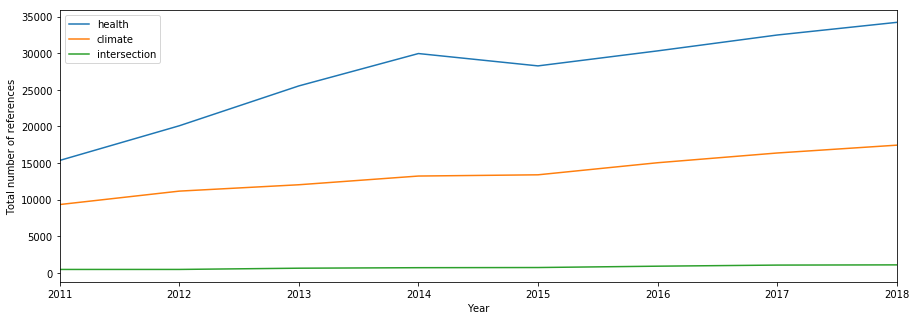

In [18]:
ax = df_per_year.filter(items=['2011','2012','2013','2014','2015','2016','2017','2018'],axis=0).plot.line(figsize=(15,5))
ax.set_xticklabels(['2011','2012','2013','2014','2015','2016','2017','2018'])
ax.set_xlabel("Year")
ax.set_ylabel("Total number of references")
ax

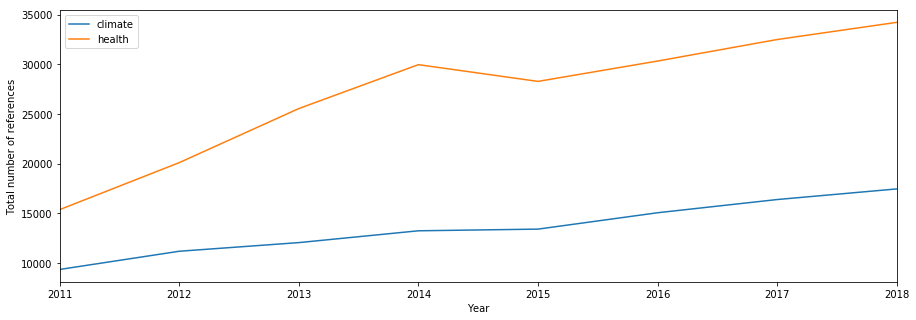

In [19]:
ax = df_per_year.filter(items=['2011','2012','2013','2014','2015','2016','2017','2018'],axis=0).filter(items=["climate","health"],axis=1).plot.line(figsize=(15,5))
ax.set_xticklabels(['2011','2012','2013','2014','2015','2016','2017','2018'])
ax.set_xlabel("Year")
ax.set_ylabel("Total number of references")
ax

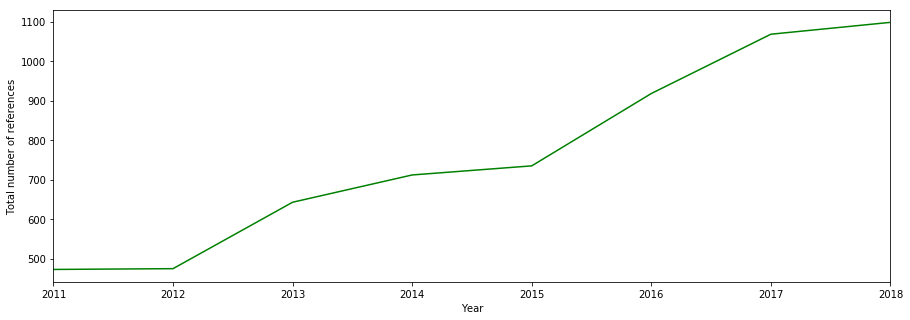

In [20]:
ax = df_per_year.filter(items=['2011','2012','2013','2014','2015','2016','2017','2018'],axis=0).filter(items=["intersection"],axis=1).plot.line(figsize=(15,5), color="green", legend=False)
ax.set_xticklabels(['2011','2012','2013','2014','2015','2016','2017','2018'])
ax.set_xlabel("Year")
ax.set_ylabel("Total number of references")
ax

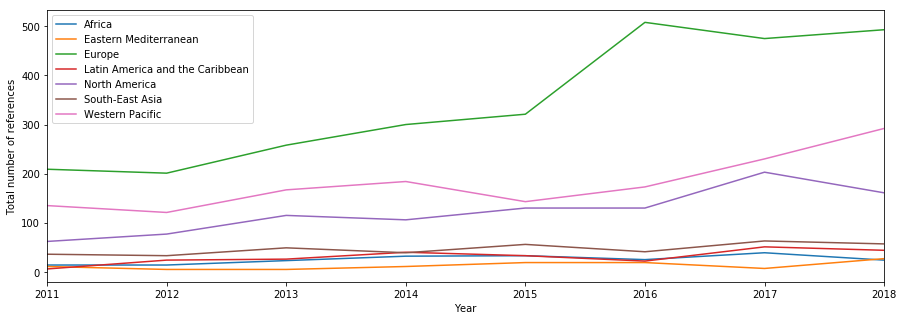

In [21]:
df_per_region_year_intersection = pd.DataFrame(data=per_region_year_intersection)
ax = df_per_region_year_intersection.filter(items=['2011','2012','2013','2014','2015','2016','2017','2018'],axis=0).plot.line(figsize=(15,5))
ax.set_xticklabels(['2011','2012','2013','2014','2015','2016','2017','2018'])
ax.set_xlabel("Year")
ax.set_ylabel("Total number of references")
ax

In [22]:
df_average_per_year = pd.DataFrame(data=average_per_year)
df_average_per_year

,health,climate,intersection
2004,54.000000,39.000000,1.000000
2005,69.000000,41.000000,2.000000
2006,95.000000,43.000000,6.000000
2007,64.000000,60.000000,1.000000
2008,94.000000,114.000000,0.000000
2009,8.000000,14.000000,0.000000
2010,0.000000,0.000000,0.000000
2011,12.039185,7.318182,0.370690
2012,11.328636,6.297069,0.267756
2013,11.929939,5.624007,0.300327


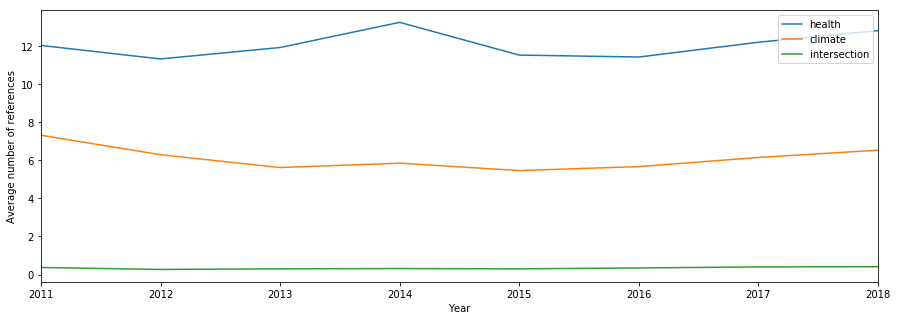

In [23]:
ax = df_average_per_year.filter(items=['2011','2012','2013','2014','2015','2016','2017','2018'],axis=0).plot.line(figsize=(15,5))
ax.set_xticklabels(['2011','2012','2013','2014','2015','2016','2017','2018'])
ax.set_xlabel("Year")
ax.set_ylabel("Average number of references")
ax

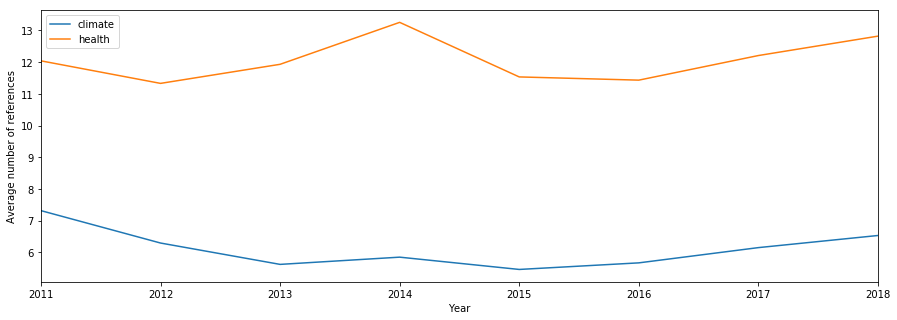

In [24]:
ax = df_average_per_year.filter(items=['2011','2012','2013','2014','2015','2016','2017','2018'],axis=0).filter(items=["climate","health"],axis=1).plot.line(figsize=(15,5))
ax.set_xticklabels(['2011','2012','2013','2014','2015','2016','2017','2018'])
ax.set_xlabel("Year")
ax.set_ylabel("Average number of references")
ax

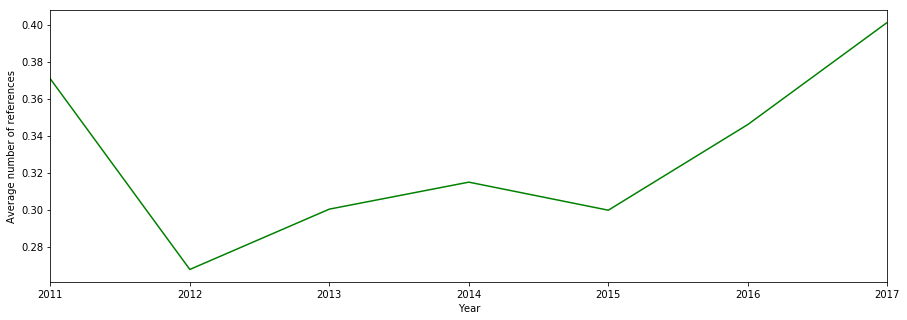

In [25]:
ax = df_average_per_year.filter(items=['2011','2012','2013','2014','2015','2016','2017'],axis=0).filter(items=["intersection"],axis=1).plot.line(figsize=(15,5), color="green", legend=False)
ax.set_xticklabels(['2011','2012','2013','2014','2015','2016','2017'])
ax.set_xlabel("Year")
ax.set_ylabel("Average number of references")
ax

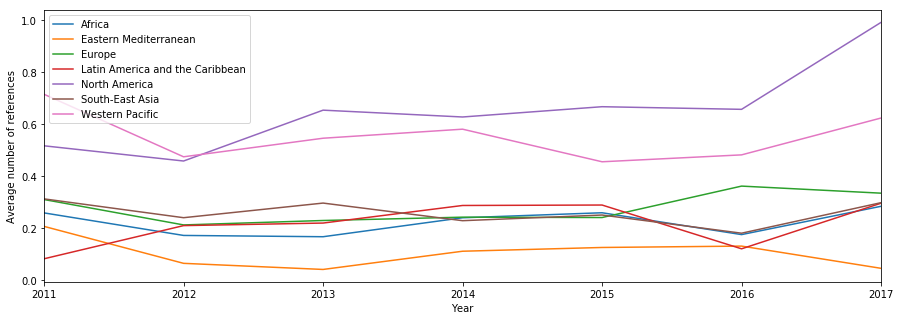

In [26]:
df_average_per_region_year_intersection = pd.DataFrame(data=average_per_region_year_intersection)
ax = df_average_per_region_year_intersection.filter(items=['2011','2012','2013','2014','2015','2016','2017'],axis=0).plot.line(figsize=(15,5))
ax.set_xticklabels(['2011','2012','2013','2014','2015','2016','2017'])
ax.set_xlabel("Year")
ax.set_ylabel("Average number of references")
ax

In [27]:
df_proportion_per_year = pd.DataFrame(data=proportion_per_year)
df_proportion_per_year

,health,climate,intersection
2004,100.000000,100.000000,100.000000
2005,100.000000,100.000000,100.000000
2006,100.000000,100.000000,100.000000
2007,100.000000,100.000000,100.000000
2008,100.000000,100.000000,0.000000
2009,100.000000,100.000000,0.000000
2010,0.000000,0.000000,0.000000
2011,53.213166,42.946708,12.225705
2012,55.636979,44.024803,12.119504
2013,56.095283,42.223260,11.536665


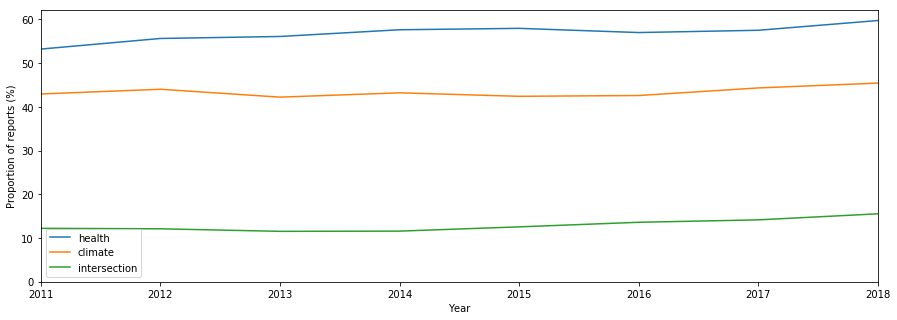

In [28]:
ax = df_proportion_per_year.filter(items=['2011','2012','2013','2014','2015','2016','2017','2018'],axis=0).plot.line(figsize=(15,5))
ax.set_xticklabels(['2011','2012','2013','2014','2015','2016','2017','2018'])
ax.set_xlabel("Year")
ax.set_ylabel("Proportion of reports (%)")
ax.set_ylim(ymin=0)
ax

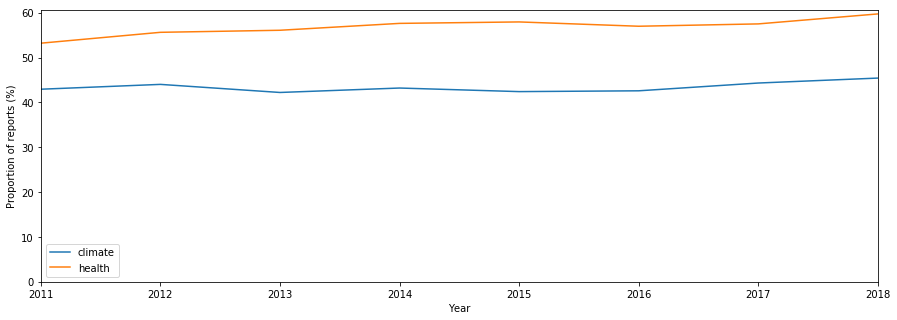

In [29]:
ax = df_proportion_per_year.filter(items=['2011','2012','2013','2014','2015','2016','2017','2018'],axis=0).filter(items=["climate","health"],axis=1).plot.line(figsize=(15,5))
ax.set_xticklabels(['2011','2012','2013','2014','2015','2016','2017','2018'])
ax.set_xlabel("Year")
ax.set_ylabel("Proportion of reports (%)")
ax.set_ylim(ymin=0)
ax

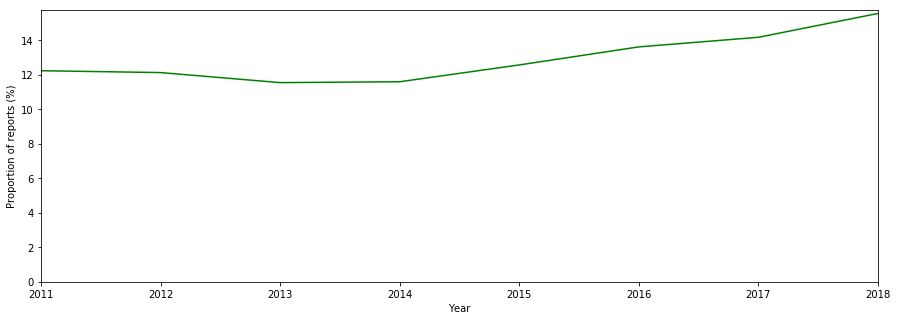

In [30]:
ax = df_proportion_per_year.filter(items=['2011','2012','2013','2014','2015','2016','2017','2018'],axis=0).filter(items=["intersection"],axis=1).plot.line(figsize=(15,5), color="green", legend=False)
ax.set_xticklabels(['2011','2012','2013','2014','2015','2016','2017','2018'])
ax.set_xlabel("Year")
ax.set_ylabel("Proportion of reports (%)")
ax.set_ylim(ymin=0)
ax

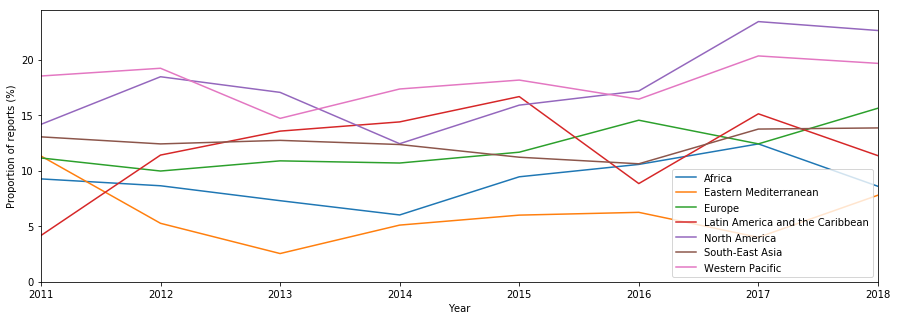

In [31]:
df_proportion_per_region_year_intersection = pd.DataFrame(data=proportion_per_region_year_intersection)
ax = df_proportion_per_region_year_intersection.filter(items=['2011','2012','2013','2014','2015','2016','2017','2018'],axis=0).plot.line(figsize=(15,5))
ax.set_xticklabels(['2011','2012','2013','2014','2015','2016','2017','2018'])
ax.set_xlabel("Year")
ax.set_ylabel("Proportion of reports (%)")
ax.set_ylim(ymin=0)
ax

### References per sector: total, average, proportion

In [32]:
df_per_sector = pd.DataFrame(data=per_sector)
df_per_sector

,health,climate,intersection
Aerospace & Defense,2127,1014,63
Alternative Energy,1260,1607,89
Automobiles & Parts,6223,2970,209
Banks,3683,2869,72
Beverages,5210,2671,199
Chemicals,14438,5967,619
Construction & Materials,12564,6398,364
Diversified,1648,751,33
Electricity,4095,4393,179
Electronic & Electrical Equ...,4923,2452,98


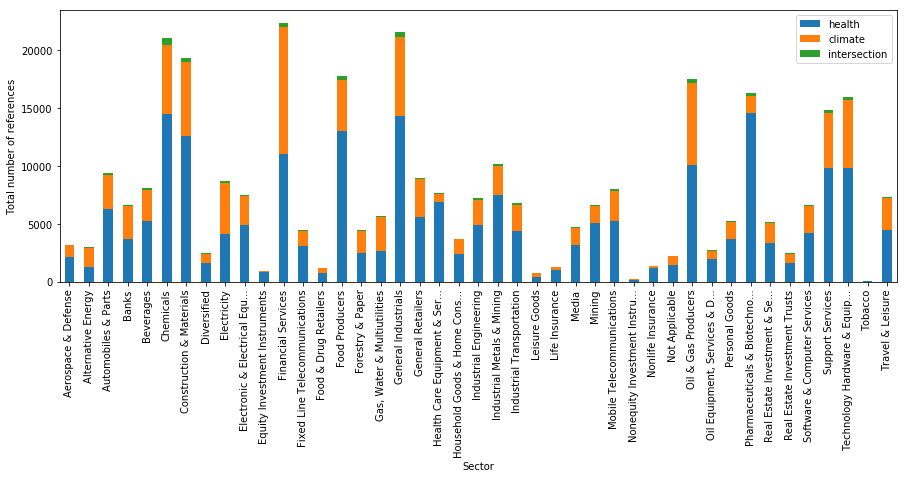

In [33]:
ax = df_per_sector.loc[(df_per_sector['climate'] > 0) | (df_per_sector['health'] > 0)].plot.bar(stacked=True,figsize=(15,5))
ax.set_xlabel("Sector")
ax.set_ylabel("Total number of references")
ax

In [34]:
df_average_per_sector = pd.DataFrame(data=average_per_sector)
df_average_per_sector

,health,climate,intersection
Aerospace & Defense,11.751381,5.602210,0.348066
Alternative Energy,10.677966,13.618644,0.754237
Automobiles & Parts,14.015766,6.689189,0.470721
Banks,9.467866,7.375321,0.185090
Beverages,14.043127,7.199461,0.536388
Chemicals,25.329825,10.468421,1.085965
Construction & Materials,11.875236,6.047259,0.344045
Diversified,21.973333,10.013333,0.440000
Electricity,14.890909,15.974545,0.650909
Electronic & Electrical Equ...,7.261062,3.616519,0.144543


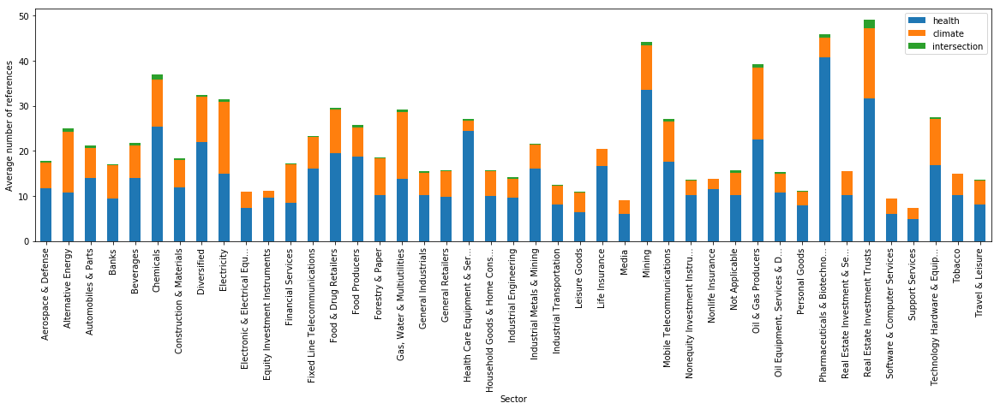

In [35]:
ax = df_average_per_sector.loc[(df_average_per_sector['climate'] > 0) | (df_average_per_sector['health'] > 0)].plot.bar(stacked=True,figsize=(20,5))
ax.set_xlabel("Sector")
ax.set_ylabel("Average number of references")
ax

In [36]:
df_proportion_per_sector = pd.DataFrame(data=proportion_per_sector)
df_proportion_per_sector

,health,climate,intersection
Aerospace & Defense,60.773481,45.856354,9.392265
Alternative Energy,62.711864,61.864407,26.271186
Automobiles & Parts,60.135135,36.261261,15.090090
Banks,60.154242,52.185090,10.282776
Beverages,61.994609,52.021563,17.250674
Chemicals,66.140351,55.964912,29.473684
Construction & Materials,55.576560,44.801512,14.933837
Diversified,62.666667,52.000000,18.666667
Electricity,68.000000,64.727273,25.818182
Electronic & Electrical Equ...,44.395280,29.793510,7.079646


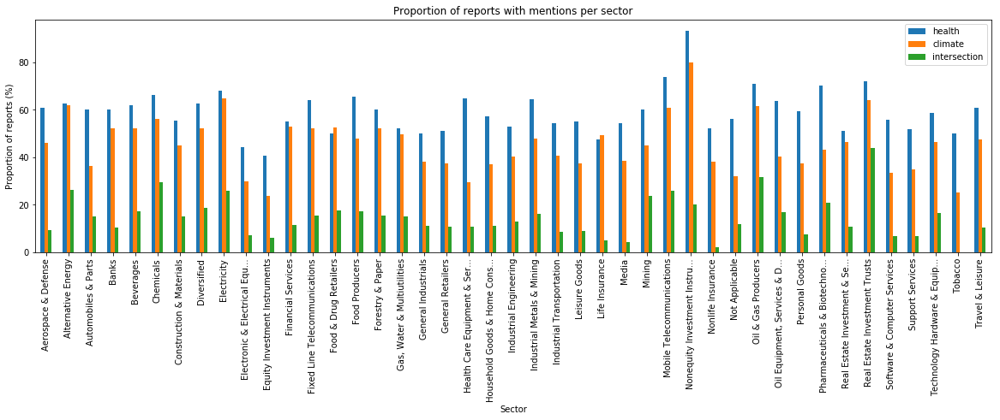

In [37]:
ax = df_proportion_per_sector.loc[(df_proportion_per_sector['climate'] > 0) | (df_proportion_per_sector['health'] > 0)].plot.bar(stacked=False,figsize=(20,5), title="Proportion of reports with mentions per sector")
ax.set_xlabel("Sector")
ax.set_ylabel("Proportion of reports (%)")
ax

### References per country: total

In [38]:
df_per_country = pd.DataFrame(data=per_country)
df_per_country.loc[(df_per_country['climate'] > 0) | (df_per_country['health'] > 0)]

,health,climate,intersection
Andorra,84,17,2
Angola,166,13,1
Argentina,531,247,13
Armenia,6,18,0
Australia,4639,3461,178
Austria,1786,1054,27
Azerbaijan,18,4,0
Bahrain,362,62,3
Bangladesh,856,201,17
Belarus,876,75,1


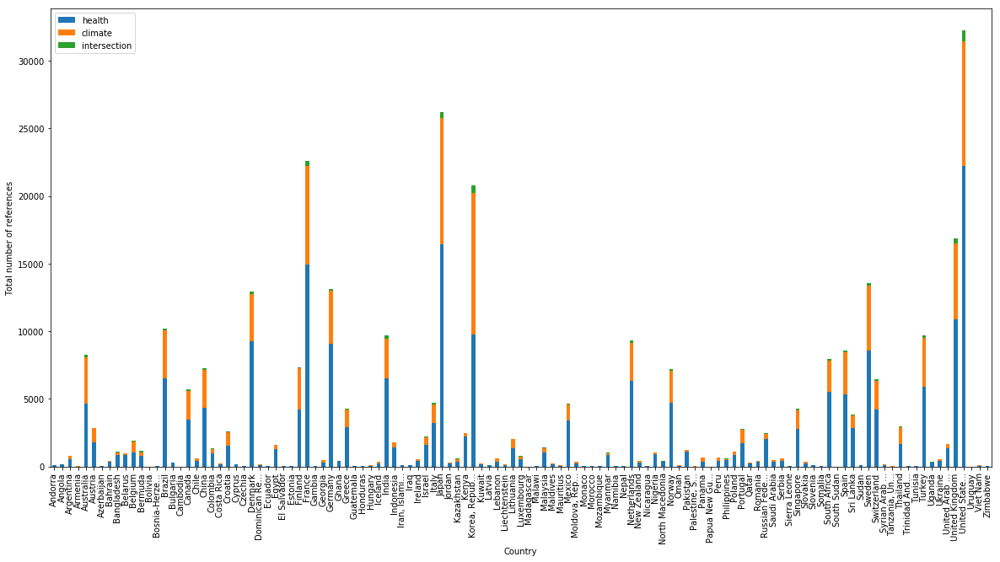

In [39]:
ax = df_per_country.loc[(df_per_country['climate'] > 0) | (df_per_country['health'] > 0)].plot.bar(stacked=True,figsize=(20,10))
ax.set_xlabel("Country")
ax.set_ylabel("Total number of references")
ax

### References per WHO region: total

In [40]:
df_per_region = pd.DataFrame(data=per_region)
df_per_region

,health,climate,intersection
Africa,9730,2812,204
Eastern Mediterranean,5936,1466,104
Europe,107211,52261,2765
Latin America and the Caribbean,13093,6340,246
North America,26459,11650,994
South-East Asia,14459,5802,374
Western Pacific,39779,28033,1445


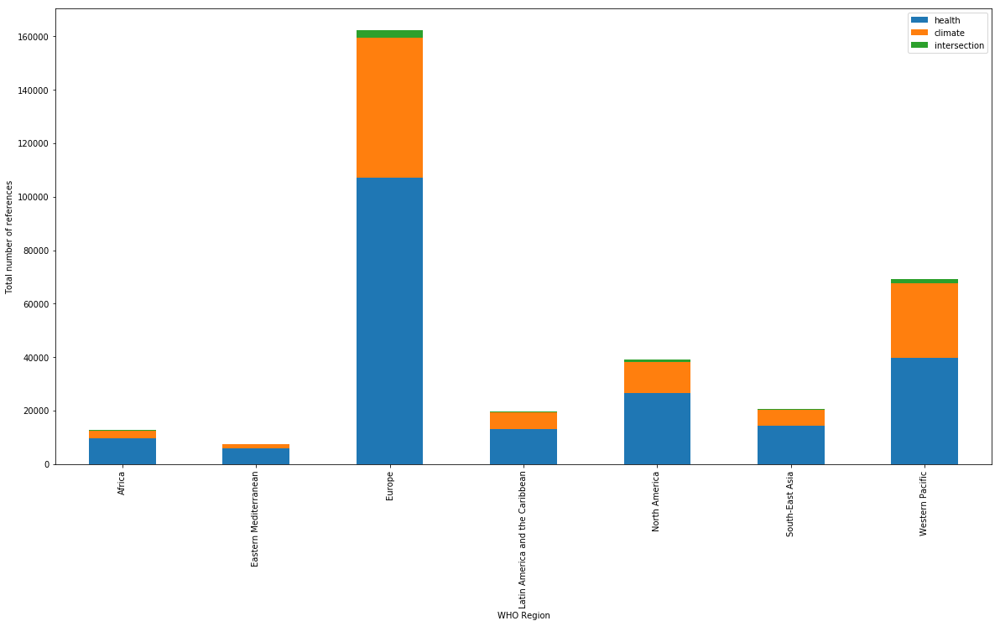

In [41]:
ax = df_per_region.plot.bar(stacked=True,figsize=(20,10))
ax.set_xlabel("WHO Region")
ax.set_ylabel("Total number of references")
ax

### References per country in 2017: total, average, proportion

Download shapefiles ne_110m_admin_0_countries.* from [here](https://github.com/nvkelso/natural-earth-vector/tree/master/110m_cultural)

In [43]:
import matplotlib.pyplot as plt
import matplotlib.cm
import numpy as np

from mpl_toolkits.basemap import Basemap
from matplotlib.patches import Polygon
from matplotlib.collections import PatchCollection
from matplotlib.colors import Normalize

def create_map(per_country_counts, title, resolution='c'):

    mapped_country_names = {'Bosnia-Herze...' : 'Bosnia and Herz.', "Cote d'Ivoire" : "Côte d'Ivoire", 
                            'Congo, Democ...' : 'Dem. Rep. Congo', 'Dominican Re...' : 'Dominican Rep.', 
                            'Iran, Islami...' : 'Iran', 'Macedonia, T...' : 'Macedonia', 
                            'Moldova, Rep...' : 'Moldova', 'Palestine, S...' : 'Palestine', 
                            'Russian Fede...' : 'Russia', 'South Sudan' : 'S. Sudan', 
                            'Korea, Repub...' : 'South Korea' , 'Syrian Arab ...' : 'Syria', 
                            'Tanzania, Un...' : 'Tanzania', 'Trinidad And...' : 'Trinidad and Tobago', 
                            'United Arab ...' : 'United Arab Emirates', 'United State...' : 'United States of America',
                            'Viet Nam' : 'Vietnam'}

    per_normalised_country_counts = []
    for country, count in per_country_counts.items():
        if country in mapped_country_names:
            per_normalised_country_counts.append((mapped_country_names[country], count))
        else:
            per_normalised_country_counts.append((country, count))
    df_per_normalised_country_counts = pd.DataFrame(per_normalised_country_counts, columns=["country", "count"])

    fig, ax = plt.subplots(figsize=(30,20))
    plt.title(title)

    m = Basemap(resolution=resolution, # c, l, i, h, f or None
                projection='cyl',
                lat_0=0, lon_0=0,
                llcrnrlon=-170, llcrnrlat=-60, urcrnrlon=190, urcrnrlat=84)

    m.drawmapboundary(fill_color='#aaccec')
    m.fillcontinents(color='#f2f2f2',lake_color='#aaccec')
    m.drawcoastlines()
    m.readshapefile("ne_110m_admin_0_countries", "countries")
    shapename_regex = re.compile(r'(?<=^)[\w \.\']+')

    df_poly = pd.DataFrame({
        'shapes': [Polygon(np.array(shape), True) for shape in m.countries],
        'country': [shapename_regex.search(area['NAME'])[0] for area in m.countries_info]
    })
    df_poly = df_poly.merge(df_per_normalised_country_counts, on='country', how='left', validate="many_to_one")

    cmap = plt.get_cmap('YlOrRd')   
    pc = PatchCollection(df_poly.shapes, zorder=2)
    norm = Normalize()
 
    pc.set_facecolor(cmap(norm(df_poly['count'].fillna(0).values)))
    ax.add_collection(pc)

    mapper = matplotlib.cm.ScalarMappable(norm=norm, cmap=cmap)
    mapper.set_array(df_poly['count'])

    plt.colorbar(mapper, shrink=0.5)


create_map(per_country_focusyear["health"], "2017 - Global Compact reports - Health - Total number of references")

KeyError: 'PROJ_LIB'

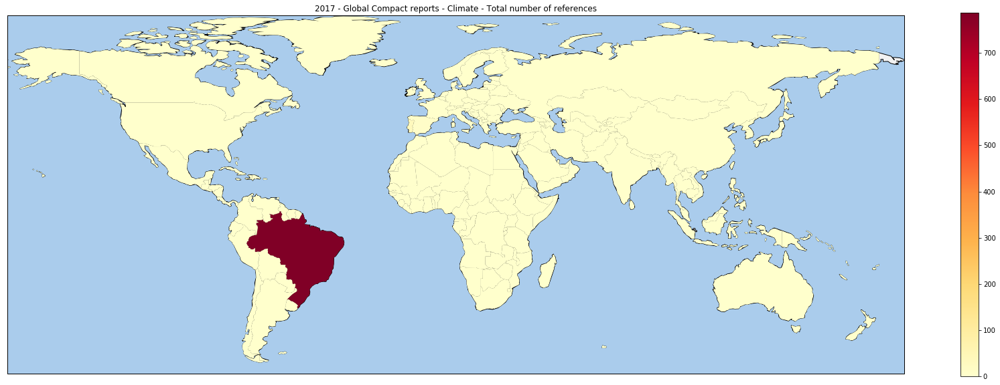

In [299]:
create_map(per_country_focusyear["climate"], "2017 - Global Compact reports - Climate - Total number of references")

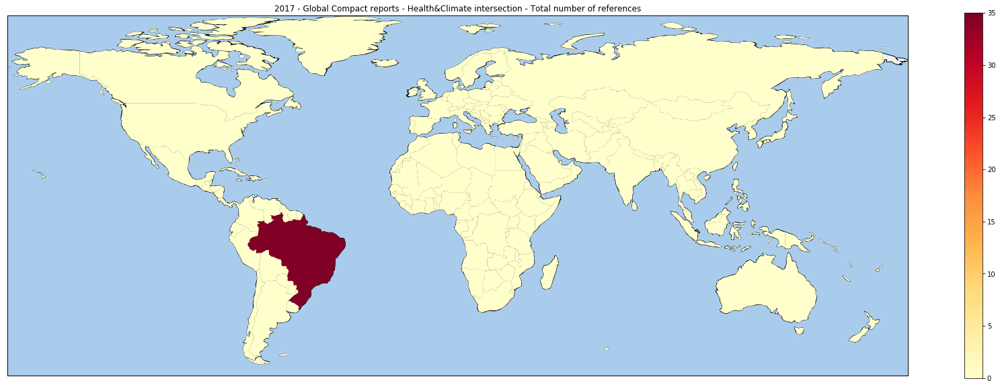

In [300]:
create_map(per_country_focusyear["intersection"], "2017 - Global Compact reports - Health&Climate intersection - Total number of references")


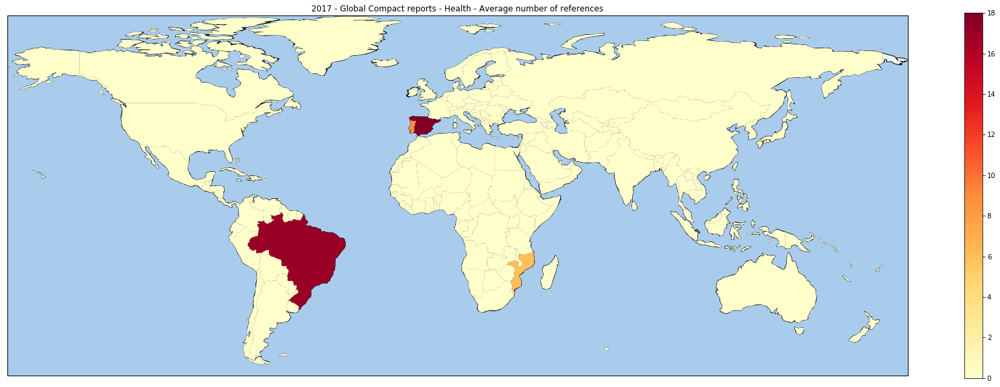

In [301]:
create_map(average_per_country_focusyear["health"], "2017 - Global Compact reports - Health - Average number of references")

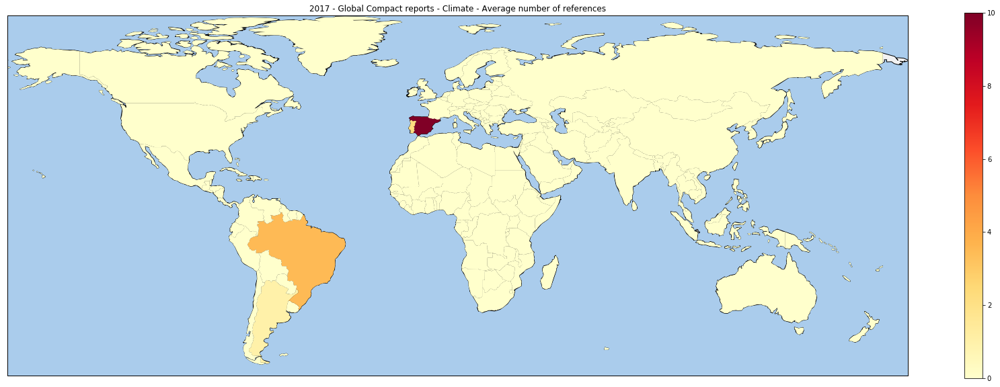

In [302]:
create_map(average_per_country_focusyear["climate"], "2017 - Global Compact reports - Climate - Average number of references")

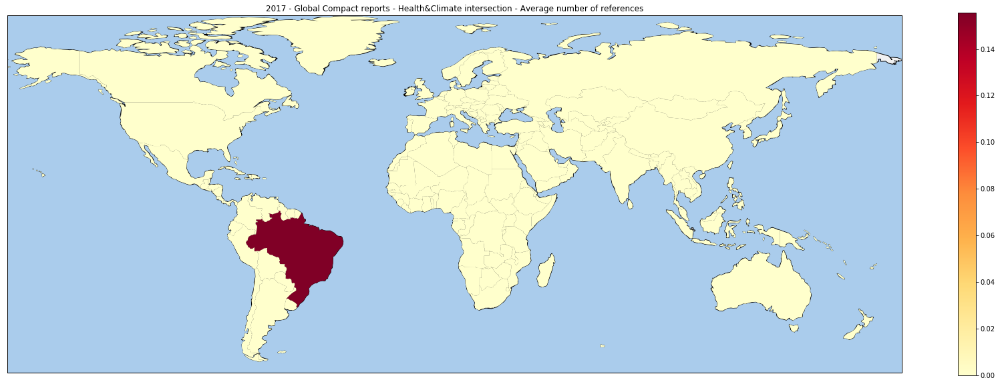

In [303]:
create_map(average_per_country_focusyear["intersection"], "2017 - Global Compact reports - Health&Climate intersection - Average number of references")

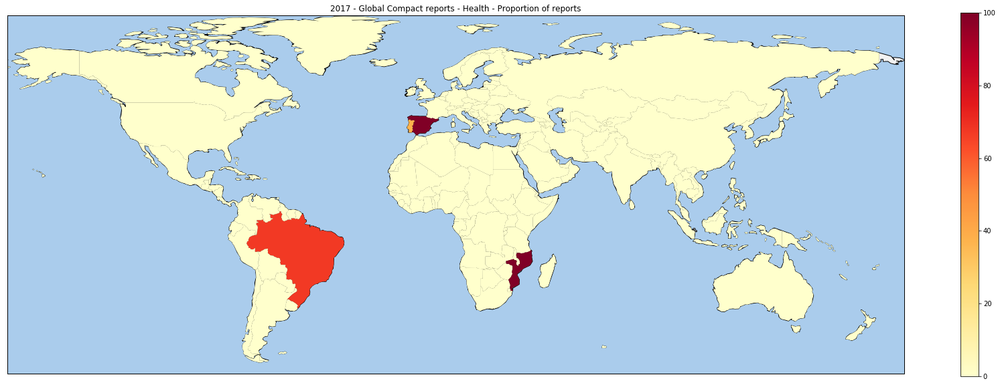

In [304]:
create_map(proportion_per_country_focusyear["health"], "2017 - Global Compact reports - Health - Proportion of reports")

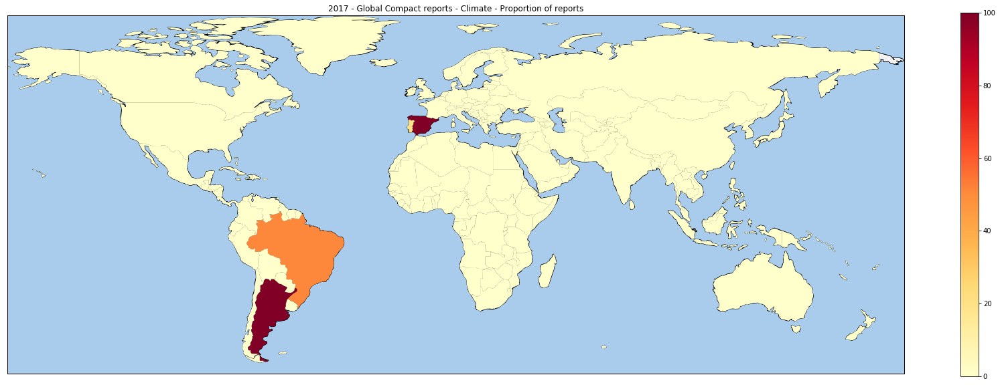

In [305]:
create_map(proportion_per_country_focusyear["climate"], "2017 - Global Compact reports - Climate - Proportion of reports")

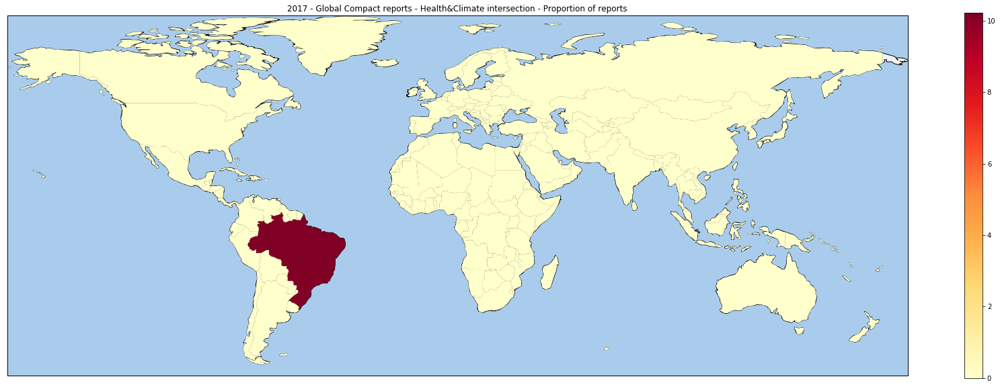

In [306]:
create_map(proportion_per_country_focusyear["intersection"], "2017 - Global Compact reports - Health&Climate intersection - Proportion of reports")

### Frenquency of keywords: health and climate

In [63]:
df_health_keywords = pd.DataFrame(sorted(global_count_health_keywords.items(), key=lambda k: k[1], reverse=True), columns=["Keyword", "Number of mentions"])
df_health_keywords

,Keyword,Number of mentions
0,health,165720
1,healthcare,15206
2,nutrition,7570
3,disease,6316
4,health_care,5775
5,illness,4937
6,mortality,2446
7,air_pollution,2001
8,public_health,1899
9,malaria,1292


In [64]:
df_climate_keywords = pd.DataFrame(sorted(global_count_climate_keywords.items(), key=lambda k: k[1], reverse=True), columns=["Keyword", "Number of mentions"])
df_climate_keywords

,Keyword,Number of mentions
0,greenhouse,35754
1,climate_change,33680
2,renewable_energy,19156
3,low_carbon,6460
4,temperature,5390
5,global_warming,4626
6,green_house,1201
7,carbon_emission,1048
8,extreme_weather,918
9,ghge,107


### Word clouds: health, climate, intersection

Up to 200 most frequent words that appear in the context of our health or climate keywords or both

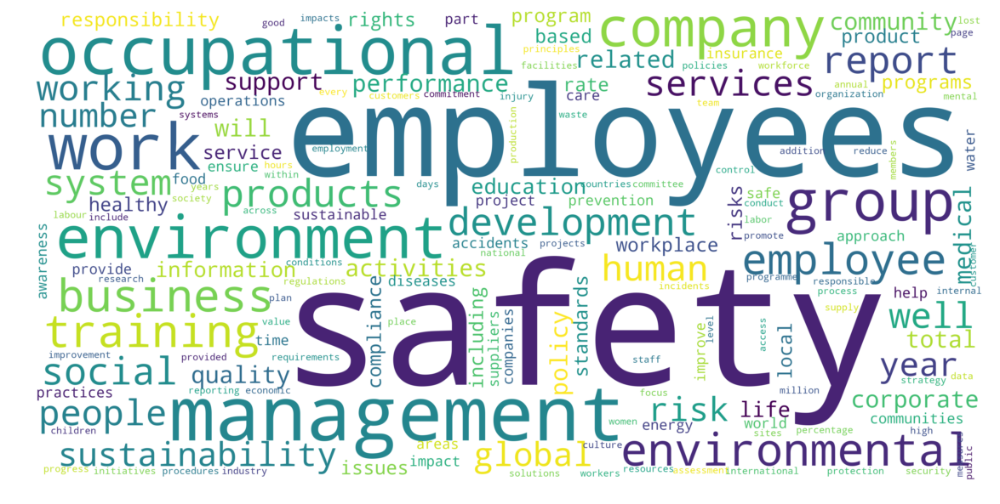

In [65]:
import collections
from wordcloud import WordCloud, STOPWORDS
from stop_words import get_stop_words
import matplotlib.pyplot as plt

threshold = 200

language_specific_stopwords = get_stop_words(focus_language)

def create_wordcloud(contexts, stopwords=[]):
    most_frequent_words = {}
    stopwords.extend(STOPWORDS)
    stopwords.extend(language_specific_stopwords)

    context_unigrams = collections.Counter(contexts)
    for word, freq in sorted(context_unigrams.items(), key=lambda k: k[1], reverse=True)[0:threshold]:
        if word not in stopwords:
            most_frequent_words[word] = freq

    wordcloud = WordCloud(background_color="white", scale=10).generate_from_frequencies(most_frequent_words)

    fig = plt.figure(1, figsize=(20, 12))
    plt.axis('off')
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.show()
    

create_wordcloud(global_health_contexts, health_dict)

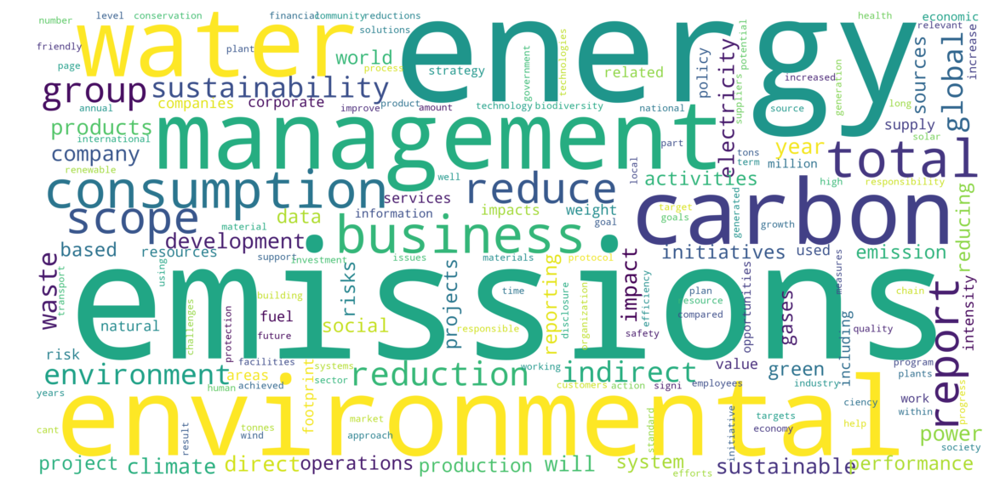

In [66]:
create_wordcloud(global_climate_contexts, climate_dict)

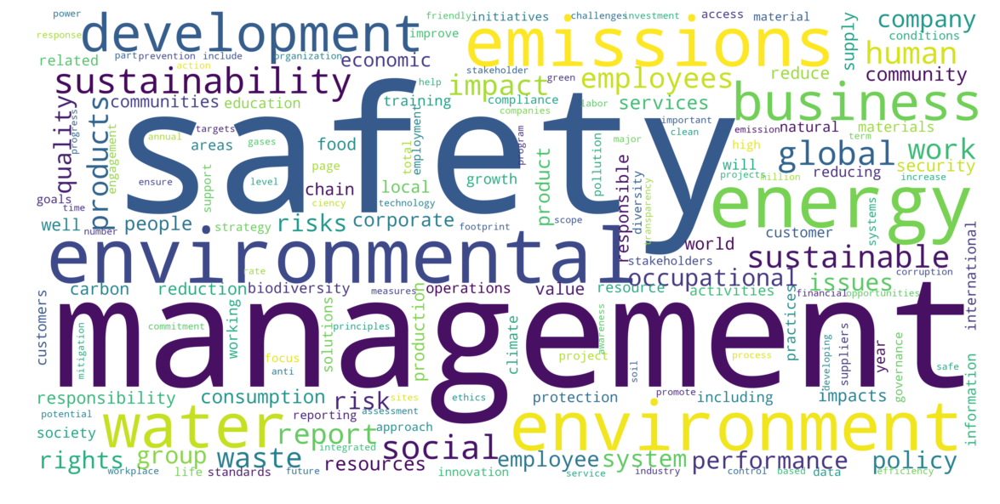

In [67]:
create_wordcloud(global_intersection_contexts, climate_dict + health_dict)

### Network graphs: intersection
Blue nodes are health keywords and green nodes are climate keywords. The closer the nodes are to each other, the more often the words co-occur. The graph only shows links between words that co-occurred 10 or more times in the whole corpus.

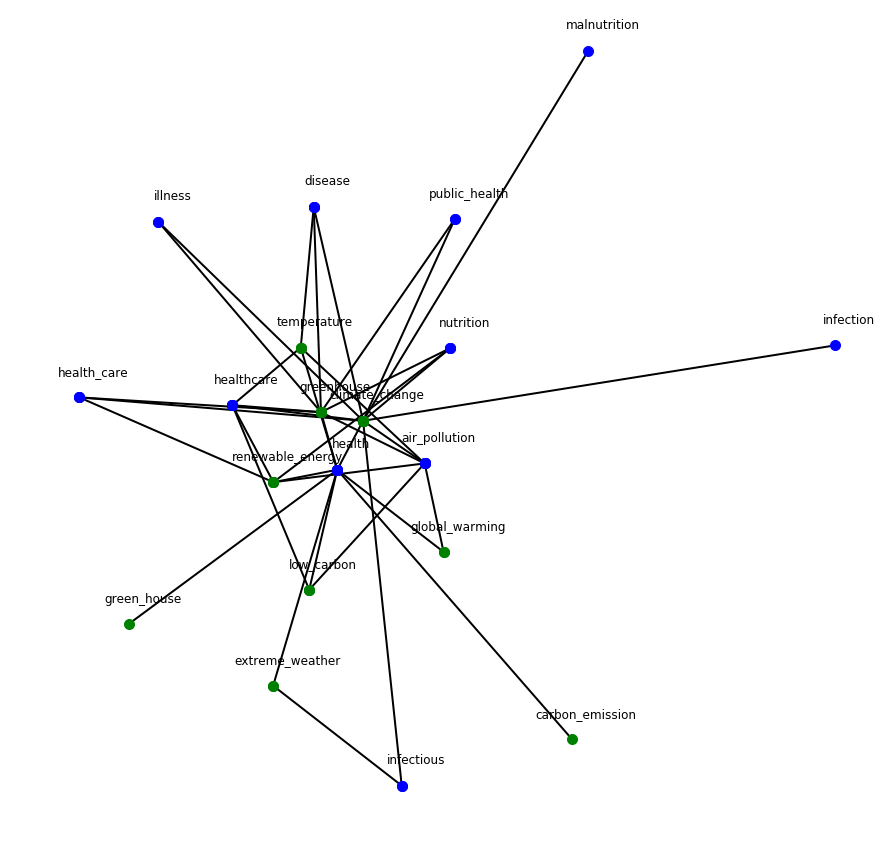

In [108]:
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np


G = nx.Graph()

health_nodes = []
climate_nodes = []

for word1 in cooccurrence_matrix.keys():
    for word2 in cooccurrence_matrix[word1].keys():
        if cooccurrence_matrix[word1][word2] >= language_ref[focus_language]['min_coocurrence']:
            G.add_edge(word1, word2, weight=cooccurrence_matrix[word1][word2])
            health_nodes.append(word1)
            climate_nodes.append(word2)

plt.figure(figsize=(15,15))

pos = nx.spring_layout(G)

pos_attrs = {}
for node, coords in pos.items():
    pos_attrs[node] = (coords[0] + 0.03, coords[1] + 0.05)
    
nx.draw_networkx_nodes(G, pos, nodelist=health_nodes, node_size=100, node_color='b')
nx.draw_networkx_nodes(G, pos, nodelist=climate_nodes, node_size=100, node_color='g')
nx.draw_networkx_edges(G, pos, edgelist=G.edges(data=True), width=2)
nx.draw_networkx_labels(G, pos_attrs, font_size=12, font_family='sans-serif')
#edge_labels = nx.get_edge_attributes(G,'weight')
#nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels, font_size=10, font_family='sans-serif')

plt.axis('off')
plt.show()